In [1]:
import numpy as np
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.pyplot as plt
import scipy as sc

In [2]:
import matplotlib.animation as animation

In [ ]:
mpl.use("pgf")
#plt.rcParams['text.latex.unicode'] = True
plt.rcParams.update({
    "pgf.texsystem":   "pdflatex", # or any other engine you want to use
    "text.usetex":     True,       # use TeX for all texts
    "font.family":     "serif",
    "font.serif":      [],         # empty entries should cause the usage of the document fonts
    "font.sans-serif": [],
    "font.monospace":  [],
    "font.size":       10,         # control font sizes of different elements
    "axes.labelsize":  10,
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "pgf.preamble": [              # specify additional preamble calls for LaTeX's run
        r"\usepackage[T1]{fontenc}",
        r"\usepackage{siunitx}",
        r"\usepackage[utf8]{inputenc}",
        r"\DeclareUnicodeCharacter{2212}{-}",
    ],
})

In [3]:
from tqdm.notebook import tqdm

In [4]:
from ipywidgets import interact, interactive, fixed, interact_manual

In [5]:
from matplotlib.collections import LineCollection

In [6]:
from sympy import symbols, Symbol, expand, collect,sqrt,factor,fraction, diff, elliptic_e, elliptic_k, \
simplify,Poly,lambdify,series, cancel, Matrix
from sympy.parsing.mathematica import parse_mathematica as prsmat
x = symbols('x')

In [7]:
np.seterr('ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [8]:
### parse field expression ###
P,P1,P2,P3,P4 = symbols('P P1 P2 P3 P4')
Z,Z1,Z2,Z3,Z4 = symbols('Z Z1 Z2 Z3 Z4')
H1_wol_str = '(P2 Z1-P1 Z2)/(P1^2+Z1^2)^(3/2)'
H1_wol = prsmat(H1_wol_str)
H1_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], H1_wol)
H2_wol_str = '-(Z1/(P Sqrt[P1^2+Z1^2]))'
H2_wol = prsmat(H2_wol_str)
H2_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], H2_wol)


laplH1_wol_str='(1/(P (P1^2+Z1^2)^(9/2)))(-P1^6 Z3+P1^2 Z1 (3 P P2 (5 P2^2-13 Z2^2)+Z1^2 (-3 P2^2+2 P P4+3 Z2^2)-Z1^3 Z3+2 P Z1 (-P3 Z2+P2 Z3))+P1^4 (Z1 (-3 P2^2+P P4+3 Z2^2)-2 Z1^2 Z3+2 P (2 P3 Z2+3 P2 Z3))+P Z1^3 (-3 P2^3+Z1 (P4 Z1-6 P3 Z2)+P2 (15 Z2^2-4 Z1 Z3))+P1^5 (P3 Z1+3 P2 Z2-P Z4)+P1 Z1^2 (P3 Z1^3+3 P Z2 (13 P2^2-5 Z2^2)+10 P Z1 (-P2 P3+Z2 Z3)-Z1^2 (3 P2 Z2+P Z4))+P1^3 (2 P3 Z1^3+P (-10 P2 P3 Z1-15 P2^2 Z2+3 Z2^3+10 Z1 Z2 Z3-2 Z1^2 Z4)))'
laplH1_wol = prsmat(laplH1_wol_str)
laplH1_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], laplH1_wol)
laplH2_wol_str='(1/(P^3 (P1^2+Z1^2)^(7/2)))(-P1^6 Z1+P P2 Z1^3 (P P2+Z1^2)+P P1^5 Z2+P^2 P1^3 (P3 Z1+3 P2 Z2)+P P1 Z1^2 (P P3 Z1-(5 P P2+Z1^2) Z2)-P1^4 (P P2 Z1+2 Z1^3+P^2 Z3)-P1^2 Z1 (Z1^4+P^2 (3 P2^2-4 Z2^2)+P^2 Z1 Z3))'
laplH2_wol = prsmat(laplH2_wol_str)
laplH2_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], laplH2_wol)

In [9]:
def get_ext_array(arr, tp='z'):
    n_arr = len(arr)-1
    ext_arr = np.zeros(2*n_arr)
    ext_arr[0:n_arr+1]=arr
    if tp=='p':
        ext_arr[n_arr+1:]=-arr[::-1][1:-1:]
    else:
        ext_arr[n_arr+1:]=arr[::-1][1:-1:]
    return ext_arr

In [10]:
#%run G_define.ipynb

In [11]:
### on the axis ###
def D_z_axis_part(z_,rho1_):
    return -2*np.pi*rho1_*z_*(rho1_**2-2*z_**2)/(rho1_**2+z_**2)**(5/2)
def D_rho_axis_part(z_,rho1_):
    return 2*np.pi*rho1_**2*(rho1_**2-2*z_**2)/(rho1_**2+z_**2)**(5/2)

In [12]:
import numdifftools as nd 

In [13]:
import matplotlib.colors as colors

## setting

In [14]:
N=150
j_N = np.arange(N+1)
tau_N = j_N/N

In [15]:
N_int = 1000
Tau_int = np.arange(N_int+1)/(N_int)

In [16]:
def get_int_field(field_rfft):
    """
    Returns N_int points of field by furier transphorm from `field_fur`
    """
    field_int = np.fft.irfft(field_rfft, norm='forward', n=2*N_int)
    return field_int[0:N_int+1]

def get_rfft_N_field(field):
    """
    Returns rfft of filed
    up to N harmonics
    """
    field_rfft=np.fft.rfft(field, norm='forward')
    return field_rfft[0:N]

def get_int_fields(field_rfft):
    """
    Returns N_int points of field and 4 derivatives by furier transphorm from `field_fur`
    """

    field_int = np.fft.irfft(field_rfft, norm='forward', n=2*N_int)
    der_oper = 1j*np.pi*np.arange(field_rfft.shape[0])
    field_1_int = np.fft.irfft(field_rfft*der_oper, norm='forward', n=2*N_int)
    field_2_int = np.fft.irfft(field_rfft*der_oper**2, norm='forward', n=2*N_int)
    field_3_int = np.fft.irfft(field_rfft*der_oper**3, norm='forward', n=2*N_int)
    field_4_int = np.fft.irfft(field_rfft*der_oper**4, norm='forward', n=2*N_int)
    return field_int[0:N_int+1], field_1_int[0:N_int+1], \
           field_2_int[0:N_int+1], field_3_int[0:N_int+1],field_4_int[0:N_int+1]

In [17]:
def make_F_v_repar(P_fur, Z_fur, F,N_proj=30):
    """
    Find reparametrization with constan V
    """
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    
    Der_goal_fft = np.fft.rfft(get_ext_array(V/F), norm='forward')
    Der_goal_fft /= Der_goal_fft[0]
    
    der_oper = 1j*np.pi*np.arange(Der_goal_fft.shape[0])
    Tau_s_goal_fur = Der_goal_fft.real/der_oper
    Tau_s_goal_fur[0]=0.
    
    Tau_s_goal_norm = np.fft.irfft(Tau_s_goal_fur, norm='forward', n=2*N_int)[:N_int+1]

    Tau_s_goal = Tau_int+Tau_s_goal_norm

    P_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,P,k=7,bc_type=(
        [(2, 0.0),(4, 0.0),(6, 0.0)], 
        [(2, 0.0),(4, 0.0),(6, 0.0)]))
    P_s = P_s_spline(Tau_int)

    Z_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,Z,k=7,bc_type=(
        [(1, 0.0),(3, 0.0),(5, 0.0)], 
        [(1, 0.0),(3, 0.0),(5, 0.0)]))
    Z_s = Z_s_spline(Tau_int)

    P_s_fft = np.fft.rfft(get_ext_array(P_s,'p'),norm='forward')
    Z_s_fft = np.fft.rfft(get_ext_array(Z_s,'z'),norm='forward')

    P_fur0_s = np.zeros(N_proj)
    Z_fur0_s = np.zeros(N_proj)

    P_fur0_s[:N_proj] = -P_s_fft.imag[:N_proj]
    Z_fur0_s[:N_proj] =  Z_s_fft.real[:N_proj]    
    return P_fur0_s,Z_fur0_s

### Testing field

In [31]:
P_fur = np.zeros(N);
P_fur[1]=2./2

Z_fur = np.zeros(N);
Z_fur[1]=1./2

In [32]:
P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)

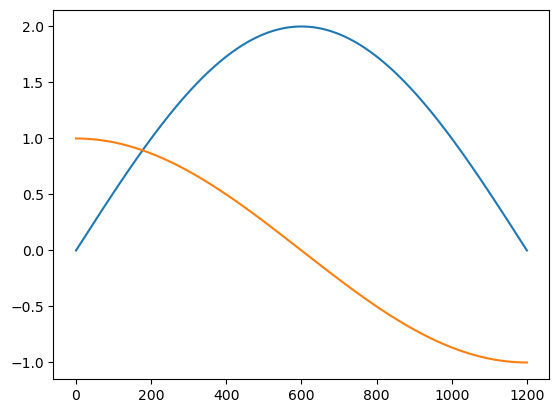

In [33]:
plt.figure()
plt.plot(P)
plt.plot(Z)

Text(0.5, 1.0, 'Input form \n $V=16.76, S=34.69$, $\\mathcal{V}=$$0.87$')

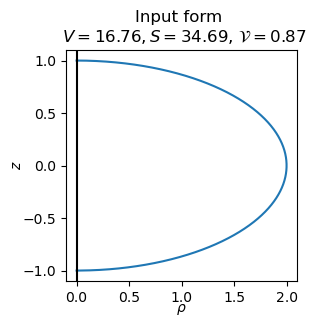

In [34]:
# %matplotlib notebook

Vol0,Sqr0,V_cal0 = get_VolSqr(P_fur, Z_fur)


plt.figure(figsize=(3,3))
plt.plot(P, Z,lw=1.5, ms=8, color = 'C0')
plt.axis('scaled')

plt.axvline(0, color='k')
plt.xlabel(r'$\rho$', labelpad=-2)
plt.ylabel(r'$z$', labelpad=-1)
plt.title(fr'Input form '+'\n'+fr' $V={Vol0:.2f}, S={Sqr0:.2f}$, '+r'$\mathcal{V}=$'+fr'${V_cal0:.2f}$')

In [53]:
H,force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 


### H&force function

In [18]:
def get_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    H1 = H1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2 = H2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2[0] = H1[0];H2[-1] = H1[-1]
    
    
    K = H1*H2
    H = H1+H2
    
    laplH1 = laplH1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH1[0] = 2*(-P1[0]**2*Z4[0]+4*P1[0]*P3[0]*Z2[0]+3*Z2[0]**3)/np.abs(P1[0])**5/P1[0]
    laplH1[-1] = 2*(-P1[-1]**2*Z4[-1]+4*P1[-1]*P3[-1]*Z2[-1]+3*Z2[-1]**3)/np.abs(P1[-1])**5/P1[-1]
    
    laplH2 = laplH2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH2[0]=laplH1[0]/3
    laplH2[-1]=laplH1[-1]/3
    
    laplH = laplH1+laplH2
    
    force =  H**3/2 - 2*H*K + laplH
    return force

def get_force_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    return get_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)

In [19]:
def get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    
    force = -(Z1*(2*P1**2 + Z1**2))/(2.*P**3*V**3) + ((2*P1**2 - Z1**2)*(-(P2*Z1) + P1*Z2))/(2.*P**2*V**5) + (3*P2**2*Z1**3 + 2*P1*Z1**2*(2*P3*Z1 - 9*P2*Z2) + 4*P1**3*(P3*Z1 + 3*P2*Z2) - 4*P1**4*Z3 + P1**2*Z1*(-12*P2**2 + 15*Z2**2 - 4*Z1*Z3))/(2.*P*V**7) + (2*P1**4*(P4*Z1 + 4*P3*Z2 + 6*P2*Z3) + Z1**3*(-5*P2**3 + 2*Z1*(P4*Z1 - 6*P3*Z2) + P2*(30*Z2**2 - 8*Z1*Z3)) + P1**2*Z1*(30*P2**3 + 4*Z1*(P4*Z1 - P3*Z2) + P2*(-75*Z2**2 + 4*Z1*Z3)) - 2*P1**5*Z4 + P1**3*(-20*P2*P3*Z1 - 30*P2**2*Z2 + 5*Z2**3 + 20*Z1*Z2*Z3 - 4*Z1**2*Z4) + P1*Z1**2*(-20*P2*P3*Z1 + 75*P2**2*Z2 - 30*Z2**3 + 20*Z1*Z2*Z3 - 2*Z1**2*Z4))/(2.*V**9)
    H = -(Z1/(P*V)) + (P2*Z1 - P1*Z2)/V**3
    
    ###
    force[0]=(-8*(-4*P1[0]*P3[0]*Z2[0] - 3*Z2[0]**3 + P1[0]**2*Z4[0]))/(3.*(P1[0]**6))
    force[-1]=-(-8*(-4*P1[-1]*P3[-1]*Z2[-1] - 3*Z2[-1]**3 + P1[-1]**2*Z4[-1]))/(3.*(P1[-1]**6))
    
    H[0] = (-2*Z2[0])/(P1[0]**2)
    H[-1] = -(-2*Z2[-1])/(P1[-1]**2)
    ###
    
    return H, force


In [20]:
def get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    H1 = H1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2 = H2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2[0] = H1[0];H2[-1] = H1[-1]
    
    
    K = H1*H2
    H = H1+H2
    
    laplH1 = laplH1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH1[0] = 2*(-P1[0]**2*Z4[0]+4*P1[0]*P3[0]*Z2[0]+3*Z2[0]**3)/np.abs(P1[0])**5/P1[0]
    laplH1[-1] = 2*(-P1[-1]**2*Z4[-1]+4*P1[-1]*P3[-1]*Z2[-1]+3*Z2[-1]**3)/np.abs(P1[-1])**5/P1[-1]
    
    laplH2 = laplH2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH2[0]=laplH1[0]/3
    laplH2[-1]=laplH1[-1]/3
    
    laplH = laplH1+laplH2
    
    force =  H**3/2 - 2*H*K + laplH
    return H, force

def get_H_force_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    return get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)

In [21]:
def get_H12(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    H1 = H1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2 = H2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2[0] = H1[0];H2[-1] = H1[-1]
    return H1, H2

def get_H12_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    return get_H12(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)

In [22]:
def get_a_H(P_fur, Z_fur):
    H1,H2 = get_H12_from_ar(P_fur, Z_fur)
    return 1/(np.sqrt(H1**2+H2**2))

In [23]:
def make_constant_v_repar(P_fur, Z_fur, N_proj=30):
    """
    Find reparametrization with constan V
    """
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    
    Der_goal_fft = np.fft.rfft(get_ext_array(V), norm='forward')
    Der_goal_fft /= Der_goal_fft[0]
    
    der_oper = 1j*np.pi*np.arange(Der_goal_fft.shape[0])
    Tau_s_goal_fur = Der_goal_fft.real/der_oper
    Tau_s_goal_fur[0]=0.
    
    Tau_s_goal_norm = np.fft.irfft(Tau_s_goal_fur, norm='forward', n=2*N_int)[:N_int+1]

    Tau_s_goal = Tau_int+Tau_s_goal_norm

    P_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,P,k=7,bc_type=(
        [(2, 0.0),(4, 0.0),(6, 0.0)], 
        [(2, 0.0),(4, 0.0),(6, 0.0)]))
    P_s = P_s_spline(Tau_int)

    Z_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,Z,k=7,bc_type=(
        [(1, 0.0),(3, 0.0),(5, 0.0)], 
        [(1, 0.0),(3, 0.0),(5, 0.0)]))
    Z_s = Z_s_spline(Tau_int)

    P_s_fft = np.fft.rfft(get_ext_array(P_s,'p'),norm='forward')
    Z_s_fft = np.fft.rfft(get_ext_array(Z_s,'z'),norm='forward')

    P_fur0_s = np.zeros(N)
    Z_fur0_s = np.zeros(N)

    P_fur0_s[:N_proj] = -P_s_fft.imag[:N_proj]
    Z_fur0_s[:N_proj] =  Z_s_fft.real[:N_proj]    
    return P_fur0_s,Z_fur0_s

### Energy, Vol, Sqr

$$
\mathcal{F} =\int \frac{1}{2} H^{2} dS\ =2\pi \int \frac{1}{2} H^{2} \ \rho vd\tau 
$$
The best scheme is to decompose density of energy $2\pi \frac{1}{2} H^{2}\rho v = C_m \varphi_{\rho m}$.  
End integrate directly:
$$
\int _{0}^{1} \varphi _{\rho m} d\tau \ =\ \delta _{m\bmod 2=1}\frac{4}{\pi m}
$$

In [24]:
def get_Energy(P_fur, Z_fur):
    """
    Find Helfrih enegry of shape
    """
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)    
    V = np.sqrt(P1**2+Z1**2) 
   
    H,force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)
    
    energy = H*H*P*V/2 ### density whitout 2pi###
    
    enegry_fur = 1j*np.fft.rfft(get_ext_array(energy,'p'), norm='forward')
    Energy = 8*(enegry_fur.real/np.arange(enegry_fur.shape[0]))[1::2].sum()
    return Energy

$$
V\ =\ \pi \int P^{2}( -Z_{\tau }) d\tau ;
$$  
$$
S\ =\ 2\pi \int _{0}^{1} vP\ d\tau ,\ 
$$

In [25]:
def get_VolSqr(P_fur, Z_fur):
    """
    Find Volume and Square of the membrane
    """
    
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)    
    V = np.sqrt(P1**2+Z1**2) 
   
    
    vol = -P*P*Z1/2 ### density without 2pi###
    vol_fur = 1j*np.fft.rfft(get_ext_array(vol,'p'), norm='forward')
    Vol = 8*(vol_fur.real/np.arange(vol.shape[0]))[1::2].sum()
    
    sqr = V*P ### density without 2pi###
    sqr_fur = 1j*np.fft.rfft(get_ext_array(sqr,'p'), norm='forward')
    Sqr = 8*(sqr_fur.real/np.arange(sqr.shape[0]))[1::2].sum()
    
    return np.array((Vol,Sqr))

#### Derivatives

In [26]:
### Scalar prodact ###
Phi_zrho_km = np.load('Phi_zrho_km.npy')

$$
\delta \mathcal{F} =-2\pi \int f_{\kappa } \cdot (\mathbf{l,\delta \psi }) \ \rho vd\tau 
$$

In [27]:
def get_force_proj_N(P,P1,Z,Z1, force, N_ext_basis):
    """
    Find projection force on l*varphi_k basis functions
    """
    V = np.sqrt(P1**2+Z1**2)
    
    ### N part ###
    den = (P* V)*force
    
    den_fur = (1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')).real[1:800]
    force_N_proj = Phi_zrho_km[:N_ext_basis,:den_fur.shape[0]] @ den_fur
    
    return force_N_proj

$$
\delta V\ =\ 2\pi \int (\mathbf{l,\delta \psi }) \ vPd\tau =\int (\mathbf{l,\delta \psi }) \ dS
$$

In [28]:
def get_Var_Vol_proj_N(P,P1,Z,Z1, N_ext_basis):
    """
    Find projection Vol on l*varphi_k basis functions
    """
    V = np.sqrt(P1**2+Z1**2)
    
    ### N part ###
    den = (P*V)
    den_fur = (1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')).real[1:800]
    Vol_N_proj = Phi_zrho_km[:N_ext_basis,:den_fur.shape[0]] @ den_fur
    
    return Vol_N_proj

In [29]:
def get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_ext_basis):
    """
    Find projection Vol on l*varphi_k basis functions
    """
    V = np.sqrt(P1**2+Z1**2)
    
    ### N part ###
    den = (P*V*H)
    den_fur = (1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')).real[1:800]
    Sqr_N_proj = Phi_zrho_km[:N_ext_basis,:den_fur.shape[0]] @ den_fur
    
    return Sqr_N_proj

### Velocity

$$
< \mathcal{O}> =\frac{\int _{\mathcal{M}}\mathcal{O}}{S}
$$

In [30]:
def get_mean_O(obs, P, V):
    den = P*V*obs
    den_fur = 1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')
    Int_O = 8*(den_fur.real/np.arange(den.shape[0]))[1::2].sum()
    
    sqr = V*P ### density without 2pi###
    sqr_fur = 1j*np.fft.rfft(get_ext_array(sqr,'p'), norm='forward')
    Sqr = 8*(sqr_fur.real/np.arange(sqr.shape[0]))[1::2].sum()
    
    return Int_O/Sqr

$$
\mathbf{v}=\mathbf{l(} f-P-\Sigma H)
$$

$$
\begin{cases}
\Sigma =\frac{< fH> -< f> < H> }{\mathbb{D} H}\\
P=< f> \ -< H> \Sigma 
\end{cases}
$$

In [31]:
def get_Sigma_Pressure(H,force,P,V):
    H_mean = get_mean_O(H, P, V)
    H_sqr_mean = get_mean_O(H*H, P, V)
    H_varience = H_sqr_mean - H_mean*H_mean
    
    force_mean = get_mean_O(force, P, V)
    force_H_mean = get_mean_O(force*H, P, V)
    corr_H_force = force_H_mean - force_mean*H_mean

    Sigma = corr_H_force/H_varience
    Pressure = force_mean - H_mean*Sigma

    return Sigma, Pressure

def get_Sigma_Pressure_from_arr(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

    return get_Sigma_Pressure(H,force,P,V)

In [32]:
def get_normal_velo(H,force, P,V):
    Sigma, Pressure = get_Sigma_Pressure(H,force,P,V)
    res = force.copy()
    res -= Pressure
    res -= Sigma*H
    return res

In [33]:
def get_normal_velo_fur(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    
    return np.fft.rfft(get_ext_array(normal_velo,'z'), norm='forward').real

In [34]:
def get_normal_velo_projects_full(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    
    l_rho = -Z1/V; l_z=P1/V;
    velo_rho = l_rho*normal_velo;  velo_z = l_z*normal_velo
    velo_rho_fur = (np.fft.rfft(get_ext_array(velo_rho,'p'), norm='forward')[1:]*1j).real
    velo_z_fur = np.fft.rfft(get_ext_array(velo_z,'z'), norm='forward').real
    return velo_rho_fur, velo_z_fur

In [35]:
def get_normal_velo_pz(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    
    l_rho = -Z1/V; l_z=P1/V;
    velo_rho = l_rho*normal_velo;  velo_z = l_z*normal_velo
    return velo_rho, velo_z

In [36]:
def get_velo_with_nat_gauge(P_fur,Z_fur,T_g=1e-2):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    tan_velo = V_1/T_g
    
    l_rho = -Z1/V; l_z=P1/V;
    t_rho = P1/V; t_z = Z1/V;
    
    velo_rho = l_rho*normal_velo + t_rho*tan_velo;  velo_z = l_z*normal_velo+t_z*tan_velo
    return velo_rho, velo_z

In [37]:
def get_gauge_velo(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    tan_velo = V_1
    
    t_rho =  P1/V; t_z = Z1/V;
    
    velo_rho = t_rho*tan_velo;  velo_z = t_z*tan_velo

    return velo_rho, velo_z



def get_gauge_velo_projects_full(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    tan_velo = V_1
    
    t_rho =  P1/V; t_z = Z1/V;
    
    velo_rho = t_rho*tan_velo;  velo_z = t_z*tan_velo
    velo_rho_fur = (np.fft.rfft(get_ext_array(velo_rho,'p'), norm='forward')[1:]*1j).real
    velo_z_fur = np.fft.rfft(get_ext_array(velo_z,'z'), norm='forward').real
    return velo_rho_fur, velo_z_fur
    

In [38]:
def get_velo_with_nat_gauge_projects_full(P_fur,Z_fur,T_g=1e-2):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    tan_velo = V_1/T_g
    
    l_rho = -Z1/V; l_z=P1/V;
    t_rho =  P1/V; t_z = Z1/V;
    
    velo_rho = l_rho*normal_velo + t_rho*tan_velo;  velo_z = l_z*normal_velo+t_z*tan_velo
    velo_rho_fur = (np.fft.rfft(get_ext_array(velo_rho,'p'), norm='forward')[1:]*1j).real
    velo_z_fur = np.fft.rfft(get_ext_array(velo_z,'z'), norm='forward').real
    return velo_rho_fur, velo_z_fur

In [39]:
def get_velo_with_nat_gauge(P_fur,Z_fur,T_g=1e-2):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    tan_velo = V_1/T_g
    
    l_rho = -Z1/V; l_z=P1/V;
    t_rho = P1/V; t_z = Z1/V;
    
    velo_rho = l_rho*normal_velo + t_rho*tan_velo;  velo_z = l_z*normal_velo+t_z*tan_velo
    return velo_rho, velo_z

### Normal Jac 

$\delta f_\kappa = k_i \delta N^{(i)}$

In [40]:
def get_dforce_kernals_dN(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    
    ker0 = -3/(2.*P**4) + (3*P1**4)/(2.*P**4*V**4) + (Z1*(-2*P1**2 + Z1**2)*(P2*Z1 - P1*Z2))/(P**3*V**6) - (3*(P2*Z1 - P1*Z2)*(P2**2*Z1**3 + 2*P1*Z1**2*(P3*Z1 - 4*P2*Z2) + 2*P1**3*(P3*Z1 + 3*P2*Z2) - 2*P1**4*Z3 + P1**2*Z1*(-6*P2**2 + 7*Z2**2 - 2*Z1*Z3)))/(P*V**10) + (P2**2*Z1**4 + 2*P1*Z1**3*(P3*Z1 - 4*P2*Z2) + 2*P1**3*Z1*(P3*Z1 + 2*P2*Z2) + P1**4*(Z2**2 - 2*Z1*Z3) + P1**2*Z1**2*(-5*P2**2 + 7*Z2**2 - 2*Z1*Z3))/(P**2*V**8) + (Z1**4*(21*P2**4 - 6*P3**2*Z1**2 + 4*P2*Z1*(-2*P4*Z1 + 21*P3*Z2) + P2**2*(-174*Z2**2 + 32*Z1*Z3)) - 2*P1**6*(3*Z3**2 + 4*Z2*Z4) - 2*P1**2*Z1**2*(87*P2**4 + 87*Z2**4 + 8*P2*Z1*(P4*Z1 + 4*P3*Z2) - 58*Z1*Z2**2*Z3 + P2**2*(-411*Z2**2 + 26*Z1*Z3) + 3*Z1**2*(2*P3**2 + Z3**2) + 4*Z1**2*Z2*Z4) - P1**4*(-21*Z2**4 + 4*P2*Z1*(2*P4*Z1 + 37*P3*Z2) - 116*Z1*Z2**2*Z3 + 6*P2**2*(29*Z2**2 + 14*Z1*Z3) + 6*Z1**2*(P3**2 + 2*Z3**2) + 16*Z1**2*Z2*Z4) + 4*P1**5*(8*P3*Z2**2 + Z2*(2*P4*Z1 + 21*P2*Z3) + Z1*(3*P3*Z3 + 2*P2*Z4)) + 4*P1**3*Z1*(29*P2**2*P3*Z1 + 87*P2**3*Z2 + Z1*(4*P4*Z1*Z2 + P3*(-13*Z2**2 + 6*Z1*Z3)) + 4*P2*(-27*Z2**3 - 4*Z1*Z2*Z3 + Z1**2*Z4)) + 4*P1*Z1**3*(29*P2**2*P3*Z1 - 108*P2**3*Z2 + Z1*(2*P4*Z1*Z2 + 3*P3*(-7*Z2**2 + Z1*Z3)) + P2*(87*Z2**3 - 37*Z1*Z2*Z3 + 2*Z1**2*Z4)))/(2.*V**12)
    ker1 = (-2*P1**3 + P1*Z1**2)/(2.*P**3*V**4) + (-2*P1**3*P2 + 7*P1*P2*Z1**2 - 8*P1**2*Z1*Z2 + Z1**3*Z2)/(2.*P**2*V**6) + (4*P1**4*P3 - 48*P1**2*P2*Z1*Z2 + 2*Z1**3*(-2*P3*Z1 + 9*P2*Z2) + P1*Z1**2*(21*P2**2 - 30*Z2**2 + 8*Z1*Z3) + P1**3*(-12*P2**2 + 3*Z2**2 + 8*Z1*Z3))/(2.*P*V**8) + (2*P1**5*P4 + P1**3*(30*P2**3 + 4*Z1*(P4*Z1 - 4*P3*Z2) + P2*(9*Z2**2 - 16*Z1*Z3)) + P1*Z1**2*(9*P2**3 + 2*Z1*(P4*Z1 - 8*P3*Z2) + 8*P2*(9*Z2**2 - 2*Z1*Z3)) + P1**4*(-20*P2*P3 - 4*Z2*Z3 + 2*Z1*Z4) + Z1**3*(-4*P2*P3*Z1 + 9*P2**2*Z2 + 30*Z2**3 - 20*Z1*Z2*Z3 + 2*Z1**2*Z4) + P1**2*Z1*(-24*P2*P3*Z1 + 72*P2**2*Z2 + 9*Z2**3 - 24*Z1*Z2*Z3 + 4*Z1**2*Z4))/(2.*V**10)
    ker2 = -(-2*P1**2 + Z1**2)/(2.*P**2*V**4) + (3*P2*(2*P1**2 - Z1**2) + 9*P1*Z1*Z2)/(P*V**6) + (8*P1**3*P3 + 2*P1*Z1*(4*P3*Z1 - 33*P2*Z2) + Z1**2*(3*P2**2 - 30*Z2**2 + 8*Z1*Z3) + P1**2*(-30*P2**2 + 3*Z2**2 + 8*Z1*Z3))/(2.*V**8)
    ker3 = (-2*P1)/(P*V**4) + (6*(P1*P2 + Z1*Z2))/V**6
    ker4 = -V**(-4)
    
    return np.vstack([ker0, ker1, ker2,ker3,ker4])

def get_dforce_arr(P_fur,Z_fur, N_jac):
    ### find initial fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    Kernals_matr = get_dforce_kernals_dN(P_fur,Z_fur)

    K_arr = np.arange(N_jac).reshape(-1,1)
    Der0 = 2*np.cos(np.pi*K_arr*Tau_int)
    Der1 = -2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)
    Der2 = -2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**2
    Der3 = 2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**3
    Der4 = 2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**4

    Der_matr = np.swapaxes(np.array([Der0,Der1,Der2,Der3,Der4]),0,1)

    dforce_matr_elem = Kernals_matr.reshape(-1,5,N_int+1)*Der_matr
    
    dforce_matr=(dforce_matr_elem).sum(axis=1)
    
    dforce0 = (-16*K_arr**4*np.pi**4)/(3.*P1[0]**4) - (16*K_arr**2*np.pi**2*(4*P1[0]*P3[0] + 3*Z2[0]**2))/(3.*P1[0]**6) + (64*Z2[0]*(4*P1[0]*P3[0]*Z2[0] + 3*Z2[0]**3 - P1[0]**2*Z4[0]))/(3.*P1[0]**8)
    dforcem1 = (-16*K_arr**4*np.pi**4)/(3.*P1[-1]**4) - (16*K_arr**2*np.pi**2*(4*P1[-1]*P3[-1] + 3*Z2[-1]**2))/(3.*P1[-1]**6) + (64*Z2[-1]*(4*P1[-1]*P3[-1]*Z2[-1] + 3*Z2[-1]**3 - P1[-1]**2*Z4[-1]))/(3.*P1[-1]**8)
    dforcem1 *= (-1)**(K_arr)
    dforce_matr[:,0]=dforce0.reshape(-1)
    dforce_matr[:,-1]=dforcem1.reshape(-1)
    
    dforce_matr[0]/=2 ### first basis function is 1 ###
    return dforce_matr

$$
\delta v_l = G\delta f_\kappa + \delta G f_\kappa = \delta v_{[\delta f]} + \delta v_{[\delta G]}
$$

In [41]:
def get_Var_vl_fur_from_dforce(P_fur,Z_fur, N_jac):
    ### find initial fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    H, _ = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)
    
    Kernals_matr = get_dforce_kernals_dN(P_fur,Z_fur)
    K_arr = np.arange(N_jac).reshape(-1,1)
    Der0 = 2*np.cos(np.pi*K_arr*Tau_int)
    Der1 = -2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)
    Der2 = -2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**2
    Der3 = 2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**3
    Der4 = 2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**4

    Der_matr = np.swapaxes(np.array([Der0,Der1,Der2,Der3,Der4]),0,1)

    dforce_matr_elem = Kernals_matr.reshape(-1,5,N_int+1)*Der_matr
    
    dforce_matr=(dforce_matr_elem).sum(axis=1)
    
    dforce0 = (-16*K_arr**4*np.pi**4)/(3.*P1[0]**4) - (16*K_arr**2*np.pi**2*(4*P1[0]*P3[0] + 3*Z2[0]**2))/(3.*P1[0]**6) + (64*Z2[0]*(4*P1[0]*P3[0]*Z2[0] + 3*Z2[0]**3 - P1[0]**2*Z4[0]))/(3.*P1[0]**8)
    dforcem1 = (-16*K_arr**4*np.pi**4)/(3.*P1[-1]**4) - (16*K_arr**2*np.pi**2*(4*P1[-1]*P3[-1] + 3*Z2[-1]**2))/(3.*P1[-1]**6) + (64*Z2[-1]*(4*P1[-1]*P3[-1]*Z2[-1] + 3*Z2[-1]**3 - P1[-1]**2*Z4[-1]))/(3.*P1[-1]**8)
    dforcem1 *= (-1)**(K_arr)
    dforce_matr[:,0]=dforce0.reshape(-1)
    dforce_matr[:,-1]=dforcem1.reshape(-1)
    
    dforce_matr[0]/=2 ### first basis function is 1 ###
    
    
    Var_vl_from_dforce = np.apply_along_axis(lambda dforce: np.fft.rfft(get_ext_array(get_normal_velo(H,dforce, P,V)), norm='forward').real,1,dforce_matr)
    
    
    return Var_vl_from_dforce

In [42]:
def get_vl_fur_with_dN_fur_without_var_force(P_fur, Z_fur, dN_fur): 
    """
    Find N furier components of normal velocity 
    """
    ### find initial fields ###
    dN = get_int_field(dN_fur)
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;
    
    H_, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    ### find new fields ###
    P_new = P+l_rho*dN;Z_new = Z+l_z*dN
    
    P_rfft_new = np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')
    P_rfft_new[abs(P_rfft_new)<1e-11]=0
    Z_rfft_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')
    Z_rfft_new[abs(Z_rfft_new)<1e-11]=0
    
    
    P, P1,P2,P3,P4 = get_int_fields(P_rfft_new)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_rfft_new)   
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;    

    H, force_ = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    return np.fft.rfft(get_ext_array(get_normal_velo(H,force, P,V)), norm='forward').real

In [43]:
def get_J_norm(P_fur,Z_fur, N_jac):
    Var_vl_from_dforce = get_Var_vl_fur_from_dforce(P_fur,Z_fur, N_jac)
    
    step_arr = np.logspace(-6.5,-5.5,N_jac)[::-1]
    jac_fun = nd.Jacobian(lambda x: get_vl_fur_with_dN_fur_without_var_force(P_fur, Z_fur, x), step=step_arr)

    Var_vl_without_dforce = jac_fun(np.zeros(N_jac))
    J_split = Var_vl_without_dforce + Var_vl_from_dforce.T
    return J_split

In [178]:
J_norm = get_J_norm(P_fur_j,Z_fur_j, N_jac=50)

## Jacobain researsh

In [751]:
def get_Jacobian_velo_normal(P_fur, Z_fur):
    def get_velo_pz_fur_1d(pz):
        P_fur = np.zeros(N)
        P_fur[1:N]=pz[:N-1]
        Z_fur = pz[N-1:]
        veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
        return np.concatenate([veloP[:N-1], veloZ[:N]])
    steps = np.logspace(-12,-5,N)[::-1]
    steps = np.concatenate((steps[:N-1], steps[:N]))
    jfun_h = nd.Jacobian(get_velo_pz_fur_1d, step=steps)
    return jfun_h(np.concatenate([P_fur[1:N],Z_fur]))

In [778]:
def get_Jacobian_velo_normal(P_fur, Z_fur):
    def get_velo_pz_fur_1d(pz):
        P_fur = np.zeros(N)
        P_fur[1:N]=pz[1::2]
        Z_fur = pz[::2]
        veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
        N_max=N
        velo_pz = np.zeros(2*N_max-1)
        velo_pz[1::2]=veloP[:N_max-1]
        velo_pz[::2]=veloZ[:N_max]
        return velo_pz
    steps = np.logspace(-9,-5,2*N-1)[::-1]
    jfun_h = nd.Jacobian(get_velo_pz_fur_1d, step=steps)
    pz_c = np.zeros(2*N-1)
    pz_c[1::2]=P_fur[1:N]
    pz_c[::2]=Z_fur
    return jfun_h(pz_c)

In [834]:
def get_Jacobian_velo(P_fur, Z_fur,T_g):
    def get_velo_pz_fur_1d(pz):
        P_fur = np.zeros(N)
        P_fur[1:N]=pz[1::2]
        Z_fur = pz[::2]
        veloP, veloZ = get_velo_with_nat_gauge_projects_full(P_fur, Z_fur,T_g)
        N_max=N
        velo_pz = np.zeros(2*N_max-1)
        velo_pz[1::2]=veloP[:N_max-1]
        velo_pz[::2]=veloZ[:N_max]
        return velo_pz
    steps = np.logspace(-9,-5,2*N-1)[::-1]
    jfun_h = nd.Jacobian(get_velo_pz_fur_1d, step=steps)
    pz_c = np.zeros(2*N-1)
    pz_c[1::2]=P_fur[1:N]
    pz_c[::2]=Z_fur
    return jfun_h(pz_c)

In [799]:
N=70

In [813]:
P_fur0 = np.zeros(N);
P_fur0[1]=p1
P_fur0[2]=p2
P_fur0 /= 2

Z_fur0 = np.zeros(N);
Z_fur0[1]=z1
Z_fur0[2]=z2
Z_fur0[3]=z3
Z_fur0 /= 2

In [814]:
P_fur0,Z_fur0 = make_constant_v_repar(P_fur0,Z_fur0, 50)

In [779]:
Jac_full = get_Jacobian_velo_normal(P_fur0, Z_fur0)

In [839]:
Jac_full = get_Jacobian_velo(P_fur0, Z_fur0, 5e-3)

In [848]:
%matplotlib inline
@interact_manual(log_T_g=(-6,2,1))
def plot_jac(log_T_g):
    #plt.figure()
    Jac_full = get_Jacobian_velo(P_fur0, Z_fur0, 10**log_T_g)
    #plt.imshow(np.log10(abs(Jac_full)))
    eigvals = sc.linalg.eigvals(Jac_full)
    
    n_min = 40
    J_hf = Jac_full[n_min:,n_min:]
    eigvals_hf = sc.linalg.eigvals(J_hf)

    plt.figure()
    plt.scatter(eigvals.real, eigvals.imag)
    plt.scatter(eigvals_hf.real, eigvals_hf.imag)

    plt.grid()
    plt.xscale('symlog')
    
    
    Jac_full = get_Jacobian_velo_normal(P_fur0, Z_fur0)
    #plt.imshow(np.log10(abs(Jac_full)))
    eigvals = sc.linalg.eigvals(Jac_full)
    
    n_min = 40
    J_hf = Jac_full[n_min:,n_min:]
    eigvals_hf = sc.linalg.eigvals(J_hf)

    plt.figure()
    plt.scatter(eigvals.real, eigvals.imag)
    plt.scatter(eigvals_hf.real, eigvals_hf.imag)

    plt.grid()
    plt.xscale('symlog')    
    

interactive(children=(IntSlider(value=-2, description='log_T_g', max=2, min=-6), Button(description='Run Inter…

<IPython.core.display.Javascript object>


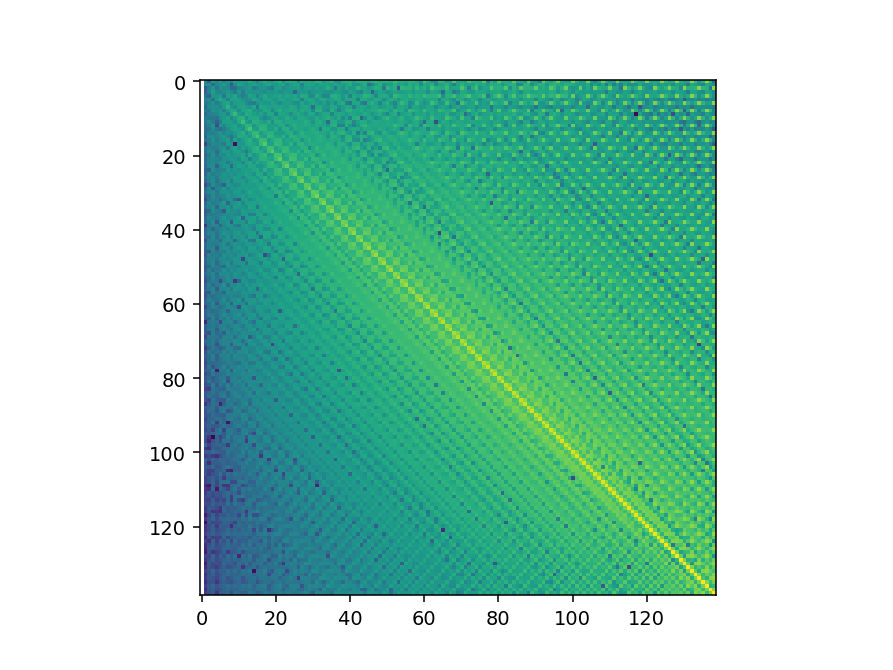

In [838]:
plt.figure()
plt.imshow(np.log10(abs(Jac_full)))

In [829]:
n_min = 40
J_hf = Jac_full[n_min:,n_min:]

<IPython.core.display.Javascript object>


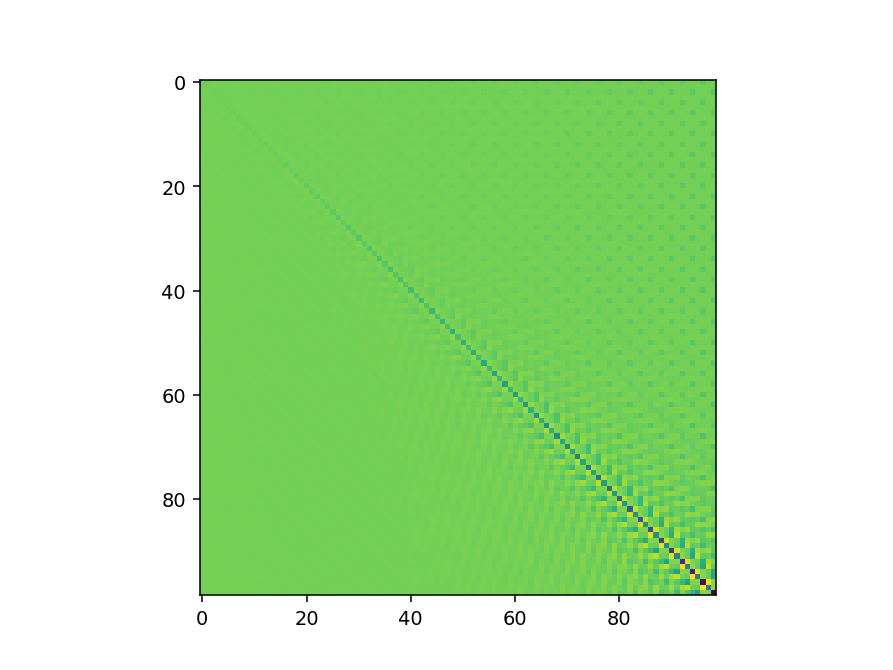

In [830]:
plt.figure()
plt.imshow(J_hf)

In [831]:
eigvals = sc.linalg.eigvals(Jac_full)

<IPython.core.display.Javascript object>


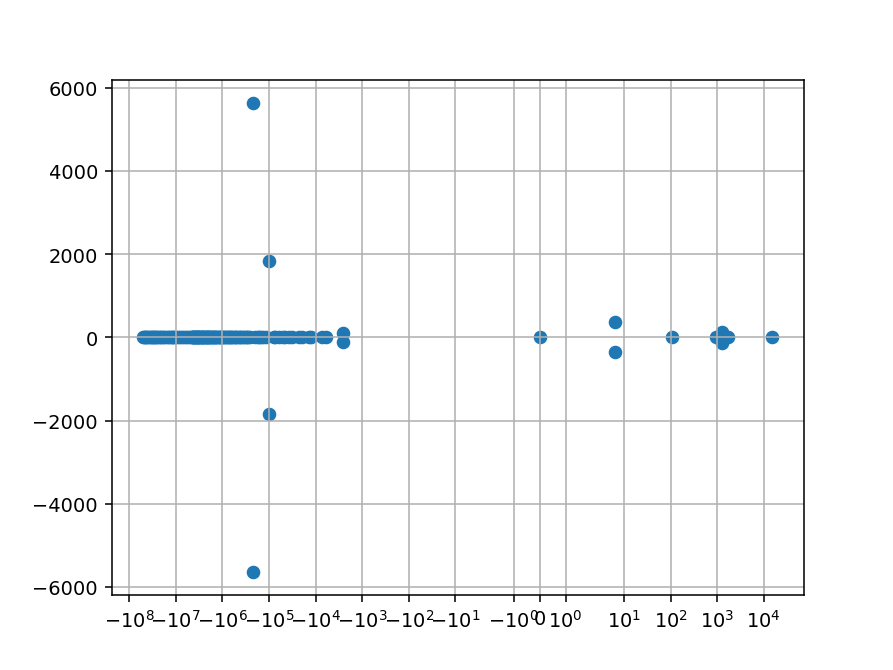

In [832]:
plt.figure()
plt.scatter(eigvals.real, eigvals.imag)
plt.grid()
plt.xscale('symlog')

In [809]:
J_hhf=J_hf[-20:,-20:]

In [810]:
eigvals_hf = sc.linalg.eigvals(J_hf)
eigvals_hhf = sc.linalg.eigvals(J_hhf)

<IPython.core.display.Javascript object>


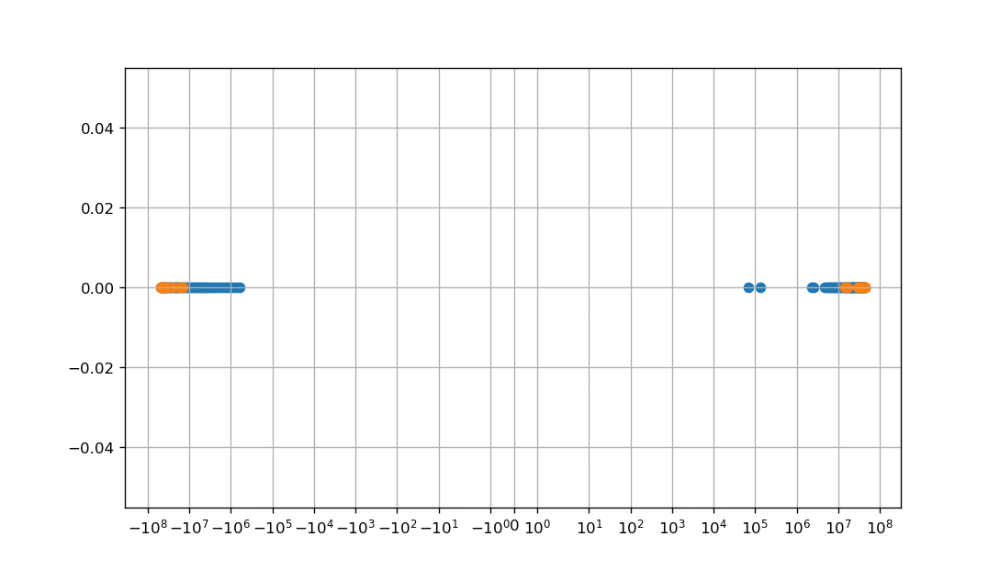

In [811]:
plt.figure()
plt.scatter(eigvals_hf.real, eigvals_hf.imag)
plt.scatter(eigvals_hhf.real, eigvals_hhf.imag)

plt.grid()
plt.xscale('symlog')

<IPython.core.display.Javascript object>


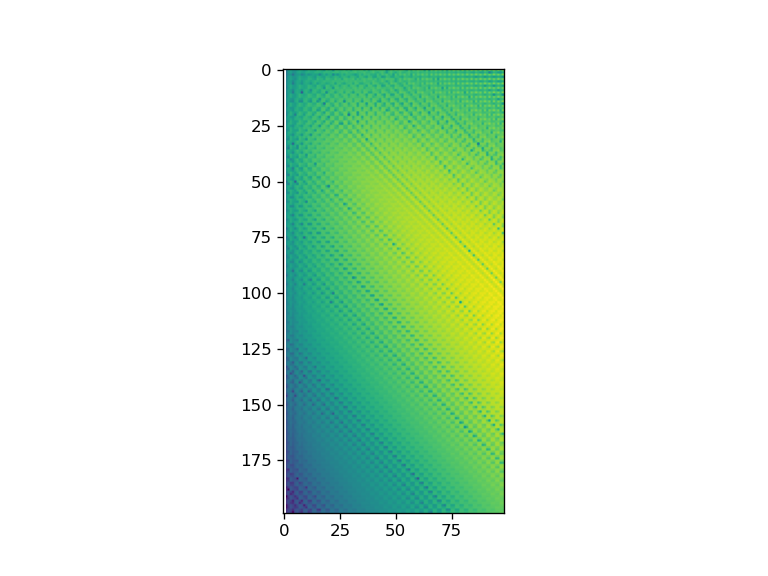

In [733]:
plt.figure()
plt.imshow(np.log10(abs(Jac_full)))


<IPython.core.display.Javascript object>


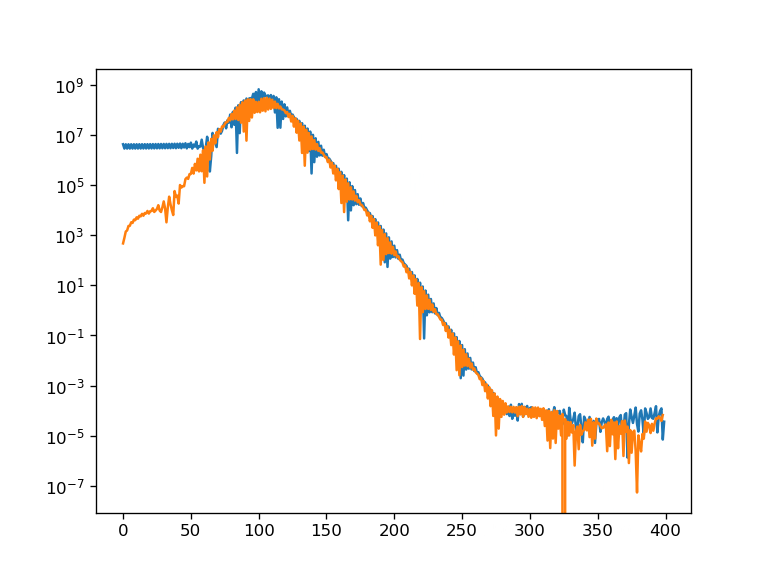

In [769]:
plt.figure()
plt.plot(abs(Jac_full[::2,200]))
plt.plot(abs(Jac_full[1::2,200]))

#plt.plot(abs(Jac_full[:,100]))

plt.yscale('log')

<IPython.core.display.Javascript object>


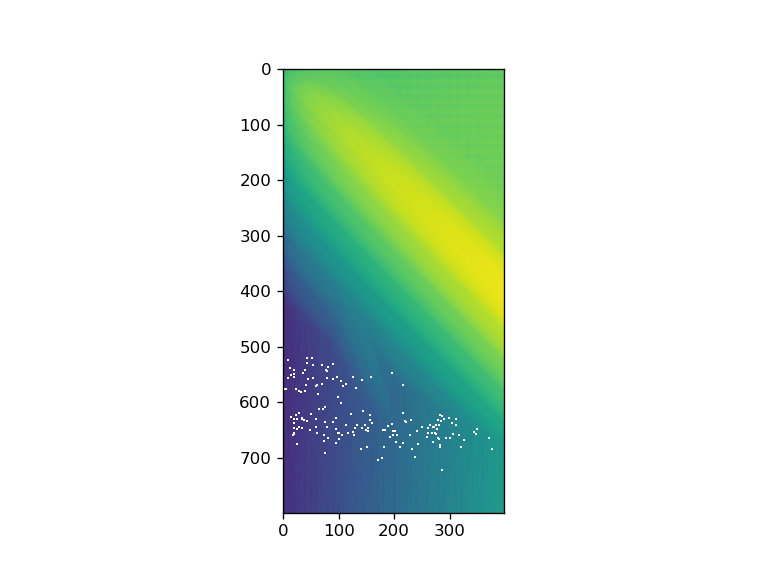

In [754]:
plt.figure()
plt.imshow(np.log10(abs(Jac_full)))


In [683]:
Jac_PP = Jac_full[:N-1,:N-1]
Jac_ZZ = Jac_full[N-1:,N-1:]

Jac_PZ = Jac_full[:N-1,N-1:]
Jac_ZP = Jac_full[N-1:,:N-1]


In [686]:
n_min = 100
Jac_PP_hf = Jac_PP[n_min-1:, n_min-1:]
Jac_ZZ_hf = Jac_ZZ[n_min:, n_min:]

Jac_PZ_hf = Jac_PZ[n_min-1:, n_min:]
Jac_ZP_hf = Jac_ZP[n_min:, n_min-1:]
J_hf = np.vstack([np.hstack([Jac_PP_hf, Jac_PZ_hf]),
                  np.hstack([Jac_ZP_hf, Jac_ZZ_hf])])

<IPython.core.display.Javascript object>


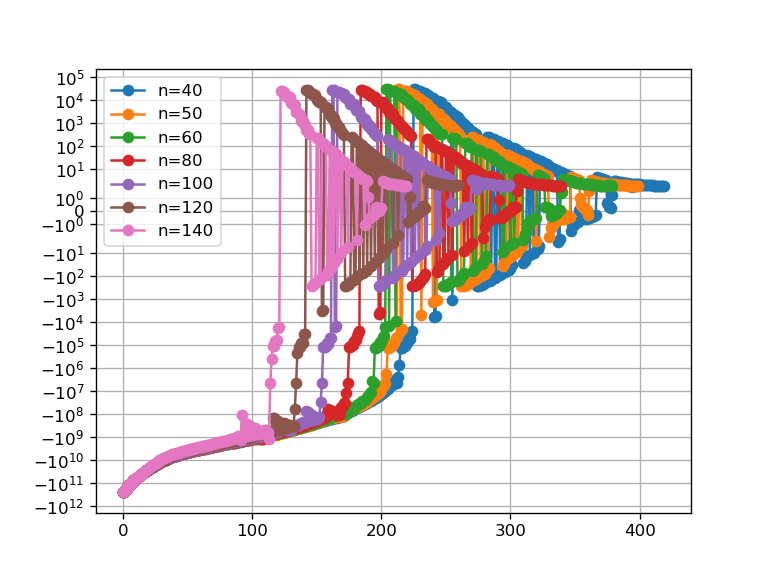

In [685]:

plt.figure()
plt.grid()
plt.yscale('symlog')


for n_min in [40,50,60,80,100,120,140]:
    Jac_PP_hf = Jac_PP[n_min-1:, n_min-1:]
    Jac_ZZ_hf = Jac_ZZ[n_min:, n_min:]
    
    Jac_PZ_hf = Jac_PZ[n_min-1:, n_min:]
    Jac_ZP_hf = Jac_ZP[n_min:, n_min-1:]
    J_hf = np.vstack([np.hstack([Jac_PP_hf, Jac_PZ_hf]),
                  np.hstack([Jac_ZP_hf, Jac_ZZ_hf])])
    eigvals_hf = sc.linalg.eigvals(J_hf)
    plt.plot(eigvals_hf.real, 'o-',label=f'n={n_min}')
plt.legend()

In [666]:
eigvals_hf = sc.linalg.eigvals(J_hf)

<IPython.core.display.Javascript object>


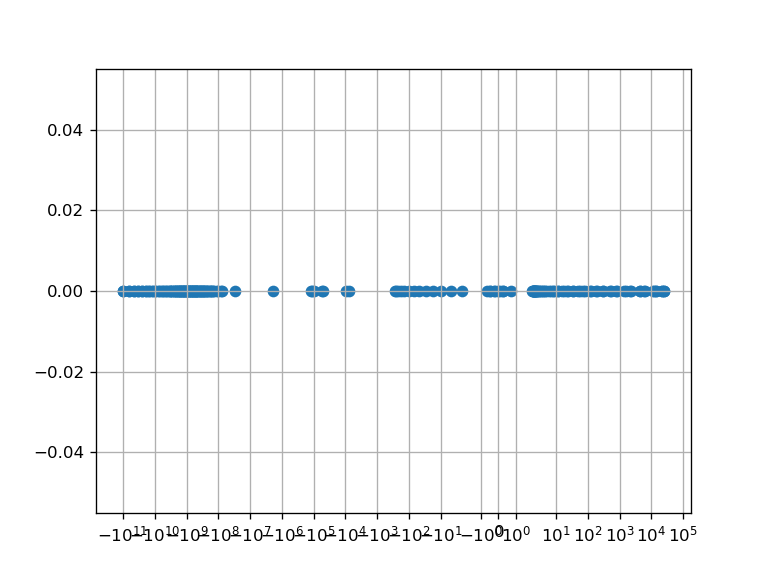

In [667]:
plt.figure()
plt.scatter(eigvals_hf.real, eigvals_hf.imag)
plt.grid()
plt.xscale('symlog')

In [649]:
w_hf, U_hf = sc.linalg.eig(J_hf)

In [687]:
velo_rho_fur, velo_z_fur = get_normal_velo_projects_full(P_fur0,Z_fur0)

velo_hf = np.concatenate([velo_rho_fur[n_min-1:N-1],velo_z_fur[n_min:N]])

In [688]:
psi_hf = sc.linalg.solve(J_hf, -velo_hf)

<IPython.core.display.Javascript object>


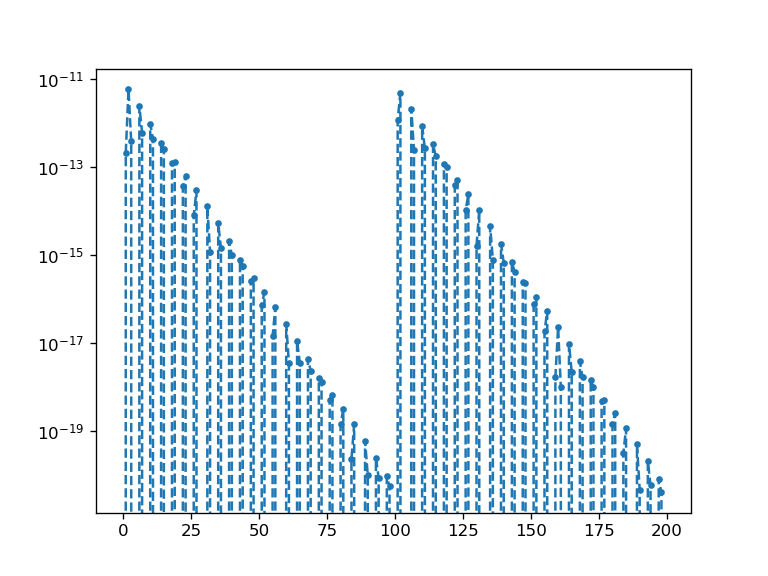

In [690]:
plt.figure()
#plt.plot(psi_hf,'.--')
plt.plot(psi_hf_diag,'.--')
plt.yscale('log')

In [672]:
psi_hf_diag = -velo_hf/J_hf.diagonal() 

<IPython.core.display.Javascript object>


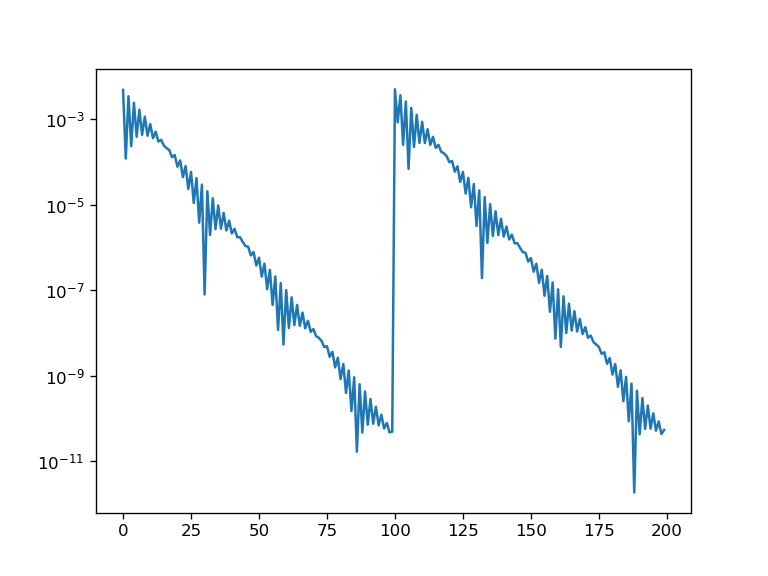

In [671]:
plt.figure()

plt.plot(abs(velo_hf))
plt.yscale('log')

In [652]:
velo_hf_tilde = sc.linalg.solve(U_hf, velo_hf)

<IPython.core.display.Javascript object>


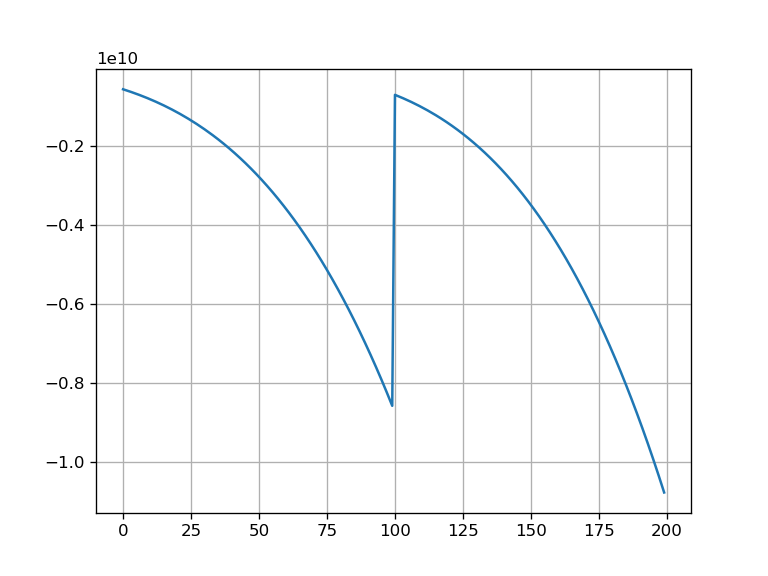

In [677]:
plt.figure()
plt.plot(J_hf.diagonal())
plt.grid()

<IPython.core.display.Javascript object>


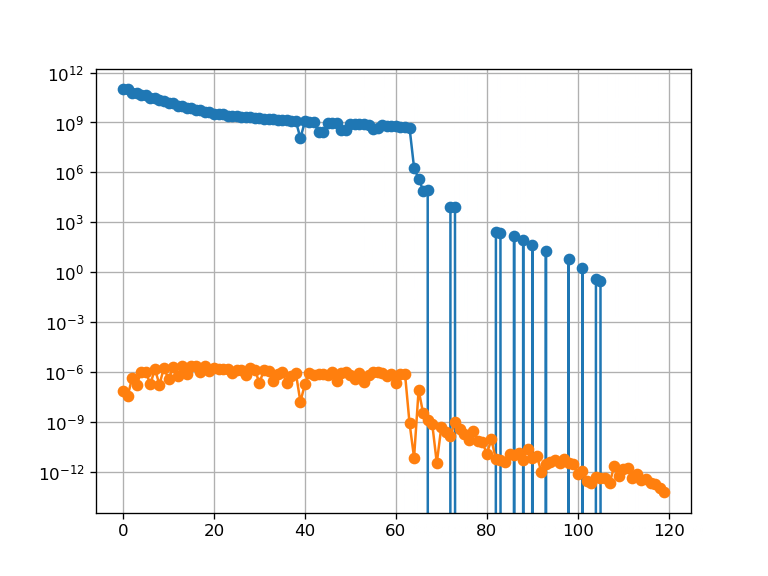

In [654]:
%matplotlib notebook
plt.figure()
plt.plot(-w_hf.real,'o-')
plt.plot(abs(velo_hf_tilde),'o-')

#plt.plot(np.abs(Jac_from_hf @ U_hf).sum(axis=0), 'o--')


plt.yscale('log')

plt.grid()

In [632]:
index_fast = w_hf.real<-1e-7

<IPython.core.display.Javascript object>


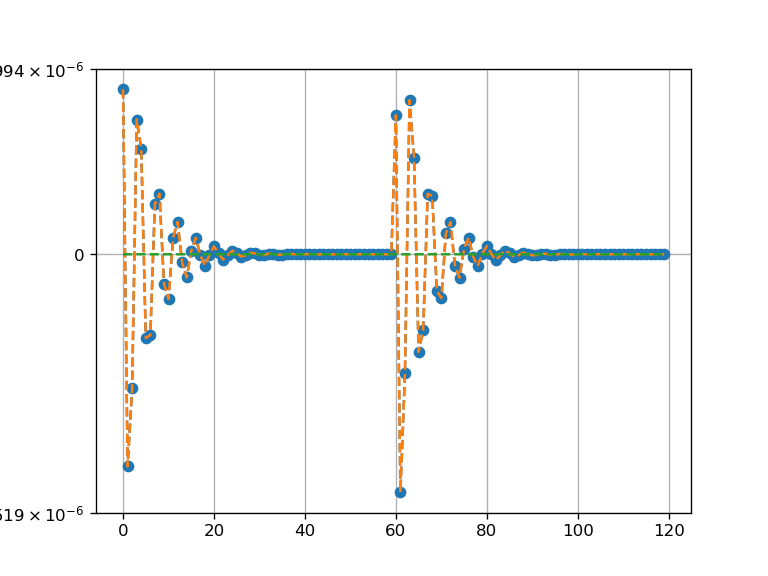

/home/maxkway/anaconda3/envs/mem-model/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/maxkway/anaconda3/envs/mem-model/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [633]:
velo_hf_fast = U_hf[:,index_fast] @ velo_hf_tilde[index_fast]
velo_hf_slow = U_hf[:,~index_fast] @ velo_hf_tilde[~index_fast]
plt.figure()
plt.plot(velo_hf,'o--')
plt.plot(velo_hf_fast,'--')
plt.plot(velo_hf_slow,'--')

plt.yscale('symlog', linthresh=5e-3)
plt.grid()

In [634]:
JacP_from_Phf = Jac_PP[:n_min-1,n_min-1:]
JacP_from_Zhf = Jac_PZ[:n_min-1,n_min:]

JacZ_from_Phf = Jac_ZP[:n_min,n_min-1:]
JacZ_from_Zhf = Jac_ZZ[:n_min,n_min:]

In [635]:
Jac_from_hf = np.vstack([np.hstack([JacP_from_Phf, JacP_from_Zhf]),
                  np.hstack([JacZ_from_Zhf, JacZ_from_Zhf])])

## Dynamic

In [140]:
T_g = 1e20

In [44]:
def get_PZ_fur_from_pz(pz):
    N_ = (len(pz)+1)//2
    P_fur = np.zeros(N_); Z_fur = pz[::2]
    P_fur[1:]=pz[1::2]
    return P_fur, Z_fur


def get_pz_from_PZ_fur(P_fur, Z_fur):
    N = len(Z_fur)
    pz = np.zeros(2*N-1)
    pz[1::2]=P_fur[1:]
    pz[::2]=Z_fur
    return pz

In [33]:
def get_gauge_velo_fur_1d(pz):
    P_fur, Z_fur = get_PZ_fur_from_pz(pz)
    veloP, veloZ = get_gauge_velo_projects_full(P_fur, Z_fur)
    N = len(Z_fur)
    velo_pz = np.zeros(2*N-1)
    velo_pz[1::2]=veloP[:N-1]
    velo_pz[::2]=veloZ[:N]
    return velo_pz

In [34]:
def get_velo_with_nat_gauge_fur_1d(pz):
    P_fur, Z_fur = get_PZ_fur_from_pz(pz)
    veloP, veloZ = get_velo_with_nat_gauge_projects_full(P_fur, Z_fur,T_g)
    N = len(Z_fur)
    velo_pz = np.zeros(2*N-1)
    velo_pz[1::2]=veloP[:N-1]
    velo_pz[::2]=veloZ[:N]
    return velo_pz

In [45]:
def get_normal_velo_fur_1d(pz):
    P_fur, Z_fur = get_PZ_fur_from_pz(pz)
    veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
    N = len(Z_fur)
    velo_pz = np.zeros(2*N-1)
    velo_pz[1::2]=veloP[:N-1]
    velo_pz[::2]=veloZ[:N]
    return velo_pz

### Prepare state

In [834]:
p1=1
p2=0
z1=0.26
z2=0
z3=0

In [830]:
p1=0.2
p2=0
z1=1
z2=0
z3=0

In [94]:
p1=1
z1=0.35
z2=-0.5
z3 = -0.2

In [23]:
p1=1
p2=0
z1=0.2
z2=0
z3=0

In [854]:
### Asymetric start ###

p1=1
p2=-0.1
z1=0.13
z2=-0.3
z3=-0.04

In [1012]:
N=100

In [1013]:
P_fur0 = np.zeros(N);
P_fur0[1]=p1
P_fur0[2]=p2
P_fur0 /= 2

Z_fur0 = np.zeros(N);
Z_fur0[1]=z1
Z_fur0[2]=z2
Z_fur0[3]=z3
Z_fur0 /= 2

In [1014]:
P_fur0,Z_fur0 = make_constant_v_repar(P_fur0,Z_fur0, 10)

In [98]:
P_fur0 = P_fur_j
Z_fur0 = Z_fur_j

NameError: name 'P_fur_j' is not defined

In [858]:
Vol0, Sqr0 = get_VolSqr(P_fur0, Z_fur0)
V_cal0

NameError: name 'weights_simp' is not defined

In [1107]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


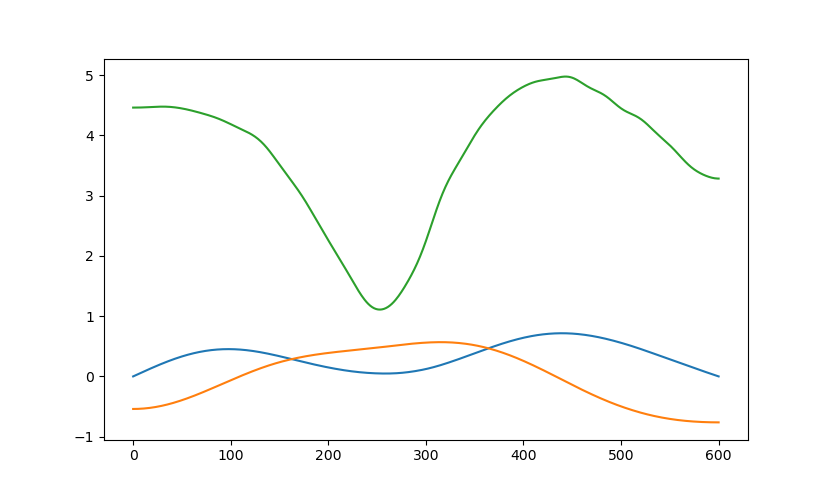

<IPython.core.display.Javascript object>


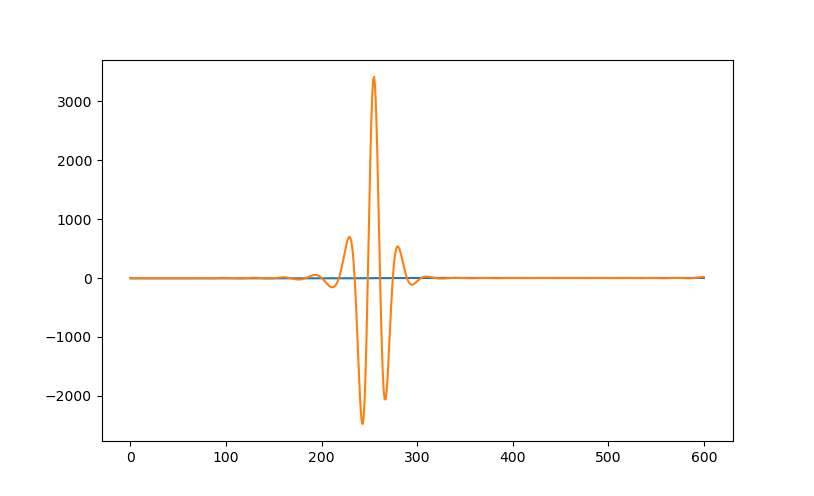

In [1108]:
plt.figure()
plt.plot(P)
plt.plot(Z)
plt.plot(V)
plt.figure()
plt.plot(H)
plt.plot(force)

(-0.05098850321387349,
 1.0707585674913433,
 -0.42564721870507183,
 0.36076838432945424)

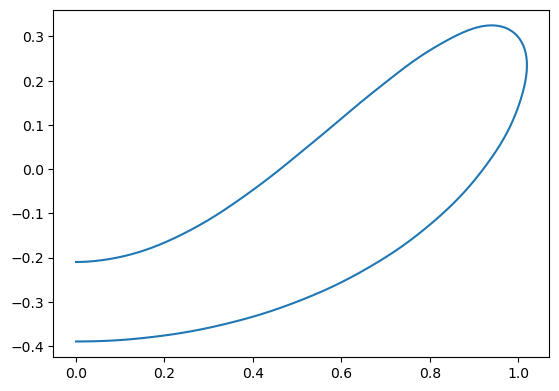

In [861]:
plt.figure()
plt.plot(P,Z)
plt.axis('scaled')

<IPython.core.display.Javascript object>


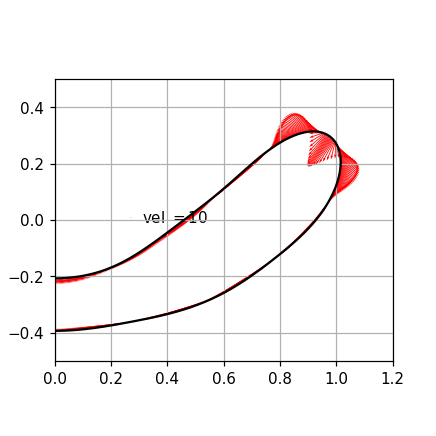

(-0.5, 0.5)

In [921]:
%matplotlib notebook
t_ = get_gauge_velo(P_fur0, Z_fur0, 1e-2)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P, Z, t_[0],t_[1], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 5, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
plt.xlim(0,1.2)
plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')

(-0.5, 0.5)

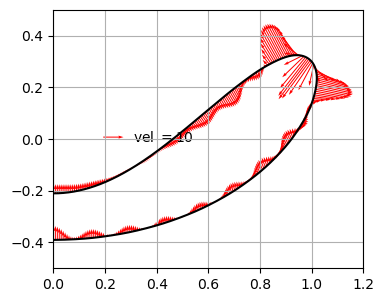

In [80]:
t_ = get_velo(P_fur0, Z_fur0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], t_[0],t_[1], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 10, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
plt.xlim(0,1.2)
plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')

______________

### Intagrate

#### Gauge flow

In [1517]:
pz_0_cut = np.array([ 2.18949940e-01, -8.62702223e-02,  1.46213667e-01,  5.55280968e-02,
       -7.60490552e-03,  7.50753097e-03,  1.74100989e-03, -3.86386489e-04,
       -1.66067109e-03,  2.10230481e-05,  2.00965966e-04,  3.05008665e-04,
       -2.65010363e-04, -2.88394491e-05,  7.03038683e-05,  1.22209207e-05,
       -5.94919657e-05, -7.70641965e-05,  2.86549197e-05, -1.81043681e-05,
       -7.21746206e-06,  1.94708569e-05,  8.23288321e-06, -2.02298803e-05,
       -2.67161680e-06,  2.94740781e-05,  5.96849142e-07, -4.70277607e-05,
       -7.01100034e-06,  2.96054324e-05,  2.74185795e-05, -2.56550042e-05,
       -6.35260087e-06,  1.31657564e-05, -2.68994282e-07, -3.55853514e-06,
       -1.20360194e-05,  1.30870034e-05, -5.11538970e-07, -1.22352746e-03,
        9.23680568e-02, -3.02546658e-01, -3.21978088e-03, -2.33897491e-02,
       -3.52037057e-02, -2.73804569e-04,  2.08420387e-03,  1.07852966e-03,
       -2.60034873e-04, -1.93139908e-04, -2.42711159e-05,  1.86853265e-04,
       -1.80953963e-04, -1.43580261e-05, -3.68303086e-05,  1.24758437e-04,
        8.95662664e-05, -4.08412834e-05, -7.21651866e-06, -1.13499749e-05,
        1.20362692e-05,  8.86540810e-06, -3.13385928e-05, -2.23022557e-05,
        3.60434014e-05,  3.36342343e-05,  5.26946221e-06, -9.76024030e-06,
       -2.96939138e-05,  1.53165014e-05,  5.72294302e-06, -2.11721999e-05,
        9.71684292e-06, -4.36789889e-06,  1.15879395e-05, -1.75743011e-06,
       -8.66718704e-06,  9.03027855e-06, -4.18953317e-06], dtype=np.float128)

N_cut = (len(pz_0_cut)+1)//2

In [1616]:
N = 300

In [1617]:
N_int=1400

In [1618]:
Pfur_0 = np.zeros(N)
Zfur_0 = np.zeros(N)
Pfur_0[1:N_cut] = pz_0_cut[:N_cut-1]
Zfur_0[:N_cut] = pz_0_cut[N_cut-1:]

In [1619]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


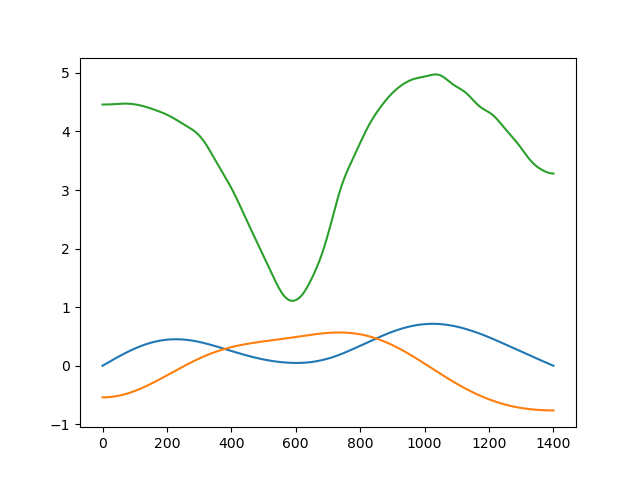

<IPython.core.display.Javascript object>


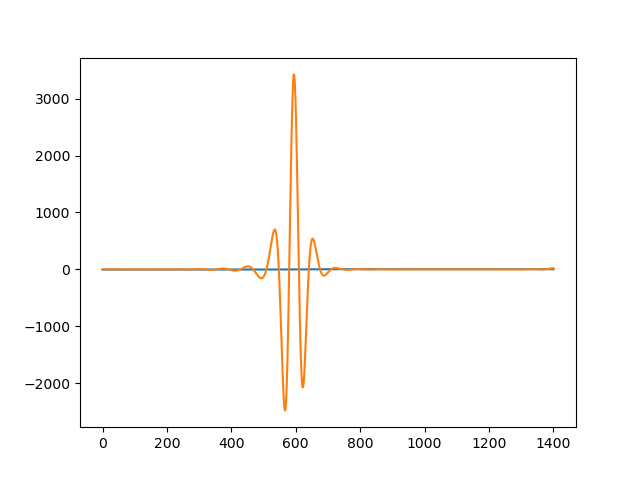

In [1620]:
plt.figure()
plt.plot(P)
plt.plot(Z)
plt.plot(V)
plt.figure()
plt.plot(H)
plt.plot(force)

<IPython.core.display.Javascript object>


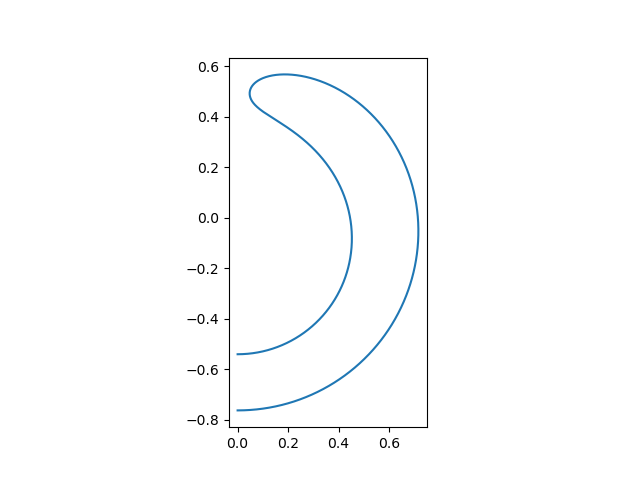

(-0.03580292530008578,
 0.7518614313018014,
 -0.8291428682036126,
 0.6348196784881489)

In [1524]:
plt.figure()
plt.plot(P,Z)
plt.axis('scaled')

<IPython.core.display.Javascript object>


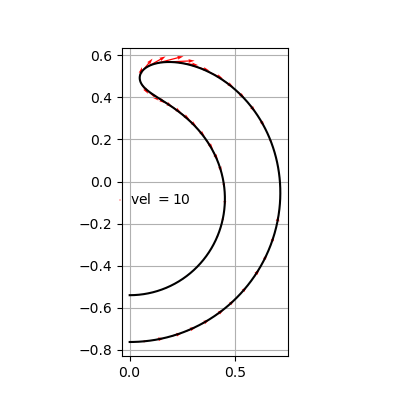

<IPython.core.display.Javascript object>


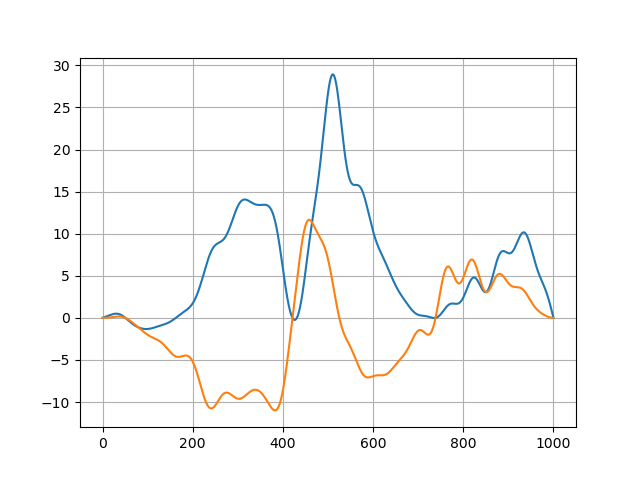

In [1586]:
%matplotlib notebook
t_ = get_gauge_velo(Pfur_0, Zfur_0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


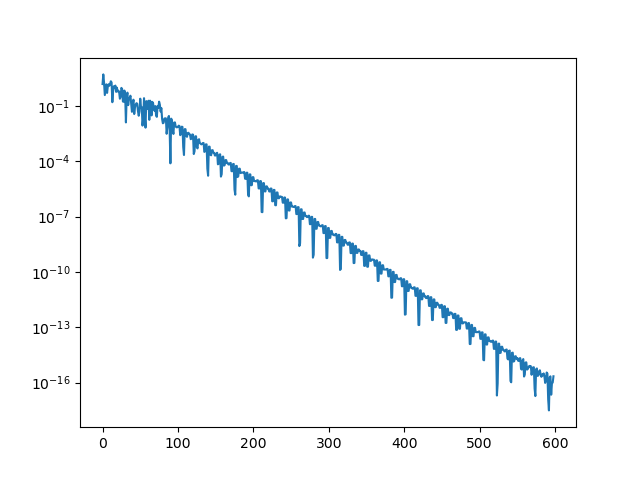

In [1621]:
plt.figure()
plt.plot(abs(get_gauge_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.yscale('log')

In [1310]:
%timeit get_gauge_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

361 µs ± 43.8 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [1311]:
%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [1312]:
%lprun -f get_velo_with_nat_gauge_projects_full get_gauge_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

__________________________________________________

In [1625]:
steps = np.logspace(-8,-5,2*N-1)[::-1]
j_gauge_fun = nd.Jacobian(get_gauge_velo_fur_1d, step=steps)

In [1626]:
jac_0 = j_gauge_fun(get_pz_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-8.63e+05 7.709805333004567


<IPython.core.display.Javascript object>


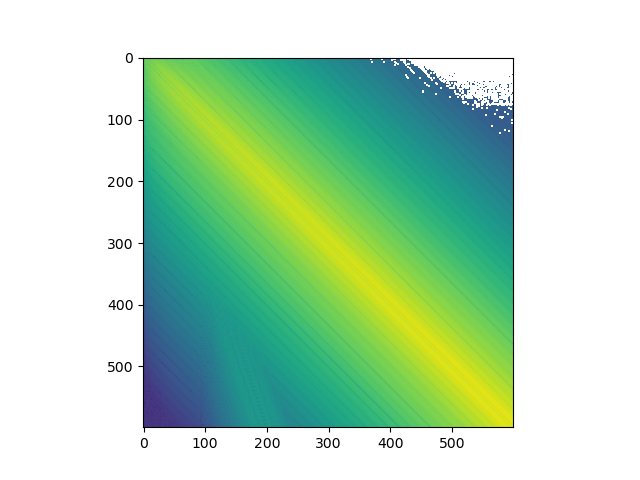

In [1627]:
plt.figure()
plt.imshow(np.log10(abs(jac_0)))

In [1678]:
t_max=0.2

In [1679]:
atol = 1e-12
rtol = atol/10

In [1680]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 200 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_gauge_velo_fur_1d(pz)
jac = j_gauge_fun

In [1681]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol,rtol=rtol);

0.0
[-1.22352746e-03  2.18949940e-01  9.23680568e-02 -8.62702223e-02
 -3.02546658e-01  1.46213667e-01 -3.21978088e-03  5.55280968e-02
 -2.33897491e-02 -7.60490552e-03 -3.52037057e-02  7.50753097e-03
 -2.73804569e-04  1.74100989e-03  2.08420387e-03 -3.86386489e-04
  1.07852966e-03 -1.66067109e-03 -2.60034873e-04  2.10230481e-05
 -1.93139908e-04  2.00965966e-04 -2.42711159e-05  3.05008665e-04
  1.86853265e-04 -2.65010363e-04 -1.80953963e-04 -2.88394491e-05
 -1.43580261e-05  7.03038683e-05 -3.68303086e-05  1.22209207e-05
  1.24758437e-04 -5.94919657e-05  8.95662664e-05 -7.70641965e-05
 -4.08412834e-05  2.86549197e-05 -7.21651866e-06 -1.81043681e-05
 -1.13499749e-05 -7.21746206e-06  1.20362692e-05  1.94708569e-05
  8.86540810e-06  8.23288321e-06 -3.13385928e-05 -2.02298803e-05
 -2.23022557e-05 -2.67161680e-06  3.60434014e-05  2.94740781e-05
  3.36342343e-05  5.96849142e-07  5.26946221e-06 -4.70277607e-05
 -9.76024030e-06 -7.01100034e-06 -2.96939138e-05  2.96054324e-05
  1.53165014e-05  2.7

0.0002518906292204153
[-1.62874819e-03  2.20242765e-01  9.18997196e-02 -8.61766069e-02
 -3.02339338e-01  1.45843161e-01 -3.09950290e-03  5.52491517e-02
 -2.30180265e-02 -7.29990774e-03 -3.47960905e-02  6.95085341e-03
 -7.33179323e-04  1.69976168e-03  1.91872652e-03 -8.26208046e-05
  1.30102438e-03 -1.35072791e-03 -1.15762978e-04 -2.20609129e-04
 -3.39047402e-04  2.82187146e-05 -1.65288331e-04  3.64439746e-04
  2.56464626e-04 -4.00759904e-05  9.14900949e-06 -6.42236134e-05
 -4.86459245e-05 -8.21348913e-05 -1.31062490e-04  5.30406290e-06
  5.82337994e-05  5.25584180e-05  1.23499166e-04 -1.56036149e-05
  1.42950242e-05 -3.95644475e-05 -4.16876249e-05 -4.15934827e-05
 -4.17998190e-05  2.50916734e-05  2.21310530e-05  4.19744849e-05
  3.61926708e-05 -6.05362332e-06 -1.22148155e-05 -3.31592428e-05
 -3.18166726e-05 -3.43002808e-06  1.54626575e-06  2.35428019e-05
  2.42804676e-05  7.47380593e-06  1.08135659e-05 -1.76714676e-05
 -1.14335151e-05 -1.05556210e-05 -1.38113275e-05  9.11267125e-06
  5

0.0008881192981856907
[-2.72781145e-03  2.23309822e-01  9.07590179e-02 -8.59899416e-02
 -3.01791649e-01  1.44985751e-01 -2.87474782e-03  5.46531364e-02
 -2.21654709e-02 -6.62606602e-03 -3.37004395e-02  5.55707203e-03
 -1.74196453e-03  1.59247896e-03  1.51220780e-03  6.91710333e-04
  1.72345531e-03 -6.86206513e-04  2.10109888e-04 -7.46196721e-04
 -6.34012378e-04 -3.90035445e-04 -4.59477339e-04  4.89775616e-04
  3.65595726e-04  3.98496593e-04  3.51654416e-04 -1.00482526e-04
 -8.10958968e-05 -3.52125027e-04 -3.19059526e-04 -5.38356664e-05
 -4.08002677e-05  2.25287526e-04  2.10531584e-04  1.10847613e-04
  1.06609993e-04 -1.18442536e-04 -1.01720218e-04 -1.27712349e-04
 -1.14064087e-04  3.91044357e-05  3.21480008e-05  1.05297695e-04
  9.24952094e-05  1.04432560e-05  8.98635766e-06 -7.09335539e-05
 -6.33291949e-05 -3.31322167e-05 -3.01366462e-05  3.89047016e-05
  3.47502099e-05  3.81708194e-05  3.44086799e-05 -1.40626471e-05
 -1.26739316e-05 -3.28412843e-05 -3.03513536e-05 -1.79213027e-06
 -1

0.0020927780515660613
[-5.01124083e-03  2.28412465e-01  8.87494108e-02 -8.57931593e-02
 -3.00745092e-01  1.43605236e-01 -2.68633980e-03  5.38380956e-02
 -2.07636541e-02 -5.64274412e-03 -3.14905822e-02  3.04654949e-03
 -3.24189821e-03  1.37302794e-03  8.27682327e-04  2.04934085e-03
  2.22342533e-03  2.60780952e-04  6.74541671e-04 -1.45892551e-03
 -1.00820071e-03 -1.04560635e-03 -8.48116383e-04  6.41130119e-04
  4.63554778e-04  9.40345648e-04  7.20818879e-04 -6.61952049e-05
 -5.75578885e-05 -6.72527469e-04 -5.37839446e-04 -2.02218892e-04
 -1.61084817e-04  3.95144182e-04  3.17665936e-04  2.92175939e-04
  2.34961431e-04 -1.69674313e-04 -1.40754227e-04 -2.73751461e-04
 -2.24608664e-04  1.81135094e-05  1.54574672e-05  2.06239332e-04
  1.70989420e-04  6.61179673e-05  5.36058153e-05 -1.25988295e-04
 -1.06475299e-04 -9.74151003e-05 -8.19468815e-05  5.61244344e-05
  4.80915070e-05  9.45489301e-05  8.00108364e-05 -5.29250753e-06
 -5.28507375e-06 -7.32224637e-05 -6.32508346e-05 -2.44366220e-05
 -2

0.0038673735058777346
[-8.62076271e-03  2.34564335e-01  8.61160041e-02 -8.57450318e-02
 -2.99333363e-01  1.41934340e-01 -2.79131497e-03  5.30763908e-02
 -1.89712847e-02 -4.65328423e-03 -2.82218179e-02 -2.30069902e-04
 -4.82788489e-03  1.01283220e-03  7.42310883e-05  3.64429701e-03
  2.66305821e-03  1.23602141e-03  1.08092047e-03 -2.07296171e-03
 -1.33073765e-03 -1.73856164e-03 -1.20836035e-03  7.26479028e-04
  5.15561382e-04  1.43431654e-03  1.01593305e-03  6.05629994e-05
  2.41412533e-05 -9.59393151e-04 -7.16800041e-04 -4.12379777e-04
 -3.01129002e-04  5.18414200e-04  3.95940307e-04  5.00303377e-04
  3.77429208e-04 -1.76879535e-04 -1.44048002e-04 -4.34585417e-04
 -3.38695912e-04 -4.25261113e-05 -2.95831929e-05  3.05799422e-04
  2.43573168e-04  1.54366259e-04  1.19868680e-04 -1.67647086e-04
 -1.37295093e-04 -1.84194964e-04 -1.48335166e-04  5.32717884e-05
  4.54252546e-05  1.62371579e-04  1.32747818e-04  2.50302060e-05
  1.89437331e-05 -1.14991828e-04 -9.60500978e-05 -6.60173661e-05
 -5

0.006199669183509106
[-1.34581685e-02  2.40812091e-01  8.32004294e-02 -8.59003174e-02
 -2.97820945e-01  1.40082056e-01 -3.34059706e-03  5.24637877e-02
 -1.68851472e-02 -3.86281016e-03 -2.42758829e-02 -3.80337365e-03
 -6.19440508e-03  5.05837769e-04 -5.24803699e-04  5.10991396e-03
  3.03581341e-03  2.11836472e-03  1.36521615e-03 -2.48981247e-03
 -1.55431911e-03 -2.36701286e-03 -1.51445009e-03  7.23630353e-04
  5.11610175e-04  1.85743817e-03  1.24628744e-03  2.43212466e-04
  1.35984784e-04 -1.18877934e-03 -8.48219613e-04 -6.45379986e-04
 -4.46401141e-04  5.90662612e-04  4.37636239e-04  7.08509225e-04
  5.12682954e-04 -1.43366627e-04 -1.19233765e-04 -5.82058373e-04
 -4.37704391e-04 -1.32238428e-04 -9.29176885e-05  3.83840980e-04
  2.97378559e-04  2.59364412e-04  1.95315024e-04 -1.84912648e-04
 -1.48882086e-04 -2.76240078e-04 -2.15887878e-04  2.75137316e-05
  2.57264280e-05  2.26051389e-04  1.80404794e-04  7.35961976e-05
  5.62360733e-05 -1.46061398e-04 -1.19588455e-04 -1.19256395e-04
 -9.

0.00931339019101593
[-1.96755070e-02  2.46907202e-01  8.01663347e-02 -8.62281059e-02
 -2.96356658e-01  1.37909303e-01 -4.41876840e-03  5.19668529e-02
 -1.44075575e-02 -3.35378679e-03 -1.98694387e-02 -7.53806278e-03
 -7.23370388e-03 -1.73361374e-04 -8.97990743e-04  6.33753211e-03
  3.37140450e-03  2.93396745e-03  1.59859059e-03 -2.75811505e-03
 -1.68951819e-03 -2.95327091e-03 -1.78772609e-03  6.46569588e-04
  4.61946743e-04  2.23356632e-03  1.43613253e-03  4.66413482e-04
  2.65653871e-04 -1.36831134e-03 -9.43001138e-04 -8.92216096e-04
 -5.93118622e-04  6.17492924e-04  4.48704474e-04  9.11041312e-04
  6.38402624e-04 -7.42518522e-05 -7.16944946e-05 -7.11157045e-04
 -5.20208996e-04 -2.44995184e-04 -1.69725930e-04  4.37122594e-04
  3.31771719e-04  3.74273480e-04  2.75115717e-04 -1.76857699e-04
 -1.41749597e-04 -3.66618561e-04 -2.79897976e-04 -1.95431638e-05
 -9.02106369e-06  2.79604758e-04  2.18931786e-04  1.36603599e-04
  1.03125646e-04 -1.62384251e-04 -1.31196828e-04 -1.79116832e-04
 -1.4

0.012897003394537946
[-2.62094409e-02  2.51836686e-01  7.76852692e-02 -8.65814251e-02
 -2.95237948e-01  1.35659270e-01 -5.80370118e-03  5.16505554e-02
 -1.18911222e-02 -3.22636733e-03 -1.59436384e-02 -1.07545054e-02
 -7.79143507e-03 -9.01118053e-04 -1.04042801e-03  7.17150278e-03
  3.63063012e-03  3.60117725e-03  1.80361866e-03 -2.90303256e-03
 -1.74639009e-03 -3.43386206e-03 -1.99930454e-03  5.29376701e-04
  3.93813296e-04  2.52104567e-03  1.57260020e-03  6.83526371e-04
  3.86406753e-04 -1.48383587e-03 -9.98762917e-04 -1.10964468e-03
 -7.17656504e-04  6.06479703e-04  4.36840884e-04  1.07582727e-03
  7.36930280e-04  1.00842319e-05 -1.59148495e-05 -8.03984952e-04
 -5.76844861e-04 -3.55759384e-04 -2.43107127e-04  4.61456740e-04
  3.45716025e-04  4.75973369e-04  3.43858041e-04 -1.49980500e-04
 -1.21630281e-04 -4.38299380e-04 -3.29179779e-04 -7.49143364e-05
 -4.89628212e-05  3.13903966e-04  2.42611549e-04  1.98794529e-04
  1.48340566e-04 -1.62695913e-04 -1.30620242e-04 -2.31763679e-04
 -1.

0.017614036108531288
[-3.36717669e-02  2.56219677e-01  7.56694415e-02 -8.68945967e-02
 -2.94321581e-01  1.33019986e-01 -7.57775074e-03  5.15238541e-02
 -9.03707725e-03 -3.45038082e-03 -1.22322312e-02 -1.37637679e-02
 -8.00990115e-03 -1.71789712e-03 -1.06551506e-03  7.80477122e-03
  3.84899872e-03  4.23094032e-03  2.01523657e-03 -2.98530427e-03
 -1.76280367e-03 -3.87938661e-03 -2.18379154e-03  3.78568414e-04
  3.12934601e-04  2.76767043e-03  1.68404889e-03  9.09512414e-04
  5.07875955e-04 -1.56350308e-03 -1.03294096e-03 -1.31992490e-03
 -8.34517520e-04  5.69151432e-04  4.09674072e-04  1.22390648e-03
  8.22664713e-04  1.09543496e-04  4.79969024e-05 -8.76374127e-04
 -6.18975393e-04 -4.70808896e-04 -3.17585176e-04  4.66387276e-04
  3.46369027e-04  5.73080387e-04  4.08009161e-04 -1.08189048e-04
 -9.16119863e-05 -4.99467681e-04 -3.70132736e-04 -1.38835647e-04
 -9.42272274e-05  3.35117526e-04  2.56500588e-04  2.62759205e-04
  1.94017304e-04 -1.50682268e-04 -1.21023084e-04 -2.80545465e-04
 -2.

0.023254260803496445
[-4.10162254e-02  2.59602179e-01  7.45344150e-02 -8.70487855e-02
 -2.93656676e-01  1.30301306e-01 -9.49253325e-03  5.16835150e-02
 -6.20912050e-03 -3.94700952e-03 -9.29782616e-03 -1.61671338e-02
 -7.96575564e-03 -2.47384583e-03 -1.04826866e-03  8.24511173e-03
  4.00339737e-03  4.76102617e-03  2.19774517e-03 -3.01716156e-03
 -1.75656292e-03 -4.24185821e-03 -2.32635441e-03  2.27141391e-04
  2.35934608e-04  2.95425671e-03  1.76475026e-03  1.10991601e-03
  6.12621373e-04 -1.60878800e-03 -1.04885627e-03 -1.49607194e-03
 -9.29962863e-04  5.19722452e-04  3.76695998e-04  1.33980095e-03
  8.87838871e-04  2.04924858e-04  1.07920011e-04 -9.24448420e-04
 -6.45479519e-04 -5.72019266e-04 -3.81832912e-04  4.57222682e-04
  3.38059334e-04  6.52590887e-04  4.59475832e-04 -6.22337206e-05
 -5.94092939e-05 -5.43982386e-04 -3.99151714e-04 -1.99063667e-04
 -1.36238041e-04  3.43665717e-04  2.61423268e-04  3.18036192e-04
  2.32918292e-04 -1.31486497e-04 -1.06534026e-04 -3.18659153e-04
 -2.

0.03004043333095393
[-4.79576529e-02  2.62169948e-01  7.42790821e-02 -8.70244576e-02
 -2.93135101e-01  1.27586521e-01 -1.15035556e-02  5.21617852e-02
 -3.51051581e-03 -4.56434717e-03 -7.11803553e-03 -1.80112781e-02
 -7.80776147e-03 -3.12799373e-03 -1.04460748e-03  8.56613487e-03
  4.10493289e-03  5.20492853e-03  2.34713049e-03 -3.01569857e-03
 -1.73942964e-03 -4.53299595e-03 -2.43710266e-03  8.38920560e-05
  1.64860602e-04  3.09378386e-03  1.82271626e-03  1.28365492e-03
  7.01884714e-04 -1.63017788e-03 -1.05277887e-03 -1.64135079e-03
 -1.00739361e-03  4.65335667e-04  3.41826973e-04  1.42905511e-03
  9.36854470e-04  2.92539500e-04  1.62206299e-04 -9.54358164e-04
 -6.60809695e-04 -6.58770287e-04 -4.36195976e-04  4.39485459e-04
  3.24550316e-04  7.16252158e-04  5.00060019e-04 -1.61980317e-05
 -2.76367522e-05 -5.75098582e-04 -4.18894961e-04 -2.53338766e-04
 -1.73731975e-04  3.43431511e-04  2.60292907e-04  3.64276720e-04
  2.65151004e-04 -1.08676720e-04 -8.97413837e-05 -3.47334140e-04
 -2.6

0.03869878474801767
[-5.45179320e-02  2.64181477e-01  7.48621574e-02 -8.68448153e-02
 -2.92646776e-01  1.24832033e-01 -1.37074986e-02  5.30006966e-02
 -9.52759961e-04 -5.15449437e-03 -5.53401666e-03 -1.94268814e-02
 -7.63347842e-03 -3.70835544e-03 -1.08154802e-03  8.80416437e-03
  4.16453592e-03  5.59762747e-03  2.47765079e-03 -2.97823468e-03
 -1.70877522e-03 -4.77552885e-03 -2.52847848e-03 -6.44045723e-05
  9.08953223e-05  3.19666282e-03  1.86348768e-03  1.44597974e-03
  7.85529791e-04 -1.62827550e-03 -1.04463187e-03 -1.76786156e-03
 -1.07481444e-03  4.00621386e-04  3.01167130e-04  1.49868765e-03
  9.74509558e-04  3.80013259e-04  2.16361431e-04 -9.68109540e-04
 -6.66339642e-04 -7.38178067e-04 -4.85931563e-04  4.11426799e-04
  3.04513188e-04  7.69029077e-04  5.33531915e-04  3.37037139e-05
  6.60103598e-06 -5.95101605e-04 -4.31149917e-04 -3.05829093e-04
 -2.09961797e-04  3.34367324e-04  2.53069533e-04  4.04869054e-04
  2.93432175e-04 -8.06413723e-05 -6.93368813e-05 -3.68618252e-04
 -2.7

0.04882546957423892
[-5.98698784e-02  2.65624863e-01  7.60790177e-02 -8.66041011e-02
 -2.92177661e-01  1.22350798e-01 -1.59077286e-02  5.40799928e-02
  1.10291720e-03 -5.49165497e-03 -4.53451474e-03 -2.03750751e-02
 -7.51246889e-03 -4.20897965e-03 -1.16575563e-03  8.93406106e-03
  4.18171397e-03  5.93094309e-03  2.59359088e-03 -2.89157898e-03
 -1.65813028e-03 -4.96043582e-03 -2.60004983e-03 -2.23771963e-04
  9.32519879e-06  3.25383654e-03  1.88396830e-03  1.59771835e-03
  8.65911536e-04 -1.59580289e-03 -1.02075198e-03 -1.87289733e-03
 -1.13218472e-03  3.21025912e-04  2.51600431e-04  1.54437454e-03
  9.99155959e-04  4.68951296e-04  2.72124616e-04 -9.61353208e-04
 -6.59710873e-04 -8.09420280e-04 -5.31287686e-04  3.69827273e-04
  2.75795374e-04  8.08590406e-04  5.58933850e-04  8.90282479e-05
  4.46603666e-05 -6.01197037e-04 -4.34341334e-04 -3.56424576e-04
 -2.45225988e-04  3.14151071e-04  2.38183293e-04  4.38477000e-04
  3.17152770e-04 -4.61177308e-05 -4.42580862e-05 -3.80642329e-04
 -2.8

0.06128188603692694
[-6.41940361e-02  2.66752979e-01  7.77702322e-02 -8.63873121e-02
 -2.91675817e-01  1.20042654e-01 -1.82039973e-02  5.53632991e-02
  2.68552010e-03 -5.47705189e-03 -3.86875620e-03 -2.10135308e-02
 -7.44437294e-03 -4.72328918e-03 -1.30255603e-03  8.95273118e-03
  4.16054055e-03  6.25317445e-03  2.71646584e-03 -2.73135669e-03
 -1.57486685e-03 -5.10982885e-03 -2.66195014e-03 -4.23880265e-04
 -9.55876673e-05  3.26659557e-03  1.88438781e-03  1.76253134e-03
  9.56563955e-04 -1.52160192e-03 -9.74301710e-04 -1.96958914e-03
 -1.18739642e-03  2.10719098e-04  1.83165417e-04  1.56865478e-03
  1.01240628e-03  5.73679662e-04  3.38890562e-04 -9.28786569e-04
 -6.37405646e-04 -8.81704932e-04 -5.78552798e-04  3.05477840e-04
  2.32086380e-04  8.37915860e-04  5.78434392e-04  1.59116363e-04
  9.31649916e-05 -5.91060505e-04 -4.26906389e-04 -4.11891686e-04
 -2.84473206e-04  2.77274219e-04  2.11677864e-04  4.68034495e-04
  3.38556308e-04  1.11698174e-06 -9.86577042e-06 -3.82676745e-04
 -2.8

0.07557006175223448
[-6.72671191e-02  2.67624378e-01  7.96338406e-02 -8.62726877e-02
 -2.91168930e-01  1.18052609e-01 -2.04175235e-02  5.66747278e-02
  3.69415768e-03 -5.08796534e-03 -3.42714674e-03 -2.13863295e-02
 -7.41586135e-03 -5.26061807e-03 -1.47777776e-03  8.85745766e-03
  4.10488583e-03  6.56030215e-03  2.84470864e-03 -2.49963119e-03
 -1.46029040e-03 -5.22005651e-03 -2.71232210e-03 -6.60834862e-04
 -2.21590499e-04  3.23278716e-03  1.86358056e-03  1.93553104e-03
  1.05474930e-03 -1.40585493e-03 -9.05355659e-04 -2.05322302e-03
 -1.23763029e-03  7.21003699e-05  9.72583772e-05  1.56813226e-03
  1.01213037e-03  6.90231475e-04  4.14208707e-04 -8.69089659e-04
 -5.98501563e-04 -9.50590724e-04 -6.24848696e-04  2.19322132e-04
  1.73930073e-04  8.53235342e-04  5.89479011e-04  2.41184821e-04
  1.50296552e-04 -5.62497090e-04 -4.07284896e-04 -4.68491623e-04
 -3.25128405e-04  2.23537449e-04  1.73352578e-04  4.89908595e-04
  3.55032692e-04  5.93705710e-05  3.26989146e-05 -3.72132455e-04
 -2.7

0.09224542923784032
[-6.93988229e-02  2.68356368e-01  8.15636339e-02 -8.62692631e-02
 -2.90650703e-01  1.16293941e-01 -2.25649292e-02  5.79692078e-02
  4.25198396e-03 -4.38861637e-03 -3.09596111e-03 -2.15777588e-02
 -7.40504320e-03 -5.83776548e-03 -1.68243048e-03  8.66428066e-03
  4.01964614e-03  6.86030689e-03  2.97865427e-03 -2.20290112e-03
 -1.31679878e-03 -5.29652335e-03 -2.75176697e-03 -9.31963274e-04
 -3.66946767e-04  3.15590207e-03  1.82230048e-03  2.11517402e-03
  1.15900464e-03 -1.25129576e-03 -8.14915229e-04 -2.12271264e-03
 -1.28158161e-03 -9.20989005e-05 -4.60365353e-06  1.54232665e-03
  9.97497183e-04  8.15651339e-04  4.96105382e-04 -7.82814039e-04
 -5.42984770e-04 -1.01323727e-03 -6.68075487e-04  1.13144200e-04
  1.02325469e-04  8.52447514e-04  5.90381086e-04  3.32434502e-04
  2.14182845e-04 -5.14731568e-04 -3.74706256e-04 -5.23043734e-04
 -3.64896700e-04  1.53739628e-04  1.23620564e-04  5.01360116e-04
  3.64486438e-04  1.26460132e-04  8.19278438e-05 -3.47443909e-04
 -2.6

0.11383059307554008
[-7.09479453e-02  2.69058372e-01  8.36552733e-02 -8.63685678e-02
 -2.90077488e-01  1.14581752e-01 -2.48100894e-02  5.93169574e-02
  4.48208245e-03 -3.37988139e-03 -2.80375240e-03 -2.16371824e-02
 -7.39846509e-03 -6.49423819e-03 -1.92446465e-03  8.36785492e-03
  3.90026199e-03  7.17111990e-03  3.12443809e-03 -1.82621606e-03
 -1.13640110e-03 -5.34203427e-03 -2.78041242e-03 -1.25020777e-03
 -5.38642250e-04  3.02967957e-03  1.75631919e-03  2.30761400e-03
  1.27268676e-03 -1.04882178e-03 -6.97128724e-04 -2.17725650e-03
 -1.31849673e-03 -2.89046102e-04 -1.27113168e-04  1.48589784e-03
  9.64841970e-04  9.52720162e-04  5.86479558e-04 -6.63470978e-04
 -4.66330957e-04 -1.06794771e-03 -7.07084077e-04 -1.77928466e-05
  1.38502287e-05  8.31001340e-04  5.77917407e-04  4.34289156e-04
  2.85959286e-04 -4.42696812e-04 -3.25454104e-04 -5.73675170e-04
 -4.02512838e-04  6.43565208e-05  5.97910269e-05  4.98459171e-04
  3.64052236e-04  2.03250587e-04  1.38580586e-04 -3.04412726e-04
 -2.3

0.13876609661815845
[-7.19334732e-02  2.69664024e-01  8.55812803e-02 -8.65245004e-02
 -2.89530788e-01  1.13104655e-01 -2.68345356e-02  6.05133023e-02
  4.46230549e-03 -2.28959039e-03 -2.56765922e-03 -2.15917040e-02
 -7.39000810e-03 -7.11760325e-03 -2.15922361e-03  8.03119277e-03
  3.76927325e-03  7.44087273e-03  3.25572541e-03 -1.44069166e-03
 -9.52293725e-04 -5.35060160e-03 -2.79277776e-03 -1.55651272e-03
 -7.04839015e-04  2.87816323e-03  1.67736190e-03  2.47644552e-03
  1.37398326e-03 -8.36468288e-04 -5.73632234e-04 -2.20544215e-03
 -1.34031902e-03 -4.80882998e-04 -2.46901425e-04  1.40828333e-03
  9.19174163e-04  1.07378184e-03  6.67103176e-04 -5.33301407e-04
 -3.82528327e-04 -1.10212211e-03 -7.32848031e-04 -1.47641885e-04
 -7.42017665e-05  7.91169211e-04  5.53024722e-04  5.25204411e-04
  3.50519232e-04 -3.59540227e-04 -2.68315146e-04 -6.08137263e-04
 -4.28921060e-04 -2.65822103e-05 -5.39806533e-06  4.79693618e-04
  3.52215385e-04  2.72852218e-04  1.90275331e-04 -2.50509361e-04
 -1.9

0.16637129925033192
[-7.25780535e-02  2.70166857e-01  8.72266825e-02 -8.66853116e-02
 -2.89046034e-01  1.11880291e-01 -2.85440896e-02  6.15039851e-02
  4.33125457e-03 -1.27798520e-03 -2.38113301e-03 -2.14944855e-02
 -7.37829140e-03 -7.65511294e-03 -2.36421036e-03  7.70594879e-03
  3.64409620e-03  7.65539658e-03  3.36296951e-03 -1.09084057e-03
 -7.85138764e-04 -5.33316380e-03 -2.79210671e-03 -1.82128914e-03
 -8.49203658e-04  2.72534610e-03  1.59743864e-03  2.60980676e-03
  1.45509533e-03 -6.40462167e-04 -4.59423661e-04 -2.21116593e-03
 -1.34841058e-03 -6.47348040e-04 -3.51263682e-04  1.32368574e-03
  8.68780981e-04  1.16894169e-03  7.31121987e-04 -4.10029474e-04
 -3.02891118e-04 -1.11669245e-03 -7.45436920e-04 -2.61292533e-04
 -1.51575134e-04  7.42003650e-04  5.21475396e-04  5.96681786e-04
  4.01703845e-04 -2.77985244e-04 -2.12001385e-04 -6.25779355e-04
 -4.43322875e-04 -1.07292089e-04 -6.34969308e-05  4.50938838e-04
  3.32940281e-04  3.27843744e-04  2.31430340e-04 -1.95136138e-04
 -1.5

In [1682]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [957]:
np.save(f'dyn_prolate_rad_gauge_to_t={t_max}_N={N}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

#### Quasi normal flow

In [106]:
N=150

In [189]:
Pfur_0_ =np.array([ 0.00000000e+00,  2.18755829e-01, -8.49209769e-02,  1.46442465e-01,
        5.66225270e-02, -7.09738067e-03,  8.10027296e-03,  2.00421585e-03,
       -1.72824552e-04, -1.54228409e-03, -5.80671945e-05,  2.38788742e-04,
        3.15227069e-04, -2.76469755e-04, -2.96061539e-05,  5.74126296e-05,
       -5.54588397e-06, -6.08557457e-05, -8.09309485e-05,  1.42744694e-05,
        4.70209412e-07,  1.91786283e-07,  5.23910319e-08,  7.80904645e-07,
       -1.10101092e-06, -6.22317228e-08,  5.20638359e-07, -3.37280120e-08,
        4.95552389e-08,  3.80552707e-07,  2.53243997e-08,  5.06961765e-08,
        5.07005974e-08, -7.55614489e-08, -6.63415389e-08, -1.76525690e-08,
       -9.94203677e-09,  7.10063596e-09,  3.68075072e-09, -2.52259148e-08,
        2.72732519e-09,  1.87019729e-09,  3.42379807e-10, -7.65298241e-09,
        1.15378362e-08, -5.45349735e-09, -1.26894250e-08, -7.07060530e-11,
        7.13910411e-09,  2.08083650e-09, -3.88426773e-09, -2.31057797e-09,
        3.35194233e-09,  3.28254837e-09, -1.56581717e-09, -3.89934366e-09,
        1.43156781e-09,  2.24048913e-09, -1.35979068e-10, -2.71854442e-09,
        3.30693063e-10, -6.56917103e-10, -8.14994475e-10,  1.97572696e-10,
        9.55440071e-10, -9.41590521e-10, -1.43457556e-09, -1.67943808e-10,
        8.59940949e-10,  4.03232584e-10, -3.49065765e-10, -3.87908720e-10,
        2.53310336e-10,  4.54413384e-10,  1.18425725e-10, -4.63269725e-10,
       -7.81863225e-11,  1.50165154e-10,  1.34986818e-10, -1.39177019e-10,
       -6.73932676e-12,  8.36096362e-11, -1.10632056e-10, -1.39340273e-10,
       -5.45315911e-11,  1.69583599e-10,  1.42251779e-10, -1.22296012e-10,
       -9.24261662e-11,  1.31706214e-10,  2.15048972e-10, -2.63826306e-11,
       -1.80173545e-10, -3.77439302e-11,  2.01650851e-10,  6.31062326e-11,
       -1.10852189e-10, -1.57333932e-10,  4.36803495e-11,  1.23263702e-10],
      dtype=np.float128)
Zfur_0_ = np.array([-1.22352746e-03,  9.04167377e-02, -3.02291987e-01, -4.92012737e-03,
       -2.37529012e-02, -3.59075680e-02, -6.90606195e-04,  1.72060616e-03,
        9.20323283e-04, -2.45138597e-04, -2.78729890e-04, -3.17723292e-05,
        1.72582507e-04, -2.05991378e-04,  8.99787253e-06,  1.22169656e-05,
        8.59560417e-05,  5.86129354e-05, -3.30359969e-06,  2.59542040e-05,
       -7.86453143e-07,  1.99775133e-07,  7.01734161e-07, -4.50759641e-08,
       -1.69306057e-06,  3.11942208e-07,  1.64118208e-06, -6.37928611e-07,
       -1.17403583e-06, -1.83959155e-07,  1.09347762e-07,  7.23578812e-08,
       -4.77401552e-08, -1.21199100e-07,  5.23903306e-08,  1.11423377e-07,
        3.31767360e-09, -5.61289702e-08, -7.77017646e-09,  1.91479146e-08,
       -2.80043815e-09, -1.77210842e-08, -9.19594694e-09, -7.89804778e-09,
        2.10475459e-08, -1.01044536e-09, -1.00937528e-08, -3.14012345e-09,
        5.72604423e-09, -7.10632269e-10, -4.22693367e-09, -5.70273175e-09,
        3.19674850e-10, -4.38078982e-10, -5.41193329e-10, -3.22095537e-09,
       -3.21138427e-09, -1.90364387e-09,  8.71614972e-10, -1.44929819e-09,
       -4.31915857e-10, -2.28727213e-09, -9.87711557e-10, -3.87411756e-11,
        1.74510105e-09, -8.91194412e-10, -9.66832912e-10, -5.48442389e-10,
        7.35180555e-10, -5.06157116e-10, -7.87015940e-10, -1.04397321e-09,
        1.89794630e-10, -2.40039885e-10, -4.06382977e-10, -8.61191363e-10,
       -3.17231989e-10, -3.05705586e-10,  1.70655301e-11, -7.62579554e-10,
       -5.89878594e-11, -5.95321537e-11,  1.24385172e-10, -2.26153448e-10,
       -2.32947798e-10, -3.17782676e-10,  4.41702026e-11, -1.68277161e-10,
       -8.81154135e-11, -2.81924917e-10, -7.92614762e-11, -1.57490101e-10,
       -8.75776393e-12, -1.61395245e-10, -9.28473157e-11, -1.81511778e-10,
       -1.35609221e-10, -1.59429531e-10,  6.26917632e-11, -5.34915366e-11],
      dtype=np.float128)

In [190]:
Pfur_0 = np.zeros(N)
Pfur_0[:len(Pfur_0_)]=Pfur_0_
Zfur_0 = np.zeros(N)
Zfur_0[:len(Zfur_0_)]=Zfur_0_

In [191]:
N = len(Pfur_0)

In [45]:
pz = np.load('stoma_equilib_Vcal=4.153e-01_N=150.npy')
Pfur_0_,Zfur_0_ =  get_PZ_fur_from_pz(pz)
N = 200
Pfur_0=np.zeros(N);Pfur_0[:150]=Pfur_0_
Zfur_0=np.zeros(N);Zfur_0[:150]=Zfur_0_

In [477]:
Pfur_0,Zfur_0 = P_fur_new.copy(), Z_fur_new.copy()

<IPython.core.display.Javascript object>


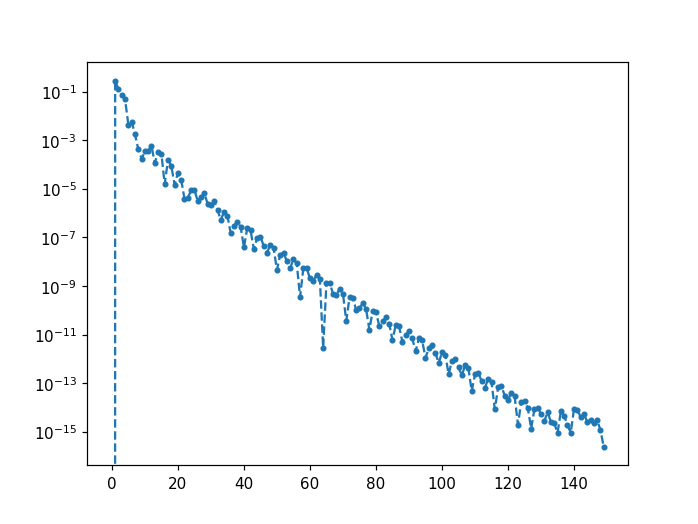

In [478]:
plt.figure()
plt.plot(abs(Pfur_0),'.--')
plt.yscale('log')

In [497]:
Vol,Sqr = get_VolSqr(Pfur_0,Zfur_0)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.6607415951194074

In [480]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


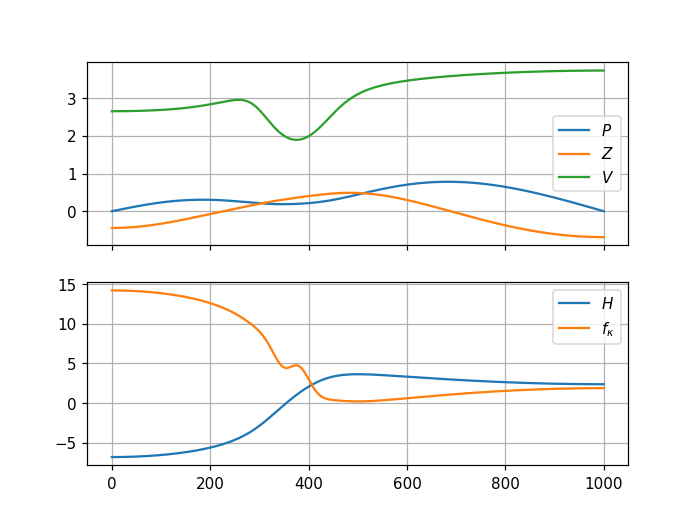

In [481]:
fig,axs = plt.subplots(2,1, sharex=True)
axs[0].plot(P)
axs[0].plot(Z)
axs[0].plot(V)
axs[0].grid()
axs[0].legend([r'$P$',r'$Z$',r'$V$'])

axs[1].plot(H)
axs[1].plot(force)
axs[1].legend([r'$H$',r'$f_\kappa$'])
axs[1].grid()

<IPython.core.display.Javascript object>


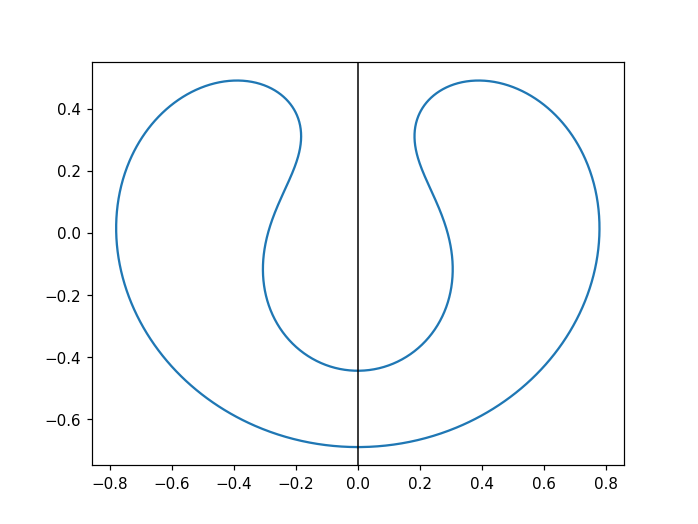

(-0.8567853693215028,
 0.8567853693215028,
 -0.7495981300337091,
 0.549914386364482)

In [288]:
plt.figure()
plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]))
plt.axvline(0, color='k', lw=1)
plt.axis('scaled')

<IPython.core.display.Javascript object>


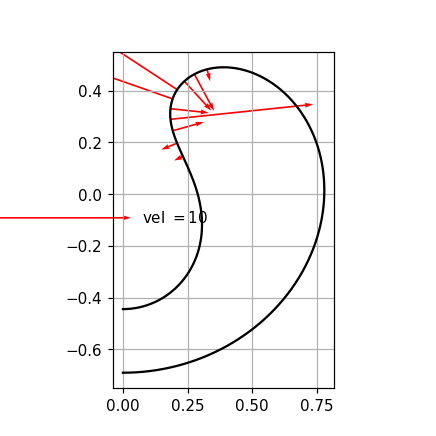

<IPython.core.display.Javascript object>


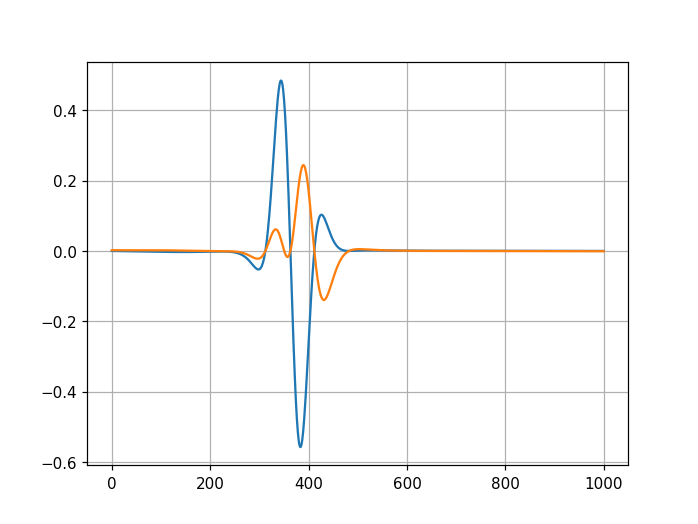

In [289]:
%matplotlib notebook
t_ = get_normal_velo_pz(Pfur_0,Zfur_0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


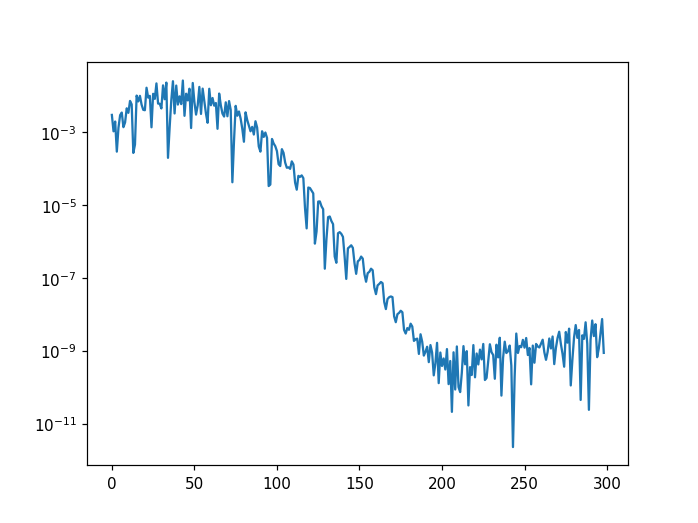

In [290]:
plt.figure()
plt.plot(abs(get_normal_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.yscale('log')

In [642]:
%timeit get_normal_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

1.46 ms ± 86.5 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


__________________________________________________

In [84]:
steps = np.logspace(-8,-5,2*N-1)[::-1]
j_fun = nd.Jacobian(get_normal_velo_fur_1d, step=steps)

In [85]:
jac_0 = j_fun(get_pz_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-1.98e+09 2.4843056442402065


In [482]:
t_max=0.3

In [86]:
rtol=1e-6
atol_arr = 1e-6/np.arange(1,len(get_pz_from_PZ_fur(Pfur_0, Zfur_0))+1)**4.5

In [87]:
atol_arr = np.logspace(-18,-6,2*N-1)[::-1]

In [483]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 500 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_normal_velo_fur_1d(pz)
jac = j_fun

In [484]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

0.0
[-6.17575787e-02  2.85653078e-01  7.99143544e-02 -1.22827359e-01
 -2.56474109e-01  7.05783883e-02 -1.23886573e-02  4.76815633e-02
  8.33110843e-03  4.30261890e-03 -7.33569389e-03 -5.74720727e-03
 -5.33901736e-03 -1.76202431e-03  8.68478289e-04  4.29832182e-04
  1.69765504e-03 -1.72191270e-04 -3.05569549e-04 -3.43593309e-04
 -9.63528301e-04  3.46898632e-04 -1.02232593e-04  5.98903885e-04
  5.18457194e-04  1.13165333e-04  2.86361665e-04 -3.39428338e-04
 -1.37023388e-04 -2.83794981e-04 -2.06522309e-04  1.52579984e-05
 -3.77694640e-05  1.57173817e-04  6.60468675e-05  8.88158872e-05
  4.21948035e-05 -1.45265257e-05 -1.94669355e-06 -4.41054078e-05
 -7.10052070e-06 -2.37287241e-05  1.23677802e-06 -3.85020382e-06
 -2.50775499e-06  4.28626233e-06 -8.65539744e-06  8.62883090e-06
 -4.24052745e-06  9.19580854e-06  4.62785875e-06  3.13205259e-06
  6.64004498e-06 -4.60968392e-06  1.71746592e-06 -6.59072152e-06
 -2.67202087e-06 -2.45118418e-06 -2.74814375e-06  2.14132842e-06
 -6.69419346e-07  3.1

0.0010113194696244531
[-6.17568763e-02  2.85653480e-01  7.99153187e-02 -1.22827041e-01
 -2.56473565e-01  7.05786815e-02 -1.23884957e-02  4.76811251e-02
  8.33094961e-03  4.30131405e-03 -7.33525468e-03 -5.74838904e-03
 -5.33829378e-03 -1.76227425e-03  8.68734672e-04  4.30234836e-04
  1.69745244e-03 -1.71500731e-04 -3.05489400e-04 -3.43286367e-04
 -9.63274716e-04  3.46446104e-04 -1.02429584e-04  5.98346056e-04
  5.18035771e-04  1.13206256e-04  2.86324700e-04 -3.38970389e-04
 -1.36685231e-04 -2.83550405e-04 -2.06303484e-04  1.50845620e-05
 -3.78952130e-05  1.56907435e-04  6.58208218e-05  8.87699999e-05
  4.21493037e-05 -1.43884312e-05 -1.82695594e-06 -4.39970473e-05
 -7.00335325e-06 -2.37449962e-05  1.22105719e-06 -3.91966159e-06
 -2.57257100e-06  4.25470982e-06 -8.68372440e-06  8.64583054e-06
 -4.22247931e-06  9.22076005e-06  4.65227650e-06  3.13880488e-06
  6.64532319e-06 -4.61614444e-06  1.70971126e-06 -6.59717316e-06
 -2.67858299e-06 -2.45319855e-06 -2.74925705e-06  2.14179459e-06
 -6

0.0037734174752679537
[-6.17563182e-02  2.85654378e-01  7.99162120e-02 -1.22826496e-01
 -2.56472605e-01  7.05786165e-02 -1.23877906e-02  4.76802906e-02
  8.33117154e-03  4.30031126e-03 -7.33506103e-03 -5.74876259e-03
 -5.33772054e-03 -1.76237748e-03  8.69404073e-04  4.30015682e-04
  1.69775327e-03 -1.71726807e-04 -3.05450770e-04 -3.43439789e-04
 -9.63345469e-04  3.46452744e-04 -1.02429673e-04  5.98428922e-04
  5.18092237e-04  1.13244292e-04  2.86347588e-04 -3.38989865e-04
 -1.36705304e-04 -2.83576876e-04 -2.06323506e-04  1.50788767e-05
 -3.78949490e-05  1.56913885e-04  6.58291865e-05  8.87749289e-05
  4.21526536e-05 -1.43871215e-05 -1.82814318e-06 -4.39966688e-05
 -7.00426269e-06 -2.37452949e-05  1.22107188e-06 -3.92118921e-06
 -2.57309351e-06  4.25321904e-06 -8.68452305e-06  8.64590130e-06
 -4.22237030e-06  9.22200927e-06  4.65317045e-06  3.13968255e-06
  6.64585889e-06 -4.61633351e-06  1.70941173e-06 -6.59782633e-06
 -2.67913838e-06 -2.45352893e-06 -2.74942698e-06  2.14191310e-06
 -6

0.013622475877171263
[-6.17564974e-02  2.85655845e-01  7.99159552e-02 -1.22826003e-01
 -2.56471470e-01  7.05778956e-02 -1.23874094e-02  4.76794107e-02
  8.33089913e-03  4.29939487e-03 -7.33582337e-03 -5.74822544e-03
 -5.33722022e-03 -1.76150272e-03  8.70219676e-04  4.29963941e-04
  1.69767937e-03 -1.72266870e-04 -3.05978727e-04 -3.43646695e-04
 -9.63525617e-04  3.46635859e-04 -1.02223574e-04  5.98614145e-04
  5.18286201e-04  1.13244247e-04  2.86342965e-04 -3.39072595e-04
 -1.36797025e-04 -2.83615269e-04 -2.06367002e-04  1.50926737e-05
 -3.78804135e-05  1.56932302e-04  6.58510093e-05  8.87787714e-05
  4.21589315e-05 -1.43880291e-05 -1.82880686e-06 -4.39959966e-05
 -7.00467104e-06 -2.37465086e-05  1.21876358e-06 -3.92514868e-06
 -2.57746679e-06  4.25106995e-06 -8.68643557e-06  8.64787457e-06
 -4.21991606e-06  9.22510000e-06  4.65658692e-06  3.14040667e-06
  6.64659497e-06 -4.61782865e-06  1.70771894e-06 -6.59920647e-06
 -2.68071420e-06 -2.45357191e-06 -2.74952882e-06  2.14258790e-06
 -6.

0.025061183140121773
[-6.17568238e-02  2.85657114e-01  7.99151381e-02 -1.22825777e-01
 -2.56470332e-01  7.05771555e-02 -1.23874220e-02  4.76789281e-02
  8.33057781e-03  4.29867038e-03 -7.33681764e-03 -5.74736036e-03
 -5.33676597e-03 -1.76055100e-03  8.70832071e-04  4.29878222e-04
  1.69740076e-03 -1.72753144e-04 -3.06529015e-04 -3.43775300e-04
 -9.63644250e-04  3.46834281e-04 -1.01995366e-04  5.98768489e-04
  5.18457668e-04  1.13222055e-04  2.86319055e-04 -3.39151862e-04
 -1.36886688e-04 -2.83642404e-04 -2.06401705e-04  1.51104917e-05
 -3.78632931e-05  1.56948658e-04  6.58707964e-05  8.87805555e-05
  4.21639738e-05 -1.43894122e-05 -1.82922568e-06 -4.39955171e-05
 -7.00511642e-06 -2.37479250e-05  1.21596807e-06 -3.92874913e-06
 -2.58181758e-06  4.24962976e-06 -8.68776662e-06  8.65010528e-06
 -4.21712366e-06  9.22780577e-06  4.65976148e-06  3.14066760e-06
  6.64694988e-06 -4.61939003e-06  1.70595258e-06 -6.60035085e-06
 -2.68210929e-06 -2.45342330e-06 -2.74948710e-06  2.14326419e-06
 -6.

0.031137166087026904
[-6.17569866e-02  2.85657759e-01  7.99146969e-02 -1.22825672e-01
 -2.56469736e-01  7.05767789e-02 -1.23874485e-02  4.76786954e-02
  8.33041980e-03  4.29829826e-03 -7.33733813e-03 -5.74690324e-03
 -5.33652679e-03 -1.76006714e-03  8.71137092e-04  4.29831192e-04
  1.69725230e-03 -1.72999712e-04 -3.06809280e-04 -3.43838269e-04
 -9.63702164e-04  3.46936003e-04 -1.01878235e-04  5.98846187e-04
  5.18544219e-04  1.13210016e-04  2.86306132e-04 -3.39192166e-04
 -1.36932353e-04 -2.83655881e-04 -2.06419086e-04  1.51196937e-05
 -3.78544566e-05  1.56956926e-04  6.58808298e-05  8.87814073e-05
  4.21665069e-05 -1.43901225e-05 -1.82943563e-06 -4.39952781e-05
 -7.00535316e-06 -2.37486601e-05  1.21452085e-06 -3.93057799e-06
 -2.58403432e-06  4.24891913e-06 -8.68842097e-06  8.65125409e-06
 -4.21568486e-06  9.22917448e-06  4.66137197e-06  3.14078510e-06
  6.64711572e-06 -4.62018934e-06  1.70504755e-06 -6.60092713e-06
 -2.68281476e-06 -2.45334121e-06 -2.74946008e-06  2.14360927e-06
 -6.

0.036311784239069105
[-6.17571226e-02  2.85658300e-01  7.99143251e-02 -1.22825585e-01
 -2.56469235e-01  7.05764635e-02 -1.23874725e-02  4.76785015e-02
  8.33028798e-03  4.29798617e-03 -7.33777540e-03 -5.74651888e-03
 -5.33632568e-03 -1.75966190e-03  8.71392033e-04  4.29791494e-04
  1.69712739e-03 -1.73206174e-04 -3.07044052e-04 -3.43890805e-04
 -9.63750464e-04  3.47021270e-04 -1.01780041e-04  5.98911195e-04
  5.18616653e-04  1.13199871e-04  2.86295244e-04 -3.39225919e-04
 -1.36970602e-04 -2.83667141e-04 -2.06433620e-04  1.51274101e-05
 -3.78470468e-05  1.56963844e-04  6.58892284e-05  8.87821164e-05
  4.21686261e-05 -1.43907160e-05 -1.82960929e-06 -4.39950773e-05
 -7.00555130e-06 -2.37492777e-05  1.21330592e-06 -3.93211061e-06
 -2.58589230e-06  4.24832550e-06 -8.68896735e-06  8.65221789e-06
 -4.21447780e-06  9.23032061e-06  4.66272090e-06  3.14088227e-06
  6.64725340e-06 -4.62085939e-06  1.70428882e-06 -6.60140943e-06
 -2.68340541e-06 -2.45327191e-06 -2.74943697e-06  2.14389842e-06
 -6.

0.04469203855697139
[-6.17573388e-02  2.85659160e-01  7.99137326e-02 -1.22825446e-01
 -2.56468437e-01  7.05759617e-02 -1.23875115e-02  4.76781936e-02
  8.33007857e-03  4.29748954e-03 -7.33847154e-03 -5.74590681e-03
 -5.33600540e-03 -1.75901739e-03  8.71797274e-04  4.29728204e-04
  1.69692844e-03 -1.73534524e-04 -3.07417470e-04 -3.43974262e-04
 -9.63827183e-04  3.47156912e-04 -1.01623828e-04  5.99014549e-04
  5.18731824e-04  1.13183708e-04  2.86277900e-04 -3.39279592e-04
 -1.37031429e-04 -2.83685033e-04 -2.06456723e-04  1.51396827e-05
 -3.78352621e-05  1.56974840e-04  6.59025792e-05  8.87832424e-05
  4.21719959e-05 -1.43916560e-05 -1.82988110e-06 -4.39947558e-05
 -7.00586457e-06 -2.37502618e-05  1.21137132e-06 -3.93455024e-06
 -2.58884965e-06  4.24738166e-06 -8.68983601e-06  8.65375216e-06
 -4.21255644e-06  9.23214397e-06  4.66486692e-06  3.14103629e-06
  6.64747187e-06 -4.62192559e-06  1.70308152e-06 -6.60217649e-06
 -2.68434487e-06 -2.45316148e-06 -2.74940003e-06  2.14435839e-06
 -6.6

0.05520794740710709
[-6.17576033e-02  2.85660213e-01  7.99130067e-02 -1.22825277e-01
 -2.56467459e-01  7.05753473e-02 -1.23875594e-02  4.76778167e-02
  8.32982224e-03  4.29688123e-03 -7.33932428e-03 -5.74515703e-03
 -5.33561302e-03 -1.75822811e-03  8.72293475e-04  4.29650647e-04
  1.69668473e-03 -1.73936603e-04 -3.07874755e-04 -3.44076424e-04
 -9.63921098e-04  3.47323015e-04 -1.01432532e-04  5.99141091e-04
  5.18872837e-04  1.13163911e-04  2.86256655e-04 -3.39345301e-04
 -1.37105901e-04 -2.83706934e-04 -2.06485004e-04  1.51547032e-05
 -3.78208393e-05  1.56988293e-04  6.59189173e-05  8.87846213e-05
  4.21761227e-05 -1.43927997e-05 -1.83020648e-06 -4.39943581e-05
 -7.00624430e-06 -2.37514691e-05  1.20899982e-06 -3.93754130e-06
 -2.59247480e-06  4.24622518e-06 -8.69090041e-06  8.65563249e-06
 -4.21020204e-06  9.23437798e-06  4.66749610e-06  3.14122484e-06
  6.64773935e-06 -4.62323175e-06  1.70160254e-06 -6.60311609e-06
 -2.68549560e-06 -2.45302625e-06 -2.74935479e-06  2.14492174e-06
 -6.6

0.057719794789318955
[-6.17576655e-02  2.85660460e-01  7.99128362e-02 -1.22825237e-01
 -2.56467229e-01  7.05752029e-02 -1.23875707e-02  4.76777281e-02
  8.32976202e-03  4.29673832e-03 -7.33952459e-03 -5.74498090e-03
 -5.33552084e-03 -1.75804271e-03  8.72410035e-04  4.29632427e-04
  1.69662748e-03 -1.74031049e-04 -3.07982170e-04 -3.44100420e-04
 -9.63943157e-04  3.47362031e-04 -1.01387599e-04  5.99170812e-04
  5.18905958e-04  1.13159261e-04  2.86251666e-04 -3.39360733e-04
 -1.37123391e-04 -2.83712077e-04 -2.06491646e-04  1.51582298e-05
 -3.78174531e-05  1.56991452e-04  6.59227533e-05  8.87849453e-05
  4.21770922e-05 -1.43930672e-05 -1.83028171e-06 -4.39942640e-05
 -7.00633284e-06 -2.37517531e-05  1.20844243e-06 -3.93824446e-06
 -2.59332690e-06  4.24595337e-06 -8.69115059e-06  8.65607439e-06
 -4.20964878e-06  9.23490293e-06  4.66811389e-06  3.14126915e-06
  6.64780220e-06 -4.62353863e-06  1.70125506e-06 -6.60333685e-06
 -2.68576595e-06 -2.45299450e-06 -2.74934417e-06  2.14505407e-06
 -6.

0.0633744696167199
[-6.17578039e-02  2.85661012e-01  7.99124563e-02 -1.22825149e-01
 -2.56466718e-01  7.05748814e-02 -1.23875958e-02  4.76775308e-02
  8.32962789e-03  4.29641993e-03 -7.33997085e-03 -5.74458853e-03
 -5.33531548e-03 -1.75762967e-03  8.72669718e-04  4.29591838e-04
  1.69649994e-03 -1.74241456e-04 -3.08221468e-04 -3.44153878e-04
 -9.63992301e-04  3.47448946e-04 -1.01287501e-04  5.99237023e-04
  5.18979742e-04  1.13148905e-04  2.86240552e-04 -3.39395109e-04
 -1.37162352e-04 -2.83723534e-04 -2.06506442e-04  1.51660842e-05
 -3.78099115e-05  1.56998486e-04  6.59312969e-05  8.87856672e-05
  4.21792521e-05 -1.43936614e-05 -1.83044766e-06 -4.39940536e-05
 -7.00652921e-06 -2.37523861e-05  1.20720020e-06 -3.93981175e-06
 -2.59522602e-06  4.24534762e-06 -8.69170816e-06  8.65705912e-06
 -4.20841596e-06  9.23607271e-06  4.66949047e-06  3.14136790e-06
  6.64794226e-06 -4.62422241e-06  1.70048085e-06 -6.60382874e-06
 -2.68636833e-06 -2.45292377e-06 -2.74932054e-06  2.14534890e-06
 -6.64

0.07093164425106442
[-6.17579859e-02  2.85661736e-01  7.99119572e-02 -1.22825032e-01
 -2.56466045e-01  7.05744588e-02 -1.23876288e-02  4.76772716e-02
  8.32945162e-03  4.29600151e-03 -7.34055728e-03 -5.74407293e-03
 -5.33504560e-03 -1.75708690e-03  8.73010976e-04  4.29538501e-04
  1.69633234e-03 -1.74517941e-04 -3.08535919e-04 -3.44224124e-04
 -9.64056880e-04  3.47563151e-04 -1.01155975e-04  5.99324022e-04
  5.19076691e-04  1.13135299e-04  2.86225950e-04 -3.39440272e-04
 -1.37213540e-04 -2.83738586e-04 -2.06525882e-04  1.51764004e-05
 -3.78000063e-05  1.57007725e-04  6.59425187e-05  8.87866163e-05
  4.21820907e-05 -1.43944388e-05 -1.83066230e-06 -4.39937752e-05
 -7.00678537e-06 -2.37532189e-05  1.20556691e-06 -3.94187292e-06
 -2.59772322e-06  4.24455118e-06 -8.69244129e-06  8.65835371e-06
 -4.20679538e-06  9.23761045e-06  4.67129995e-06  3.14149774e-06
  6.64812638e-06 -4.62512113e-06  1.69946329e-06 -6.60447527e-06
 -2.68716005e-06 -2.45283088e-06 -2.74928953e-06  2.14573635e-06
 -6.6

0.08069264749500112
[-6.17582157e-02  2.85662651e-01  7.99113265e-02 -1.22824885e-01
 -2.56465196e-01  7.05739249e-02 -1.23876704e-02  4.76769439e-02
  8.32922894e-03  4.29547282e-03 -7.34129817e-03 -5.74342155e-03
 -5.33470461e-03 -1.75640118e-03  8.73442143e-04  4.29471117e-04
  1.69612062e-03 -1.74867240e-04 -3.08933183e-04 -3.44312869e-04
 -9.64138467e-04  3.47707424e-04 -1.00989821e-04  5.99433922e-04
  5.19199162e-04  1.13118115e-04  2.86207509e-04 -3.39497316e-04
 -1.37278196e-04 -2.83757599e-04 -2.06550438e-04  1.51894256e-05
 -3.77875004e-05  1.57019388e-04  6.59566879e-05  8.87878158e-05
  4.21856775e-05 -1.43954153e-05 -1.83092786e-06 -4.39934204e-05
 -7.00710593e-06 -2.37542726e-05  1.20350195e-06 -3.94447958e-06
 -2.60088076e-06  4.24354423e-06 -8.69336827e-06  8.65999019e-06
 -4.20474706e-06  9.23955410e-06  4.67358692e-06  3.14166190e-06
  6.64835912e-06 -4.62625686e-06  1.69817742e-06 -6.60529234e-06
 -2.68816053e-06 -2.45271359e-06 -2.74925043e-06  2.14622587e-06
 -6.6

0.08884876475780656
[-6.17584034e-02  2.85663398e-01  7.99108116e-02 -1.22824765e-01
 -2.56464502e-01  7.05734889e-02 -1.23877044e-02  4.76766763e-02
  8.32904707e-03  4.29504100e-03 -7.34190324e-03 -5.74288959e-03
 -5.33442612e-03 -1.75584115e-03  8.73794295e-04  4.29416088e-04
  1.69594772e-03 -1.75152502e-04 -3.09257618e-04 -3.44385344e-04
 -9.64205099e-04  3.47825239e-04 -1.00854138e-04  5.99523667e-04
  5.19299172e-04  1.13104086e-04  2.86192453e-04 -3.39543892e-04
 -1.37330988e-04 -2.83773123e-04 -2.06570488e-04  1.52000565e-05
 -3.77772936e-05  1.57028907e-04  6.59682530e-05  8.87887960e-05
  4.21886071e-05 -1.43962082e-05 -1.83114011e-06 -4.39931282e-05
 -7.00736520e-06 -2.37551344e-05  1.20181427e-06 -3.94661059e-06
 -2.60346166e-06  4.24272126e-06 -8.69412594e-06  8.66132745e-06
 -4.20307346e-06  9.24114222e-06  4.67545541e-06  3.14179608e-06
  6.64854930e-06 -4.62718465e-06  1.69712702e-06 -6.60595983e-06
 -2.68897782e-06 -2.45261787e-06 -2.74921855e-06  2.14662568e-06
 -6.6

0.10133781535064218
[-6.17586833e-02  2.85664513e-01  7.99100435e-02 -1.22824585e-01
 -2.56463467e-01  7.05728385e-02 -1.23877550e-02  4.76762771e-02
  8.32877582e-03  4.29439686e-03 -7.34280572e-03 -5.74209619e-03
 -5.33401070e-03 -1.75500585e-03  8.74319574e-04  4.29334012e-04
  1.69568984e-03 -1.75577965e-04 -3.09741508e-04 -3.44493438e-04
 -9.64304481e-04  3.48000944e-04 -1.00651784e-04  5.99657507e-04
  5.19448322e-04  1.13083169e-04  2.86170004e-04 -3.39613340e-04
 -1.37409707e-04 -2.83796271e-04 -2.06600388e-04  1.52159014e-05
 -3.77620812e-05  1.57043093e-04  6.59854910e-05  8.87902586e-05
  4.21929774e-05 -1.43973830e-05 -1.83144894e-06 -4.39926882e-05
 -7.00774766e-06 -2.37564218e-05  1.19929502e-06 -3.94979268e-06
 -2.60731475e-06  4.24149277e-06 -8.69525705e-06  8.66332327e-06
 -4.20057600e-06  9.24351218e-06  4.67824355e-06  3.14199637e-06
  6.64883313e-06 -4.62856890e-06  1.69555991e-06 -6.60695575e-06
 -2.69019715e-06 -2.45247519e-06 -2.74917110e-06  2.14722205e-06
 -6.6

0.11088933892137444
[-6.17588914e-02  2.85665342e-01  7.99094724e-02 -1.22824452e-01
 -2.56462697e-01  7.05723549e-02 -1.23877926e-02  4.76759802e-02
  8.32857412e-03  4.29391780e-03 -7.34347682e-03 -5.74150623e-03
 -5.33370177e-03 -1.75438470e-03  8.74710209e-04  4.29272981e-04
  1.69549809e-03 -1.75894337e-04 -3.10101328e-04 -3.44573815e-04
 -9.64378383e-04  3.48131587e-04 -1.00501326e-04  5.99757019e-04
  5.19559218e-04  1.13067621e-04  2.86153317e-04 -3.39664967e-04
 -1.37468229e-04 -2.83813479e-04 -2.06622617e-04  1.52276753e-05
 -3.77507777e-05  1.57053633e-04  6.59983007e-05  8.87913469e-05
  4.21962277e-05 -1.43982506e-05 -1.83167258e-06 -4.39923578e-05
 -7.00802877e-06 -2.37573809e-05  1.19742006e-06 -3.95216175e-06
 -2.61018278e-06  4.24057846e-06 -8.69609895e-06  8.66480839e-06
 -4.19871788e-06  9.24527549e-06  4.68031781e-06  3.14214545e-06
  6.64904433e-06 -4.62959857e-06  1.69439426e-06 -6.60769660e-06
 -2.69110413e-06 -2.45236917e-06 -2.74913589e-06  2.14766555e-06
 -6.6

0.12201763527199237
[-6.17591276e-02  2.85666283e-01  7.99088243e-02 -1.22824300e-01
 -2.56461824e-01  7.05718061e-02 -1.23878353e-02  4.76756432e-02
  8.32834522e-03  4.29337408e-03 -7.34423841e-03 -5.74083674e-03
 -5.33335116e-03 -1.75367980e-03  8.75153549e-04  4.29203723e-04
  1.69528050e-03 -1.76253362e-04 -3.10509659e-04 -3.44665028e-04
 -9.64462250e-04  3.48279833e-04 -1.00330597e-04  5.99869938e-04
  5.19685054e-04  1.13049983e-04  2.86134386e-04 -3.39723541e-04
 -1.37534625e-04 -2.83833003e-04 -2.06647838e-04  1.52410278e-05
 -3.77379590e-05  1.57065586e-04  6.60128285e-05  8.87925825e-05
  4.21999168e-05 -1.43992290e-05 -1.83192017e-06 -4.39919794e-05
 -7.00834440e-06 -2.37584709e-05  1.19529062e-06 -3.95485320e-06
 -2.61344046e-06  4.23954004e-06 -8.69705522e-06  8.66649479e-06
 -4.19660818e-06  9.24727759e-06  4.68267279e-06  3.14231478e-06
  6.64928415e-06 -4.63076743e-06  1.69307109e-06 -6.60853762e-06
 -2.69213367e-06 -2.45224893e-06 -2.74909601e-06  2.14816888e-06
 -6.6

0.13448663953020917
[-6.17593844e-02  2.85667306e-01  7.99081196e-02 -1.22824135e-01
 -2.56460874e-01  7.05712092e-02 -1.23878816e-02  4.76752766e-02
  8.32809632e-03  4.29278277e-03 -7.34506657e-03 -5.74010876e-03
 -5.33296987e-03 -1.75291328e-03  8.75635671e-04  4.29128414e-04
  1.69504390e-03 -1.76643753e-04 -3.10953665e-04 -3.44764209e-04
 -9.64553446e-04  3.48441017e-04 -1.00144967e-04  5.99992708e-04
  5.19821870e-04  1.13030810e-04  2.86113808e-04 -3.39787214e-04
 -1.37606804e-04 -2.83854228e-04 -2.06675257e-04  1.52555364e-05
 -3.77240309e-05  1.57078572e-04  6.60286150e-05  8.87939269e-05
  4.22039289e-05 -1.44002854e-05 -1.83218192e-06 -4.39915639e-05
 -7.00868351e-06 -2.37596582e-05  1.19297309e-06 -3.95778339e-06
 -2.61698635e-06  4.23840988e-06 -8.69809605e-06  8.66832981e-06
 -4.19431290e-06  9.24945587e-06  4.68523477e-06  3.14249907e-06
  6.64954510e-06 -4.63203885e-06  1.69163189e-06 -6.60945248e-06
 -2.69325352e-06 -2.45211828e-06 -2.74905274e-06  2.14871624e-06
 -6.6

0.14486050578193096
[-6.17595920e-02  2.85668133e-01  7.99075502e-02 -1.22824002e-01
 -2.56460106e-01  7.05707268e-02 -1.23879190e-02  4.76749803e-02
  8.32789517e-03  4.29230482e-03 -7.34573587e-03 -5.73952044e-03
 -5.33266170e-03 -1.75229378e-03  8.76025345e-04  4.29067553e-04
  1.69485270e-03 -1.76959254e-04 -3.11312498e-04 -3.44844363e-04
 -9.64627150e-04  3.48571271e-04 -9.99949588e-05  6.00091917e-04
  5.19932431e-04  1.13015321e-04  2.86097183e-04 -3.39838659e-04
 -1.37665124e-04 -2.83871377e-04 -2.06697412e-04  1.52672538e-05
 -3.77127826e-05  1.57089060e-04  6.60413650e-05  8.87950139e-05
  4.22071720e-05 -1.44011335e-05 -1.83238775e-06 -4.39912251e-05
 -7.00895445e-06 -2.37606194e-05  1.19109857e-06 -3.96015420e-06
 -2.61985476e-06  4.23749576e-06 -8.69893799e-06  8.66981378e-06
 -4.19245696e-06  9.25121725e-06  4.68730626e-06  3.14264814e-06
  6.64975612e-06 -4.63306670e-06  1.69046844e-06 -6.61019210e-06
 -2.69415882e-06 -2.45201276e-06 -2.74901784e-06  2.14915863e-06
 -6.6

0.1649928212842658
[-6.17599795e-02  2.85669678e-01  7.99064869e-02 -1.22823753e-01
 -2.56458672e-01  7.05698261e-02 -1.23879887e-02  4.76744270e-02
  8.32751957e-03  4.29141225e-03 -7.34698561e-03 -5.73842197e-03
 -5.33208622e-03 -1.75113705e-03  8.76753016e-04  4.28953915e-04
  1.69449570e-03 -1.77548344e-04 -3.11982497e-04 -3.44994022e-04
 -9.64764771e-04  3.48814451e-04 -9.97148967e-05  6.00277134e-04
  5.20138840e-04  1.12986414e-04  2.86066154e-04 -3.39934683e-04
 -1.37773984e-04 -2.83903386e-04 -2.06738769e-04  1.52891131e-05
 -3.76917994e-05  1.57108622e-04  6.60651520e-05  8.87970451e-05
  4.22132286e-05 -1.44027033e-05 -1.83275846e-06 -4.39905850e-05
 -7.00945289e-06 -2.37624178e-05  1.18759482e-06 -3.96458744e-06
 -2.62521710e-06  4.23578709e-06 -8.70051191e-06  8.67258693e-06
 -4.18898930e-06  9.25450835e-06  4.69117636e-06  3.14292679e-06
  6.65015046e-06 -4.63498666e-06  1.68829530e-06 -6.61157375e-06
 -2.69584979e-06 -2.45181592e-06 -2.74895285e-06  2.14998475e-06
 -6.59

0.17362948643006448
[-6.17601397e-02  2.85670317e-01  7.99060471e-02 -1.22823650e-01
 -2.56458079e-01  7.05694535e-02 -1.23880175e-02  4.76741980e-02
  8.32736422e-03  4.29104302e-03 -7.34750253e-03 -5.73796765e-03
 -5.33184818e-03 -1.75065860e-03  8.77054016e-04  4.28906915e-04
  1.69434805e-03 -1.77791993e-04 -3.12259612e-04 -3.45055920e-04
 -9.64821693e-04  3.48915022e-04 -9.95990729e-05  6.00353731e-04
  5.20224202e-04  1.12974462e-04  2.86053326e-04 -3.39974387e-04
 -1.37818996e-04 -2.83916622e-04 -2.06755870e-04  1.52981469e-05
 -3.76831279e-05  1.57116705e-04  6.60749830e-05  8.87978857e-05
  4.22157341e-05 -1.44033475e-05 -1.83290660e-06 -4.39903174e-05
 -7.00965621e-06 -2.37631630e-05  1.18614424e-06 -3.96642352e-06
 -2.62743747e-06  4.23507968e-06 -8.70116359e-06  8.67373479e-06
 -4.18755418e-06  9.25587043e-06  4.69277792e-06  3.14304217e-06
  6.65031368e-06 -4.63578106e-06  1.68739618e-06 -6.61214544e-06
 -2.69654942e-06 -2.45173457e-06 -2.74892604e-06  2.15032647e-06
 -6.5

0.1813273764629183
[-6.17602796e-02  2.85670874e-01  7.99056632e-02 -1.22823560e-01
 -2.56457561e-01  7.05691282e-02 -1.23880427e-02  4.76739981e-02
  8.32722859e-03  4.29072062e-03 -7.34795383e-03 -5.73757099e-03
 -5.33164034e-03 -1.75024088e-03  8.77316825e-04  4.28865880e-04
  1.69421914e-03 -1.78004713e-04 -3.12501550e-04 -3.45109961e-04
 -9.64871390e-04  3.49002823e-04 -9.94979566e-05  6.00420601e-04
  5.20298723e-04  1.12964031e-04  2.86042128e-04 -3.40009045e-04
 -1.37858289e-04 -2.83928176e-04 -2.06770799e-04  1.53060305e-05
 -3.76755607e-05  1.57123759e-04  6.60835626e-05  8.87986199e-05
  4.22179218e-05 -1.44039073e-05 -1.83303345e-06 -4.39900825e-05
 -7.00983237e-06 -2.37638144e-05  1.18487711e-06 -3.96802773e-06
 -2.62937718e-06  4.23446173e-06 -8.70173289e-06  8.67473737e-06
 -4.18630082e-06  9.25706004e-06  4.69417661e-06  3.14314296e-06
  6.65045624e-06 -4.63647477e-06  1.68661105e-06 -6.61264469e-06
 -2.69716036e-06 -2.45166358e-06 -2.74890266e-06  2.15062483e-06
 -6.58

0.19470361438550152
[-6.17605163e-02  2.85671818e-01  7.99050136e-02 -1.22823408e-01
 -2.56456685e-01  7.05685778e-02 -1.23880852e-02  4.76736598e-02
  8.32699910e-03  4.29017506e-03 -7.34871745e-03 -5.73689987e-03
 -5.33128864e-03 -1.74953407e-03  8.77761532e-04  4.28796451e-04
  1.69400104e-03 -1.78364637e-04 -3.12910911e-04 -3.45201398e-04
 -9.64955479e-04  3.49151372e-04 -9.93268781e-05  6.00533736e-04
  5.20424805e-04  1.12946385e-04  2.86023186e-04 -3.40067674e-04
 -1.37924759e-04 -2.83947721e-04 -2.06796055e-04  1.53193621e-05
 -3.76627643e-05  1.57135687e-04  6.60980717e-05  8.87998626e-05
  4.22216240e-05 -1.44048494e-05 -1.83324282e-06 -4.39896821e-05
 -7.01012754e-06 -2.37649179e-05  1.18273169e-06 -3.97074459e-06
 -2.63266172e-06  4.23341545e-06 -8.70269688e-06  8.67643464e-06
 -4.18417922e-06  9.25907375e-06  4.69654409e-06  3.14331361e-06
  6.65069758e-06 -4.63764884e-06  1.68528229e-06 -6.61348966e-06
 -2.69819433e-06 -2.45154353e-06 -2.74886317e-06  2.15112969e-06
 -6.5

0.20041748522819586
[-6.17606150e-02  2.85672212e-01  7.99047428e-02 -1.22823345e-01
 -2.56456320e-01  7.05683483e-02 -1.23881029e-02  4.76735187e-02
  8.32690341e-03  4.28994756e-03 -7.34903587e-03 -5.73662003e-03
 -5.33114198e-03 -1.74923935e-03  8.77946974e-04  4.28767501e-04
  1.69391010e-03 -1.78514713e-04 -3.13081602e-04 -3.45239524e-04
 -9.64990542e-04  3.49213309e-04 -9.92555479e-05  6.00580907e-04
  5.20477373e-04  1.12939029e-04  2.86015290e-04 -3.40092115e-04
 -1.37952471e-04 -2.83955869e-04 -2.06806584e-04  1.53249183e-05
 -3.76574314e-05  1.57140658e-04  6.61041188e-05  8.88003810e-05
  4.22231679e-05 -1.44052402e-05 -1.83332817e-06 -4.39895141e-05
 -7.01024954e-06 -2.37653785e-05  1.18183658e-06 -3.97187837e-06
 -2.63403220e-06  4.23297891e-06 -8.70309910e-06  8.67714268e-06
 -4.18329425e-06  9.25991374e-06  4.69753158e-06  3.14338482e-06
  6.65079826e-06 -4.63813851e-06  1.68472813e-06 -6.61384208e-06
 -2.69862555e-06 -2.45149350e-06 -2.74884673e-06  2.15134021e-06
 -6.5

0.21759485027870332
[-6.17609033e-02  2.85673361e-01  7.99039517e-02 -1.22823159e-01
 -2.56455253e-01  7.05676779e-02 -1.23881546e-02  4.76731066e-02
  8.32662391e-03  4.28928298e-03 -7.34996591e-03 -5.73580268e-03
 -5.33071359e-03 -1.74837850e-03  8.78488659e-04  4.28682944e-04
  1.69364449e-03 -1.78953059e-04 -3.13580160e-04 -3.45350882e-04
 -9.65092957e-04  3.49394204e-04 -9.90472183e-05  6.00718672e-04
  5.20630904e-04  1.12917550e-04  2.85992232e-04 -3.40163490e-04
 -1.38033396e-04 -2.83979664e-04 -2.06837334e-04  1.53411376e-05
 -3.76418640e-05  1.57155168e-04  6.61217719e-05  8.88018959e-05
  4.22276779e-05 -1.44063753e-05 -1.83357085e-06 -4.39890198e-05
 -7.01060230e-06 -2.37667259e-05  1.17922032e-06 -3.97519312e-06
 -2.63803832e-06  4.23170298e-06 -8.70427481e-06  8.67921187e-06
 -4.18070830e-06  9.26236830e-06  4.70041699e-06  3.14359295e-06
  6.65109249e-06 -4.63956911e-06  1.68310915e-06 -6.61487174e-06
 -2.69988538e-06 -2.45134745e-06 -2.74879879e-06  2.15195516e-06
 -6.5

0.2365030494302966
[-6.17612065e-02  2.85674571e-01  7.99031197e-02 -1.22822964e-01
 -2.56454130e-01  7.05669727e-02 -1.23882090e-02  4.76726730e-02
  8.32632993e-03  4.28858385e-03 -7.35094418e-03 -5.73494300e-03
 -5.33026295e-03 -1.74747301e-03  8.79058478e-04  4.28594006e-04
  1.69336513e-03 -1.79414115e-04 -3.14104550e-04 -3.45468008e-04
 -9.65200681e-04  3.49584453e-04 -9.88281169e-05  6.00863556e-04
  5.20792371e-04  1.12894968e-04  2.85967990e-04 -3.40238538e-04
 -1.38118488e-04 -2.84004684e-04 -2.06869669e-04  1.53581824e-05
 -3.76255049e-05  1.57170414e-04  6.61403245e-05  8.88034903e-05
  4.22324225e-05 -1.44075585e-05 -1.83381552e-06 -4.39884942e-05
 -7.01096752e-06 -2.37681460e-05  1.17646562e-06 -3.97868468e-06
 -2.64225708e-06  4.23035951e-06 -8.70551289e-06  8.68139006e-06
 -4.17798657e-06  9.26495184e-06  4.70345370e-06  3.14381211e-06
  6.65140221e-06 -4.64107445e-06  1.68140566e-06 -6.61595526e-06
 -2.70121099e-06 -2.45119396e-06 -2.74874850e-06  2.15260204e-06
 -6.56

0.24763673933153105
[-6.17613784e-02  2.85675256e-01  7.99026480e-02 -1.22822854e-01
 -2.56453493e-01  7.05665729e-02 -1.23882397e-02  4.76724271e-02
  8.32616326e-03  4.28818743e-03 -7.35149880e-03 -5.73445563e-03
 -5.33000744e-03 -1.74695965e-03  8.79381556e-04  4.28543586e-04
  1.69320675e-03 -1.79675501e-04 -3.14401842e-04 -3.45534410e-04
 -9.65261754e-04  3.49692301e-04 -9.87039120e-05  6.00945687e-04
  5.20883902e-04  1.12882170e-04  2.85954251e-04 -3.40281073e-04
 -1.38166718e-04 -2.84018865e-04 -2.06887997e-04  1.53678388e-05
 -3.76162373e-05  1.57179051e-04  6.61508357e-05  8.88043947e-05
  4.22351129e-05 -1.44082245e-05 -1.83394940e-06 -4.39881936e-05
 -7.01117194e-06 -2.37689524e-05  1.17490258e-06 -3.98066646e-06
 -2.64465114e-06  4.22959720e-06 -8.70621546e-06  8.68262577e-06
 -4.17644272e-06  9.26641733e-06  4.70517610e-06  3.14393648e-06
  6.65157791e-06 -4.64192815e-06  1.68043963e-06 -6.61656976e-06
 -2.70196274e-06 -2.45110701e-06 -2.74872005e-06  2.15296880e-06
 -6.5

0.25437845860460795
[-6.17614802e-02  2.85675662e-01  7.99023688e-02 -1.22822788e-01
 -2.56453116e-01  7.05663362e-02 -1.23882579e-02  4.76722815e-02
  8.32606458e-03  4.28795271e-03 -7.35182716e-03 -5.73416708e-03
 -5.32985616e-03 -1.74665571e-03  8.79572843e-04  4.28513735e-04
  1.69311299e-03 -1.79830252e-04 -3.14577851e-04 -3.45573722e-04
 -9.65297913e-04  3.49756149e-04 -9.86303808e-05  6.00994309e-04
  5.20938089e-04  1.12874595e-04  2.85946119e-04 -3.40306252e-04
 -1.38195268e-04 -2.84027260e-04 -2.06898847e-04  1.53735536e-05
 -3.76107528e-05  1.57184162e-04  6.61570564e-05  8.88049303e-05
  4.22367059e-05 -1.44086172e-05 -1.83402702e-06 -4.39880147e-05
 -7.01129206e-06 -2.37694303e-05  1.17397675e-06 -3.98184055e-06
 -2.64606931e-06  4.22914566e-06 -8.70663164e-06  8.68335763e-06
 -4.17552842e-06  9.26728524e-06  4.70619612e-06  3.14401015e-06
  6.65168197e-06 -4.64243367e-06  1.67986761e-06 -6.61693365e-06
 -2.70240788e-06 -2.45105555e-06 -2.74870323e-06  2.15318595e-06
 -6.5

0.2576816958376747
[-6.17615294e-02  2.85675859e-01  7.99022336e-02 -1.22822757e-01
 -2.56452934e-01  7.05662217e-02 -1.23882667e-02  4.76722111e-02
  8.32601684e-03  4.28783914e-03 -7.35198603e-03 -5.73402748e-03
 -5.32978296e-03 -1.74650866e-03  8.79665393e-04  4.28499292e-04
  1.69306763e-03 -1.79905122e-04 -3.14663007e-04 -3.45592742e-04
 -9.65315407e-04  3.49787039e-04 -9.85948063e-05  6.01017833e-04
  5.20964305e-04  1.12870931e-04  2.85942185e-04 -3.40318433e-04
 -1.38209080e-04 -2.84031321e-04 -2.06904096e-04  1.53763178e-05
 -3.76080999e-05  1.57186634e-04  6.61600654e-05  8.88051895e-05
  4.22374766e-05 -1.44088067e-05 -1.83406413e-06 -4.39879279e-05
 -7.01134994e-06 -2.37696616e-05  1.17352870e-06 -3.98240880e-06
 -2.64675565e-06  4.22892714e-06 -8.70683305e-06  8.68371179e-06
 -4.17508600e-06  9.26770523e-06  4.70668969e-06  3.14404580e-06
  6.65173233e-06 -4.64267827e-06  1.67959083e-06 -6.61710973e-06
 -2.70262327e-06 -2.45103066e-06 -2.74869510e-06  2.15329101e-06
 -6.55

0.2778199101564284
[-6.17618208e-02  2.85677022e-01  7.99014338e-02 -1.22822569e-01
 -2.56451854e-01  7.05655437e-02 -1.23883188e-02  4.76717940e-02
  8.32573420e-03  4.28716676e-03 -7.35292656e-03 -5.73320104e-03
 -5.32934962e-03 -1.74563809e-03  8.80213337e-04  4.28413792e-04
  1.69279908e-03 -1.80348364e-04 -3.15167140e-04 -3.45705340e-04
 -9.65418975e-04  3.49969900e-04 -9.83842135e-05  6.01157083e-04
  5.21119494e-04  1.12849241e-04  2.85918899e-04 -3.40390531e-04
 -1.38290834e-04 -2.84055359e-04 -2.06935166e-04  1.53926742e-05
 -3.75924028e-05  1.57201262e-04  6.61778709e-05  8.88067245e-05
  4.22420400e-05 -1.44099229e-05 -1.83427798e-06 -4.39874110e-05
 -7.01168936e-06 -2.37710327e-05  1.17087459e-06 -3.98577571e-06
 -2.65082169e-06  4.22763267e-06 -8.70802623e-06  8.68580947e-06
 -4.17246581e-06  9.27019256e-06  4.70961269e-06  3.14425701e-06
  6.65203060e-06 -4.64412670e-06  1.67795192e-06 -6.61815239e-06
 -2.70389867e-06 -2.45088339e-06 -2.74864703e-06  2.15391304e-06
 -6.54

0.28491808452971934
[-6.17619201e-02  2.85677418e-01  7.99011614e-02 -1.22822505e-01
 -2.56451487e-01  7.05653127e-02 -1.23883366e-02  4.76716519e-02
  8.32563794e-03  4.28693772e-03 -7.35324690e-03 -5.73291956e-03
 -5.32920202e-03 -1.74534158e-03  8.80399974e-04  4.28384672e-04
  1.69270762e-03 -1.80499326e-04 -3.15338841e-04 -3.45743689e-04
 -9.65454250e-04  3.50032176e-04 -9.83124931e-05  6.01204506e-04
  5.21172345e-04  1.12841857e-04  2.85910971e-04 -3.40415081e-04
 -1.38318673e-04 -2.84063544e-04 -2.06945746e-04  1.53982418e-05
 -3.75870599e-05  1.57206240e-04  6.61839320e-05  8.88072476e-05
  4.22435945e-05 -1.44103008e-05 -1.83434853e-06 -4.39872337e-05
 -7.01180371e-06 -2.37715003e-05  1.16997001e-06 -3.98692354e-06
 -2.65220763e-06  4.22719148e-06 -8.70843293e-06  8.68652430e-06
 -4.17157302e-06  9.27104010e-06  4.71060862e-06  3.14432900e-06
  6.65213224e-06 -4.64462014e-06  1.67739360e-06 -6.61850761e-06
 -2.70433316e-06 -2.45083326e-06 -2.74863069e-06  2.15412491e-06
 -6.5

0.2947947080077949
[-6.17620553e-02  2.85677957e-01  7.99007904e-02 -1.22822418e-01
 -2.56450986e-01  7.05649982e-02 -1.23883607e-02  4.76714583e-02
  8.32550682e-03  4.28662573e-03 -7.35368325e-03 -5.73253617e-03
 -5.32900095e-03 -1.74493769e-03  8.80654209e-04  4.28345008e-04
  1.69258304e-03 -1.80704954e-04 -3.15572719e-04 -3.45795925e-04
 -9.65502299e-04  3.50117000e-04 -9.82148054e-05  6.01269098e-04
  5.21244331e-04  1.12831799e-04  2.85900173e-04 -3.40448517e-04
 -1.38356589e-04 -2.84074692e-04 -2.06960156e-04  1.54058228e-05
 -3.75797847e-05  1.57213019e-04  6.61921852e-05  8.88079602e-05
  4.22457121e-05 -1.44108137e-05 -1.83444274e-06 -4.39869912e-05
 -7.01195844e-06 -2.37721378e-05  1.16873735e-06 -3.98848791e-06
 -2.65409634e-06  4.22659027e-06 -8.70898715e-06  8.68749830e-06
 -4.17035661e-06  9.27219487e-06  4.71196550e-06  3.14442710e-06
  6.65227074e-06 -4.64529238e-06  1.67663300e-06 -6.61899156e-06
 -2.70492507e-06 -2.45076500e-06 -2.74860845e-06  2.15441351e-06
 -6.54

In [498]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

##### Continue integrate

In [1915]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))

t_start = sol_t[j]
pz_start = sol_y[:,j]

In [589]:
t_start = sol_t[-1]
pz_start = sol_y[:,-1]

In [590]:
t_end = 5

In [591]:
sol_rad = sc.integrate.solve_ivp(fun_a, (t_start, t_end), pz_start, 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

2.622127832636322
[-6.17674939e-02  2.85699696e-01  7.98858638e-02 -1.22818901e-01
 -2.56430801e-01  7.05523297e-02 -1.23893217e-02  4.76636485e-02
  8.32022885e-03  4.27404721e-03 -7.37124999e-03 -5.71710787e-03
 -5.32089948e-03 -1.72867666e-03  8.90897948e-04  4.26748752e-04
  1.68757094e-03 -1.88980577e-04 -3.24985634e-04 -3.47897970e-04
 -9.67436605e-04  3.53527676e-04 -9.42869041e-05  6.03865618e-04
  5.24138242e-04  1.12428726e-04  2.85467293e-04 -3.41789970e-04
 -1.39878277e-04 -2.84522063e-04 -2.07538791e-04  1.57084243e-05
 -3.72894999e-05  1.57483313e-04  6.65217966e-05  8.88368241e-05
  4.23311055e-05 -1.44296655e-05 -1.83644370e-06 -4.39762569e-05
 -7.01720363e-06 -2.37982852e-05  1.11864008e-06 -4.05230662e-06
 -2.73096958e-06  4.20214976e-06 -8.73153968e-06  8.72700115e-06
 -4.12109940e-06  9.31897271e-06  4.76687771e-06  3.14841881e-06
  6.65788865e-06 -4.67245036e-06  1.64591910e-06 -6.63855302e-06
 -2.72883160e-06 -2.44804160e-06 -2.74773732e-06  2.16603968e-06
 -6.417

2.6274007021456356
[-6.17674941e-02  2.85699697e-01  7.98858631e-02 -1.22818901e-01
 -2.56430800e-01  7.05523292e-02 -1.23893218e-02  4.76636481e-02
  8.32022862e-03  4.27404667e-03 -7.37125074e-03 -5.71710721e-03
 -5.32089913e-03 -1.72867596e-03  8.90898388e-04  4.26748683e-04
  1.68757073e-03 -1.88980933e-04 -3.24986038e-04 -3.47898060e-04
 -9.67436688e-04  3.53527823e-04 -9.42867356e-05  6.03865729e-04
  5.24138366e-04  1.12428709e-04  2.85467274e-04 -3.41790027e-04
 -1.39878342e-04 -2.84522082e-04 -2.07538816e-04  1.57084372e-05
 -3.72894876e-05  1.57483325e-04  6.65218106e-05  8.88368254e-05
  4.23311091e-05 -1.44296662e-05 -1.83644371e-06 -4.39762564e-05
 -7.01720382e-06 -2.37982863e-05  1.11863791e-06 -4.05230940e-06
 -2.73097292e-06  4.20214870e-06 -8.73154066e-06  8.72700286e-06
 -4.12109728e-06  9.31897474e-06  4.76688008e-06  3.14841898e-06
  6.65788890e-06 -4.67245153e-06  1.64591778e-06 -6.63855387e-06
 -2.72883263e-06 -2.44804149e-06 -2.74773729e-06  2.16604018e-06
 -6.41

2.633414710852996
[-6.17674943e-02  2.85699698e-01  7.98858624e-02 -1.22818900e-01
 -2.56430799e-01  7.05523286e-02 -1.23893218e-02  4.76636478e-02
  8.32022837e-03  4.27404607e-03 -7.37125159e-03 -5.71710647e-03
 -5.32089874e-03 -1.72867518e-03  8.90898884e-04  4.26748606e-04
  1.68757048e-03 -1.88981332e-04 -3.24986493e-04 -3.47898162e-04
 -9.67436781e-04  3.53527987e-04 -9.42865461e-05  6.03865855e-04
  5.24138506e-04  1.12428690e-04  2.85467253e-04 -3.41790092e-04
 -1.39878416e-04 -2.84522104e-04 -2.07538844e-04  1.57084517e-05
 -3.72894737e-05  1.57483338e-04  6.65218264e-05  8.88368268e-05
  4.23311133e-05 -1.44296670e-05 -1.83644372e-06 -4.39762558e-05
 -7.01720402e-06 -2.37982876e-05  1.11863547e-06 -4.05231252e-06
 -2.73097667e-06  4.20214751e-06 -8.73154176e-06  8.72700478e-06
 -4.12109488e-06  9.31897701e-06  4.76688275e-06  3.14841918e-06
  6.65788917e-06 -4.67245284e-06  1.64591629e-06 -6.63855481e-06
 -2.72883379e-06 -2.44804135e-06 -2.74773725e-06  2.16604074e-06
 -6.417

2.641252951177081
[-6.17674947e-02  2.85699699e-01  7.98858615e-02 -1.22818900e-01
 -2.56430798e-01  7.05523278e-02 -1.23893219e-02  4.76636473e-02
  8.32022804e-03  4.27404529e-03 -7.37125268e-03 -5.71710551e-03
 -5.32089824e-03 -1.72867417e-03  8.90899518e-04  4.26748507e-04
  1.68757017e-03 -1.88981844e-04 -3.24987076e-04 -3.47898292e-04
 -9.67436901e-04  3.53528198e-04 -9.42863032e-05  6.03866015e-04
  5.24138685e-04  1.12428665e-04  2.85467227e-04 -3.41790175e-04
 -1.39878510e-04 -2.84522131e-04 -2.07538880e-04  1.57084703e-05
 -3.72894558e-05  1.57483354e-04  6.65218466e-05  8.88368286e-05
  4.23311186e-05 -1.44296681e-05 -1.83644373e-06 -4.39762551e-05
 -7.01720429e-06 -2.37982892e-05  1.11863234e-06 -4.05231652e-06
 -2.73098148e-06  4.20214598e-06 -8.73154317e-06  8.72700724e-06
 -4.12109182e-06  9.31897992e-06  4.76688616e-06  3.14841943e-06
  6.65788952e-06 -4.67245453e-06  1.64591439e-06 -6.63855603e-06
 -2.72883527e-06 -2.44804119e-06 -2.74773719e-06  2.16604146e-06
 -6.417

2.664044218231278
[-6.17674956e-02  2.85699703e-01  7.98858589e-02 -1.22818900e-01
 -2.56430794e-01  7.05523256e-02 -1.23893220e-02  4.76636459e-02
  8.32022713e-03  4.27404310e-03 -7.37125572e-03 -5.71710284e-03
 -5.32089683e-03 -1.72867135e-03  8.90901296e-04  4.26748231e-04
  1.68756931e-03 -1.88983279e-04 -3.24988707e-04 -3.47898656e-04
 -9.67437237e-04  3.53528789e-04 -9.42856228e-05  6.03866465e-04
  5.24139186e-04  1.12428595e-04  2.85467152e-04 -3.41790407e-04
 -1.39878773e-04 -2.84522209e-04 -2.07538980e-04  1.57085223e-05
 -3.72894059e-05  1.57483401e-04  6.65219034e-05  8.88368336e-05
  4.23311334e-05 -1.44296710e-05 -1.83644378e-06 -4.39762530e-05
 -7.01720503e-06 -2.37982939e-05  1.11862357e-06 -4.05232773e-06
 -2.73099495e-06  4.20214170e-06 -8.73154712e-06  8.72701414e-06
 -4.12108323e-06  9.31898808e-06  4.76689573e-06  3.14842013e-06
  6.65789050e-06 -4.67245926e-06  1.64590904e-06 -6.63855943e-06
 -2.72883943e-06 -2.44804072e-06 -2.74773705e-06  2.16604347e-06
 -6.417

2.6739615879649548
[-6.17674960e-02  2.85699705e-01  7.98858578e-02 -1.22818899e-01
 -2.56430793e-01  7.05523246e-02 -1.23893221e-02  4.76636453e-02
  8.32022674e-03  4.27404219e-03 -7.37125700e-03 -5.71710172e-03
 -5.32089624e-03 -1.72867017e-03  8.90902039e-04  4.26748115e-04
  1.68756894e-03 -1.88983879e-04 -3.24989390e-04 -3.47898809e-04
 -9.67437377e-04  3.53529036e-04 -9.42853384e-05  6.03866653e-04
  5.24139395e-04  1.12428566e-04  2.85467121e-04 -3.41790504e-04
 -1.39878883e-04 -2.84522241e-04 -2.07539021e-04  1.57085441e-05
 -3.72893851e-05  1.57483420e-04  6.65219271e-05  8.88368357e-05
  4.23311396e-05 -1.44296723e-05 -1.83644380e-06 -4.39762522e-05
 -7.01720534e-06 -2.37982958e-05  1.11861991e-06 -4.05233242e-06
 -2.73100058e-06  4.20213991e-06 -8.73154878e-06  8.72701703e-06
 -4.12107963e-06  9.31899149e-06  4.76689973e-06  3.14842042e-06
  6.65789091e-06 -4.67246123e-06  1.64590681e-06 -6.63856086e-06
 -2.72884117e-06 -2.44804052e-06 -2.74773699e-06  2.16604432e-06
 -6.41

2.679217060250188
[-6.17674962e-02  2.85699706e-01  7.98858572e-02 -1.22818899e-01
 -2.56430792e-01  7.05523242e-02 -1.23893221e-02  4.76636450e-02
  8.32022655e-03  4.27404171e-03 -7.37125766e-03 -5.71710114e-03
 -5.32089594e-03 -1.72866956e-03  8.90902426e-04  4.26748055e-04
  1.68756875e-03 -1.88984191e-04 -3.24989745e-04 -3.47898888e-04
 -9.67437450e-04  3.53529164e-04 -9.42851905e-05  6.03866750e-04
  5.24139504e-04  1.12428551e-04  2.85467105e-04 -3.41790554e-04
 -1.39878940e-04 -2.84522258e-04 -2.07539043e-04  1.57085554e-05
 -3.72893742e-05  1.57483430e-04  6.65219394e-05  8.88368368e-05
  4.23311428e-05 -1.44296729e-05 -1.83644381e-06 -4.39762518e-05
 -7.01720551e-06 -2.37982968e-05  1.11861800e-06 -4.05233485e-06
 -2.73100351e-06  4.20213898e-06 -8.73154964e-06  8.72701853e-06
 -4.12107777e-06  9.31899327e-06  4.76690182e-06  3.14842057e-06
  6.65789113e-06 -4.67246226e-06  1.64590565e-06 -6.63856160e-06
 -2.72884207e-06 -2.44804042e-06 -2.74773695e-06  2.16604476e-06
 -6.417

2.6892630336211836
[-6.17674966e-02  2.85699707e-01  7.98858562e-02 -1.22818899e-01
 -2.56430791e-01  7.05523233e-02 -1.23893222e-02  4.76636445e-02
  8.32022617e-03  4.27404082e-03 -7.37125890e-03 -5.71710005e-03
 -5.32089536e-03 -1.72866841e-03  8.90903151e-04  4.26747942e-04
  1.68756840e-03 -1.88984776e-04 -3.24990410e-04 -3.47899037e-04
 -9.67437587e-04  3.53529405e-04 -9.42849129e-05  6.03866934e-04
  5.24139709e-04  1.12428523e-04  2.85467074e-04 -3.41790649e-04
 -1.39879047e-04 -2.84522289e-04 -2.07539084e-04  1.57085766e-05
 -3.72893539e-05  1.57483449e-04  6.65219625e-05  8.88368389e-05
  4.23311489e-05 -1.44296741e-05 -1.83644383e-06 -4.39762509e-05
 -7.01720581e-06 -2.37982987e-05  1.11861443e-06 -4.05233943e-06
 -2.73100901e-06  4.20213724e-06 -8.73155125e-06  8.72702134e-06
 -4.12107426e-06  9.31899660e-06  4.76690572e-06  3.14842086e-06
  6.65789153e-06 -4.67246419e-06  1.64590347e-06 -6.63856299e-06
 -2.72884377e-06 -2.44804023e-06 -2.74773689e-06  2.16604558e-06
 -6.41

2.7034581688002244
[-6.17674971e-02  2.85699709e-01  7.98858547e-02 -1.22818899e-01
 -2.56430789e-01  7.05523220e-02 -1.23893223e-02  4.76636437e-02
  8.32022566e-03  4.27403960e-03 -7.37126061e-03 -5.71709855e-03
 -5.32089458e-03 -1.72866683e-03  8.90904146e-04  4.26747787e-04
  1.68756791e-03 -1.88985579e-04 -3.24991324e-04 -3.47899241e-04
 -9.67437774e-04  3.53529736e-04 -9.42845321e-05  6.03867186e-04
  5.24139989e-04  1.12428484e-04  2.85467032e-04 -3.41790778e-04
 -1.39879194e-04 -2.84522333e-04 -2.07539140e-04  1.57086057e-05
 -3.72893259e-05  1.57483475e-04  6.65219943e-05  8.88368417e-05
  4.23311572e-05 -1.44296758e-05 -1.83644385e-06 -4.39762498e-05
 -7.01720622e-06 -2.37983013e-05  1.11860952e-06 -4.05234570e-06
 -2.73101655e-06  4.20213484e-06 -8.73155346e-06  8.72702520e-06
 -4.12106945e-06  9.31900117e-06  4.76691108e-06  3.14842125e-06
  6.65789208e-06 -4.67246683e-06  1.64590048e-06 -6.63856489e-06
 -2.72884610e-06 -2.44803997e-06 -2.74773681e-06  2.16604671e-06
 -6.41

2.7072488890847253
[-6.17674973e-02  2.85699710e-01  7.98858544e-02 -1.22818899e-01
 -2.56430788e-01  7.05523217e-02 -1.23893223e-02  4.76636435e-02
  8.32022553e-03  4.27403928e-03 -7.37126105e-03 -5.71709816e-03
 -5.32089437e-03 -1.72866642e-03  8.90904406e-04  4.26747747e-04
  1.68756779e-03 -1.88985789e-04 -3.24991562e-04 -3.47899294e-04
 -9.67437823e-04  3.53529822e-04 -9.42844327e-05  6.03867251e-04
  5.24140063e-04  1.12428474e-04  2.85467021e-04 -3.41790812e-04
 -1.39879233e-04 -2.84522344e-04 -2.07539155e-04  1.57086133e-05
 -3.72893187e-05  1.57483482e-04  6.65220026e-05  8.88368424e-05
  4.23311593e-05 -1.44296762e-05 -1.83644386e-06 -4.39762495e-05
 -7.01720633e-06 -2.37983019e-05  1.11860824e-06 -4.05234734e-06
 -2.73101852e-06  4.20213422e-06 -8.73155404e-06  8.72702621e-06
 -4.12106820e-06  9.31900236e-06  4.76691248e-06  3.14842135e-06
  6.65789222e-06 -4.67246752e-06  1.64589970e-06 -6.63856539e-06
 -2.72884671e-06 -2.44803990e-06 -2.74773679e-06  2.16604700e-06
 -6.41

2.7112497131854445
[-6.17674974e-02  2.85699710e-01  7.98858540e-02 -1.22818898e-01
 -2.56430788e-01  7.05523214e-02 -1.23893223e-02  4.76636433e-02
  8.32022539e-03  4.27403895e-03 -7.37126152e-03 -5.71709775e-03
 -5.32089416e-03 -1.72866598e-03  8.90904678e-04  4.26747704e-04
  1.68756765e-03 -1.88986008e-04 -3.24991812e-04 -3.47899350e-04
 -9.67437875e-04  3.53529913e-04 -9.42843287e-05  6.03867320e-04
  5.24140139e-04  1.12428463e-04  2.85467010e-04 -3.41790848e-04
 -1.39879273e-04 -2.84522356e-04 -2.07539170e-04  1.57086213e-05
 -3.72893110e-05  1.57483489e-04  6.65220112e-05  8.88368432e-05
  4.23311616e-05 -1.44296767e-05 -1.83644386e-06 -4.39762492e-05
 -7.01720645e-06 -2.37983026e-05  1.11860690e-06 -4.05234905e-06
 -2.73102058e-06  4.20213356e-06 -8.73155464e-06  8.72702727e-06
 -4.12106688e-06  9.31900361e-06  4.76691394e-06  3.14842146e-06
  6.65789237e-06 -4.67246824e-06  1.64589888e-06 -6.63856591e-06
 -2.72884734e-06 -2.44803983e-06 -2.74773677e-06  2.16604731e-06
 -6.41

2.718020250347321
[-6.17674977e-02  2.85699711e-01  7.98858533e-02 -1.22818898e-01
 -2.56430787e-01  7.05523208e-02 -1.23893224e-02  4.76636430e-02
  8.32022515e-03  4.27403839e-03 -7.37126230e-03 -5.71709707e-03
 -5.32089380e-03 -1.72866526e-03  8.90905132e-04  4.26747634e-04
  1.68756743e-03 -1.88986374e-04 -3.24992228e-04 -3.47899443e-04
 -9.67437960e-04  3.53530064e-04 -9.42841550e-05  6.03867435e-04
  5.24140267e-04  1.12428445e-04  2.85466991e-04 -3.41790907e-04
 -1.39879340e-04 -2.84522375e-04 -2.07539196e-04  1.57086346e-05
 -3.72892983e-05  1.57483501e-04  6.65220257e-05  8.88368445e-05
  4.23311654e-05 -1.44296774e-05 -1.83644387e-06 -4.39762487e-05
 -7.01720664e-06 -2.37983038e-05  1.11860466e-06 -4.05235191e-06
 -2.73102402e-06  4.20213247e-06 -8.73155565e-06  8.72702903e-06
 -4.12106469e-06  9.31900569e-06  4.76691638e-06  3.14842164e-06
  6.65789262e-06 -4.67246945e-06  1.64589752e-06 -6.63856678e-06
 -2.72884840e-06 -2.44803971e-06 -2.74773673e-06  2.16604783e-06
 -6.417

2.731621620658675
[-6.17674981e-02  2.85699713e-01  7.98858520e-02 -1.22818898e-01
 -2.56430785e-01  7.05523197e-02 -1.23893225e-02  4.76636423e-02
  8.32022469e-03  4.27403730e-03 -7.37126382e-03 -5.71709573e-03
 -5.32089309e-03 -1.72866385e-03  8.90906021e-04  4.26747495e-04
  1.68756700e-03 -1.88987092e-04 -3.24993045e-04 -3.47899625e-04
 -9.67438128e-04  3.53530359e-04 -9.42838147e-05  6.03867660e-04
  5.24140518e-04  1.12428410e-04  2.85466953e-04 -3.41791023e-04
 -1.39879472e-04 -2.84522414e-04 -2.07539246e-04  1.57086606e-05
 -3.72892733e-05  1.57483524e-04  6.65220541e-05  8.88368470e-05
  4.23311728e-05 -1.44296789e-05 -1.83644390e-06 -4.39762477e-05
 -7.01720701e-06 -2.37983061e-05  1.11860027e-06 -4.05235752e-06
 -2.73103076e-06  4.20213033e-06 -8.73155763e-06  8.72703248e-06
 -4.12106039e-06  9.31900977e-06  4.76692117e-06  3.14842199e-06
  6.65789311e-06 -4.67247181e-06  1.64589485e-06 -6.63856849e-06
 -2.72885048e-06 -2.44803948e-06 -2.74773666e-06  2.16604884e-06
 -6.417

2.739182347725783
[-6.17674984e-02  2.85699714e-01  7.98858513e-02 -1.22818898e-01
 -2.56430784e-01  7.05523191e-02 -1.23893225e-02  4.76636419e-02
  8.32022445e-03  4.27403670e-03 -7.37126464e-03 -5.71709501e-03
 -5.32089271e-03 -1.72866309e-03  8.90906503e-04  4.26747420e-04
  1.68756676e-03 -1.88987481e-04 -3.24993487e-04 -3.47899724e-04
 -9.67438219e-04  3.53530519e-04 -9.42836304e-05  6.03867782e-04
  5.24140654e-04  1.12428392e-04  2.85466933e-04 -3.41791086e-04
 -1.39879543e-04 -2.84522435e-04 -2.07539273e-04  1.57086747e-05
 -3.72892598e-05  1.57483537e-04  6.65220694e-05  8.88368484e-05
  4.23311768e-05 -1.44296797e-05 -1.83644391e-06 -4.39762471e-05
 -7.01720721e-06 -2.37983074e-05  1.11859790e-06 -4.05236056e-06
 -2.73103441e-06  4.20212917e-06 -8.73155870e-06  8.72703435e-06
 -4.12105807e-06  9.31901198e-06  4.76692376e-06  3.14842217e-06
  6.65789338e-06 -4.67247310e-06  1.64589340e-06 -6.63856941e-06
 -2.72885161e-06 -2.44803935e-06 -2.74773662e-06  2.16604938e-06
 -6.417

2.747144511383531
[-6.17674987e-02  2.85699715e-01  7.98858506e-02 -1.22818898e-01
 -2.56430783e-01  7.05523185e-02 -1.23893226e-02  4.76636416e-02
  8.32022419e-03  4.27403609e-03 -7.37126550e-03 -5.71709426e-03
 -5.32089232e-03 -1.72866230e-03  8.90907001e-04  4.26747343e-04
  1.68756652e-03 -1.88987883e-04 -3.24993944e-04 -3.47899826e-04
 -9.67438313e-04  3.53530684e-04 -9.42834399e-05  6.03867907e-04
  5.24140794e-04  1.12428372e-04  2.85466912e-04 -3.41791151e-04
 -1.39879617e-04 -2.84522457e-04 -2.07539301e-04  1.57086893e-05
 -3.72892458e-05  1.57483550e-04  6.65220853e-05  8.88368498e-05
  4.23311810e-05 -1.44296806e-05 -1.83644392e-06 -4.39762465e-05
 -7.01720742e-06 -2.37983087e-05  1.11859544e-06 -4.05236370e-06
 -2.73103818e-06  4.20212797e-06 -8.73155980e-06  8.72703628e-06
 -4.12105566e-06  9.31901427e-06  4.76692644e-06  3.14842237e-06
  6.65789365e-06 -4.67247442e-06  1.64589190e-06 -6.63857036e-06
 -2.72885277e-06 -2.44803922e-06 -2.74773658e-06  2.16604995e-06
 -6.417

2.7718329615785455
[-6.17674994e-02  2.85699718e-01  7.98858484e-02 -1.22818897e-01
 -2.56430780e-01  7.05523167e-02 -1.23893227e-02  4.76636404e-02
  8.32022343e-03  4.27403427e-03 -7.37126804e-03 -5.71709203e-03
 -5.32089114e-03 -1.72865995e-03  8.90908484e-04  4.26747112e-04
  1.68756579e-03 -1.88989079e-04 -3.24995305e-04 -3.47900130e-04
 -9.67438593e-04  3.53531177e-04 -9.42828723e-05  6.03868283e-04
  5.24141212e-04  1.12428314e-04  2.85466850e-04 -3.41791344e-04
 -1.39879836e-04 -2.84522521e-04 -2.07539384e-04  1.57087327e-05
 -3.72892042e-05  1.57483589e-04  6.65221326e-05  8.88368540e-05
  4.23311934e-05 -1.44296830e-05 -1.83644396e-06 -4.39762449e-05
 -7.01720804e-06 -2.37983125e-05  1.11858813e-06 -4.05237305e-06
 -2.73104942e-06  4.20212441e-06 -8.73156310e-06  8.72704204e-06
 -4.12104850e-06  9.31902108e-06  4.76693443e-06  3.14842295e-06
  6.65789447e-06 -4.67247836e-06  1.64588745e-06 -6.63857320e-06
 -2.72885624e-06 -2.44803883e-06 -2.74773645e-06  2.16605163e-06
 -6.41

2.7770141943967346
[-6.17674996e-02  2.85699719e-01  7.98858480e-02 -1.22818897e-01
 -2.56430780e-01  7.05523163e-02 -1.23893227e-02  4.76636402e-02
  8.32022327e-03  4.27403390e-03 -7.37126855e-03 -5.71709157e-03
 -5.32089091e-03 -1.72865947e-03  8.90908784e-04  4.26747065e-04
  1.68756565e-03 -1.88989322e-04 -3.24995581e-04 -3.47900191e-04
 -9.67438649e-04  3.53531277e-04 -9.42827574e-05  6.03868358e-04
  5.24141297e-04  1.12428302e-04  2.85466837e-04 -3.41791383e-04
 -1.39879881e-04 -2.84522534e-04 -2.07539401e-04  1.57087415e-05
 -3.72891958e-05  1.57483596e-04  6.65221422e-05  8.88368548e-05
  4.23311959e-05 -1.44296835e-05 -1.83644396e-06 -4.39762445e-05
 -7.01720816e-06 -2.37983133e-05  1.11858665e-06 -4.05237494e-06
 -2.73105169e-06  4.20212368e-06 -8.73156377e-06  8.72704320e-06
 -4.12104705e-06  9.31902245e-06  4.76693604e-06  3.14842307e-06
  6.65789464e-06 -4.67247916e-06  1.64588655e-06 -6.63857378e-06
 -2.72885695e-06 -2.44803875e-06 -2.74773643e-06  2.16605197e-06
 -6.41

2.789282788807895
[-6.17675000e-02  2.85699721e-01  7.98858470e-02 -1.22818897e-01
 -2.56430778e-01  7.05523155e-02 -1.23893228e-02  4.76636397e-02
  8.32022291e-03  4.27403305e-03 -7.37126975e-03 -5.71709053e-03
 -5.32089036e-03 -1.72865837e-03  8.90909480e-04  4.26746957e-04
  1.68756531e-03 -1.88989883e-04 -3.24996219e-04 -3.47900334e-04
 -9.67438781e-04  3.53531508e-04 -9.42824913e-05  6.03868534e-04
  5.24141493e-04  1.12428275e-04  2.85466808e-04 -3.41791474e-04
 -1.39879984e-04 -2.84522565e-04 -2.07539440e-04  1.57087618e-05
 -3.72891763e-05  1.57483615e-04  6.65221644e-05  8.88368568e-05
  4.23312017e-05 -1.44296847e-05 -1.83644398e-06 -4.39762437e-05
 -7.01720845e-06 -2.37983151e-05  1.11858322e-06 -4.05237932e-06
 -2.73105696e-06  4.20212201e-06 -8.73156531e-06  8.72704590e-06
 -4.12104368e-06  9.31902565e-06  4.76693979e-06  3.14842335e-06
  6.65789502e-06 -4.67248101e-06  1.64588446e-06 -6.63857511e-06
 -2.72885857e-06 -2.44803857e-06 -2.74773637e-06  2.16605276e-06
 -6.417

2.795484838090585
[-6.17675001e-02  2.85699721e-01  7.98858465e-02 -1.22818897e-01
 -2.56430778e-01  7.05523150e-02 -1.23893228e-02  4.76636394e-02
  8.32022274e-03  4.27403262e-03 -7.37127033e-03 -5.71709001e-03
 -5.32089009e-03 -1.72865782e-03  8.90909824e-04  4.26746903e-04
  1.68756514e-03 -1.88990160e-04 -3.24996535e-04 -3.47900404e-04
 -9.67438845e-04  3.53531622e-04 -9.42823597e-05  6.03868621e-04
  5.24141589e-04  1.12428262e-04  2.85466793e-04 -3.41791519e-04
 -1.39880034e-04 -2.84522580e-04 -2.07539460e-04  1.57087719e-05
 -3.72891666e-05  1.57483624e-04  6.65221754e-05  8.88368578e-05
  4.23312045e-05 -1.44296853e-05 -1.83644399e-06 -4.39762433e-05
 -7.01720860e-06 -2.37983160e-05  1.11858152e-06 -4.05238149e-06
 -2.73105957e-06  4.20212118e-06 -8.73156608e-06  8.72704723e-06
 -4.12104202e-06  9.31902722e-06  4.76694164e-06  3.14842348e-06
  6.65789521e-06 -4.67248192e-06  1.64588342e-06 -6.63857577e-06
 -2.72885938e-06 -2.44803847e-06 -2.74773634e-06  2.16605315e-06
 -6.417

2.799644709745743
[-6.17675003e-02  2.85699722e-01  7.98858462e-02 -1.22818897e-01
 -2.56430777e-01  7.05523147e-02 -1.23893228e-02  4.76636392e-02
  8.32022262e-03  4.27403234e-03 -7.37127072e-03 -5.71708967e-03
 -5.32088991e-03 -1.72865746e-03  8.90910051e-04  4.26746868e-04
  1.68756503e-03 -1.88990344e-04 -3.24996744e-04 -3.47900451e-04
 -9.67438888e-04  3.53531698e-04 -9.42822726e-05  6.03868679e-04
  5.24141654e-04  1.12428253e-04  2.85466784e-04 -3.41791548e-04
 -1.39880068e-04 -2.84522589e-04 -2.07539473e-04  1.57087786e-05
 -3.72891602e-05  1.57483630e-04  6.65221826e-05  8.88368584e-05
  4.23312064e-05 -1.44296856e-05 -1.83644399e-06 -4.39762431e-05
 -7.01720869e-06 -2.37983166e-05  1.11858040e-06 -4.05238293e-06
 -2.73106129e-06  4.20212063e-06 -8.73156658e-06  8.72704812e-06
 -4.12104092e-06  9.31902827e-06  4.76694287e-06  3.14842357e-06
  6.65789534e-06 -4.67248253e-06  1.64588274e-06 -6.63857621e-06
 -2.72885991e-06 -2.44803841e-06 -2.74773632e-06  2.16605341e-06
 -6.417

2.8084821863833676
[-6.17675005e-02  2.85699723e-01  7.98858455e-02 -1.22818896e-01
 -2.56430776e-01  7.05523142e-02 -1.23893229e-02  4.76636389e-02
  8.32022238e-03  4.27403176e-03 -7.37127154e-03 -5.71708895e-03
 -5.32088953e-03 -1.72865671e-03  8.90910527e-04  4.26746794e-04
  1.68756480e-03 -1.88990728e-04 -3.24997181e-04 -3.47900548e-04
 -9.67438978e-04  3.53531856e-04 -9.42820904e-05  6.03868799e-04
  5.24141788e-04  1.12428234e-04  2.85466764e-04 -3.41791610e-04
 -1.39880139e-04 -2.84522610e-04 -2.07539499e-04  1.57087925e-05
 -3.72891469e-05  1.57483642e-04  6.65221978e-05  8.88368598e-05
  4.23312104e-05 -1.44296864e-05 -1.83644401e-06 -4.39762425e-05
 -7.01720889e-06 -2.37983178e-05  1.11857805e-06 -4.05238593e-06
 -2.73106490e-06  4.20211949e-06 -8.73156764e-06  8.72704996e-06
 -4.12103862e-06  9.31903046e-06  4.76694543e-06  3.14842376e-06
  6.65789560e-06 -4.67248379e-06  1.64588131e-06 -6.63857712e-06
 -2.72886102e-06 -2.44803829e-06 -2.74773629e-06  2.16605395e-06
 -6.41

2.8154406516903823
[-6.17675007e-02  2.85699724e-01  7.98858449e-02 -1.22818896e-01
 -2.56430775e-01  7.05523137e-02 -1.23893229e-02  4.76636386e-02
  8.32022219e-03  4.27403131e-03 -7.37127217e-03 -5.71708840e-03
 -5.32088924e-03 -1.72865612e-03  8.90910895e-04  4.26746737e-04
  1.68756462e-03 -1.88991025e-04 -3.24997518e-04 -3.47900624e-04
 -9.67439048e-04  3.53531978e-04 -9.42819497e-05  6.03868892e-04
  5.24141892e-04  1.12428220e-04  2.85466748e-04 -3.41791658e-04
 -1.39880193e-04 -2.84522626e-04 -2.07539520e-04  1.57088032e-05
 -3.72891365e-05  1.57483652e-04  6.65222095e-05  8.88368608e-05
  4.23312135e-05 -1.44296871e-05 -1.83644402e-06 -4.39762421e-05
 -7.01720904e-06 -2.37983188e-05  1.11857624e-06 -4.05238825e-06
 -2.73106769e-06  4.20211860e-06 -8.73156846e-06  8.72705139e-06
 -4.12103685e-06  9.31903214e-06  4.76694741e-06  3.14842390e-06
  6.65789580e-06 -4.67248477e-06  1.64588020e-06 -6.63857782e-06
 -2.72886188e-06 -2.44803819e-06 -2.74773625e-06  2.16605437e-06
 -6.41

2.828555902749381
[-6.17675011e-02  2.85699725e-01  7.98858439e-02 -1.22818896e-01
 -2.56430774e-01  7.05523129e-02 -1.23893230e-02  4.76636381e-02
  8.32022184e-03  4.27403048e-03 -7.37127333e-03 -5.71708738e-03
 -5.32088870e-03 -1.72865505e-03  8.90911571e-04  4.26746631e-04
  1.68756429e-03 -1.88991571e-04 -3.24998139e-04 -3.47900762e-04
 -9.67439175e-04  3.53532203e-04 -9.42816909e-05  6.03869063e-04
  5.24142082e-04  1.12428193e-04  2.85466720e-04 -3.41791747e-04
 -1.39880293e-04 -2.84522656e-04 -2.07539558e-04  1.57088230e-05
 -3.72891176e-05  1.57483669e-04  6.65222311e-05  8.88368627e-05
  4.23312191e-05 -1.44296882e-05 -1.83644403e-06 -4.39762413e-05
 -7.01720933e-06 -2.37983205e-05  1.11857290e-06 -4.05239251e-06
 -2.73107281e-06  4.20211698e-06 -8.73156996e-06  8.72705402e-06
 -4.12103358e-06  9.31903525e-06  4.76695105e-06  3.14842417e-06
  6.65789618e-06 -4.67248657e-06  1.64587817e-06 -6.63857912e-06
 -2.72886347e-06 -2.44803801e-06 -2.74773620e-06  2.16605513e-06
 -6.417

2.8382421159254863
[-6.17675013e-02  2.85699726e-01  7.98858432e-02 -1.22818896e-01
 -2.56430773e-01  7.05523123e-02 -1.23893230e-02  4.76636377e-02
  8.32022159e-03  4.27402988e-03 -7.37127416e-03 -5.71708665e-03
 -5.32088832e-03 -1.72865428e-03  8.90912057e-04  4.26746556e-04
  1.68756405e-03 -1.88991963e-04 -3.24998585e-04 -3.47900862e-04
 -9.67439267e-04  3.53532365e-04 -9.42815050e-05  6.03869186e-04
  5.24142219e-04  1.12428174e-04  2.85466700e-04 -3.41791810e-04
 -1.39880365e-04 -2.84522677e-04 -2.07539585e-04  1.57088373e-05
 -3.72891039e-05  1.57483682e-04  6.65222466e-05  8.88368641e-05
  4.23312232e-05 -1.44296890e-05 -1.83644404e-06 -4.39762408e-05
 -7.01720953e-06 -2.37983218e-05  1.11857051e-06 -4.05239557e-06
 -2.73107649e-06  4.20211581e-06 -8.73157104e-06  8.72705590e-06
 -4.12103123e-06  9.31903748e-06  4.76695366e-06  3.14842436e-06
  6.65789644e-06 -4.67248786e-06  1.64587671e-06 -6.63858005e-06
 -2.72886460e-06 -2.44803789e-06 -2.74773616e-06  2.16605568e-06
 -6.41

2.847351555642206
[-6.17675016e-02  2.85699727e-01  7.98858426e-02 -1.22818896e-01
 -2.56430772e-01  7.05523117e-02 -1.23893231e-02  4.76636374e-02
  8.32022136e-03  4.27402933e-03 -7.37127493e-03 -5.71708598e-03
 -5.32088797e-03 -1.72865357e-03  8.90912503e-04  4.26746486e-04
  1.68756383e-03 -1.88992323e-04 -3.24998994e-04 -3.47900953e-04
 -9.67439351e-04  3.53532513e-04 -9.42813342e-05  6.03869299e-04
  5.24142345e-04  1.12428157e-04  2.85466681e-04 -3.41791868e-04
 -1.39880431e-04 -2.84522696e-04 -2.07539611e-04  1.57088503e-05
 -3.72890914e-05  1.57483694e-04  6.65222608e-05  8.88368653e-05
  4.23312269e-05 -1.44296897e-05 -1.83644405e-06 -4.39762403e-05
 -7.01720972e-06 -2.37983230e-05  1.11856831e-06 -4.05239839e-06
 -2.73107988e-06  4.20211473e-06 -8.73157203e-06  8.72705763e-06
 -4.12102907e-06  9.31903953e-06  4.76695607e-06  3.14842454e-06
  6.65789669e-06 -4.67248904e-06  1.64587537e-06 -6.63858090e-06
 -2.72886565e-06 -2.44803777e-06 -2.74773612e-06  2.16605619e-06
 -6.417

2.854619978608875
[-6.17675018e-02  2.85699728e-01  7.98858421e-02 -1.22818896e-01
 -2.56430772e-01  7.05523113e-02 -1.23893231e-02  4.76636371e-02
  8.32022118e-03  4.27402890e-03 -7.37127552e-03 -5.71708545e-03
 -5.32088769e-03 -1.72865302e-03  8.90912853e-04  4.26746432e-04
  1.68756366e-03 -1.88992605e-04 -3.24999315e-04 -3.47901025e-04
 -9.67439417e-04  3.53532629e-04 -9.42812006e-05  6.03869387e-04
  5.24142443e-04  1.12428143e-04  2.85466666e-04 -3.41791914e-04
 -1.39880483e-04 -2.84522711e-04 -2.07539630e-04  1.57088605e-05
 -3.72890816e-05  1.57483703e-04  6.65222720e-05  8.88368663e-05
  4.23312298e-05 -1.44296903e-05 -1.83644406e-06 -4.39762399e-05
 -7.01720986e-06 -2.37983239e-05  1.11856659e-06 -4.05240059e-06
 -2.73108252e-06  4.20211389e-06 -8.73157281e-06  8.72705899e-06
 -4.12102739e-06  9.31904113e-06  4.76695795e-06  3.14842467e-06
  6.65789688e-06 -4.67248997e-06  1.64587432e-06 -6.63858157e-06
 -2.72886646e-06 -2.44803768e-06 -2.74773609e-06  2.16605659e-06
 -6.417

2.8562119608931775
[-6.17675018e-02  2.85699728e-01  7.98858420e-02 -1.22818896e-01
 -2.56430771e-01  7.05523112e-02 -1.23893231e-02  4.76636370e-02
  8.32022114e-03  4.27402881e-03 -7.37127565e-03 -5.71708534e-03
 -5.32088763e-03 -1.72865290e-03  8.90912928e-04  4.26746420e-04
  1.68756362e-03 -1.88992666e-04 -3.24999384e-04 -3.47901040e-04
 -9.67439431e-04  3.53532654e-04 -9.42811717e-05  6.03869406e-04
  5.24142465e-04  1.12428140e-04  2.85466663e-04 -3.41791924e-04
 -1.39880494e-04 -2.84522715e-04 -2.07539634e-04  1.57088628e-05
 -3.72890795e-05  1.57483705e-04  6.65222744e-05  8.88368666e-05
  4.23312304e-05 -1.44296904e-05 -1.83644406e-06 -4.39762398e-05
 -7.01720989e-06 -2.37983241e-05  1.11856621e-06 -4.05240107e-06
 -2.73108310e-06  4.20211371e-06 -8.73157298e-06  8.72705928e-06
 -4.12102702e-06  9.31904148e-06  4.76695835e-06  3.14842470e-06
  6.65789692e-06 -4.67249017e-06  1.64587410e-06 -6.63858172e-06
 -2.72886664e-06 -2.44803766e-06 -2.74773609e-06  2.16605667e-06
 -6.41

2.86148976887291
[-6.17675019e-02  2.85699728e-01  7.98858416e-02 -1.22818896e-01
 -2.56430771e-01  7.05523109e-02 -1.23893231e-02  4.76636368e-02
  8.32022101e-03  4.27402850e-03 -7.37127608e-03 -5.71708497e-03
 -5.32088743e-03 -1.72865250e-03  8.90913177e-04  4.26746381e-04
  1.68756350e-03 -1.88992866e-04 -3.24999613e-04 -3.47901091e-04
 -9.67439478e-04  3.53532737e-04 -9.42810765e-05  6.03869469e-04
  5.24142535e-04  1.12428130e-04  2.85466652e-04 -3.41791956e-04
 -1.39880531e-04 -2.84522725e-04 -2.07539648e-04  1.57088700e-05
 -3.72890725e-05  1.57483711e-04  6.65222823e-05  8.88368673e-05
  4.23312325e-05 -1.44296909e-05 -1.83644407e-06 -4.39762395e-05
 -7.01721000e-06 -2.37983247e-05  1.11856499e-06 -4.05240263e-06
 -2.73108498e-06  4.20211311e-06 -8.73157353e-06  8.72706025e-06
 -4.12102582e-06  9.31904262e-06  4.76695969e-06  3.14842480e-06
  6.65789706e-06 -4.67249083e-06  1.64587335e-06 -6.63858219e-06
 -2.72886722e-06 -2.44803759e-06 -2.74773607e-06  2.16605696e-06
 -6.4177

2.8842433656435116
[-6.17675025e-02  2.85699731e-01  7.98858401e-02 -1.22818895e-01
 -2.56430769e-01  7.05523096e-02 -1.23893232e-02  4.76636360e-02
  8.32022048e-03  4.27402723e-03 -7.37127786e-03 -5.71708341e-03
 -5.32088661e-03 -1.72865086e-03  8.90914213e-04  4.26746220e-04
  1.68756299e-03 -1.88993702e-04 -3.25000564e-04 -3.47901304e-04
 -9.67439674e-04  3.53533081e-04 -9.42806800e-05  6.03869731e-04
  5.24142827e-04  1.12428090e-04  2.85466609e-04 -3.41792091e-04
 -1.39880684e-04 -2.84522770e-04 -2.07539707e-04  1.57089004e-05
 -3.72890434e-05  1.57483738e-04  6.65223154e-05  8.88368702e-05
  4.23312412e-05 -1.44296926e-05 -1.83644410e-06 -4.39762383e-05
 -7.01721043e-06 -2.37983274e-05  1.11855988e-06 -4.05240917e-06
 -2.73109283e-06  4.20211062e-06 -8.73157583e-06  8.72706427e-06
 -4.12102081e-06  9.31904737e-06  4.76696527e-06  3.14842521e-06
  6.65789763e-06 -4.67249359e-06  1.64587023e-06 -6.63858418e-06
 -2.72886964e-06 -2.44803732e-06 -2.74773598e-06  2.16605813e-06
 -6.41

2.894107963461477
[-6.17675027e-02  2.85699731e-01  7.98858395e-02 -1.22818895e-01
 -2.56430768e-01  7.05523091e-02 -1.23893233e-02  4.76636357e-02
  8.32022026e-03  4.27402670e-03 -7.37127860e-03 -5.71708276e-03
 -5.32088627e-03 -1.72865018e-03  8.90914645e-04  4.26746153e-04
  1.68756278e-03 -1.88994051e-04 -3.25000960e-04 -3.47901392e-04
 -9.67439755e-04  3.53533224e-04 -9.42805149e-05  6.03869840e-04
  5.24142948e-04  1.12428073e-04  2.85466591e-04 -3.41792147e-04
 -1.39880748e-04 -2.84522789e-04 -2.07539731e-04  1.57089130e-05
 -3.72890313e-05  1.57483750e-04  6.65223291e-05  8.88368714e-05
  4.23312448e-05 -1.44296933e-05 -1.83644411e-06 -4.39762378e-05
 -7.01721061e-06 -2.37983285e-05  1.11855775e-06 -4.05241189e-06
 -2.73109610e-06  4.20210958e-06 -8.73157679e-06  8.72706594e-06
 -4.12101873e-06  9.31904935e-06  4.76696759e-06  3.14842538e-06
  6.65789787e-06 -4.67249473e-06  1.64586894e-06 -6.63858500e-06
 -2.72887065e-06 -2.44803721e-06 -2.74773595e-06  2.16605862e-06
 -6.417

2.911774125045775
[-6.17675031e-02  2.85699733e-01  7.98858384e-02 -1.22818895e-01
 -2.56430767e-01  7.05523081e-02 -1.23893233e-02  4.76636351e-02
  8.32021987e-03  4.27402578e-03 -7.37127988e-03 -5.71708163e-03
 -5.32088568e-03 -1.72864899e-03  8.90915392e-04  4.26746037e-04
  1.68756242e-03 -1.88994654e-04 -3.25001646e-04 -3.47901545e-04
 -9.67439896e-04  3.53533473e-04 -9.42802288e-05  6.03870030e-04
  5.24143159e-04  1.12428044e-04  2.85466559e-04 -3.41792245e-04
 -1.39880858e-04 -2.84522822e-04 -2.07539773e-04  1.57089349e-05
 -3.72890103e-05  1.57483769e-04  6.65223530e-05  8.88368735e-05
  4.23312510e-05 -1.44296946e-05 -1.83644412e-06 -4.39762370e-05
 -7.01721092e-06 -2.37983305e-05  1.11855406e-06 -4.05241660e-06
 -2.73110177e-06  4.20210778e-06 -8.73157846e-06  8.72706884e-06
 -4.12101512e-06  9.31905279e-06  4.76697162e-06  3.14842567e-06
  6.65789828e-06 -4.67249672e-06  1.64586669e-06 -6.63858644e-06
 -2.72887240e-06 -2.44803701e-06 -2.74773588e-06  2.16605947e-06
 -6.417

2.913967396309696
[-6.17675031e-02  2.85699733e-01  7.98858383e-02 -1.22818895e-01
 -2.56430766e-01  7.05523080e-02 -1.23893233e-02  4.76636351e-02
  8.32021982e-03  4.27402567e-03 -7.37128003e-03 -5.71708150e-03
 -5.32088561e-03 -1.72864885e-03  8.90915483e-04  4.26746023e-04
  1.68756237e-03 -1.88994727e-04 -3.25001729e-04 -3.47901564e-04
 -9.67439913e-04  3.53533503e-04 -9.42801942e-05  6.03870052e-04
  5.24143185e-04  1.12428040e-04  2.85466555e-04 -3.41792257e-04
 -1.39880872e-04 -2.84522826e-04 -2.07539778e-04  1.57089375e-05
 -3.72890078e-05  1.57483771e-04  6.65223559e-05  8.88368738e-05
  4.23312517e-05 -1.44296947e-05 -1.83644413e-06 -4.39762369e-05
 -7.01721096e-06 -2.37983307e-05  1.11855362e-06 -4.05241717e-06
 -2.73110245e-06  4.20210756e-06 -8.73157866e-06  8.72706919e-06
 -4.12101468e-06  9.31905320e-06  4.76697210e-06  3.14842571e-06
  6.65789833e-06 -4.67249696e-06  1.64586642e-06 -6.63858661e-06
 -2.72887261e-06 -2.44803699e-06 -2.74773588e-06  2.16605957e-06
 -6.417

2.9306462275529004
[-6.17675035e-02  2.85699735e-01  7.98858373e-02 -1.22818895e-01
 -2.56430765e-01  7.05523072e-02 -1.23893234e-02  4.76636346e-02
  8.32021948e-03  4.27402484e-03 -7.37128118e-03 -5.71708049e-03
 -5.32088508e-03 -1.72864778e-03  8.90916156e-04  4.26745918e-04
  1.68756205e-03 -1.88995270e-04 -3.25002347e-04 -3.47901702e-04
 -9.67440040e-04  3.53533726e-04 -9.42799366e-05  6.03870223e-04
  5.24143374e-04  1.12428014e-04  2.85466527e-04 -3.41792344e-04
 -1.39880971e-04 -2.84522855e-04 -2.07539816e-04  1.57089572e-05
 -3.72889889e-05  1.57483789e-04  6.65223773e-05  8.88368757e-05
  4.23312574e-05 -1.44296958e-05 -1.83644414e-06 -4.39762361e-05
 -7.01721124e-06 -2.37983324e-05  1.11855030e-06 -4.05242141e-06
 -2.73110755e-06  4.20210594e-06 -8.73158015e-06  8.72707181e-06
 -4.12101143e-06  9.31905629e-06  4.76697573e-06  3.14842597e-06
  6.65789871e-06 -4.67249875e-06  1.64586440e-06 -6.63858790e-06
 -2.72887419e-06 -2.44803681e-06 -2.74773582e-06  2.16606034e-06
 -6.41

2.93624374172378
[-6.17675036e-02  2.85699735e-01  7.98858370e-02 -1.22818894e-01
 -2.56430765e-01  7.05523069e-02 -1.23893234e-02  4.76636344e-02
  8.32021937e-03  4.27402457e-03 -7.37128156e-03 -5.71708016e-03
 -5.32088490e-03 -1.72864743e-03  8.90916375e-04  4.26745884e-04
  1.68756194e-03 -1.88995447e-04 -3.25002548e-04 -3.47901747e-04
 -9.67440082e-04  3.53533799e-04 -9.42798525e-05  6.03870278e-04
  5.24143436e-04  1.12428005e-04  2.85466518e-04 -3.41792373e-04
 -1.39881004e-04 -2.84522865e-04 -2.07539829e-04  1.57089636e-05
 -3.72889827e-05  1.57483795e-04  6.65223843e-05  8.88368763e-05
  4.23312592e-05 -1.44296962e-05 -1.83644415e-06 -4.39762359e-05
 -7.01721133e-06 -2.37983330e-05  1.11854921e-06 -4.05242280e-06
 -2.73110922e-06  4.20210541e-06 -8.73158064e-06  8.72707266e-06
 -4.12101037e-06  9.31905730e-06  4.76697691e-06  3.14842606e-06
  6.65789883e-06 -4.67249934e-06  1.64586374e-06 -6.63858832e-06
 -2.72887470e-06 -2.44803675e-06 -2.74773580e-06  2.16606058e-06
 -6.4177

2.948437290706957
[-6.17675039e-02  2.85699736e-01  7.98858363e-02 -1.22818894e-01
 -2.56430764e-01  7.05523063e-02 -1.23893235e-02  4.76636340e-02
  8.32021912e-03  4.27402400e-03 -7.37128236e-03 -5.71707945e-03
 -5.32088453e-03 -1.72864669e-03  8.90916844e-04  4.26745811e-04
  1.68756171e-03 -1.88995825e-04 -3.25002979e-04 -3.47901843e-04
 -9.67440170e-04  3.53533955e-04 -9.42796733e-05  6.03870397e-04
  5.24143568e-04  1.12427987e-04  2.85466498e-04 -3.41792434e-04
 -1.39881073e-04 -2.84522885e-04 -2.07539855e-04  1.57089774e-05
 -3.72889696e-05  1.57483807e-04  6.65223993e-05  8.88368776e-05
  4.23312631e-05 -1.44296970e-05 -1.83644416e-06 -4.39762353e-05
 -7.01721153e-06 -2.37983342e-05  1.11854690e-06 -4.05242575e-06
 -2.73111277e-06  4.20210429e-06 -8.73158168e-06  8.72707448e-06
 -4.12100810e-06  9.31905945e-06  4.76697943e-06  3.14842624e-06
  6.65789909e-06 -4.67250058e-06  1.64586233e-06 -6.63858922e-06
 -2.72887580e-06 -2.44803663e-06 -2.74773576e-06  2.16606112e-06
 -6.417

2.954675568943064
[-6.17675040e-02  2.85699737e-01  7.98858359e-02 -1.22818894e-01
 -2.56430763e-01  7.05523061e-02 -1.23893235e-02  4.76636339e-02
  8.32021900e-03  4.27402371e-03 -7.37128277e-03 -5.71707910e-03
 -5.32088435e-03 -1.72864631e-03  8.90917078e-04  4.26745774e-04
  1.68756159e-03 -1.88996015e-04 -3.25003194e-04 -3.47901891e-04
 -9.67440214e-04  3.53534033e-04 -9.42795836e-05  6.03870456e-04
  5.24143634e-04  1.12427978e-04  2.85466488e-04 -3.41792465e-04
 -1.39881108e-04 -2.84522895e-04 -2.07539868e-04  1.57089842e-05
 -3.72889630e-05  1.57483813e-04  6.65224068e-05  8.88368783e-05
  4.23312651e-05 -1.44296974e-05 -1.83644417e-06 -4.39762351e-05
 -7.01721163e-06 -2.37983348e-05  1.11854575e-06 -4.05242723e-06
 -2.73111454e-06  4.20210372e-06 -8.73158220e-06  8.72707539e-06
 -4.12100697e-06  9.31906053e-06  4.76698069e-06  3.14842634e-06
  6.65789922e-06 -4.67250120e-06  1.64586163e-06 -6.63858967e-06
 -2.72887635e-06 -2.44803657e-06 -2.74773574e-06  2.16606138e-06
 -6.417

2.960235102889074
[-6.17675041e-02  2.85699737e-01  7.98858356e-02 -1.22818894e-01
 -2.56430763e-01  7.05523058e-02 -1.23893235e-02  4.76636337e-02
  8.32021890e-03  4.27402346e-03 -7.37128312e-03 -5.71707879e-03
 -5.32088419e-03 -1.72864599e-03  8.90917284e-04  4.26745742e-04
  1.68756149e-03 -1.88996181e-04 -3.25003383e-04 -3.47901933e-04
 -9.67440253e-04  3.53534101e-04 -9.42795048e-05  6.03870508e-04
  5.24143692e-04  1.12427970e-04  2.85466480e-04 -3.41792492e-04
 -1.39881138e-04 -2.84522904e-04 -2.07539880e-04  1.57089902e-05
 -3.72889572e-05  1.57483818e-04  6.65224133e-05  8.88368789e-05
  4.23312668e-05 -1.44296977e-05 -1.83644417e-06 -4.39762348e-05
 -7.01721171e-06 -2.37983354e-05  1.11854473e-06 -4.05242853e-06
 -2.73111610e-06  4.20210323e-06 -8.73158266e-06  8.72707619e-06
 -4.12100598e-06  9.31906147e-06  4.76698180e-06  3.14842642e-06
  6.65789933e-06 -4.67250175e-06  1.64586101e-06 -6.63859006e-06
 -2.72887683e-06 -2.44803651e-06 -2.74773573e-06  2.16606162e-06
 -6.417

2.9718230858084
[-6.17675043e-02  2.85699738e-01  7.98858350e-02 -1.22818894e-01
 -2.56430762e-01  7.05523053e-02 -1.23893236e-02  4.76636334e-02
  8.32021868e-03  4.27402294e-03 -7.37128384e-03 -5.71707816e-03
 -5.32088385e-03 -1.72864532e-03  8.90917704e-04  4.26745677e-04
  1.68756129e-03 -1.88996520e-04 -3.25003768e-04 -3.47902019e-04
 -9.67440332e-04  3.53534241e-04 -9.42793440e-05  6.03870614e-04
  5.24143811e-04  1.12427953e-04  2.85466462e-04 -3.41792546e-04
 -1.39881201e-04 -2.84522922e-04 -2.07539903e-04  1.57090025e-05
 -3.72889454e-05  1.57483829e-04  6.65224267e-05  8.88368801e-05
  4.23312703e-05 -1.44296984e-05 -1.83644418e-06 -4.39762343e-05
 -7.01721189e-06 -2.37983365e-05  1.11854266e-06 -4.05243118e-06
 -2.73111929e-06  4.20210222e-06 -8.73158359e-06  8.72707782e-06
 -4.12100395e-06  9.31906340e-06  4.76698406e-06  3.14842658e-06
  6.65789956e-06 -4.67250287e-06  1.64585974e-06 -6.63859086e-06
 -2.72887781e-06 -2.44803640e-06 -2.74773569e-06  2.16606209e-06
 -6.41773

2.975483218975051
[-6.17675044e-02  2.85699738e-01  7.98858348e-02 -1.22818894e-01
 -2.56430762e-01  7.05523051e-02 -1.23893236e-02  4.76636333e-02
  8.32021861e-03  4.27402278e-03 -7.37128406e-03 -5.71707796e-03
 -5.32088375e-03 -1.72864512e-03  8.90917835e-04  4.26745657e-04
  1.68756123e-03 -1.88996625e-04 -3.25003888e-04 -3.47902046e-04
 -9.67440357e-04  3.53534284e-04 -9.42792942e-05  6.03870647e-04
  5.24143848e-04  1.12427948e-04  2.85466457e-04 -3.41792563e-04
 -1.39881220e-04 -2.84522928e-04 -2.07539911e-04  1.57090064e-05
 -3.72889418e-05  1.57483833e-04  6.65224309e-05  8.88368804e-05
  4.23312714e-05 -1.44296986e-05 -1.83644418e-06 -4.39762342e-05
 -7.01721194e-06 -2.37983368e-05  1.11854202e-06 -4.05243200e-06
 -2.73112028e-06  4.20210190e-06 -8.73158388e-06  8.72707832e-06
 -4.12100332e-06  9.31906400e-06  4.76698477e-06  3.14842663e-06
  6.65789963e-06 -4.67250321e-06  1.64585935e-06 -6.63859111e-06
 -2.72887812e-06 -2.44803637e-06 -2.74773568e-06  2.16606224e-06
 -6.417

2.9802519045257077
[-6.17675045e-02  2.85699739e-01  7.98858346e-02 -1.22818894e-01
 -2.56430761e-01  7.05523049e-02 -1.23893236e-02  4.76636332e-02
  8.32021853e-03  4.27402257e-03 -7.37128435e-03 -5.71707771e-03
 -5.32088362e-03 -1.72864485e-03  8.90918003e-04  4.26745630e-04
  1.68756114e-03 -1.88996760e-04 -3.25004042e-04 -3.47902080e-04
 -9.67440389e-04  3.53534340e-04 -9.42792299e-05  6.03870690e-04
  5.24143895e-04  1.12427941e-04  2.85466450e-04 -3.41792585e-04
 -1.39881245e-04 -2.84522935e-04 -2.07539920e-04  1.57090113e-05
 -3.72889371e-05  1.57483837e-04  6.65224362e-05  8.88368809e-05
  4.23312728e-05 -1.44296989e-05 -1.83644419e-06 -4.39762340e-05
 -7.01721201e-06 -2.37983372e-05  1.11854119e-06 -4.05243306e-06
 -2.73112155e-06  4.20210150e-06 -8.73158426e-06  8.72707897e-06
 -4.12100250e-06  9.31906477e-06  4.76698567e-06  3.14842670e-06
  6.65789973e-06 -4.67250366e-06  1.64585885e-06 -6.63859144e-06
 -2.72887851e-06 -2.44803632e-06 -2.74773567e-06  2.16606243e-06
 -6.41

2.9853735401242543
[-6.17675046e-02  2.85699739e-01  7.98858343e-02 -1.22818894e-01
 -2.56430761e-01  7.05523047e-02 -1.23893236e-02  4.76636330e-02
  8.32021844e-03  4.27402236e-03 -7.37128465e-03 -5.71707744e-03
 -5.32088348e-03 -1.72864457e-03  8.90918181e-04  4.26745603e-04
  1.68756106e-03 -1.88996904e-04 -3.25004206e-04 -3.47902117e-04
 -9.67440422e-04  3.53534399e-04 -9.42791617e-05  6.03870735e-04
  5.24143945e-04  1.12427935e-04  2.85466442e-04 -3.41792608e-04
 -1.39881271e-04 -2.84522943e-04 -2.07539930e-04  1.57090165e-05
 -3.72889321e-05  1.57483842e-04  6.65224419e-05  8.88368814e-05
  4.23312743e-05 -1.44296992e-05 -1.83644419e-06 -4.39762338e-05
 -7.01721209e-06 -2.37983377e-05  1.11854031e-06 -4.05243418e-06
 -2.73112290e-06  4.20210107e-06 -8.73158465e-06  8.72707967e-06
 -4.12100164e-06  9.31906559e-06  4.76698663e-06  3.14842677e-06
  6.65789982e-06 -4.67250413e-06  1.64585831e-06 -6.63859178e-06
 -2.72887893e-06 -2.44803627e-06 -2.74773565e-06  2.16606263e-06
 -6.41

2.992622873153466
[-6.17675047e-02  2.85699739e-01  7.98858340e-02 -1.22818894e-01
 -2.56430761e-01  7.05523044e-02 -1.23893236e-02  4.76636328e-02
  8.32021831e-03  4.27402205e-03 -7.37128508e-03 -5.71707707e-03
 -5.32088328e-03 -1.72864417e-03  8.90918429e-04  4.26745564e-04
  1.68756093e-03 -1.88997105e-04 -3.25004434e-04 -3.47902168e-04
 -9.67440469e-04  3.53534482e-04 -9.42790666e-05  6.03870798e-04
  5.24144015e-04  1.12427925e-04  2.85466432e-04 -3.41792641e-04
 -1.39881308e-04 -2.84522954e-04 -2.07539944e-04  1.57090238e-05
 -3.72889251e-05  1.57483848e-04  6.65224499e-05  8.88368821e-05
  4.23312763e-05 -1.44296996e-05 -1.83644420e-06 -4.39762335e-05
 -7.01721219e-06 -2.37983383e-05  1.11853908e-06 -4.05243575e-06
 -2.73112478e-06  4.20210047e-06 -8.73158521e-06  8.72708063e-06
 -4.12100044e-06  9.31906673e-06  4.76698797e-06  3.14842687e-06
  6.65789996e-06 -4.67250479e-06  1.64585757e-06 -6.63859225e-06
 -2.72887951e-06 -2.44803621e-06 -2.74773563e-06  2.16606292e-06
 -6.417

2.998694713305091
[-6.17675048e-02  2.85699740e-01  7.98858337e-02 -1.22818894e-01
 -2.56430760e-01  7.05523041e-02 -1.23893236e-02  4.76636327e-02
  8.32021820e-03  4.27402180e-03 -7.37128543e-03 -5.71707676e-03
 -5.32088312e-03 -1.72864385e-03  8.90918634e-04  4.26745532e-04
  1.68756083e-03 -1.88997270e-04 -3.25004622e-04 -3.47902210e-04
 -9.67440508e-04  3.53534550e-04 -9.42789882e-05  6.03870849e-04
  5.24144073e-04  1.12427917e-04  2.85466423e-04 -3.41792668e-04
 -1.39881338e-04 -2.84522963e-04 -2.07539956e-04  1.57090298e-05
 -3.72889193e-05  1.57483854e-04  6.65224564e-05  8.88368827e-05
  4.23312780e-05 -1.44297000e-05 -1.83644420e-06 -4.39762333e-05
 -7.01721228e-06 -2.37983389e-05  1.11853807e-06 -4.05243704e-06
 -2.73112633e-06  4.20209998e-06 -8.73158566e-06  8.72708143e-06
 -4.12099945e-06  9.31906767e-06  4.76698907e-06  3.14842695e-06
  6.65790007e-06 -4.67250534e-06  1.64585695e-06 -6.63859265e-06
 -2.72887999e-06 -2.44803616e-06 -2.74773562e-06  2.16606315e-06
 -6.417

3.0129983772743385
[-6.17675051e-02  2.85699741e-01  7.98858330e-02 -1.22818894e-01
 -2.56430759e-01  7.05523036e-02 -1.23893237e-02  4.76636323e-02
  8.32021796e-03  4.27402122e-03 -7.37128624e-03 -5.71707605e-03
 -5.32088275e-03 -1.72864310e-03  8.90919105e-04  4.26745459e-04
  1.68756060e-03 -1.88997650e-04 -3.25005054e-04 -3.47902306e-04
 -9.67440596e-04  3.53534706e-04 -9.42788082e-05  6.03870968e-04
  5.24144206e-04  1.12427898e-04  2.85466403e-04 -3.41792729e-04
 -1.39881408e-04 -2.84522983e-04 -2.07539982e-04  1.57090435e-05
 -3.72889061e-05  1.57483866e-04  6.65224714e-05  8.88368840e-05
  4.23312820e-05 -1.44297007e-05 -1.83644421e-06 -4.39762327e-05
 -7.01721247e-06 -2.37983401e-05  1.11853575e-06 -4.05244001e-06
 -2.73112990e-06  4.20209885e-06 -8.73158671e-06  8.72708325e-06
 -4.12099718e-06  9.31906983e-06  4.76699160e-06  3.14842713e-06
  6.65790033e-06 -4.67250659e-06  1.64585554e-06 -6.63859355e-06
 -2.72888109e-06 -2.44803603e-06 -2.74773558e-06  2.16606368e-06
 -6.41

3.026196303176023
[-6.17675053e-02  2.85699742e-01  7.98858324e-02 -1.22818893e-01
 -2.56430758e-01  7.05523030e-02 -1.23893237e-02  4.76636320e-02
  8.32021774e-03  4.27402071e-03 -7.37128696e-03 -5.71707542e-03
 -5.32088241e-03 -1.72864243e-03  8.90919525e-04  4.26745394e-04
  1.68756040e-03 -1.88997989e-04 -3.25005439e-04 -3.47902392e-04
 -9.67440676e-04  3.53534846e-04 -9.42786475e-05  6.03871075e-04
  5.24144324e-04  1.12427882e-04  2.85466386e-04 -3.41792784e-04
 -1.39881470e-04 -2.84523002e-04 -2.07540006e-04  1.57090558e-05
 -3.72888943e-05  1.57483877e-04  6.65224848e-05  8.88368852e-05
  4.23312855e-05 -1.44297014e-05 -1.83644422e-06 -4.39762323e-05
 -7.01721265e-06 -2.37983412e-05  1.11853368e-06 -4.05244266e-06
 -2.73113308e-06  4.20209784e-06 -8.73158764e-06  8.72708488e-06
 -4.12099515e-06  9.31907175e-06  4.76699386e-06  3.14842730e-06
  6.65790057e-06 -4.67250771e-06  1.64585428e-06 -6.63859435e-06
 -2.72888207e-06 -2.44803592e-06 -2.74773554e-06  2.16606416e-06
 -6.417

3.0320173899830962
[-6.17675054e-02  2.85699742e-01  7.98858321e-02 -1.22818893e-01
 -2.56430758e-01  7.05523028e-02 -1.23893237e-02  4.76636319e-02
  8.32021765e-03  4.27402048e-03 -7.37128727e-03 -5.71707515e-03
 -5.32088227e-03 -1.72864215e-03  8.90919705e-04  4.26745365e-04
  1.68756031e-03 -1.88998135e-04 -3.25005605e-04 -3.47902429e-04
 -9.67440710e-04  3.53534906e-04 -9.42785783e-05  6.03871120e-04
  5.24144375e-04  1.12427875e-04  2.85466378e-04 -3.41792807e-04
 -1.39881497e-04 -2.84523009e-04 -2.07540016e-04  1.57090611e-05
 -3.72888893e-05  1.57483882e-04  6.65224906e-05  8.88368857e-05
  4.23312870e-05 -1.44297017e-05 -1.83644423e-06 -4.39762321e-05
 -7.01721272e-06 -2.37983417e-05  1.11853279e-06 -4.05244380e-06
 -2.73113445e-06  4.20209740e-06 -8.73158804e-06  8.72708558e-06
 -4.12099428e-06  9.31907258e-06  4.76699484e-06  3.14842737e-06
  6.65790067e-06 -4.67250819e-06  1.64585373e-06 -6.63859470e-06
 -2.72888249e-06 -2.44803587e-06 -2.74773553e-06  2.16606436e-06
 -6.41

3.041477331448737
[-6.17675055e-02  2.85699743e-01  7.98858317e-02 -1.22818893e-01
 -2.56430758e-01  7.05523025e-02 -1.23893238e-02  4.76636316e-02
  8.32021750e-03  4.27402013e-03 -7.37128776e-03 -5.71707471e-03
 -5.32088204e-03 -1.72864169e-03  8.90919994e-04  4.26745320e-04
  1.68756017e-03 -1.88998367e-04 -3.25005870e-04 -3.47902488e-04
 -9.67440764e-04  3.53535002e-04 -9.42784678e-05  6.03871193e-04
  5.24144456e-04  1.12427864e-04  2.85466366e-04 -3.41792845e-04
 -1.39881539e-04 -2.84523022e-04 -2.07540032e-04  1.57090696e-05
 -3.72888812e-05  1.57483889e-04  6.65224998e-05  8.88368866e-05
  4.23312894e-05 -1.44297022e-05 -1.83644424e-06 -4.39762317e-05
 -7.01721284e-06 -2.37983424e-05  1.11853137e-06 -4.05244562e-06
 -2.73113664e-06  4.20209671e-06 -8.73158868e-06  8.72708670e-06
 -4.12099288e-06  9.31907391e-06  4.76699639e-06  3.14842748e-06
  6.65790083e-06 -4.67250895e-06  1.64585287e-06 -6.63859525e-06
 -2.72888317e-06 -2.44803580e-06 -2.74773550e-06  2.16606469e-06
 -6.417

3.049045098264028
[-6.17675057e-02  2.85699743e-01  7.98858314e-02 -1.22818893e-01
 -2.56430757e-01  7.05523022e-02 -1.23893238e-02  4.76636315e-02
  8.32021739e-03  4.27401985e-03 -7.37128815e-03 -5.71707437e-03
 -5.32088186e-03 -1.72864133e-03  8.90920220e-04  4.26745285e-04
  1.68756006e-03 -1.88998550e-04 -3.25006077e-04 -3.47902535e-04
 -9.67440807e-04  3.53535077e-04 -9.42783813e-05  6.03871250e-04
  5.24144520e-04  1.12427855e-04  2.85466356e-04 -3.41792874e-04
 -1.39881573e-04 -2.84523032e-04 -2.07540045e-04  1.57090762e-05
 -3.72888748e-05  1.57483895e-04  6.65225070e-05  8.88368872e-05
  4.23312913e-05 -1.44297026e-05 -1.83644424e-06 -4.39762315e-05
 -7.01721294e-06 -2.37983430e-05  1.11853025e-06 -4.05244704e-06
 -2.73113835e-06  4.20209616e-06 -8.73158919e-06  8.72708758e-06
 -4.12099179e-06  9.31907495e-06  4.76699761e-06  3.14842757e-06
  6.65790095e-06 -4.67250955e-06  1.64585219e-06 -6.63859568e-06
 -2.72888370e-06 -2.44803574e-06 -2.74773548e-06  2.16606495e-06
 -6.417

3.055004534159845
[-6.17675058e-02  2.85699744e-01  7.98858311e-02 -1.22818893e-01
 -2.56430757e-01  7.05523020e-02 -1.23893238e-02  4.76636313e-02
  8.32021730e-03  4.27401964e-03 -7.37128845e-03 -5.71707411e-03
 -5.32088172e-03 -1.72864105e-03  8.90920395e-04  4.26745258e-04
  1.68755997e-03 -1.88998691e-04 -3.25006238e-04 -3.47902571e-04
 -9.67440840e-04  3.53535135e-04 -9.42783143e-05  6.03871295e-04
  5.24144569e-04  1.12427848e-04  2.85466349e-04 -3.41792897e-04
 -1.39881599e-04 -2.84523039e-04 -2.07540055e-04  1.57090813e-05
 -3.72888699e-05  1.57483900e-04  6.65225126e-05  8.88368877e-05
  4.23312927e-05 -1.44297029e-05 -1.83644425e-06 -4.39762313e-05
 -7.01721301e-06 -2.37983435e-05  1.11852939e-06 -4.05244815e-06
 -2.73113968e-06  4.20209574e-06 -8.73158958e-06  8.72708826e-06
 -4.12099094e-06  9.31907575e-06  4.76699855e-06  3.14842764e-06
  6.65790105e-06 -4.67251002e-06  1.64585166e-06 -6.63859602e-06
 -2.72888411e-06 -2.44803569e-06 -2.74773547e-06  2.16606515e-06
 -6.417

3.0626350910365145
[-6.17675059e-02  2.85699744e-01  7.98858308e-02 -1.22818893e-01
 -2.56430756e-01  7.05523017e-02 -1.23893238e-02  4.76636312e-02
  8.32021718e-03  4.27401936e-03 -7.37128883e-03 -5.71707378e-03
 -5.32088155e-03 -1.72864070e-03  8.90920616e-04  4.26745224e-04
  1.68755987e-03 -1.88998869e-04 -3.25006441e-04 -3.47902616e-04
 -9.67440882e-04  3.53535208e-04 -9.42782299e-05  6.03871351e-04
  5.24144632e-04  1.12427839e-04  2.85466340e-04 -3.41792926e-04
 -1.39881631e-04 -2.84523049e-04 -2.07540067e-04  1.57090878e-05
 -3.72888637e-05  1.57483905e-04  6.65225196e-05  8.88368883e-05
  4.23312946e-05 -1.44297033e-05 -1.83644425e-06 -4.39762310e-05
 -7.01721310e-06 -2.37983440e-05  1.11852830e-06 -4.05244954e-06
 -2.73114135e-06  4.20209521e-06 -8.73159007e-06  8.72708912e-06
 -4.12098988e-06  9.31907676e-06  4.76699974e-06  3.14842773e-06
  6.65790117e-06 -4.67251061e-06  1.64585100e-06 -6.63859644e-06
 -2.72888462e-06 -2.44803563e-06 -2.74773545e-06  2.16606540e-06
 -6.41

3.073883432144968
[-6.17675060e-02  2.85699745e-01  7.98858303e-02 -1.22818893e-01
 -2.56430756e-01  7.05523013e-02 -1.23893239e-02  4.76636309e-02
  8.32021702e-03  4.27401897e-03 -7.37128937e-03 -5.71707330e-03
 -5.32088130e-03 -1.72864020e-03  8.90920933e-04  4.26745174e-04
  1.68755971e-03 -1.88999126e-04 -3.25006732e-04 -3.47902681e-04
 -9.67440942e-04  3.53535314e-04 -9.42781083e-05  6.03871431e-04
  5.24144721e-04  1.12427827e-04  2.85466326e-04 -3.41792967e-04
 -1.39881678e-04 -2.84523063e-04 -2.07540085e-04  1.57090970e-05
 -3.72888548e-05  1.57483914e-04  6.65225297e-05  8.88368892e-05
  4.23312972e-05 -1.44297038e-05 -1.83644426e-06 -4.39762307e-05
 -7.01721324e-06 -2.37983448e-05  1.11852674e-06 -4.05245154e-06
 -2.73114376e-06  4.20209444e-06 -8.73159077e-06  8.72709035e-06
 -4.12098834e-06  9.31907822e-06  4.76700145e-06  3.14842785e-06
  6.65790134e-06 -4.67251145e-06  1.64585004e-06 -6.63859705e-06
 -2.72888536e-06 -2.44803555e-06 -2.74773543e-06  2.16606576e-06
 -6.417

3.087303712826067
[-6.17675062e-02  2.85699746e-01  7.98858298e-02 -1.22818893e-01
 -2.56430755e-01  7.05523008e-02 -1.23893239e-02  4.76636306e-02
  8.32021683e-03  4.27401852e-03 -7.37129000e-03 -5.71707275e-03
 -5.32088101e-03 -1.72863962e-03  8.90921301e-04  4.26745117e-04
  1.68755953e-03 -1.88999422e-04 -3.25007070e-04 -3.47902756e-04
 -9.67441011e-04  3.53535436e-04 -9.42779676e-05  6.03871524e-04
  5.24144825e-04  1.12427812e-04  2.85466311e-04 -3.41793015e-04
 -1.39881733e-04 -2.84523079e-04 -2.07540106e-04  1.57091078e-05
 -3.72888445e-05  1.57483923e-04  6.65225415e-05  8.88368903e-05
  4.23313003e-05 -1.44297044e-05 -1.83644427e-06 -4.39762302e-05
 -7.01721339e-06 -2.37983458e-05  1.11852492e-06 -4.05245386e-06
 -2.73114655e-06  4.20209356e-06 -8.73159159e-06  8.72709178e-06
 -4.12098657e-06  9.31907991e-06  4.76700343e-06  3.14842800e-06
  6.65790155e-06 -4.67251243e-06  1.64584894e-06 -6.63859775e-06
 -2.72888623e-06 -2.44803545e-06 -2.74773540e-06  2.16606617e-06
 -6.417

3.0964580718461625
[-6.17675064e-02  2.85699746e-01  7.98858294e-02 -1.22818893e-01
 -2.56430754e-01  7.05523005e-02 -1.23893239e-02  4.76636305e-02
  8.32021670e-03  4.27401822e-03 -7.37129042e-03 -5.71707238e-03
 -5.32088082e-03 -1.72863923e-03  8.90921545e-04  4.26745079e-04
  1.68755941e-03 -1.88999619e-04 -3.25007294e-04 -3.47902806e-04
 -9.67441057e-04  3.53535517e-04 -9.42778742e-05  6.03871586e-04
  5.24144894e-04  1.12427803e-04  2.85466301e-04 -3.41793047e-04
 -1.39881769e-04 -2.84523089e-04 -2.07540120e-04  1.57091150e-05
 -3.72888376e-05  1.57483930e-04  6.65225493e-05  8.88368910e-05
  4.23313023e-05 -1.44297048e-05 -1.83644427e-06 -4.39762300e-05
 -7.01721349e-06 -2.37983464e-05  1.11852372e-06 -4.05245540e-06
 -2.73114840e-06  4.20209297e-06 -8.73159213e-06  8.72709272e-06
 -4.12098539e-06  9.31908103e-06  4.76700474e-06  3.14842809e-06
  6.65790168e-06 -4.67251308e-06  1.64584820e-06 -6.63859822e-06
 -2.72888680e-06 -2.44803539e-06 -2.74773537e-06  2.16606645e-06
 -6.41

3.106406896812193
[-6.17675065e-02  2.85699747e-01  7.98858291e-02 -1.22818893e-01
 -2.56430754e-01  7.05523002e-02 -1.23893239e-02  4.76636303e-02
  8.32021657e-03  4.27401790e-03 -7.37129086e-03 -5.71707199e-03
 -5.32088061e-03 -1.72863882e-03  8.90921804e-04  4.26745039e-04
  1.68755929e-03 -1.88999828e-04 -3.25007532e-04 -3.47902860e-04
 -9.67441106e-04  3.53535603e-04 -9.42777751e-05  6.03871651e-04
  5.24144967e-04  1.12427793e-04  2.85466290e-04 -3.41793081e-04
 -1.39881807e-04 -2.84523101e-04 -2.07540134e-04  1.57091225e-05
 -3.72888304e-05  1.57483936e-04  6.65225575e-05  8.88368917e-05
  4.23313045e-05 -1.44297052e-05 -1.83644428e-06 -4.39762297e-05
 -7.01721360e-06 -2.37983471e-05  1.11852244e-06 -4.05245703e-06
 -2.73115036e-06  4.20209235e-06 -8.73159271e-06  8.72709373e-06
 -4.12098413e-06  9.31908222e-06  4.76700614e-06  3.14842819e-06
  6.65790182e-06 -4.67251377e-06  1.64584743e-06 -6.63859872e-06
 -2.72888740e-06 -2.44803532e-06 -2.74773535e-06  2.16606675e-06
 -6.417

3.1120143463066023
[-6.17675066e-02  2.85699747e-01  7.98858288e-02 -1.22818893e-01
 -2.56430754e-01  7.05523000e-02 -1.23893239e-02  4.76636301e-02
  8.32021650e-03  4.27401773e-03 -7.37129111e-03 -5.71707177e-03
 -5.32088050e-03 -1.72863859e-03  8.90921948e-04  4.26745016e-04
  1.68755922e-03 -1.88999944e-04 -3.25007663e-04 -3.47902889e-04
 -9.67441133e-04  3.53535651e-04 -9.42777202e-05  6.03871687e-04
  5.24145007e-04  1.12427787e-04  2.85466284e-04 -3.41793100e-04
 -1.39881829e-04 -2.84523107e-04 -2.07540142e-04  1.57091267e-05
 -3.72888263e-05  1.57483940e-04  6.65225621e-05  8.88368921e-05
  4.23313057e-05 -1.44297055e-05 -1.83644428e-06 -4.39762295e-05
 -7.01721366e-06 -2.37983475e-05  1.11852173e-06 -4.05245793e-06
 -2.73115145e-06  4.20209200e-06 -8.73159303e-06  8.72709428e-06
 -4.12098344e-06  9.31908288e-06  4.76700691e-06  3.14842825e-06
  6.65790190e-06 -4.67251415e-06  1.64584700e-06 -6.63859899e-06
 -2.72888774e-06 -2.44803528e-06 -2.74773534e-06  2.16606691e-06
 -6.41

3.1278414068187907
[-6.17675068e-02  2.85699748e-01  7.98858283e-02 -1.22818892e-01
 -2.56430753e-01  7.05522996e-02 -1.23893240e-02  4.76636298e-02
  8.32021629e-03  4.27401724e-03 -7.37129178e-03 -5.71707118e-03
 -5.32088019e-03 -1.72863797e-03  8.90922342e-04  4.26744955e-04
  1.68755902e-03 -1.89000262e-04 -3.25008025e-04 -3.47902970e-04
 -9.67441207e-04  3.53535782e-04 -9.42775695e-05  6.03871787e-04
  5.24145118e-04  1.12427772e-04  2.85466267e-04 -3.41793151e-04
 -1.39881887e-04 -2.84523124e-04 -2.07540164e-04  1.57091383e-05
 -3.72888153e-05  1.57483951e-04  6.65225747e-05  8.88368932e-05
  4.23313090e-05 -1.44297061e-05 -1.83644429e-06 -4.39762291e-05
 -7.01721382e-06 -2.37983485e-05  1.11851979e-06 -4.05246042e-06
 -2.73115443e-06  4.20209106e-06 -8.73159390e-06  8.72709581e-06
 -4.12098154e-06  9.31908469e-06  4.76700903e-06  3.14842841e-06
  6.65790212e-06 -4.67251519e-06  1.64584581e-06 -6.63859975e-06
 -2.72888866e-06 -2.44803518e-06 -2.74773531e-06  2.16606735e-06
 -6.41

3.13577590911608
[-6.17675069e-02  2.85699748e-01  7.98858280e-02 -1.22818892e-01
 -2.56430753e-01  7.05522993e-02 -1.23893240e-02  4.76636297e-02
  8.32021620e-03  4.27401701e-03 -7.37129211e-03 -5.71707089e-03
 -5.32088003e-03 -1.72863766e-03  8.90922534e-04  4.26744925e-04
  1.68755893e-03 -1.89000417e-04 -3.25008201e-04 -3.47903009e-04
 -9.67441243e-04  3.53535846e-04 -9.42774961e-05  6.03871836e-04
  5.24145172e-04  1.12427764e-04  2.85466259e-04 -3.41793176e-04
 -1.39881915e-04 -2.84523132e-04 -2.07540175e-04  1.57091439e-05
 -3.72888099e-05  1.57483956e-04  6.65225808e-05  8.88368938e-05
  4.23313106e-05 -1.44297065e-05 -1.83644430e-06 -4.39762288e-05
 -7.01721391e-06 -2.37983490e-05  1.11851884e-06 -4.05246163e-06
 -2.73115588e-06  4.20209059e-06 -8.73159433e-06  8.72709656e-06
 -4.12098061e-06  9.31908557e-06  4.76701006e-06  3.14842848e-06
  6.65790223e-06 -4.67251570e-06  1.64584523e-06 -6.63860012e-06
 -2.72888911e-06 -2.44803513e-06 -2.74773529e-06  2.16606757e-06
 -6.4176

3.1432970573364956
[-6.17675070e-02  2.85699749e-01  7.98858277e-02 -1.22818892e-01
 -2.56430752e-01  7.05522991e-02 -1.23893240e-02  4.76636296e-02
  8.32021610e-03  4.27401679e-03 -7.37129242e-03 -5.71707062e-03
 -5.32087989e-03 -1.72863738e-03  8.90922712e-04  4.26744897e-04
  1.68755884e-03 -1.89000561e-04 -3.25008365e-04 -3.47903046e-04
 -9.67441277e-04  3.53535905e-04 -9.42774278e-05  6.03871881e-04
  5.24145222e-04  1.12427757e-04  2.85466251e-04 -3.41793199e-04
 -1.39881942e-04 -2.84523140e-04 -2.07540185e-04  1.57091491e-05
 -3.72888049e-05  1.57483960e-04  6.65225865e-05  8.88368943e-05
  4.23313121e-05 -1.44297068e-05 -1.83644430e-06 -4.39762286e-05
 -7.01721398e-06 -2.37983495e-05  1.11851796e-06 -4.05246275e-06
 -2.73115724e-06  4.20209016e-06 -8.73159473e-06  8.72709725e-06
 -4.12097975e-06  9.31908639e-06  4.76701102e-06  3.14842855e-06
  6.65790233e-06 -4.67251618e-06  1.64584470e-06 -6.63860046e-06
 -2.72888953e-06 -2.44803508e-06 -2.74773528e-06  2.16606778e-06
 -6.41

3.145288567339643
[-6.17675070e-02  2.85699749e-01  7.98858277e-02 -1.22818892e-01
 -2.56430752e-01  7.05522990e-02 -1.23893240e-02  4.76636295e-02
  8.32021608e-03  4.27401673e-03 -7.37129250e-03 -5.71707055e-03
 -5.32087986e-03 -1.72863730e-03  8.90922759e-04  4.26744890e-04
  1.68755882e-03 -1.89000598e-04 -3.25008408e-04 -3.47903055e-04
 -9.67441286e-04  3.53535920e-04 -9.42774099e-05  6.03871892e-04
  5.24145236e-04  1.12427755e-04  2.85466250e-04 -3.41793205e-04
 -1.39881949e-04 -2.84523142e-04 -2.07540188e-04  1.57091505e-05
 -3.72888036e-05  1.57483961e-04  6.65225880e-05  8.88368944e-05
  4.23313124e-05 -1.44297068e-05 -1.83644430e-06 -4.39762286e-05
 -7.01721400e-06 -2.37983496e-05  1.11851773e-06 -4.05246305e-06
 -2.73115759e-06  4.20209005e-06 -8.73159483e-06  8.72709743e-06
 -4.12097952e-06  9.31908660e-06  4.76701127e-06  3.14842857e-06
  6.65790235e-06 -4.67251630e-06  1.64584456e-06 -6.63860055e-06
 -2.72888963e-06 -2.44803507e-06 -2.74773527e-06  2.16606783e-06
 -6.417

3.1556172513297263
[-6.17675071e-02  2.85699749e-01  7.98858273e-02 -1.22818892e-01
 -2.56430752e-01  7.05522987e-02 -1.23893240e-02  4.76636293e-02
  8.32021596e-03  4.27401644e-03 -7.37129291e-03 -5.71707019e-03
 -5.32087967e-03 -1.72863693e-03  8.90922997e-04  4.26744853e-04
  1.68755870e-03 -1.89000791e-04 -3.25008627e-04 -3.47903104e-04
 -9.67441331e-04  3.53536000e-04 -9.42773186e-05  6.03871953e-04
  5.24145303e-04  1.12427746e-04  2.85466239e-04 -3.41793237e-04
 -1.39881984e-04 -2.84523153e-04 -2.07540201e-04  1.57091575e-05
 -3.72887969e-05  1.57483968e-04  6.65225956e-05  8.88368951e-05
  4.23313144e-05 -1.44297072e-05 -1.83644431e-06 -4.39762283e-05
 -7.01721410e-06 -2.37983502e-05  1.11851656e-06 -4.05246455e-06
 -2.73115940e-06  4.20208948e-06 -8.73159536e-06  8.72709836e-06
 -4.12097837e-06  9.31908770e-06  4.76701256e-06  3.14842866e-06
  6.65790248e-06 -4.67251694e-06  1.64584384e-06 -6.63860100e-06
 -2.72889019e-06 -2.44803501e-06 -2.74773525e-06  2.16606810e-06
 -6.41

3.167703638390601
[-6.17675073e-02  2.85699750e-01  7.98858269e-02 -1.22818892e-01
 -2.56430751e-01  7.05522984e-02 -1.23893241e-02  4.76636291e-02
  8.32021582e-03  4.27401610e-03 -7.37129337e-03 -5.71706979e-03
 -5.32087945e-03 -1.72863650e-03  8.90923269e-04  4.26744811e-04
  1.68755857e-03 -1.89001010e-04 -3.25008876e-04 -3.47903160e-04
 -9.67441382e-04  3.53536090e-04 -9.42772146e-05  6.03872022e-04
  5.24145379e-04  1.12427735e-04  2.85466228e-04 -3.41793272e-04
 -1.39882024e-04 -2.84523164e-04 -2.07540217e-04  1.57091654e-05
 -3.72887892e-05  1.57483975e-04  6.65226042e-05  8.88368958e-05
  4.23313167e-05 -1.44297077e-05 -1.83644432e-06 -4.39762280e-05
 -7.01721421e-06 -2.37983509e-05  1.11851522e-06 -4.05246626e-06
 -2.73116146e-06  4.20208882e-06 -8.73159596e-06  8.72709941e-06
 -4.12097706e-06  9.31908894e-06  4.76701402e-06  3.14842877e-06
  6.65790263e-06 -4.67251766e-06  1.64584303e-06 -6.63860152e-06
 -2.72889083e-06 -2.44803494e-06 -2.74773523e-06  2.16606841e-06
 -6.417

3.1727005509650557
[-6.17675073e-02  2.85699750e-01  7.98858268e-02 -1.22818892e-01
 -2.56430751e-01  7.05522983e-02 -1.23893241e-02  4.76636291e-02
  8.32021576e-03  4.27401597e-03 -7.37129356e-03 -5.71706962e-03
 -5.32087936e-03 -1.72863632e-03  8.90923379e-04  4.26744794e-04
  1.68755852e-03 -1.89001099e-04 -3.25008977e-04 -3.47903182e-04
 -9.67441403e-04  3.53536127e-04 -9.42771725e-05  6.03872049e-04
  5.24145410e-04  1.12427731e-04  2.85466223e-04 -3.41793286e-04
 -1.39882040e-04 -2.84523169e-04 -2.07540223e-04  1.57091686e-05
 -3.72887862e-05  1.57483978e-04  6.65226077e-05  8.88368961e-05
  4.23313176e-05 -1.44297079e-05 -1.83644432e-06 -4.39762279e-05
 -7.01721426e-06 -2.37983512e-05  1.11851468e-06 -4.05246696e-06
 -2.73116229e-06  4.20208856e-06 -8.73159621e-06  8.72709984e-06
 -4.12097653e-06  9.31908945e-06  4.76701461e-06  3.14842881e-06
  6.65790269e-06 -4.67251795e-06  1.64584269e-06 -6.63860173e-06
 -2.72889109e-06 -2.44803491e-06 -2.74773522e-06  2.16606853e-06
 -6.41

3.1823380550965297
[-6.17675074e-02  2.85699750e-01  7.98858265e-02 -1.22818892e-01
 -2.56430750e-01  7.05522980e-02 -1.23893241e-02  4.76636289e-02
  8.32021565e-03  4.27401571e-03 -7.37129392e-03 -5.71706931e-03
 -5.32087920e-03 -1.72863599e-03  8.90923587e-04  4.26744761e-04
  1.68755841e-03 -1.89001267e-04 -3.25009168e-04 -3.47903225e-04
 -9.67441442e-04  3.53536196e-04 -9.42770928e-05  6.03872102e-04
  5.24145469e-04  1.12427723e-04  2.85466215e-04 -3.41793314e-04
 -1.39882071e-04 -2.84523178e-04 -2.07540235e-04  1.57091747e-05
 -3.72887803e-05  1.57483983e-04  6.65226144e-05  8.88368967e-05
  4.23313194e-05 -1.44297082e-05 -1.83644432e-06 -4.39762276e-05
 -7.01721435e-06 -2.37983517e-05  1.11851365e-06 -4.05246827e-06
 -2.73116387e-06  4.20208806e-06 -8.73159667e-06  8.72710065e-06
 -4.12097552e-06  9.31909040e-06  4.76701574e-06  3.14842890e-06
  6.65790281e-06 -4.67251850e-06  1.64584207e-06 -6.63860213e-06
 -2.72889157e-06 -2.44803485e-06 -2.74773521e-06  2.16606877e-06
 -6.41

3.1900912120202105
[-6.17675075e-02  2.85699751e-01  7.98858262e-02 -1.22818892e-01
 -2.56430750e-01  7.05522978e-02 -1.23893241e-02  4.76636288e-02
  8.32021557e-03  4.27401551e-03 -7.37129420e-03 -5.71706906e-03
 -5.32087907e-03 -1.72863573e-03  8.90923752e-04  4.26744736e-04
  1.68755833e-03 -1.89001400e-04 -3.25009319e-04 -3.47903259e-04
 -9.67441473e-04  3.53536250e-04 -9.42770300e-05  6.03872144e-04
  5.24145515e-04  1.12427716e-04  2.85466208e-04 -3.41793335e-04
 -1.39882095e-04 -2.84523185e-04 -2.07540244e-04  1.57091795e-05
 -3.72887757e-05  1.57483987e-04  6.65226196e-05  8.88368972e-05
  4.23313207e-05 -1.44297085e-05 -1.83644433e-06 -4.39762275e-05
 -7.01721441e-06 -2.37983522e-05  1.11851284e-06 -4.05246931e-06
 -2.73116511e-06  4.20208766e-06 -8.73159704e-06  8.72710128e-06
 -4.12097473e-06  9.31909116e-06  4.76701662e-06  3.14842896e-06
  6.65790290e-06 -4.67251894e-06  1.64584158e-06 -6.63860245e-06
 -2.72889196e-06 -2.44803481e-06 -2.74773519e-06  2.16606895e-06
 -6.41

3.199046174155861
[-6.17675076e-02  2.85699751e-01  7.98858260e-02 -1.22818892e-01
 -2.56430750e-01  7.05522976e-02 -1.23893241e-02  4.76636286e-02
  8.32021547e-03  4.27401528e-03 -7.37129452e-03 -5.71706878e-03
 -5.32087892e-03 -1.72863544e-03  8.90923937e-04  4.26744707e-04
  1.68755824e-03 -1.89001549e-04 -3.25009489e-04 -3.47903297e-04
 -9.67441508e-04  3.53536312e-04 -9.42769589e-05  6.03872191e-04
  5.24145568e-04  1.12427709e-04  2.85466200e-04 -3.41793359e-04
 -1.39882123e-04 -2.84523193e-04 -2.07540254e-04  1.57091850e-05
 -3.72887705e-05  1.57483992e-04  6.65226255e-05  8.88368977e-05
  4.23313223e-05 -1.44297088e-05 -1.83644433e-06 -4.39762272e-05
 -7.01721449e-06 -2.37983526e-05  1.11851192e-06 -4.05247048e-06
 -2.73116652e-06  4.20208722e-06 -8.73159745e-06  8.72710201e-06
 -4.12097383e-06  9.31909201e-06  4.76701762e-06  3.14842903e-06
  6.65790300e-06 -4.67251943e-06  1.64584102e-06 -6.63860280e-06
 -2.72889239e-06 -2.44803476e-06 -2.74773518e-06  2.16606917e-06
 -6.417

3.2056155529436943
[-6.17675077e-02  2.85699751e-01  7.98858258e-02 -1.22818892e-01
 -2.56430749e-01  7.05522974e-02 -1.23893241e-02  4.76636285e-02
  8.32021540e-03  4.27401512e-03 -7.37129475e-03 -5.71706858e-03
 -5.32087882e-03 -1.72863522e-03  8.90924071e-04  4.26744686e-04
  1.68755818e-03 -1.89001657e-04 -3.25009612e-04 -3.47903324e-04
 -9.67441533e-04  3.53536357e-04 -9.42769077e-05  6.03872224e-04
  5.24145606e-04  1.12427704e-04  2.85466194e-04 -3.41793377e-04
 -1.39882143e-04 -2.84523199e-04 -2.07540262e-04  1.57091889e-05
 -3.72887667e-05  1.57483996e-04  6.65226298e-05  8.88368981e-05
  4.23313234e-05 -1.44297090e-05 -1.83644433e-06 -4.39762271e-05
 -7.01721455e-06 -2.37983530e-05  1.11851126e-06 -4.05247132e-06
 -2.73116754e-06  4.20208689e-06 -8.73159775e-06  8.72710252e-06
 -4.12097318e-06  9.31909262e-06  4.76701834e-06  3.14842909e-06
  6.65790308e-06 -4.67251979e-06  1.64584062e-06 -6.63860306e-06
 -2.72889270e-06 -2.44803472e-06 -2.74773517e-06  2.16606932e-06
 -6.41

3.218018725227218
[-6.17675078e-02  2.85699752e-01  7.98858254e-02 -1.22818892e-01
 -2.56430749e-01  7.05522971e-02 -1.23893242e-02  4.76636283e-02
  8.32021528e-03  4.27401482e-03 -7.37129517e-03 -5.71706821e-03
 -5.32087862e-03 -1.72863483e-03  8.90924318e-04  4.26744648e-04
  1.68755806e-03 -1.89001856e-04 -3.25009838e-04 -3.47903375e-04
 -9.67441580e-04  3.53536438e-04 -9.42768134e-05  6.03872287e-04
  5.24145675e-04  1.12427694e-04  2.85466184e-04 -3.41793409e-04
 -1.39882179e-04 -2.84523210e-04 -2.07540276e-04  1.57091961e-05
 -3.72887598e-05  1.57484002e-04  6.65226377e-05  8.88368988e-05
  4.23313255e-05 -1.44297094e-05 -1.83644434e-06 -4.39762268e-05
 -7.01721465e-06 -2.37983536e-05  1.11851005e-06 -4.05247288e-06
 -2.73116940e-06  4.20208630e-06 -8.73159829e-06  8.72710348e-06
 -4.12097199e-06  9.31909376e-06  4.76701967e-06  3.14842918e-06
  6.65790321e-06 -4.67252045e-06  1.64583987e-06 -6.63860353e-06
 -2.72889328e-06 -2.44803466e-06 -2.74773515e-06  2.16606960e-06
 -6.417

3.2289553732453946
[-6.17675079e-02  2.85699752e-01  7.98858251e-02 -1.22818892e-01
 -2.56430749e-01  7.05522969e-02 -1.23893242e-02  4.76636282e-02
  8.32021517e-03  4.27401456e-03 -7.37129553e-03 -5.71706789e-03
 -5.32087846e-03 -1.72863450e-03  8.90924529e-04  4.26744615e-04
  1.68755795e-03 -1.89002027e-04 -3.25010033e-04 -3.47903418e-04
 -9.67441620e-04  3.53536509e-04 -9.42767325e-05  6.03872340e-04
  5.24145735e-04  1.12427686e-04  2.85466175e-04 -3.41793436e-04
 -1.39882210e-04 -2.84523219e-04 -2.07540288e-04  1.57092023e-05
 -3.72887539e-05  1.57484008e-04  6.65226444e-05  8.88368994e-05
  4.23313272e-05 -1.44297098e-05 -1.83644435e-06 -4.39762266e-05
 -7.01721474e-06 -2.37983542e-05  1.11850900e-06 -4.05247421e-06
 -2.73117101e-06  4.20208579e-06 -8.73159876e-06  8.72710430e-06
 -4.12097097e-06  9.31909473e-06  4.76702080e-06  3.14842927e-06
  6.65790333e-06 -4.67252101e-06  1.64583924e-06 -6.63860394e-06
 -2.72889378e-06 -2.44803460e-06 -2.74773513e-06  2.16606984e-06
 -6.41

3.234693016683202
[-6.17675080e-02  2.85699753e-01  7.98858249e-02 -1.22818892e-01
 -2.56430748e-01  7.05522967e-02 -1.23893242e-02  4.76636281e-02
  8.32021511e-03  4.27401442e-03 -7.37129572e-03 -5.71706773e-03
 -5.32087837e-03 -1.72863432e-03  8.90924638e-04  4.26744598e-04
  1.68755790e-03 -1.89002115e-04 -3.25010132e-04 -3.47903440e-04
 -9.67441640e-04  3.53536545e-04 -9.42766909e-05  6.03872368e-04
  5.24145765e-04  1.12427682e-04  2.85466171e-04 -3.41793450e-04
 -1.39882227e-04 -2.84523224e-04 -2.07540294e-04  1.57092055e-05
 -3.72887508e-05  1.57484010e-04  6.65226479e-05  8.88368997e-05
  4.23313281e-05 -1.44297100e-05 -1.83644435e-06 -4.39762264e-05
 -7.01721478e-06 -2.37983545e-05  1.11850847e-06 -4.05247489e-06
 -2.73117183e-06  4.20208553e-06 -8.73159901e-06  8.72710472e-06
 -4.12097044e-06  9.31909522e-06  4.76702139e-06  3.14842931e-06
  6.65790339e-06 -4.67252130e-06  1.64583891e-06 -6.63860415e-06
 -2.72889403e-06 -2.44803458e-06 -2.74773512e-06  2.16606996e-06
 -6.417

3.2522695025814503
[-6.17675082e-02  2.85699753e-01  7.98858245e-02 -1.22818892e-01
 -2.56430748e-01  7.05522963e-02 -1.23893242e-02  4.76636278e-02
  8.32021495e-03  4.27401403e-03 -7.37129627e-03 -5.71706724e-03
 -5.32087811e-03 -1.72863381e-03  8.90924961e-04  4.26744547e-04
  1.68755774e-03 -1.89002376e-04 -3.25010429e-04 -3.47903507e-04
 -9.67441701e-04  3.53536652e-04 -9.42765671e-05  6.03872449e-04
  5.24145856e-04  1.12427669e-04  2.85466157e-04 -3.41793493e-04
 -1.39882274e-04 -2.84523238e-04 -2.07540312e-04  1.57092149e-05
 -3.72887418e-05  1.57484019e-04  6.65226582e-05  8.88369006e-05
  4.23313308e-05 -1.44297105e-05 -1.83644436e-06 -4.39762261e-05
 -7.01721492e-06 -2.37983553e-05  1.11850687e-06 -4.05247693e-06
 -2.73117428e-06  4.20208475e-06 -8.73159973e-06  8.72710598e-06
 -4.12096888e-06  9.31909671e-06  4.76702313e-06  3.14842944e-06
  6.65790357e-06 -4.67252216e-06  1.64583794e-06 -6.63860477e-06
 -2.72889479e-06 -2.44803449e-06 -2.74773509e-06  2.16607033e-06
 -6.41

3.26142273906056
[-6.17675083e-02  2.85699754e-01  7.98858242e-02 -1.22818891e-01
 -2.56430747e-01  7.05522961e-02 -1.23893242e-02  4.76636277e-02
  8.32021486e-03  4.27401383e-03 -7.37129655e-03 -5.71706699e-03
 -5.32087798e-03 -1.72863355e-03  8.90925124e-04  4.26744522e-04
  1.68755766e-03 -1.89002507e-04 -3.25010579e-04 -3.47903540e-04
 -9.67441732e-04  3.53536706e-04 -9.42765047e-05  6.03872491e-04
  5.24145902e-04  1.12427663e-04  2.85466150e-04 -3.41793514e-04
 -1.39882299e-04 -2.84523245e-04 -2.07540321e-04  1.57092197e-05
 -3.72887372e-05  1.57484023e-04  6.65226634e-05  8.88369011e-05
  4.23313322e-05 -1.44297108e-05 -1.83644436e-06 -4.39762259e-05
 -7.01721499e-06 -2.37983557e-05  1.11850607e-06 -4.05247796e-06
 -2.73117552e-06  4.20208436e-06 -8.73160009e-06  8.72710661e-06
 -4.12096809e-06  9.31909746e-06  4.76702401e-06  3.14842950e-06
  6.65790366e-06 -4.67252259e-06  1.64583745e-06 -6.63860508e-06
 -2.72889517e-06 -2.44803445e-06 -2.74773508e-06  2.16607051e-06
 -6.4176

3.282289697670712
[-6.17675084e-02  2.85699754e-01  7.98858237e-02 -1.22818891e-01
 -2.56430747e-01  7.05522957e-02 -1.23893243e-02  4.76636274e-02
  8.32021468e-03  4.27401338e-03 -7.37129717e-03 -5.71706646e-03
 -5.32087770e-03 -1.72863298e-03  8.90925483e-04  4.26744466e-04
  1.68755749e-03 -1.89002796e-04 -3.25010908e-04 -3.47903613e-04
 -9.67441800e-04  3.53536826e-04 -9.42763676e-05  6.03872581e-04
  5.24146003e-04  1.12427649e-04  2.85466135e-04 -3.41793561e-04
 -1.39882352e-04 -2.84523261e-04 -2.07540341e-04  1.57092302e-05
 -3.72887271e-05  1.57484033e-04  6.65226748e-05  8.88369021e-05
  4.23313352e-05 -1.44297114e-05 -1.83644437e-06 -4.39762255e-05
 -7.01721514e-06 -2.37983567e-05  1.11850430e-06 -4.05248022e-06
 -2.73117823e-06  4.20208350e-06 -8.73160088e-06  8.72710800e-06
 -4.12096636e-06  9.31909910e-06  4.76702594e-06  3.14842964e-06
  6.65790386e-06 -4.67252354e-06  1.64583637e-06 -6.63860576e-06
 -2.72889601e-06 -2.44803435e-06 -2.74773505e-06  2.16607092e-06
 -6.417

3.293977159232802
[-6.17675085e-02  2.85699755e-01  7.98858234e-02 -1.22818891e-01
 -2.56430746e-01  7.05522954e-02 -1.23893243e-02  4.76636273e-02
  8.32021458e-03  4.27401315e-03 -7.37129750e-03 -5.71706617e-03
 -5.32087755e-03 -1.72863268e-03  8.90925675e-04  4.26744436e-04
  1.68755739e-03 -1.89002952e-04 -3.25011085e-04 -3.47903653e-04
 -9.67441836e-04  3.53536890e-04 -9.42762938e-05  6.03872630e-04
  5.24146058e-04  1.12427641e-04  2.85466127e-04 -3.41793586e-04
 -1.39882380e-04 -2.84523269e-04 -2.07540352e-04  1.57092358e-05
 -3.72887217e-05  1.57484038e-04  6.65226810e-05  8.88369026e-05
  4.23313368e-05 -1.44297117e-05 -1.83644437e-06 -4.39762253e-05
 -7.01721522e-06 -2.37983572e-05  1.11850335e-06 -4.05248144e-06
 -2.73117969e-06  4.20208303e-06 -8.73160131e-06  8.72710875e-06
 -4.12096543e-06  9.31909999e-06  4.76702698e-06  3.14842972e-06
  6.65790396e-06 -4.67252405e-06  1.64583579e-06 -6.63860613e-06
 -2.72889646e-06 -2.44803430e-06 -2.74773503e-06  2.16607114e-06
 -6.417

3.2995314870250185
[-6.17675086e-02  2.85699755e-01  7.98858233e-02 -1.22818891e-01
 -2.56430746e-01  7.05522953e-02 -1.23893243e-02  4.76636272e-02
  8.32021453e-03  4.27401304e-03 -7.37129765e-03 -5.71706603e-03
 -5.32087748e-03 -1.72863254e-03  8.90925765e-04  4.26744422e-04
  1.68755735e-03 -1.89003024e-04 -3.25011167e-04 -3.47903671e-04
 -9.67441853e-04  3.53536919e-04 -9.42762594e-05  6.03872653e-04
  5.24146083e-04  1.12427638e-04  2.85466123e-04 -3.41793597e-04
 -1.39882393e-04 -2.84523273e-04 -2.07540357e-04  1.57092385e-05
 -3.72887192e-05  1.57484040e-04  6.65226839e-05  8.88369029e-05
  4.23313375e-05 -1.44297119e-05 -1.83644438e-06 -4.39762252e-05
 -7.01721525e-06 -2.37983574e-05  1.11850291e-06 -4.05248200e-06
 -2.73118037e-06  4.20208282e-06 -8.73160151e-06  8.72710910e-06
 -4.12096500e-06  9.31910040e-06  4.76702746e-06  3.14842975e-06
  6.65790401e-06 -4.67252429e-06  1.64583553e-06 -6.63860631e-06
 -2.72889667e-06 -2.44803428e-06 -2.74773503e-06  2.16607124e-06
 -6.41

3.3109274903971175
[-6.17675087e-02  2.85699755e-01  7.98858230e-02 -1.22818891e-01
 -2.56430746e-01  7.05522951e-02 -1.23893243e-02  4.76636271e-02
  8.32021444e-03  4.27401282e-03 -7.37129796e-03 -5.71706576e-03
 -5.32087734e-03 -1.72863225e-03  8.90925946e-04  4.26744394e-04
  1.68755726e-03 -1.89003170e-04 -3.25011333e-04 -3.47903708e-04
 -9.67441887e-04  3.53536979e-04 -9.42761904e-05  6.03872698e-04
  5.24146134e-04  1.12427631e-04  2.85466116e-04 -3.41793621e-04
 -1.39882420e-04 -2.84523281e-04 -2.07540367e-04  1.57092437e-05
 -3.72887141e-05  1.57484045e-04  6.65226896e-05  8.88369034e-05
  4.23313390e-05 -1.44297122e-05 -1.83644438e-06 -4.39762250e-05
 -7.01721533e-06 -2.37983579e-05  1.11850202e-06 -4.05248314e-06
 -2.73118174e-06  4.20208238e-06 -8.73160191e-06  8.72710980e-06
 -4.12096413e-06  9.31910123e-06  4.76702843e-06  3.14842982e-06
  6.65790411e-06 -4.67252477e-06  1.64583498e-06 -6.63860665e-06
 -2.72889709e-06 -2.44803423e-06 -2.74773501e-06  2.16607144e-06
 -6.41

3.3167487950593437
[-6.17675087e-02  2.85699756e-01  7.98858229e-02 -1.22818891e-01
 -2.56430746e-01  7.05522950e-02 -1.23893243e-02  4.76636270e-02
  8.32021439e-03  4.27401271e-03 -7.37129811e-03 -5.71706562e-03
 -5.32087726e-03 -1.72863211e-03  8.90926036e-04  4.26744380e-04
  1.68755722e-03 -1.89003243e-04 -3.25011415e-04 -3.47903727e-04
 -9.67441904e-04  3.53537009e-04 -9.42761559e-05  6.03872721e-04
  5.24146159e-04  1.12427627e-04  2.85466112e-04 -3.41793633e-04
 -1.39882433e-04 -2.84523285e-04 -2.07540372e-04  1.57092464e-05
 -3.72887116e-05  1.57484047e-04  6.65226925e-05  8.88369037e-05
  4.23313398e-05 -1.44297123e-05 -1.83644438e-06 -4.39762248e-05
 -7.01721537e-06 -2.37983581e-05  1.11850157e-06 -4.05248371e-06
 -2.73118242e-06  4.20208217e-06 -8.73160211e-06  8.72711015e-06
 -4.12096369e-06  9.31910164e-06  4.76702892e-06  3.14842986e-06
  6.65790416e-06 -4.67252501e-06  1.64583471e-06 -6.63860682e-06
 -2.72889730e-06 -2.44803421e-06 -2.74773500e-06  2.16607155e-06
 -6.41

3.3361803488840502
[-6.17675089e-02  2.85699756e-01  7.98858225e-02 -1.22818891e-01
 -2.56430745e-01  7.05522946e-02 -1.23893244e-02  4.76636268e-02
  8.32021424e-03  4.27401235e-03 -7.37129861e-03 -5.71706518e-03
 -5.32087703e-03 -1.72863164e-03  8.90926328e-04  4.26744335e-04
  1.68755708e-03 -1.89003478e-04 -3.25011683e-04 -3.47903787e-04
 -9.67441959e-04  3.53537106e-04 -9.42760442e-05  6.03872795e-04
  5.24146242e-04  1.12427616e-04  2.85466099e-04 -3.41793671e-04
 -1.39882477e-04 -2.84523297e-04 -2.07540389e-04  1.57092549e-05
 -3.72887034e-05  1.57484055e-04  6.65227018e-05  8.88369045e-05
  4.23313422e-05 -1.44297128e-05 -1.83644439e-06 -4.39762245e-05
 -7.01721549e-06 -2.37983589e-05  1.11850013e-06 -4.05248555e-06
 -2.73118464e-06  4.20208146e-06 -8.73160276e-06  8.72711128e-06
 -4.12096228e-06  9.31910298e-06  4.76703049e-06  3.14842997e-06
  6.65790432e-06 -4.67252579e-06  1.64583383e-06 -6.63860738e-06
 -2.72889798e-06 -2.44803413e-06 -2.74773498e-06  2.16607188e-06
 -6.41

3.335233408712677
[-6.17675089e-02  2.85699756e-01  7.98858225e-02 -1.22818891e-01
 -2.56430745e-01  7.05522946e-02 -1.23893244e-02  4.76636268e-02
  8.32021425e-03  4.27401236e-03 -7.37129859e-03 -5.71706521e-03
 -5.32087704e-03 -1.72863167e-03  8.90926314e-04  4.26744337e-04
  1.68755708e-03 -1.89003467e-04 -3.25011671e-04 -3.47903784e-04
 -9.67441957e-04  3.53537102e-04 -9.42760495e-05  6.03872792e-04
  5.24146238e-04  1.12427616e-04  2.85466100e-04 -3.41793669e-04
 -1.39882475e-04 -2.84523297e-04 -2.07540388e-04  1.57092545e-05
 -3.72887038e-05  1.57484054e-04  6.65227014e-05  8.88369045e-05
  4.23313421e-05 -1.44297128e-05 -1.83644439e-06 -4.39762245e-05
 -7.01721548e-06 -2.37983588e-05  1.11850020e-06 -4.05248546e-06
 -2.73118453e-06  4.20208150e-06 -8.73160273e-06  8.72711123e-06
 -4.12096235e-06  9.31910292e-06  4.76703041e-06  3.14842997e-06
  6.65790431e-06 -4.67252575e-06  1.64583388e-06 -6.63860736e-06
 -2.72889795e-06 -2.44803413e-06 -2.74773498e-06  2.16607186e-06
 -6.417

3.3434184971645435
[-6.17675090e-02  2.85699756e-01  7.98858223e-02 -1.22818891e-01
 -2.56430745e-01  7.05522945e-02 -1.23893244e-02  4.76636267e-02
  8.32021419e-03  4.27401222e-03 -7.37129879e-03 -5.71706503e-03
 -5.32087695e-03 -1.72863148e-03  8.90926433e-04  4.26744318e-04
  1.68755702e-03 -1.89003563e-04 -3.25011780e-04 -3.47903808e-04
 -9.67441979e-04  3.53537141e-04 -9.42760039e-05  6.03872822e-04
  5.24146271e-04  1.12427612e-04  2.85466095e-04 -3.41793685e-04
 -1.39882492e-04 -2.84523302e-04 -2.07540395e-04  1.57092580e-05
 -3.72887004e-05  1.57484057e-04  6.65227052e-05  8.88369048e-05
  4.23313431e-05 -1.44297130e-05 -1.83644439e-06 -4.39762244e-05
 -7.01721553e-06 -2.37983591e-05  1.11849961e-06 -4.05248621e-06
 -2.73118543e-06  4.20208121e-06 -8.73160300e-06  8.72711169e-06
 -4.12096177e-06  9.31910347e-06  4.76703105e-06  3.14843002e-06
  6.65790438e-06 -4.67252607e-06  1.64583352e-06 -6.63860758e-06
 -2.72889823e-06 -2.44803410e-06 -2.74773497e-06  2.16607200e-06
 -6.41

3.3526113881510797
[-6.17675090e-02  2.85699757e-01  7.98858221e-02 -1.22818891e-01
 -2.56430745e-01  7.05522943e-02 -1.23893244e-02  4.76636266e-02
  8.32021412e-03  4.27401206e-03 -7.37129902e-03 -5.71706483e-03
 -5.32087685e-03 -1.72863127e-03  8.90926564e-04  4.26744298e-04
  1.68755696e-03 -1.89003669e-04 -3.25011900e-04 -3.47903835e-04
 -9.67442004e-04  3.53537185e-04 -9.42759537e-05  6.03872855e-04
  5.24146308e-04  1.12427606e-04  2.85466090e-04 -3.41793702e-04
 -1.39882512e-04 -2.84523308e-04 -2.07540402e-04  1.57092618e-05
 -3.72886968e-05  1.57484061e-04  6.65227093e-05  8.88369052e-05
  4.23313442e-05 -1.44297132e-05 -1.83644439e-06 -4.39762242e-05
 -7.01721559e-06 -2.37983595e-05  1.11849897e-06 -4.05248704e-06
 -2.73118643e-06  4.20208089e-06 -8.73160329e-06  8.72711220e-06
 -4.12096114e-06  9.31910407e-06  4.76703176e-06  3.14843007e-06
  6.65790445e-06 -4.67252642e-06  1.64583312e-06 -6.63860784e-06
 -2.72889854e-06 -2.44803407e-06 -2.74773496e-06  2.16607215e-06
 -6.41

3.3576314851604914
[-6.17675091e-02  2.85699757e-01  7.98858220e-02 -1.22818891e-01
 -2.56430744e-01  7.05522942e-02 -1.23893244e-02  4.76636266e-02
  8.32021408e-03  4.27401197e-03 -7.37129914e-03 -5.71706472e-03
 -5.32087679e-03 -1.72863116e-03  8.90926634e-04  4.26744287e-04
  1.68755693e-03 -1.89003726e-04 -3.25011965e-04 -3.47903849e-04
 -9.67442017e-04  3.53537208e-04 -9.42759268e-05  6.03872873e-04
  5.24146328e-04  1.12427604e-04  2.85466087e-04 -3.41793711e-04
 -1.39882522e-04 -2.84523311e-04 -2.07540406e-04  1.57092639e-05
 -3.72886948e-05  1.57484063e-04  6.65227116e-05  8.88369054e-05
  4.23313448e-05 -1.44297133e-05 -1.83644440e-06 -4.39762242e-05
 -7.01721562e-06 -2.37983597e-05  1.11849862e-06 -4.05248748e-06
 -2.73118696e-06  4.20208072e-06 -8.73160344e-06  8.72711247e-06
 -4.12096080e-06  9.31910439e-06  4.76703214e-06  3.14843010e-06
  6.65790449e-06 -4.67252660e-06  1.64583291e-06 -6.63860797e-06
 -2.72889870e-06 -2.44803405e-06 -2.74773495e-06  2.16607223e-06
 -6.41

3.367825246402654
[-6.17675091e-02  2.85699757e-01  7.98858218e-02 -1.22818891e-01
 -2.56430744e-01  7.05522941e-02 -1.23893244e-02  4.76636265e-02
  8.32021401e-03  4.27401180e-03 -7.37129938e-03 -5.71706451e-03
 -5.32087668e-03 -1.72863093e-03  8.90926775e-04  4.26744265e-04
  1.68755686e-03 -1.89003839e-04 -3.25012094e-04 -3.47903878e-04
 -9.67442044e-04  3.53537255e-04 -9.42758732e-05  6.03872908e-04
  5.24146368e-04  1.12427598e-04  2.85466081e-04 -3.41793729e-04
 -1.39882543e-04 -2.84523317e-04 -2.07540414e-04  1.57092680e-05
 -3.72886909e-05  1.57484066e-04  6.65227160e-05  8.88369058e-05
  4.23313460e-05 -1.44297135e-05 -1.83644440e-06 -4.39762240e-05
 -7.01721568e-06 -2.37983600e-05  1.11849793e-06 -4.05248837e-06
 -2.73118802e-06  4.20208039e-06 -8.73160376e-06  8.72711302e-06
 -4.12096012e-06  9.31910503e-06  4.76703289e-06  3.14843015e-06
  6.65790457e-06 -4.67252698e-06  1.64583249e-06 -6.63860824e-06
 -2.72889903e-06 -2.44803401e-06 -2.74773494e-06  2.16607238e-06
 -6.417

3.3715900547661146
[-6.17675092e-02  2.85699757e-01  7.98858217e-02 -1.22818891e-01
 -2.56430744e-01  7.05522940e-02 -1.23893244e-02  4.76636264e-02
  8.32021399e-03  4.27401173e-03 -7.37129947e-03 -5.71706444e-03
 -5.32087664e-03 -1.72863085e-03  8.90926825e-04  4.26744257e-04
  1.68755683e-03 -1.89003880e-04 -3.25012140e-04 -3.47903889e-04
 -9.67442053e-04  3.53537272e-04 -9.42758537e-05  6.03872921e-04
  5.24146382e-04  1.12427596e-04  2.85466079e-04 -3.41793736e-04
 -1.39882550e-04 -2.84523319e-04 -2.07540417e-04  1.57092695e-05
 -3.72886894e-05  1.57484068e-04  6.65227177e-05  8.88369059e-05
  4.23313464e-05 -1.44297136e-05 -1.83644440e-06 -4.39762239e-05
 -7.01721570e-06 -2.37983601e-05  1.11849768e-06 -4.05248869e-06
 -2.73118841e-06  4.20208027e-06 -8.73160387e-06  8.72711321e-06
 -4.12095987e-06  9.31910527e-06  4.76703317e-06  3.14843017e-06
  6.65790460e-06 -4.67252711e-06  1.64583234e-06 -6.63860834e-06
 -2.72889915e-06 -2.44803400e-06 -2.74773494e-06  2.16607244e-06
 -6.41

3.376913116429788
[-6.17675092e-02  2.85699757e-01  7.98858216e-02 -1.22818891e-01
 -2.56430744e-01  7.05522939e-02 -1.23893244e-02  4.76636264e-02
  8.32021395e-03  4.27401165e-03 -7.37129959e-03 -5.71706433e-03
 -5.32087658e-03 -1.72863074e-03  8.90926897e-04  4.26744246e-04
  1.68755680e-03 -1.89003937e-04 -3.25012206e-04 -3.47903903e-04
 -9.67442067e-04  3.53537295e-04 -9.42758265e-05  6.03872939e-04
  5.24146402e-04  1.12427593e-04  2.85466076e-04 -3.41793745e-04
 -1.39882561e-04 -2.84523322e-04 -2.07540421e-04  1.57092716e-05
 -3.72886874e-05  1.57484069e-04  6.65227199e-05  8.88369061e-05
  4.23313470e-05 -1.44297137e-05 -1.83644440e-06 -4.39762239e-05
 -7.01721573e-06 -2.37983603e-05  1.11849733e-06 -4.05248914e-06
 -2.73118895e-06  4.20208009e-06 -8.73160403e-06  8.72711349e-06
 -4.12095953e-06  9.31910559e-06  4.76703355e-06  3.14843020e-06
  6.65790464e-06 -4.67252730e-06  1.64583213e-06 -6.63860847e-06
 -2.72889931e-06 -2.44803398e-06 -2.74773493e-06  2.16607252e-06
 -6.417

3.39714324623564
[-6.17675093e-02  2.85699758e-01  7.98858213e-02 -1.22818891e-01
 -2.56430743e-01  7.05522936e-02 -1.23893244e-02  4.76636262e-02
  8.32021381e-03  4.27401133e-03 -7.37130004e-03 -5.71706393e-03
 -5.32087638e-03 -1.72863033e-03  8.90927159e-04  4.26744205e-04
  1.68755667e-03 -1.89004149e-04 -3.25012446e-04 -3.47903957e-04
 -9.67442116e-04  3.53537383e-04 -9.42757262e-05  6.03873005e-04
  5.24146476e-04  1.12427583e-04  2.85466065e-04 -3.41793779e-04
 -1.39882600e-04 -2.84523334e-04 -2.07540436e-04  1.57092792e-05
 -3.72886801e-05  1.57484076e-04  6.65227283e-05  8.88369068e-05
  4.23313492e-05 -1.44297142e-05 -1.83644441e-06 -4.39762236e-05
 -7.01721584e-06 -2.37983610e-05  1.11849604e-06 -4.05249079e-06
 -2.73119093e-06  4.20207946e-06 -8.73160461e-06  8.72711451e-06
 -4.12095826e-06  9.31910680e-06  4.76703496e-06  3.14843030e-06
  6.65790478e-06 -4.67252800e-06  1.64583134e-06 -6.63860897e-06
 -2.72889993e-06 -2.44803391e-06 -2.74773491e-06  2.16607282e-06
 -6.4176

3.4060623839206614
[-6.17675094e-02  2.85699758e-01  7.98858211e-02 -1.22818891e-01
 -2.56430743e-01  7.05522935e-02 -1.23893244e-02  4.76636261e-02
  8.32021376e-03  4.27401119e-03 -7.37130023e-03 -5.71706377e-03
 -5.32087629e-03 -1.72863015e-03  8.90927270e-04  4.26744188e-04
  1.68755662e-03 -1.89004239e-04 -3.25012549e-04 -3.47903980e-04
 -9.67442137e-04  3.53537420e-04 -9.42756835e-05  6.03873033e-04
  5.24146507e-04  1.12427579e-04  2.85466060e-04 -3.41793794e-04
 -1.39882616e-04 -2.84523338e-04 -2.07540442e-04  1.57092825e-05
 -3.72886770e-05  1.57484079e-04  6.65227319e-05  8.88369072e-05
  4.23313501e-05 -1.44297144e-05 -1.83644441e-06 -4.39762234e-05
 -7.01721588e-06 -2.37983613e-05  1.11849549e-06 -4.05249149e-06
 -2.73119178e-06  4.20207919e-06 -8.73160486e-06  8.72711494e-06
 -4.12095772e-06  9.31910731e-06  4.76703556e-06  3.14843035e-06
  6.65790484e-06 -4.67252829e-06  1.64583100e-06 -6.63860919e-06
 -2.72890019e-06 -2.44803388e-06 -2.74773490e-06  2.16607295e-06
 -6.41

3.4091753506693756
[-6.17675094e-02  2.85699758e-01  7.98858210e-02 -1.22818891e-01
 -2.56430743e-01  7.05522934e-02 -1.23893244e-02  4.76636261e-02
  8.32021374e-03  4.27401114e-03 -7.37130029e-03 -5.71706371e-03
 -5.32087626e-03 -1.72863009e-03  8.90927309e-04  4.26744182e-04
  1.68755660e-03 -1.89004270e-04 -3.25012584e-04 -3.47903988e-04
 -9.67442144e-04  3.53537432e-04 -9.42756688e-05  6.03873043e-04
  5.24146518e-04  1.12427577e-04  2.85466058e-04 -3.41793799e-04
 -1.39882622e-04 -2.84523340e-04 -2.07540444e-04  1.57092836e-05
 -3.72886759e-05  1.57484080e-04  6.65227331e-05  8.88369073e-05
  4.23313504e-05 -1.44297144e-05 -1.83644441e-06 -4.39762234e-05
 -7.01721590e-06 -2.37983614e-05  1.11849530e-06 -4.05249173e-06
 -2.73119207e-06  4.20207910e-06 -8.73160494e-06  8.72711509e-06
 -4.12095754e-06  9.31910749e-06  4.76703577e-06  3.14843036e-06
  6.65790486e-06 -4.67252839e-06  1.64583089e-06 -6.63860926e-06
 -2.72890028e-06 -2.44803387e-06 -2.74773490e-06  2.16607299e-06
 -6.41

3.415938245286201
[-6.17675095e-02  2.85699759e-01  7.98858209e-02 -1.22818891e-01
 -2.56430743e-01  7.05522933e-02 -1.23893245e-02  4.76636260e-02
  8.32021370e-03  4.27401104e-03 -7.37130044e-03 -5.71706359e-03
 -5.32087619e-03 -1.72862996e-03  8.90927391e-04  4.26744169e-04
  1.68755656e-03 -1.89004336e-04 -3.25012659e-04 -3.47904004e-04
 -9.67442160e-04  3.53537460e-04 -9.42756373e-05  6.03873064e-04
  5.24146541e-04  1.12427574e-04  2.85466055e-04 -3.41793810e-04
 -1.39882634e-04 -2.84523344e-04 -2.07540449e-04  1.57092860e-05
 -3.72886736e-05  1.57484082e-04  6.65227357e-05  8.88369075e-05
  4.23313511e-05 -1.44297146e-05 -1.83644441e-06 -4.39762233e-05
 -7.01721593e-06 -2.37983616e-05  1.11849489e-06 -4.05249225e-06
 -2.73119270e-06  4.20207890e-06 -8.73160513e-06  8.72711541e-06
 -4.12095714e-06  9.31910786e-06  4.76703621e-06  3.14843039e-06
  6.65790491e-06 -4.67252861e-06  1.64583064e-06 -6.63860942e-06
 -2.72890047e-06 -2.44803385e-06 -2.74773489e-06  2.16607308e-06
 -6.417

3.425197895668392
[-6.17675095e-02  2.85699759e-01  7.98858208e-02 -1.22818891e-01
 -2.56430743e-01  7.05522932e-02 -1.23893245e-02  4.76636259e-02
  8.32021364e-03  4.27401090e-03 -7.37130063e-03 -5.71706342e-03
 -5.32087610e-03 -1.72862978e-03  8.90927502e-04  4.26744152e-04
  1.68755650e-03 -1.89004426e-04 -3.25012761e-04 -3.47904027e-04
 -9.67442181e-04  3.53537496e-04 -9.42755950e-05  6.03873092e-04
  5.24146572e-04  1.12427570e-04  2.85466050e-04 -3.41793824e-04
 -1.39882650e-04 -2.84523349e-04 -2.07540455e-04  1.57092893e-05
 -3.72886705e-05  1.57484085e-04  6.65227392e-05  8.88369078e-05
  4.23313520e-05 -1.44297147e-05 -1.83644442e-06 -4.39762232e-05
 -7.01721598e-06 -2.37983619e-05  1.11849435e-06 -4.05249295e-06
 -2.73119353e-06  4.20207864e-06 -8.73160537e-06  8.72711584e-06
 -4.12095661e-06  9.31910837e-06  4.76703681e-06  3.14843044e-06
  6.65790497e-06 -4.67252891e-06  1.64583031e-06 -6.63860963e-06
 -2.72890073e-06 -2.44803382e-06 -2.74773488e-06  2.16607321e-06
 -6.417

3.4317759696931276
[-6.17675096e-02  2.85699759e-01  7.98858207e-02 -1.22818891e-01
 -2.56430743e-01  7.05522931e-02 -1.23893245e-02  4.76636258e-02
  8.32021360e-03  4.27401081e-03 -7.37130076e-03 -5.71706330e-03
 -5.32087604e-03 -1.72862966e-03  8.90927579e-04  4.26744140e-04
  1.68755646e-03 -1.89004488e-04 -3.25012832e-04 -3.47904043e-04
 -9.67442195e-04  3.53537522e-04 -9.42755655e-05  6.03873111e-04
  5.24146594e-04  1.12427567e-04  2.85466047e-04 -3.41793834e-04
 -1.39882662e-04 -2.84523352e-04 -2.07540459e-04  1.57092915e-05
 -3.72886683e-05  1.57484087e-04  6.65227417e-05  8.88369080e-05
  4.23313527e-05 -1.44297149e-05 -1.83644442e-06 -4.39762231e-05
 -7.01721601e-06 -2.37983621e-05  1.11849397e-06 -4.05249344e-06
 -2.73119412e-06  4.20207845e-06 -8.73160554e-06  8.72711614e-06
 -4.12095623e-06  9.31910872e-06  4.76703722e-06  3.14843047e-06
  6.65790501e-06 -4.67252911e-06  1.64583008e-06 -6.63860978e-06
 -2.72890091e-06 -2.44803380e-06 -2.74773488e-06  2.16607330e-06
 -6.41

3.438640285239879
[-6.17675096e-02  2.85699759e-01  7.98858205e-02 -1.22818891e-01
 -2.56430742e-01  7.05522930e-02 -1.23893245e-02  4.76636258e-02
  8.32021356e-03  4.27401071e-03 -7.37130089e-03 -5.71706318e-03
 -5.32087598e-03 -1.72862953e-03  8.90927658e-04  4.26744128e-04
  1.68755643e-03 -1.89004552e-04 -3.25012904e-04 -3.47904059e-04
 -9.67442210e-04  3.53537548e-04 -9.42755353e-05  6.03873131e-04
  5.24146616e-04  1.12427564e-04  2.85466044e-04 -3.41793844e-04
 -1.39882673e-04 -2.84523355e-04 -2.07540464e-04  1.57092938e-05
 -3.72886661e-05  1.57484089e-04  6.65227442e-05  8.88369083e-05
  4.23313533e-05 -1.44297150e-05 -1.83644442e-06 -4.39762230e-05
 -7.01721604e-06 -2.37983623e-05  1.11849358e-06 -4.05249393e-06
 -2.73119472e-06  4.20207826e-06 -8.73160572e-06  8.72711644e-06
 -4.12095585e-06  9.31910909e-06  4.76703765e-06  3.14843050e-06
  6.65790506e-06 -4.67252932e-06  1.64582984e-06 -6.63860993e-06
 -2.72890109e-06 -2.44803378e-06 -2.74773487e-06  2.16607339e-06
 -6.417

3.443686994343413
[-6.17675096e-02  2.85699759e-01  7.98858205e-02 -1.22818891e-01
 -2.56430742e-01  7.05522929e-02 -1.23893245e-02  4.76636257e-02
  8.32021353e-03  4.27401064e-03 -7.37130099e-03 -5.71706310e-03
 -5.32087594e-03 -1.72862944e-03  8.90927715e-04  4.26744119e-04
  1.68755640e-03 -1.89004598e-04 -3.25012957e-04 -3.47904071e-04
 -9.67442221e-04  3.53537567e-04 -9.42755133e-05  6.03873146e-04
  5.24146633e-04  1.12427561e-04  2.85466041e-04 -3.41793852e-04
 -1.39882682e-04 -2.84523358e-04 -2.07540467e-04  1.57092955e-05
 -3.72886645e-05  1.57484091e-04  6.65227460e-05  8.88369084e-05
  4.23313538e-05 -1.44297151e-05 -1.83644442e-06 -4.39762229e-05
 -7.01721607e-06 -2.37983625e-05  1.11849329e-06 -4.05249430e-06
 -2.73119515e-06  4.20207812e-06 -8.73160585e-06  8.72711667e-06
 -4.12095558e-06  9.31910935e-06  4.76703796e-06  3.14843052e-06
  6.65790509e-06 -4.67252947e-06  1.64582967e-06 -6.63861004e-06
 -2.72890123e-06 -2.44803377e-06 -2.74773487e-06  2.16607345e-06
 -6.417

3.447473029165196
[-6.17675097e-02  2.85699759e-01  7.98858204e-02 -1.22818891e-01
 -2.56430742e-01  7.05522929e-02 -1.23893245e-02  4.76636257e-02
  8.32021351e-03  4.27401059e-03 -7.37130106e-03 -5.71706303e-03
 -5.32087590e-03 -1.72862938e-03  8.90927757e-04  4.26744112e-04
  1.68755638e-03 -1.89004632e-04 -3.25012996e-04 -3.47904080e-04
 -9.67442229e-04  3.53537581e-04 -9.42754971e-05  6.03873157e-04
  5.24146645e-04  1.12427560e-04  2.85466039e-04 -3.41793857e-04
 -1.39882688e-04 -2.84523360e-04 -2.07540469e-04  1.57092968e-05
 -3.72886633e-05  1.57484092e-04  6.65227474e-05  8.88369085e-05
  4.23313542e-05 -1.44297152e-05 -1.83644442e-06 -4.39762229e-05
 -7.01721609e-06 -2.37983626e-05  1.11849308e-06 -4.05249456e-06
 -2.73119547e-06  4.20207802e-06 -8.73160594e-06  8.72711683e-06
 -4.12095537e-06  9.31910955e-06  4.76703818e-06  3.14843054e-06
  6.65790511e-06 -4.67252959e-06  1.64582954e-06 -6.63861012e-06
 -2.72890133e-06 -2.44803375e-06 -2.74773486e-06  2.16607350e-06
 -6.417

3.458430380637462
[-6.17675097e-02  2.85699760e-01  7.98858202e-02 -1.22818890e-01
 -2.56430742e-01  7.05522927e-02 -1.23893245e-02  4.76636256e-02
  8.32021344e-03  4.27401044e-03 -7.37130127e-03 -5.71706285e-03
 -5.32087581e-03 -1.72862918e-03  8.90927878e-04  4.26744093e-04
  1.68755632e-03 -1.89004730e-04 -3.25013107e-04 -3.47904104e-04
 -9.67442252e-04  3.53537622e-04 -9.42754508e-05  6.03873187e-04
  5.24146679e-04  1.12427555e-04  2.85466034e-04 -3.41793873e-04
 -1.39882706e-04 -2.84523365e-04 -2.07540476e-04  1.57093003e-05
 -3.72886599e-05  1.57484095e-04  6.65227513e-05  8.88369089e-05
  4.23313552e-05 -1.44297154e-05 -1.83644443e-06 -4.39762227e-05
 -7.01721614e-06 -2.37983629e-05  1.11849249e-06 -4.05249533e-06
 -2.73119639e-06  4.20207773e-06 -8.73160621e-06  8.72711730e-06
 -4.12095479e-06  9.31911010e-06  4.76703884e-06  3.14843058e-06
  6.65790518e-06 -4.67252991e-06  1.64582918e-06 -6.63861035e-06
 -2.72890161e-06 -2.44803372e-06 -2.74773485e-06  2.16607364e-06
 -6.417

3.462962678797049
[-6.17675097e-02  2.85699760e-01  7.98858201e-02 -1.22818890e-01
 -2.56430742e-01  7.05522926e-02 -1.23893245e-02  4.76636256e-02
  8.32021342e-03  4.27401038e-03 -7.37130135e-03 -5.71706278e-03
 -5.32087577e-03 -1.72862911e-03  8.90927927e-04  4.26744086e-04
  1.68755629e-03 -1.89004769e-04 -3.25013152e-04 -3.47904114e-04
 -9.67442261e-04  3.53537638e-04 -9.42754321e-05  6.03873200e-04
  5.24146693e-04  1.12427553e-04  2.85466032e-04 -3.41793879e-04
 -1.39882713e-04 -2.84523367e-04 -2.07540479e-04  1.57093017e-05
 -3.72886585e-05  1.57484096e-04  6.65227528e-05  8.88369090e-05
  4.23313556e-05 -1.44297155e-05 -1.83644443e-06 -4.39762227e-05
 -7.01721616e-06 -2.37983630e-05  1.11849225e-06 -4.05249563e-06
 -2.73119676e-06  4.20207761e-06 -8.73160632e-06  8.72711749e-06
 -4.12095455e-06  9.31911032e-06  4.76703910e-06  3.14843060e-06
  6.65790521e-06 -4.67253004e-06  1.64582903e-06 -6.63861045e-06
 -2.72890172e-06 -2.44803371e-06 -2.74773485e-06  2.16607369e-06
 -6.417

3.4678677183706843
[-6.17675098e-02  2.85699760e-01  7.98858201e-02 -1.22818890e-01
 -2.56430742e-01  7.05522926e-02 -1.23893245e-02  4.76636255e-02
  8.32021339e-03  4.27401032e-03 -7.37130144e-03 -5.71706270e-03
 -5.32087573e-03 -1.72862902e-03  8.90927980e-04  4.26744078e-04
  1.68755627e-03 -1.89004812e-04 -3.25013200e-04 -3.47904125e-04
 -9.67442271e-04  3.53537655e-04 -9.42754120e-05  6.03873213e-04
  5.24146707e-04  1.12427551e-04  2.85466030e-04 -3.41793886e-04
 -1.39882721e-04 -2.84523369e-04 -2.07540482e-04  1.57093033e-05
 -3.72886570e-05  1.57484098e-04  6.65227545e-05  8.88369092e-05
  4.23313560e-05 -1.44297155e-05 -1.83644443e-06 -4.39762226e-05
 -7.01721618e-06 -2.37983631e-05  1.11849199e-06 -4.05249597e-06
 -2.73119716e-06  4.20207749e-06 -8.73160643e-06  8.72711769e-06
 -4.12095430e-06  9.31911057e-06  4.76703938e-06  3.14843062e-06
  6.65790523e-06 -4.67253018e-06  1.64582887e-06 -6.63861055e-06
 -2.72890185e-06 -2.44803370e-06 -2.74773484e-06  2.16607375e-06
 -6.41

3.476983231266818
[-6.17675098e-02  2.85699760e-01  7.98858199e-02 -1.22818890e-01
 -2.56430742e-01  7.05522925e-02 -1.23893245e-02  4.76636255e-02
  8.32021334e-03  4.27401020e-03 -7.37130161e-03 -5.71706256e-03
 -5.32087565e-03 -1.72862887e-03  8.90928076e-04  4.26744063e-04
  1.68755622e-03 -1.89004889e-04 -3.25013288e-04 -3.47904145e-04
 -9.67442289e-04  3.53537687e-04 -9.42753753e-05  6.03873237e-04
  5.24146734e-04  1.12427547e-04  2.85466026e-04 -3.41793899e-04
 -1.39882735e-04 -2.84523373e-04 -2.07540487e-04  1.57093061e-05
 -3.72886543e-05  1.57484100e-04  6.65227575e-05  8.88369094e-05
  4.23313568e-05 -1.44297157e-05 -1.83644443e-06 -4.39762225e-05
 -7.01721622e-06 -2.37983634e-05  1.11849151e-06 -4.05249657e-06
 -2.73119788e-06  4.20207726e-06 -8.73160665e-06  8.72711807e-06
 -4.12095383e-06  9.31911101e-06  4.76703990e-06  3.14843066e-06
  6.65790529e-06 -4.67253043e-06  1.64582858e-06 -6.63861073e-06
 -2.72890207e-06 -2.44803367e-06 -2.74773484e-06  2.16607386e-06
 -6.417

3.483969832369689
[-6.17675099e-02  2.85699760e-01  7.98858198e-02 -1.22818890e-01
 -2.56430741e-01  7.05522924e-02 -1.23893245e-02  4.76636254e-02
  8.32021331e-03  4.27401011e-03 -7.37130173e-03 -5.71706245e-03
 -5.32087559e-03 -1.72862876e-03  8.90928148e-04  4.26744051e-04
  1.68755619e-03 -1.89004947e-04 -3.25013354e-04 -3.47904160e-04
 -9.67442303e-04  3.53537711e-04 -9.42753477e-05  6.03873255e-04
  5.24146755e-04  1.12427544e-04  2.85466023e-04 -3.41793908e-04
 -1.39882746e-04 -2.84523377e-04 -2.07540491e-04  1.57093082e-05
 -3.72886523e-05  1.57484102e-04  6.65227598e-05  8.88369097e-05
  4.23313574e-05 -1.44297158e-05 -1.83644443e-06 -4.39762224e-05
 -7.01721625e-06 -2.37983636e-05  1.11849116e-06 -4.05249702e-06
 -2.73119843e-06  4.20207708e-06 -8.73160681e-06  8.72711835e-06
 -4.12095348e-06  9.31911134e-06  4.76704029e-06  3.14843069e-06
  6.65790533e-06 -4.67253063e-06  1.64582837e-06 -6.63861087e-06
 -2.72890224e-06 -2.44803365e-06 -2.74773483e-06  2.16607394e-06
 -6.417

3.4876546808184594
[-6.17675099e-02  2.85699760e-01  7.98858198e-02 -1.22818890e-01
 -2.56430741e-01  7.05522923e-02 -1.23893245e-02  4.76636254e-02
  8.32021329e-03  4.27401006e-03 -7.37130180e-03 -5.71706239e-03
 -5.32087556e-03 -1.72862870e-03  8.90928185e-04  4.26744046e-04
  1.68755617e-03 -1.89004977e-04 -3.25013388e-04 -3.47904167e-04
 -9.67442310e-04  3.53537724e-04 -9.42753334e-05  6.03873265e-04
  5.24146765e-04  1.12427543e-04  2.85466021e-04 -3.41793913e-04
 -1.39882751e-04 -2.84523378e-04 -2.07540493e-04  1.57093093e-05
 -3.72886513e-05  1.57484103e-04  6.65227610e-05  8.88369098e-05
  4.23313577e-05 -1.44297159e-05 -1.83644443e-06 -4.39762224e-05
 -7.01721626e-06 -2.37983637e-05  1.11849097e-06 -4.05249726e-06
 -2.73119871e-06  4.20207699e-06 -8.73160689e-06  8.72711849e-06
 -4.12095330e-06  9.31911151e-06  4.76704049e-06  3.14843071e-06
  6.65790535e-06 -4.67253072e-06  1.64582825e-06 -6.63861094e-06
 -2.72890233e-06 -2.44803364e-06 -2.74773483e-06  2.16607399e-06
 -6.41

3.5106928565718833
[-6.17675100e-02  2.85699761e-01  7.98858194e-02 -1.22818890e-01
 -2.56430741e-01  7.05522921e-02 -1.23893245e-02  4.76636252e-02
  8.32021317e-03  4.27400979e-03 -7.37130219e-03 -5.71706205e-03
 -5.32087538e-03 -1.72862834e-03  8.90928412e-04  4.26744010e-04
  1.68755606e-03 -1.89005161e-04 -3.25013597e-04 -3.47904214e-04
 -9.67442353e-04  3.53537799e-04 -9.42752465e-05  6.03873322e-04
  5.24146829e-04  1.12427534e-04  2.85466012e-04 -3.41793943e-04
 -1.39882785e-04 -2.84523388e-04 -2.07540506e-04  1.57093159e-05
 -3.72886449e-05  1.57484109e-04  6.65227683e-05  8.88369104e-05
  4.23313596e-05 -1.44297163e-05 -1.83644444e-06 -4.39762221e-05
 -7.01721636e-06 -2.37983643e-05  1.11848985e-06 -4.05249869e-06
 -2.73120043e-06  4.20207645e-06 -8.73160740e-06  8.72711937e-06
 -4.12095221e-06  9.31911255e-06  4.76704171e-06  3.14843079e-06
  6.65790547e-06 -4.67253133e-06  1.64582757e-06 -6.63861138e-06
 -2.72890286e-06 -2.44803358e-06 -2.74773481e-06  2.16607424e-06
 -6.41

3.518995659304669
[-6.17675100e-02  2.85699761e-01  7.98858193e-02 -1.22818890e-01
 -2.56430741e-01  7.05522920e-02 -1.23893246e-02  4.76636251e-02
  8.32021313e-03  4.27400969e-03 -7.37130232e-03 -5.71706193e-03
 -5.32087532e-03 -1.72862821e-03  8.90928491e-04  4.26743998e-04
  1.68755602e-03 -1.89005224e-04 -3.25013669e-04 -3.47904230e-04
 -9.67442367e-04  3.53537825e-04 -9.42752164e-05  6.03873342e-04
  5.24146851e-04  1.12427531e-04  2.85466008e-04 -3.41793953e-04
 -1.39882797e-04 -2.84523392e-04 -2.07540511e-04  1.57093182e-05
 -3.72886427e-05  1.57484111e-04  6.65227708e-05  8.88369106e-05
  4.23313603e-05 -1.44297164e-05 -1.83644444e-06 -4.39762221e-05
 -7.01721639e-06 -2.37983645e-05  1.11848947e-06 -4.05249919e-06
 -2.73120103e-06  4.20207626e-06 -8.73160757e-06  8.72711968e-06
 -4.12095183e-06  9.31911291e-06  4.76704213e-06  3.14843083e-06
  6.65790552e-06 -4.67253154e-06  1.64582734e-06 -6.63861153e-06
 -2.72890304e-06 -2.44803356e-06 -2.74773480e-06  2.16607433e-06
 -6.417

3.5260047379992385
[-6.17675101e-02  2.85699761e-01  7.98858192e-02 -1.22818890e-01
 -2.56430741e-01  7.05522919e-02 -1.23893246e-02  4.76636251e-02
  8.32021310e-03  4.27400961e-03 -7.37130243e-03 -5.71706183e-03
 -5.32087527e-03 -1.72862811e-03  8.90928556e-04  4.26743988e-04
  1.68755599e-03 -1.89005277e-04 -3.25013729e-04 -3.47904243e-04
 -9.67442380e-04  3.53537847e-04 -9.42751914e-05  6.03873359e-04
  5.24146870e-04  1.12427528e-04  2.85466006e-04 -3.41793961e-04
 -1.39882806e-04 -2.84523394e-04 -2.07540514e-04  1.57093201e-05
 -3.72886409e-05  1.57484113e-04  6.65227729e-05  8.88369108e-05
  4.23313608e-05 -1.44297165e-05 -1.83644444e-06 -4.39762220e-05
 -7.01721642e-06 -2.37983646e-05  1.11848914e-06 -4.05249960e-06
 -2.73120152e-06  4.20207610e-06 -8.73160772e-06  8.72711993e-06
 -4.12095151e-06  9.31911321e-06  4.76704248e-06  3.14843085e-06
  6.65790555e-06 -4.67253171e-06  1.64582714e-06 -6.63861165e-06
 -2.72890320e-06 -2.44803354e-06 -2.74773480e-06  2.16607441e-06
 -6.41

3.5348899995571723
[-6.17675101e-02  2.85699761e-01  7.98858191e-02 -1.22818890e-01
 -2.56430740e-01  7.05522918e-02 -1.23893246e-02  4.76636250e-02
  8.32021305e-03  4.27400951e-03 -7.37130257e-03 -5.71706171e-03
 -5.32087521e-03 -1.72862798e-03  8.90928637e-04  4.26743975e-04
  1.68755595e-03 -1.89005342e-04 -3.25013803e-04 -3.47904260e-04
 -9.67442395e-04  3.53537874e-04 -9.42751604e-05  6.03873379e-04
  5.24146893e-04  1.12427525e-04  2.85466002e-04 -3.41793972e-04
 -1.39882818e-04 -2.84523398e-04 -2.07540519e-04  1.57093225e-05
 -3.72886386e-05  1.57484115e-04  6.65227755e-05  8.88369110e-05
  4.23313615e-05 -1.44297166e-05 -1.83644444e-06 -4.39762219e-05
 -7.01721645e-06 -2.37983649e-05  1.11848874e-06 -4.05250011e-06
 -2.73120214e-06  4.20207590e-06 -8.73160790e-06  8.72712025e-06
 -4.12095112e-06  9.31911358e-06  4.76704292e-06  3.14843088e-06
  6.65790560e-06 -4.67253193e-06  1.64582690e-06 -6.63861181e-06
 -2.72890339e-06 -2.44803352e-06 -2.74773479e-06  2.16607450e-06
 -6.41

3.5495366985220604
[-6.17675102e-02  2.85699761e-01  7.98858189e-02 -1.22818890e-01
 -2.56430740e-01  7.05522916e-02 -1.23893246e-02  4.76636249e-02
  8.32021299e-03  4.27400935e-03 -7.37130279e-03 -5.71706151e-03
 -5.32087510e-03 -1.72862777e-03  8.90928767e-04  4.26743955e-04
  1.68755588e-03 -1.89005447e-04 -3.25013923e-04 -3.47904287e-04
 -9.67442419e-04  3.53537917e-04 -9.42751107e-05  6.03873412e-04
  5.24146929e-04  1.12427520e-04  2.85465997e-04 -3.41793989e-04
 -1.39882838e-04 -2.84523404e-04 -2.07540526e-04  1.57093263e-05
 -3.72886349e-05  1.57484118e-04  6.65227796e-05  8.88369114e-05
  4.23313626e-05 -1.44297169e-05 -1.83644445e-06 -4.39762217e-05
 -7.01721651e-06 -2.37983652e-05  1.11848810e-06 -4.05250093e-06
 -2.73120312e-06  4.20207559e-06 -8.73160819e-06  8.72712075e-06
 -4.12095049e-06  9.31911418e-06  4.76704362e-06  3.14843093e-06
  6.65790567e-06 -4.67253227e-06  1.64582651e-06 -6.63861206e-06
 -2.72890369e-06 -2.44803349e-06 -2.74773478e-06  2.16607465e-06
 -6.41

3.5542552677393155
[-6.17675102e-02  2.85699762e-01  7.98858189e-02 -1.22818890e-01
 -2.56430740e-01  7.05522916e-02 -1.23893246e-02  4.76636249e-02
  8.32021297e-03  4.27400930e-03 -7.37130286e-03 -5.71706145e-03
 -5.32087507e-03 -1.72862771e-03  8.90928808e-04  4.26743949e-04
  1.68755586e-03 -1.89005480e-04 -3.25013960e-04 -3.47904295e-04
 -9.67442427e-04  3.53537931e-04 -9.42750951e-05  6.03873422e-04
  5.24146941e-04  1.12427519e-04  2.85465995e-04 -3.41793994e-04
 -1.39882844e-04 -2.84523405e-04 -2.07540528e-04  1.57093275e-05
 -3.72886338e-05  1.57484119e-04  6.65227809e-05  8.88369115e-05
  4.23313629e-05 -1.44297169e-05 -1.83644445e-06 -4.39762217e-05
 -7.01721652e-06 -2.37983653e-05  1.11848790e-06 -4.05250119e-06
 -2.73120343e-06  4.20207549e-06 -8.73160828e-06  8.72712091e-06
 -4.12095029e-06  9.31911437e-06  4.76704384e-06  3.14843095e-06
  6.65790569e-06 -4.67253238e-06  1.64582638e-06 -6.63861213e-06
 -2.72890378e-06 -2.44803348e-06 -2.74773477e-06  2.16607469e-06
 -6.41

3.5588981266935384
[-6.17675102e-02  2.85699762e-01  7.98858188e-02 -1.22818890e-01
 -2.56430740e-01  7.05522915e-02 -1.23893246e-02  4.76636249e-02
  8.32021295e-03  4.27400925e-03 -7.37130293e-03 -5.71706139e-03
 -5.32087504e-03 -1.72862765e-03  8.90928848e-04  4.26743942e-04
  1.68755584e-03 -1.89005512e-04 -3.25013997e-04 -3.47904303e-04
 -9.67442435e-04  3.53537944e-04 -9.42750798e-05  6.03873432e-04
  5.24146952e-04  1.12427517e-04  2.85465993e-04 -3.41793999e-04
 -1.39882850e-04 -2.84523407e-04 -2.07540531e-04  1.57093287e-05
 -3.72886327e-05  1.57484120e-04  6.65227822e-05  8.88369116e-05
  4.23313632e-05 -1.44297170e-05 -1.83644445e-06 -4.39762216e-05
 -7.01721654e-06 -2.37983654e-05  1.11848771e-06 -4.05250144e-06
 -2.73120373e-06  4.20207540e-06 -8.73160836e-06  8.72712106e-06
 -4.12095010e-06  9.31911455e-06  4.76704405e-06  3.14843097e-06
  6.65790571e-06 -4.67253249e-06  1.64582626e-06 -6.63861221e-06
 -2.72890388e-06 -2.44803347e-06 -2.74773477e-06  2.16607474e-06
 -6.41

3.576689163870999
[-6.17675103e-02  2.85699762e-01  7.98858186e-02 -1.22818890e-01
 -2.56430740e-01  7.05522913e-02 -1.23893246e-02  4.76636248e-02
  8.32021287e-03  4.27400907e-03 -7.37130319e-03 -5.71706117e-03
 -5.32087492e-03 -1.72862741e-03  8.90928996e-04  4.26743919e-04
  1.68755577e-03 -1.89005632e-04 -3.25014133e-04 -3.47904333e-04
 -9.67442463e-04  3.53537993e-04 -9.42750231e-05  6.03873470e-04
  5.24146994e-04  1.12427511e-04  2.85465987e-04 -3.41794019e-04
 -1.39882871e-04 -2.84523414e-04 -2.07540539e-04  1.57093330e-05
 -3.72886285e-05  1.57484124e-04  6.65227869e-05  8.88369121e-05
  4.23313645e-05 -1.44297172e-05 -1.83644445e-06 -4.39762215e-05
 -7.01721660e-06 -2.37983658e-05  1.11848698e-06 -4.05250237e-06
 -2.73120486e-06  4.20207504e-06 -8.73160869e-06  8.72712164e-06
 -4.12094939e-06  9.31911523e-06  4.76704485e-06  3.14843102e-06
  6.65790580e-06 -4.67253288e-06  1.64582582e-06 -6.63861249e-06
 -2.72890422e-06 -2.44803343e-06 -2.74773476e-06  2.16607491e-06
 -6.417

3.592332159873079
[-6.17675104e-02  2.85699762e-01  7.98858184e-02 -1.22818890e-01
 -2.56430740e-01  7.05522912e-02 -1.23893246e-02  4.76636247e-02
  8.32021280e-03  4.27400891e-03 -7.37130340e-03 -5.71706098e-03
 -5.32087482e-03 -1.72862721e-03  8.90929121e-04  4.26743900e-04
  1.68755571e-03 -1.89005733e-04 -3.25014248e-04 -3.47904359e-04
 -9.67442486e-04  3.53538035e-04 -9.42749753e-05  6.03873502e-04
  5.24147029e-04  1.12427506e-04  2.85465982e-04 -3.41794035e-04
 -1.39882890e-04 -2.84523419e-04 -2.07540546e-04  1.57093367e-05
 -3.72886250e-05  1.57484128e-04  6.65227909e-05  8.88369124e-05
  4.23313655e-05 -1.44297174e-05 -1.83644446e-06 -4.39762213e-05
 -7.01721666e-06 -2.37983661e-05  1.11848636e-06 -4.05250316e-06
 -2.73120581e-06  4.20207474e-06 -8.73160897e-06  8.72712212e-06
 -4.12094878e-06  9.31911580e-06  4.76704553e-06  3.14843107e-06
  6.65790586e-06 -4.67253321e-06  1.64582544e-06 -6.63861273e-06
 -2.72890452e-06 -2.44803340e-06 -2.74773475e-06  2.16607505e-06
 -6.417

3.602607222227483
[-6.17675104e-02  2.85699762e-01  7.98858183e-02 -1.22818890e-01
 -2.56430739e-01  7.05522911e-02 -1.23893246e-02  4.76636246e-02
  8.32021276e-03  4.27400882e-03 -7.37130354e-03 -5.71706086e-03
 -5.32087476e-03 -1.72862709e-03  8.90929201e-04  4.26743887e-04
  1.68755567e-03 -1.89005797e-04 -3.25014321e-04 -3.47904375e-04
 -9.67442501e-04  3.53538061e-04 -9.42749448e-05  6.03873522e-04
  5.24147051e-04  1.12427503e-04  2.85465979e-04 -3.41794045e-04
 -1.39882902e-04 -2.84523422e-04 -2.07540551e-04  1.57093390e-05
 -3.72886228e-05  1.57484130e-04  6.65227934e-05  8.88369126e-05
  4.23313662e-05 -1.44297176e-05 -1.83644446e-06 -4.39762212e-05
 -7.01721669e-06 -2.37983663e-05  1.11848597e-06 -4.05250366e-06
 -2.73120641e-06  4.20207455e-06 -8.73160915e-06  8.72712243e-06
 -4.12094840e-06  9.31911617e-06  4.76704595e-06  3.14843111e-06
  6.65790591e-06 -4.67253342e-06  1.64582520e-06 -6.63861289e-06
 -2.72890470e-06 -2.44803337e-06 -2.74773474e-06  2.16607514e-06
 -6.417

3.607381601706095
[-6.17675104e-02  2.85699762e-01  7.98858182e-02 -1.22818890e-01
 -2.56430739e-01  7.05522910e-02 -1.23893246e-02  4.76636246e-02
  8.32021274e-03  4.27400877e-03 -7.37130360e-03 -5.71706081e-03
 -5.32087473e-03 -1.72862703e-03  8.90929237e-04  4.26743882e-04
  1.68755565e-03 -1.89005826e-04 -3.25014354e-04 -3.47904383e-04
 -9.67442508e-04  3.53538073e-04 -9.42749309e-05  6.03873531e-04
  5.24147062e-04  1.12427502e-04  2.85465977e-04 -3.41794050e-04
 -1.39882907e-04 -2.84523424e-04 -2.07540553e-04  1.57093401e-05
 -3.72886218e-05  1.57484131e-04  6.65227946e-05  8.88369127e-05
  4.23313665e-05 -1.44297176e-05 -1.83644446e-06 -4.39762212e-05
 -7.01721670e-06 -2.37983664e-05  1.11848579e-06 -4.05250389e-06
 -2.73120668e-06  4.20207446e-06 -8.73160923e-06  8.72712257e-06
 -4.12094822e-06  9.31911634e-06  4.76704615e-06  3.14843112e-06
  6.65790593e-06 -4.67253352e-06  1.64582509e-06 -6.63861296e-06
 -2.72890479e-06 -2.44803336e-06 -2.74773474e-06  2.16607518e-06
 -6.417

3.618885085866173
[-6.17675105e-02  2.85699763e-01  7.98858181e-02 -1.22818890e-01
 -2.56430739e-01  7.05522909e-02 -1.23893246e-02  4.76636245e-02
  8.32021270e-03  4.27400867e-03 -7.37130375e-03 -5.71706068e-03
 -5.32087466e-03 -1.72862689e-03  8.90929323e-04  4.26743868e-04
  1.68755561e-03 -1.89005895e-04 -3.25014433e-04 -3.47904400e-04
 -9.67442524e-04  3.53538102e-04 -9.42748981e-05  6.03873553e-04
  5.24147086e-04  1.12427498e-04  2.85465974e-04 -3.41794061e-04
 -1.39882920e-04 -2.84523428e-04 -2.07540557e-04  1.57093426e-05
 -3.72886193e-05  1.57484133e-04  6.65227973e-05  8.88369130e-05
  4.23313672e-05 -1.44297178e-05 -1.83644446e-06 -4.39762211e-05
 -7.01721674e-06 -2.37983666e-05  1.11848536e-06 -4.05250443e-06
 -2.73120733e-06  4.20207425e-06 -8.73160942e-06  8.72712291e-06
 -4.12094781e-06  9.31911673e-06  4.76704661e-06  3.14843115e-06
  6.65790598e-06 -4.67253375e-06  1.64582484e-06 -6.63861312e-06
 -2.72890499e-06 -2.44803334e-06 -2.74773473e-06  2.16607528e-06
 -6.417

3.6262583537702704
[-6.17675105e-02  2.85699763e-01  7.98858180e-02 -1.22818890e-01
 -2.56430739e-01  7.05522909e-02 -1.23893246e-02  4.76636245e-02
  8.32021267e-03  4.27400860e-03 -7.37130384e-03 -5.71706060e-03
 -5.32087462e-03 -1.72862681e-03  8.90929377e-04  4.26743860e-04
  1.68755559e-03 -1.89005939e-04 -3.25014482e-04 -3.47904411e-04
 -9.67442534e-04  3.53538119e-04 -9.42748775e-05  6.03873566e-04
  5.24147101e-04  1.12427496e-04  2.85465971e-04 -3.41794068e-04
 -1.39882928e-04 -2.84523430e-04 -2.07540560e-04  1.57093442e-05
 -3.72886178e-05  1.57484134e-04  6.65227990e-05  8.88369131e-05
  4.23313677e-05 -1.44297179e-05 -1.83644446e-06 -4.39762210e-05
 -7.01721676e-06 -2.37983668e-05  1.11848510e-06 -4.05250477e-06
 -2.73120774e-06  4.20207413e-06 -8.73160954e-06  8.72712311e-06
 -4.12094755e-06  9.31911698e-06  4.76704690e-06  3.14843117e-06
  6.65790601e-06 -4.67253389e-06  1.64582467e-06 -6.63861322e-06
 -2.72890511e-06 -2.44803333e-06 -2.74773473e-06  2.16607534e-06
 -6.41

3.639205091414593
[-6.17675106e-02  2.85699763e-01  7.98858179e-02 -1.22818890e-01
 -2.56430739e-01  7.05522907e-02 -1.23893246e-02  4.76636244e-02
  8.32021263e-03  4.27400849e-03 -7.37130400e-03 -5.71706046e-03
 -5.32087455e-03 -1.72862666e-03  8.90929469e-04  4.26743846e-04
  1.68755554e-03 -1.89006013e-04 -3.25014566e-04 -3.47904430e-04
 -9.67442552e-04  3.53538150e-04 -9.42748423e-05  6.03873589e-04
  5.24147127e-04  1.12427493e-04  2.85465967e-04 -3.41794080e-04
 -1.39882941e-04 -2.84523434e-04 -2.07540566e-04  1.57093468e-05
 -3.72886153e-05  1.57484137e-04  6.65228020e-05  8.88369134e-05
  4.23313684e-05 -1.44297180e-05 -1.83644446e-06 -4.39762209e-05
 -7.01721680e-06 -2.37983670e-05  1.11848464e-06 -4.05250535e-06
 -2.73120844e-06  4.20207390e-06 -8.73160974e-06  8.72712347e-06
 -4.12094710e-06  9.31911740e-06  4.76704740e-06  3.14843121e-06
  6.65790606e-06 -4.67253414e-06  1.64582440e-06 -6.63861340e-06
 -2.72890533e-06 -2.44803330e-06 -2.74773472e-06  2.16607544e-06
 -6.417

3.6469366981686457
[-6.17675106e-02  2.85699763e-01  7.98858178e-02 -1.22818890e-01
 -2.56430739e-01  7.05522907e-02 -1.23893246e-02  4.76636244e-02
  8.32021260e-03  4.27400842e-03 -7.37130409e-03 -5.71706038e-03
 -5.32087451e-03 -1.72862658e-03  8.90929522e-04  4.26743837e-04
  1.68755552e-03 -1.89006056e-04 -3.25014616e-04 -3.47904441e-04
 -9.67442562e-04  3.53538168e-04 -9.42748218e-05  6.03873603e-04
  5.24147142e-04  1.12427491e-04  2.85465965e-04 -3.41794087e-04
 -1.39882949e-04 -2.84523436e-04 -2.07540569e-04  1.57093484e-05
 -3.72886138e-05  1.57484138e-04  6.65228037e-05  8.88369135e-05
  4.23313689e-05 -1.44297181e-05 -1.83644446e-06 -4.39762209e-05
 -7.01721682e-06 -2.37983672e-05  1.11848438e-06 -4.05250569e-06
 -2.73120884e-06  4.20207378e-06 -8.73160986e-06  8.72712368e-06
 -4.12094684e-06  9.31911765e-06  4.76704768e-06  3.14843123e-06
  6.65790609e-06 -4.67253428e-06  1.64582424e-06 -6.63861350e-06
 -2.72890546e-06 -2.44803329e-06 -2.74773472e-06  2.16607550e-06
 -6.41

3.658514012904568
[-6.17675106e-02  2.85699763e-01  7.98858177e-02 -1.22818890e-01
 -2.56430739e-01  7.05522906e-02 -1.23893247e-02  4.76636243e-02
  8.32021256e-03  4.27400833e-03 -7.37130422e-03 -5.71706026e-03
 -5.32087444e-03 -1.72862645e-03  8.90929601e-04  4.26743825e-04
  1.68755548e-03 -1.89006119e-04 -3.25014688e-04 -3.47904457e-04
 -9.67442577e-04  3.53538194e-04 -9.42747918e-05  6.03873623e-04
  5.24147164e-04  1.12427488e-04  2.85465962e-04 -3.41794098e-04
 -1.39882961e-04 -2.84523440e-04 -2.07540573e-04  1.57093507e-05
 -3.72886116e-05  1.57484140e-04  6.65228062e-05  8.88369138e-05
  4.23313695e-05 -1.44297182e-05 -1.83644447e-06 -4.39762208e-05
 -7.01721686e-06 -2.37983674e-05  1.11848399e-06 -4.05250618e-06
 -2.73120944e-06  4.20207359e-06 -8.73161004e-06  8.72712398e-06
 -4.12094647e-06  9.31911801e-06  4.76704811e-06  3.14843126e-06
  6.65790613e-06 -4.67253449e-06  1.64582400e-06 -6.63861365e-06
 -2.72890564e-06 -2.44803327e-06 -2.74773471e-06  2.16607559e-06
 -6.417

3.674294600718169
[-6.17675107e-02  2.85699763e-01  7.98858176e-02 -1.22818890e-01
 -2.56430738e-01  7.05522905e-02 -1.23893247e-02  4.76636242e-02
  8.32021250e-03  4.27400820e-03 -7.37130440e-03 -5.71706011e-03
 -5.32087436e-03 -1.72862629e-03  8.90929704e-04  4.26743809e-04
  1.68755543e-03 -1.89006203e-04 -3.25014782e-04 -3.47904478e-04
 -9.67442596e-04  3.53538228e-04 -9.42747523e-05  6.03873649e-04
  5.24147193e-04  1.12427483e-04  2.85465957e-04 -3.41794111e-04
 -1.39882976e-04 -2.84523444e-04 -2.07540579e-04  1.57093537e-05
 -3.72886087e-05  1.57484143e-04  6.65228095e-05  8.88369141e-05
  4.23313704e-05 -1.44297184e-05 -1.83644447e-06 -4.39762207e-05
 -7.01721690e-06 -2.37983676e-05  1.11848348e-06 -4.05250684e-06
 -2.73121022e-06  4.20207334e-06 -8.73161027e-06  8.72712438e-06
 -4.12094597e-06  9.31911848e-06  4.76704866e-06  3.14843130e-06
  6.65790619e-06 -4.67253476e-06  1.64582369e-06 -6.63861385e-06
 -2.72890588e-06 -2.44803324e-06 -2.74773470e-06  2.16607571e-06
 -6.417

3.678774535235599
[-6.17675107e-02  2.85699763e-01  7.98858175e-02 -1.22818890e-01
 -2.56430738e-01  7.05522904e-02 -1.23893247e-02  4.76636242e-02
  8.32021249e-03  4.27400816e-03 -7.37130445e-03 -5.71706006e-03
 -5.32087434e-03 -1.72862624e-03  8.90929732e-04  4.26743805e-04
  1.68755541e-03 -1.89006226e-04 -3.25014809e-04 -3.47904484e-04
 -9.67442602e-04  3.53538238e-04 -9.42747413e-05  6.03873656e-04
  5.24147201e-04  1.12427482e-04  2.85465956e-04 -3.41794115e-04
 -1.39882980e-04 -2.84523446e-04 -2.07540580e-04  1.57093546e-05
 -3.72886078e-05  1.57484144e-04  6.65228104e-05  8.88369141e-05
  4.23313706e-05 -1.44297185e-05 -1.83644447e-06 -4.39762206e-05
 -7.01721691e-06 -2.37983677e-05  1.11848334e-06 -4.05250702e-06
 -2.73121044e-06  4.20207327e-06 -8.73161033e-06  8.72712450e-06
 -4.12094583e-06  9.31911861e-06  4.76704882e-06  3.14843131e-06
  6.65790620e-06 -4.67253484e-06  1.64582360e-06 -6.63861390e-06
 -2.72890595e-06 -2.44803323e-06 -2.74773470e-06  2.16607574e-06
 -6.417

3.686892998527099
[-6.17675107e-02  2.85699764e-01  7.98858174e-02 -1.22818890e-01
 -2.56430738e-01  7.05522904e-02 -1.23893247e-02  4.76636242e-02
  8.32021246e-03  4.27400810e-03 -7.37130454e-03 -5.71705999e-03
 -5.32087430e-03 -1.72862616e-03  8.90929784e-04  4.26743797e-04
  1.68755539e-03 -1.89006267e-04 -3.25014855e-04 -3.47904495e-04
 -9.67442611e-04  3.53538255e-04 -9.42747218e-05  6.03873669e-04
  5.24147216e-04  1.12427480e-04  2.85465954e-04 -3.41794121e-04
 -1.39882988e-04 -2.84523448e-04 -2.07540583e-04  1.57093561e-05
 -3.72886064e-05  1.57484145e-04  6.65228120e-05  8.88369143e-05
  4.23313711e-05 -1.44297185e-05 -1.83644447e-06 -4.39762206e-05
 -7.01721693e-06 -2.37983678e-05  1.11848309e-06 -4.05250734e-06
 -2.73121083e-06  4.20207315e-06 -8.73161044e-06  8.72712469e-06
 -4.12094558e-06  9.31911885e-06  4.76704909e-06  3.14843133e-06
  6.65790623e-06 -4.67253497e-06  1.64582345e-06 -6.63861400e-06
 -2.72890607e-06 -2.44803322e-06 -2.74773469e-06  2.16607580e-06
 -6.417

3.7043442288980306
[-6.17675108e-02  2.85699764e-01  7.98858173e-02 -1.22818890e-01
 -2.56430738e-01  7.05522902e-02 -1.23893247e-02  4.76636241e-02
  8.32021241e-03  4.27400797e-03 -7.37130472e-03 -5.71705983e-03
 -5.32087422e-03 -1.72862599e-03  8.90929890e-04  4.26743780e-04
  1.68755534e-03 -1.89006353e-04 -3.25014953e-04 -3.47904517e-04
 -9.67442631e-04  3.53538290e-04 -9.42746811e-05  6.03873696e-04
  5.24147246e-04  1.12427476e-04  2.85465950e-04 -3.41794135e-04
 -1.39883004e-04 -2.84523452e-04 -2.07540589e-04  1.57093592e-05
 -3.72886034e-05  1.57484148e-04  6.65228154e-05  8.88369146e-05
  4.23313719e-05 -1.44297187e-05 -1.83644447e-06 -4.39762205e-05
 -7.01721698e-06 -2.37983681e-05  1.11848257e-06 -4.05250801e-06
 -2.73121163e-06  4.20207289e-06 -8.73161068e-06  8.72712511e-06
 -4.12094507e-06  9.31911933e-06  4.76704966e-06  3.14843138e-06
  6.65790629e-06 -4.67253526e-06  1.64582313e-06 -6.63861421e-06
 -2.72890632e-06 -2.44803319e-06 -2.74773469e-06  2.16607592e-06
 -6.41

3.7109412434122095
[-6.17675108e-02  2.85699764e-01  7.98858172e-02 -1.22818890e-01
 -2.56430738e-01  7.05522902e-02 -1.23893247e-02  4.76636241e-02
  8.32021239e-03  4.27400792e-03 -7.37130478e-03 -5.71705977e-03
 -5.32087418e-03 -1.72862593e-03  8.90929929e-04  4.26743774e-04
  1.68755532e-03 -1.89006384e-04 -3.25014989e-04 -3.47904525e-04
 -9.67442639e-04  3.53538303e-04 -9.42746661e-05  6.03873706e-04
  5.24147257e-04  1.12427475e-04  2.85465948e-04 -3.41794140e-04
 -1.39883010e-04 -2.84523454e-04 -2.07540592e-04  1.57093603e-05
 -3.72886023e-05  1.57484149e-04  6.65228167e-05  8.88369147e-05
  4.23313723e-05 -1.44297188e-05 -1.83644447e-06 -4.39762204e-05
 -7.01721699e-06 -2.37983682e-05  1.11848237e-06 -4.05250825e-06
 -2.73121193e-06  4.20207280e-06 -8.73161077e-06  8.72712526e-06
 -4.12094488e-06  9.31911951e-06  4.76704987e-06  3.14843139e-06
  6.65790631e-06 -4.67253536e-06  1.64582301e-06 -6.63861428e-06
 -2.72890641e-06 -2.44803318e-06 -2.74773468e-06  2.16607596e-06
 -6.41

3.7203728083287393
[-6.17675108e-02  2.85699764e-01  7.98858172e-02 -1.22818890e-01
 -2.56430738e-01  7.05522901e-02 -1.23893247e-02  4.76636240e-02
  8.32021236e-03  4.27400785e-03 -7.37130488e-03 -5.71705969e-03
 -5.32087414e-03 -1.72862584e-03  8.90929984e-04  4.26743766e-04
  1.68755529e-03 -1.89006429e-04 -3.25015039e-04 -3.47904536e-04
 -9.67442649e-04  3.53538321e-04 -9.42746452e-05  6.03873720e-04
  5.24147272e-04  1.12427473e-04  2.85465946e-04 -3.41794148e-04
 -1.39883018e-04 -2.84523456e-04 -2.07540595e-04  1.57093619e-05
 -3.72886008e-05  1.57484150e-04  6.65228184e-05  8.88369148e-05
  4.23313727e-05 -1.44297189e-05 -1.83644448e-06 -4.39762203e-05
 -7.01721702e-06 -2.37983683e-05  1.11848210e-06 -4.05250860e-06
 -2.73121234e-06  4.20207266e-06 -8.73161089e-06  8.72712547e-06
 -4.12094461e-06  9.31911976e-06  4.76705017e-06  3.14843141e-06
  6.65790634e-06 -4.67253550e-06  1.64582285e-06 -6.63861439e-06
 -2.72890653e-06 -2.44803317e-06 -2.74773468e-06  2.16607603e-06
 -6.41

3.7227430156547756
[-6.17675108e-02  2.85699764e-01  7.98858171e-02 -1.22818890e-01
 -2.56430738e-01  7.05522901e-02 -1.23893247e-02  4.76636240e-02
  8.32021235e-03  4.27400784e-03 -7.37130490e-03 -5.71705966e-03
 -5.32087413e-03 -1.72862582e-03  8.90929997e-04  4.26743764e-04
  1.68755528e-03 -1.89006440e-04 -3.25015052e-04 -3.47904539e-04
 -9.67442652e-04  3.53538326e-04 -9.42746400e-05  6.03873723e-04
  5.24147276e-04  1.12427472e-04  2.85465945e-04 -3.41794149e-04
 -1.39883020e-04 -2.84523457e-04 -2.07540595e-04  1.57093623e-05
 -3.72886004e-05  1.57484150e-04  6.65228188e-05  8.88369149e-05
  4.23313728e-05 -1.44297189e-05 -1.83644448e-06 -4.39762203e-05
 -7.01721702e-06 -2.37983684e-05  1.11848204e-06 -4.05250869e-06
 -2.73121244e-06  4.20207263e-06 -8.73161092e-06  8.72712552e-06
 -4.12094455e-06  9.31911983e-06  4.76705024e-06  3.14843142e-06
  6.65790635e-06 -4.67253554e-06  1.64582281e-06 -6.63861441e-06
 -2.72890657e-06 -2.44803316e-06 -2.74773468e-06  2.16607604e-06
 -6.41

3.7297031868855837
[-6.17675109e-02  2.85699764e-01  7.98858171e-02 -1.22818890e-01
 -2.56430738e-01  7.05522900e-02 -1.23893247e-02  4.76636240e-02
  8.32021233e-03  4.27400779e-03 -7.37130497e-03 -5.71705961e-03
 -5.32087410e-03 -1.72862576e-03  8.90930037e-04  4.26743757e-04
  1.68755526e-03 -1.89006471e-04 -3.25015088e-04 -3.47904547e-04
 -9.67442659e-04  3.53538339e-04 -9.42746249e-05  6.03873733e-04
  5.24147287e-04  1.12427470e-04  2.85465943e-04 -3.41794154e-04
 -1.39883025e-04 -2.84523459e-04 -2.07540598e-04  1.57093635e-05
 -3.72885993e-05  1.57484151e-04  6.65228201e-05  8.88369150e-05
  4.23313732e-05 -1.44297190e-05 -1.83644448e-06 -4.39762203e-05
 -7.01721704e-06 -2.37983685e-05  1.11848184e-06 -4.05250893e-06
 -2.73121274e-06  4.20207254e-06 -8.73161101e-06  8.72712568e-06
 -4.12094436e-06  9.31912001e-06  4.76705045e-06  3.14843143e-06
  6.65790637e-06 -4.67253565e-06  1.64582269e-06 -6.63861449e-06
 -2.72890666e-06 -2.44803315e-06 -2.74773467e-06  2.16607609e-06
 -6.41

3.743772838488393
[-6.17675109e-02  2.85699764e-01  7.98858170e-02 -1.22818890e-01
 -2.56430738e-01  7.05522899e-02 -1.23893247e-02  4.76636239e-02
  8.32021229e-03  4.27400769e-03 -7.37130510e-03 -5.71705949e-03
 -5.32087404e-03 -1.72862564e-03  8.90930114e-04  4.26743745e-04
  1.68755523e-03 -1.89006534e-04 -3.25015159e-04 -3.47904563e-04
 -9.67442674e-04  3.53538365e-04 -9.42745953e-05  6.03873753e-04
  5.24147309e-04  1.12427467e-04  2.85465940e-04 -3.41794165e-04
 -1.39883037e-04 -2.84523462e-04 -2.07540602e-04  1.57093657e-05
 -3.72885971e-05  1.57484153e-04  6.65228226e-05  8.88369152e-05
  4.23313738e-05 -1.44297191e-05 -1.83644448e-06 -4.39762202e-05
 -7.01721707e-06 -2.37983687e-05  1.11848146e-06 -4.05250942e-06
 -2.73121333e-06  4.20207235e-06 -8.73161118e-06  8.72712598e-06
 -4.12094398e-06  9.31912036e-06  4.76705087e-06  3.14843146e-06
  6.65790641e-06 -4.67253585e-06  1.64582246e-06 -6.63861464e-06
 -2.72890684e-06 -2.44803313e-06 -2.74773467e-06  2.16607617e-06
 -6.417

3.752133836385833
[-6.17675109e-02  2.85699764e-01  7.98858169e-02 -1.22818890e-01
 -2.56430737e-01  7.05522899e-02 -1.23893247e-02  4.76636239e-02
  8.32021227e-03  4.27400764e-03 -7.37130518e-03 -5.71705942e-03
 -5.32087400e-03 -1.72862557e-03  8.90930159e-04  4.26743738e-04
  1.68755520e-03 -1.89006570e-04 -3.25015200e-04 -3.47904572e-04
 -9.67442682e-04  3.53538379e-04 -9.42745781e-05  6.03873764e-04
  5.24147322e-04  1.12427466e-04  2.85465938e-04 -3.41794170e-04
 -1.39883044e-04 -2.84523464e-04 -2.07540605e-04  1.57093671e-05
 -3.72885959e-05  1.57484155e-04  6.65228240e-05  8.88369153e-05
  4.23313742e-05 -1.44297192e-05 -1.83644448e-06 -4.39762201e-05
 -7.01721709e-06 -2.37983688e-05  1.11848124e-06 -4.05250971e-06
 -2.73121367e-06  4.20207224e-06 -8.73161128e-06  8.72712615e-06
 -4.12094377e-06  9.31912057e-06  4.76705111e-06  3.14843148e-06
  6.65790644e-06 -4.67253597e-06  1.64582232e-06 -6.63861472e-06
 -2.72890694e-06 -2.44803312e-06 -2.74773466e-06  2.16607622e-06
 -6.417

3.758312041133145
[-6.17675109e-02  2.85699764e-01  7.98858169e-02 -1.22818890e-01
 -2.56430737e-01  7.05522899e-02 -1.23893247e-02  4.76636239e-02
  8.32021225e-03  4.27400760e-03 -7.37130523e-03 -5.71705937e-03
 -5.32087398e-03 -1.72862551e-03  8.90930192e-04  4.26743733e-04
  1.68755519e-03 -1.89006596e-04 -3.25015230e-04 -3.47904578e-04
 -9.67442688e-04  3.53538390e-04 -9.42745656e-05  6.03873772e-04
  5.24147331e-04  1.12427464e-04  2.85465937e-04 -3.41794175e-04
 -1.39883048e-04 -2.84523466e-04 -2.07540606e-04  1.57093680e-05
 -3.72885950e-05  1.57484156e-04  6.65228250e-05  8.88369154e-05
  4.23313745e-05 -1.44297192e-05 -1.83644448e-06 -4.39762201e-05
 -7.01721710e-06 -2.37983689e-05  1.11848108e-06 -4.05250991e-06
 -2.73121392e-06  4.20207216e-06 -8.73161135e-06  8.72712628e-06
 -4.12094361e-06  9.31912072e-06  4.76705129e-06  3.14843149e-06
  6.65790646e-06 -4.67253606e-06  1.64582223e-06 -6.63861478e-06
 -2.72890702e-06 -2.44803311e-06 -2.74773466e-06  2.16607626e-06
 -6.417

3.763696527925865
[-6.17675110e-02  2.85699765e-01  7.98858168e-02 -1.22818890e-01
 -2.56430737e-01  7.05522898e-02 -1.23893247e-02  4.76636238e-02
  8.32021224e-03  4.27400756e-03 -7.37130528e-03 -5.71705933e-03
 -5.32087395e-03 -1.72862547e-03  8.90930220e-04  4.26743729e-04
  1.68755517e-03 -1.89006619e-04 -3.25015256e-04 -3.47904584e-04
 -9.67442693e-04  3.53538400e-04 -9.42745549e-05  6.03873779e-04
  5.24147339e-04  1.12427463e-04  2.85465936e-04 -3.41794178e-04
 -1.39883053e-04 -2.84523467e-04 -2.07540608e-04  1.57093688e-05
 -3.72885942e-05  1.57484156e-04  6.65228259e-05  8.88369155e-05
  4.23313747e-05 -1.44297193e-05 -1.83644448e-06 -4.39762201e-05
 -7.01721711e-06 -2.37983690e-05  1.11848094e-06 -4.05251009e-06
 -2.73121413e-06  4.20207210e-06 -8.73161141e-06  8.72712639e-06
 -4.12094347e-06  9.31912085e-06  4.76705144e-06  3.14843151e-06
  6.65790647e-06 -4.67253613e-06  1.64582214e-06 -6.63861484e-06
 -2.72890709e-06 -2.44803311e-06 -2.74773466e-06  2.16607629e-06
 -6.417

3.7695156329074595
[-6.17675110e-02  2.85699765e-01  7.98858168e-02 -1.22818890e-01
 -2.56430737e-01  7.05522898e-02 -1.23893247e-02  4.76636238e-02
  8.32021222e-03  4.27400753e-03 -7.37130533e-03 -5.71705929e-03
 -5.32087393e-03 -1.72862542e-03  8.90930249e-04  4.26743724e-04
  1.68755516e-03 -1.89006643e-04 -3.25015283e-04 -3.47904590e-04
 -9.67442699e-04  3.53538409e-04 -9.42745435e-05  6.03873787e-04
  5.24147347e-04  1.12427462e-04  2.85465935e-04 -3.41794182e-04
 -1.39883057e-04 -2.84523468e-04 -2.07540610e-04  1.57093697e-05
 -3.72885933e-05  1.57484157e-04  6.65228269e-05  8.88369156e-05
  4.23313749e-05 -1.44297193e-05 -1.83644448e-06 -4.39762200e-05
 -7.01721713e-06 -2.37983690e-05  1.11848079e-06 -4.05251028e-06
 -2.73121436e-06  4.20207203e-06 -8.73161148e-06  8.72712650e-06
 -4.12094333e-06  9.31912098e-06  4.76705160e-06  3.14843152e-06
  6.65790649e-06 -4.67253621e-06  1.64582205e-06 -6.63861489e-06
 -2.72890716e-06 -2.44803310e-06 -2.74773466e-06  2.16607633e-06
 -6.41

3.7802152944870993
[-6.17675110e-02  2.85699765e-01  7.98858167e-02 -1.22818890e-01
 -2.56430737e-01  7.05522897e-02 -1.23893247e-02  4.76636238e-02
  8.32021220e-03  4.27400746e-03 -7.37130543e-03 -5.71705920e-03
 -5.32087389e-03 -1.72862534e-03  8.90930303e-04  4.26743716e-04
  1.68755513e-03 -1.89006686e-04 -3.25015332e-04 -3.47904601e-04
 -9.67442709e-04  3.53538427e-04 -9.42745230e-05  6.03873800e-04
  5.24147362e-04  1.12427460e-04  2.85465932e-04 -3.41794189e-04
 -1.39883065e-04 -2.84523470e-04 -2.07540613e-04  1.57093713e-05
 -3.72885918e-05  1.57484158e-04  6.65228286e-05  8.88369158e-05
  4.23313754e-05 -1.44297194e-05 -1.83644448e-06 -4.39762200e-05
 -7.01721715e-06 -2.37983692e-05  1.11848053e-06 -4.05251061e-06
 -2.73121476e-06  4.20207190e-06 -8.73161160e-06  8.72712671e-06
 -4.12094307e-06  9.31912123e-06  4.76705189e-06  3.14843154e-06
  6.65790652e-06 -4.67253635e-06  1.64582189e-06 -6.63861500e-06
 -2.72890728e-06 -2.44803308e-06 -2.74773465e-06  2.16607639e-06
 -6.41

3.7831643395399155
[-6.17675110e-02  2.85699765e-01  7.98858167e-02 -1.22818890e-01
 -2.56430737e-01  7.05522897e-02 -1.23893247e-02  4.76636238e-02
  8.32021219e-03  4.27400744e-03 -7.37130545e-03 -5.71705918e-03
 -5.32087388e-03 -1.72862531e-03  8.90930318e-04  4.26743714e-04
  1.68755513e-03 -1.89006698e-04 -3.25015346e-04 -3.47904604e-04
 -9.67442712e-04  3.53538432e-04 -9.42745174e-05  6.03873804e-04
  5.24147366e-04  1.12427459e-04  2.85465932e-04 -3.41794191e-04
 -1.39883067e-04 -2.84523471e-04 -2.07540613e-04  1.57093717e-05
 -3.72885914e-05  1.57484159e-04  6.65228291e-05  8.88369158e-05
  4.23313755e-05 -1.44297194e-05 -1.83644448e-06 -4.39762200e-05
 -7.01721715e-06 -2.37983692e-05  1.11848046e-06 -4.05251071e-06
 -2.73121487e-06  4.20207186e-06 -8.73161163e-06  8.72712677e-06
 -4.12094300e-06  9.31912130e-06  4.76705197e-06  3.14843154e-06
  6.65790652e-06 -4.67253639e-06  1.64582185e-06 -6.63861503e-06
 -2.72890732e-06 -2.44803308e-06 -2.74773465e-06  2.16607640e-06
 -6.41

3.7980297720329745
[-6.17675110e-02  2.85699765e-01  7.98858166e-02 -1.22818890e-01
 -2.56430737e-01  7.05522896e-02 -1.23893247e-02  4.76636237e-02
  8.32021215e-03  4.27400736e-03 -7.37130557e-03 -5.71705907e-03
 -5.32087382e-03 -1.72862520e-03  8.90930389e-04  4.26743702e-04
  1.68755509e-03 -1.89006756e-04 -3.25015412e-04 -3.47904619e-04
 -9.67442726e-04  3.53538456e-04 -9.42744899e-05  6.03873822e-04
  5.24147387e-04  1.12427457e-04  2.85465929e-04 -3.41794201e-04
 -1.39883078e-04 -2.84523474e-04 -2.07540617e-04  1.57093738e-05
 -3.72885894e-05  1.57484161e-04  6.65228313e-05  8.88369160e-05
  4.23313761e-05 -1.44297196e-05 -1.83644449e-06 -4.39762199e-05
 -7.01721718e-06 -2.37983694e-05  1.11848010e-06 -4.05251116e-06
 -2.73121542e-06  4.20207169e-06 -8.73161179e-06  8.72712704e-06
 -4.12094265e-06  9.31912163e-06  4.76705235e-06  3.14843157e-06
  6.65790656e-06 -4.67253658e-06  1.64582163e-06 -6.63861516e-06
 -2.72890748e-06 -2.44803306e-06 -2.74773464e-06  2.16607649e-06
 -6.41

3.8069126334610006
[-6.17675111e-02  2.85699765e-01  7.98858165e-02 -1.22818890e-01
 -2.56430737e-01  7.05522896e-02 -1.23893247e-02  4.76636237e-02
  8.32021213e-03  4.27400730e-03 -7.37130564e-03 -5.71705901e-03
 -5.32087379e-03 -1.72862513e-03  8.90930431e-04  4.26743696e-04
  1.68755507e-03 -1.89006790e-04 -3.25015450e-04 -3.47904628e-04
 -9.67442733e-04  3.53538470e-04 -9.42744740e-05  6.03873833e-04
  5.24147398e-04  1.12427455e-04  2.85465927e-04 -3.41794206e-04
 -1.39883084e-04 -2.84523476e-04 -2.07540620e-04  1.57093750e-05
 -3.72885882e-05  1.57484162e-04  6.65228327e-05  8.88369161e-05
  4.23313765e-05 -1.44297196e-05 -1.83644449e-06 -4.39762198e-05
 -7.01721720e-06 -2.37983695e-05  1.11847990e-06 -4.05251142e-06
 -2.73121573e-06  4.20207159e-06 -8.73161188e-06  8.72712721e-06
 -4.12094245e-06  9.31912182e-06  4.76705258e-06  3.14843159e-06
  6.65790659e-06 -4.67253669e-06  1.64582151e-06 -6.63861524e-06
 -2.72890758e-06 -2.44803305e-06 -2.74773464e-06  2.16607653e-06
 -6.41

3.811893837135916
[-6.17675111e-02  2.85699765e-01  7.98858165e-02 -1.22818890e-01
 -2.56430737e-01  7.05522895e-02 -1.23893247e-02  4.76636237e-02
  8.32021212e-03  4.27400728e-03 -7.37130568e-03 -5.71705898e-03
 -5.32087377e-03 -1.72862510e-03  8.90930454e-04  4.26743692e-04
  1.68755506e-03 -1.89006808e-04 -3.25015471e-04 -3.47904632e-04
 -9.67442738e-04  3.53538477e-04 -9.42744652e-05  6.03873839e-04
  5.24147405e-04  1.12427454e-04  2.85465926e-04 -3.41794209e-04
 -1.39883087e-04 -2.84523477e-04 -2.07540621e-04  1.57093757e-05
 -3.72885876e-05  1.57484162e-04  6.65228334e-05  8.88369162e-05
  4.23313767e-05 -1.44297197e-05 -1.83644449e-06 -4.39762198e-05
 -7.01721721e-06 -2.37983696e-05  1.11847978e-06 -4.05251157e-06
 -2.73121591e-06  4.20207153e-06 -8.73161193e-06  8.72712730e-06
 -4.12094234e-06  9.31912192e-06  4.76705270e-06  3.14843160e-06
  6.65790660e-06 -4.67253676e-06  1.64582144e-06 -6.63861529e-06
 -2.72890764e-06 -2.44803304e-06 -2.74773464e-06  2.16607656e-06
 -6.417

3.8168688082646094
[-6.17675111e-02  2.85699765e-01  7.98858164e-02 -1.22818890e-01
 -2.56430737e-01  7.05522895e-02 -1.23893247e-02  4.76636236e-02
  8.32021211e-03  4.27400725e-03 -7.37130572e-03 -5.71705894e-03
 -5.32087375e-03 -1.72862506e-03  8.90930477e-04  4.26743689e-04
  1.68755505e-03 -1.89006827e-04 -3.25015492e-04 -3.47904637e-04
 -9.67442742e-04  3.53538485e-04 -9.42744565e-05  6.03873844e-04
  5.24147411e-04  1.12427453e-04  2.85465925e-04 -3.41794212e-04
 -1.39883091e-04 -2.84523478e-04 -2.07540622e-04  1.57093764e-05
 -3.72885870e-05  1.57484163e-04  6.65228341e-05  8.88369162e-05
  4.23313768e-05 -1.44297197e-05 -1.83644449e-06 -4.39762198e-05
 -7.01721722e-06 -2.37983696e-05  1.11847967e-06 -4.05251171e-06
 -2.73121608e-06  4.20207148e-06 -8.73161199e-06  8.72712738e-06
 -4.12094223e-06  9.31912203e-06  4.76705282e-06  3.14843161e-06
  6.65790661e-06 -4.67253682e-06  1.64582137e-06 -6.63861533e-06
 -2.72890769e-06 -2.44803304e-06 -2.74773464e-06  2.16607659e-06
 -6.41

3.8312220582336365
[-6.17675111e-02  2.85699765e-01  7.98858163e-02 -1.22818890e-01
 -2.56430737e-01  7.05522894e-02 -1.23893247e-02  4.76636236e-02
  8.32021207e-03  4.27400717e-03 -7.37130583e-03 -5.71705885e-03
 -5.32087370e-03 -1.72862496e-03  8.90930541e-04  4.26743679e-04
  1.68755502e-03 -1.89006878e-04 -3.25015551e-04 -3.47904650e-04
 -9.67442754e-04  3.53538506e-04 -9.42744320e-05  6.03873861e-04
  5.24147429e-04  1.12427451e-04  2.85465922e-04 -3.41794220e-04
 -1.39883100e-04 -2.84523481e-04 -2.07540626e-04  1.57093782e-05
 -3.72885852e-05  1.57484165e-04  6.65228362e-05  8.88369164e-05
  4.23313774e-05 -1.44297198e-05 -1.83644449e-06 -4.39762197e-05
 -7.01721725e-06 -2.37983698e-05  1.11847936e-06 -4.05251211e-06
 -2.73121656e-06  4.20207132e-06 -8.73161213e-06  8.72712763e-06
 -4.12094192e-06  9.31912232e-06  4.76705317e-06  3.14843163e-06
  6.65790665e-06 -4.67253699e-06  1.64582118e-06 -6.63861545e-06
 -2.72890784e-06 -2.44803302e-06 -2.74773463e-06  2.16607666e-06
 -6.41

3.8495139462025234
[-6.17675112e-02  2.85699765e-01  7.98858162e-02 -1.22818890e-01
 -2.56430737e-01  7.05522893e-02 -1.23893247e-02  4.76636235e-02
  8.32021203e-03  4.27400707e-03 -7.37130597e-03 -5.71705873e-03
 -5.32087364e-03 -1.72862484e-03  8.90930619e-04  4.26743667e-04
  1.68755498e-03 -1.89006941e-04 -3.25015622e-04 -3.47904666e-04
 -9.67442769e-04  3.53538532e-04 -9.42744021e-05  6.03873880e-04
  5.24147451e-04  1.12427448e-04  2.85465919e-04 -3.41794230e-04
 -1.39883112e-04 -2.84523484e-04 -2.07540630e-04  1.57093805e-05
 -3.72885830e-05  1.57484167e-04  6.65228387e-05  8.88369166e-05
  4.23313780e-05 -1.44297199e-05 -1.83644449e-06 -4.39762196e-05
 -7.01721728e-06 -2.37983700e-05  1.11847897e-06 -4.05251261e-06
 -2.73121716e-06  4.20207114e-06 -8.73161230e-06  8.72712794e-06
 -4.12094154e-06  9.31912268e-06  4.76705359e-06  3.14843166e-06
  6.65790669e-06 -4.67253719e-06  1.64582094e-06 -6.63861560e-06
 -2.72890802e-06 -2.44803300e-06 -2.74773463e-06  2.16607675e-06
 -6.41

3.8598313233337347
[-6.17675112e-02  2.85699765e-01  7.98858162e-02 -1.22818890e-01
 -2.56430737e-01  7.05522893e-02 -1.23893248e-02  4.76636235e-02
  8.32021201e-03  4.27400702e-03 -7.37130604e-03 -5.71705867e-03
 -5.32087361e-03 -1.72862477e-03  8.90930662e-04  4.26743660e-04
  1.68755496e-03 -1.89006976e-04 -3.25015662e-04 -3.47904675e-04
 -9.67442777e-04  3.53538546e-04 -9.42743857e-05  6.03873891e-04
  5.24147463e-04  1.12427446e-04  2.85465917e-04 -3.41794236e-04
 -1.39883118e-04 -2.84523486e-04 -2.07540633e-04  1.57093818e-05
 -3.72885818e-05  1.57484168e-04  6.65228400e-05  8.88369168e-05
  4.23313784e-05 -1.44297200e-05 -1.83644449e-06 -4.39762196e-05
 -7.01721730e-06 -2.37983701e-05  1.11847876e-06 -4.05251287e-06
 -2.73121748e-06  4.20207103e-06 -8.73161240e-06  8.72712810e-06
 -4.12094134e-06  9.31912288e-06  4.76705382e-06  3.14843168e-06
  6.65790671e-06 -4.67253731e-06  1.64582081e-06 -6.63861568e-06
 -2.72890812e-06 -2.44803299e-06 -2.74773462e-06  2.16607680e-06
 -6.41

3.8685333009313987
[-6.17675112e-02  2.85699766e-01  7.98858161e-02 -1.22818890e-01
 -2.56430736e-01  7.05522892e-02 -1.23893248e-02  4.76636235e-02
  8.32021199e-03  4.27400698e-03 -7.37130610e-03 -5.71705861e-03
 -5.32087358e-03 -1.72862471e-03  8.90930697e-04  4.26743655e-04
  1.68755494e-03 -1.89007004e-04 -3.25015694e-04 -3.47904682e-04
 -9.67442784e-04  3.53538558e-04 -9.42743723e-05  6.03873900e-04
  5.24147473e-04  1.12427445e-04  2.85465916e-04 -3.41794241e-04
 -1.39883123e-04 -2.84523488e-04 -2.07540635e-04  1.57093828e-05
 -3.72885808e-05  1.57484169e-04  6.65228412e-05  8.88369169e-05
  4.23313787e-05 -1.44297201e-05 -1.83644449e-06 -4.39762195e-05
 -7.01721731e-06 -2.37983702e-05  1.11847859e-06 -4.05251310e-06
 -2.73121775e-06  4.20207095e-06 -8.73161247e-06  8.72712824e-06
 -4.12094117e-06  9.31912304e-06  4.76705401e-06  3.14843169e-06
  6.65790673e-06 -4.67253740e-06  1.64582071e-06 -6.63861575e-06
 -2.72890820e-06 -2.44803298e-06 -2.74773462e-06  2.16607684e-06
 -6.41

3.8766753569575108
[-6.17675112e-02  2.85699766e-01  7.98858161e-02 -1.22818890e-01
 -2.56430736e-01  7.05522892e-02 -1.23893248e-02  4.76636234e-02
  8.32021198e-03  4.27400694e-03 -7.37130616e-03 -5.71705856e-03
 -5.32087355e-03 -1.72862466e-03  8.90930729e-04  4.26743650e-04
  1.68755493e-03 -1.89007030e-04 -3.25015723e-04 -3.47904689e-04
 -9.67442790e-04  3.53538569e-04 -9.42743600e-05  6.03873908e-04
  5.24147482e-04  1.12427443e-04  2.85465914e-04 -3.41794245e-04
 -1.39883128e-04 -2.84523489e-04 -2.07540637e-04  1.57093837e-05
 -3.72885799e-05  1.57484170e-04  6.65228422e-05  8.88369170e-05
  4.23313789e-05 -1.44297201e-05 -1.83644449e-06 -4.39762195e-05
 -7.01721733e-06 -2.37983703e-05  1.11847843e-06 -4.05251330e-06
 -2.73121799e-06  4.20207087e-06 -8.73161255e-06  8.72712836e-06
 -4.12094101e-06  9.31912319e-06  4.76705418e-06  3.14843171e-06
  6.65790675e-06 -4.67253749e-06  1.64582061e-06 -6.63861581e-06
 -2.72890828e-06 -2.44803297e-06 -2.74773462e-06  2.16607687e-06
 -6.41

3.883305199539745
[-6.17675112e-02  2.85699766e-01  7.98858160e-02 -1.22818890e-01
 -2.56430736e-01  7.05522892e-02 -1.23893248e-02  4.76636234e-02
  8.32021196e-03  4.27400691e-03 -7.37130620e-03 -5.71705853e-03
 -5.32087353e-03 -1.72862462e-03  8.90930755e-04  4.26743646e-04
  1.68755491e-03 -1.89007051e-04 -3.25015747e-04 -3.47904694e-04
 -9.67442794e-04  3.53538577e-04 -9.42743501e-05  6.03873915e-04
  5.24147489e-04  1.12427442e-04  2.85465913e-04 -3.41794248e-04
 -1.39883132e-04 -2.84523490e-04 -2.07540638e-04  1.57093845e-05
 -3.72885792e-05  1.57484170e-04  6.65228430e-05  8.88369170e-05
  4.23313792e-05 -1.44297202e-05 -1.83644449e-06 -4.39762195e-05
 -7.01721734e-06 -2.37983704e-05  1.11847830e-06 -4.05251346e-06
 -2.73121819e-06  4.20207081e-06 -8.73161260e-06  8.72712846e-06
 -4.12094089e-06  9.31912330e-06  4.76705432e-06  3.14843172e-06
  6.65790677e-06 -4.67253755e-06  1.64582053e-06 -6.63861586e-06
 -2.72890834e-06 -2.44803297e-06 -2.74773461e-06  2.16607690e-06
 -6.417

3.8878559174026965
[-6.17675113e-02  2.85699766e-01  7.98858160e-02 -1.22818890e-01
 -2.56430736e-01  7.05522891e-02 -1.23893248e-02  4.76636234e-02
  8.32021195e-03  4.27400689e-03 -7.37130623e-03 -5.71705850e-03
 -5.32087352e-03 -1.72862459e-03  8.90930772e-04  4.26743643e-04
  1.68755490e-03 -1.89007065e-04 -3.25015763e-04 -3.47904697e-04
 -9.67442798e-04  3.53538583e-04 -9.42743435e-05  6.03873919e-04
  5.24147494e-04  1.12427442e-04  2.85465913e-04 -3.41794250e-04
 -1.39883134e-04 -2.84523491e-04 -2.07540639e-04  1.57093850e-05
 -3.72885787e-05  1.57484171e-04  6.65228436e-05  8.88369171e-05
  4.23313793e-05 -1.44297202e-05 -1.83644449e-06 -4.39762195e-05
 -7.01721734e-06 -2.37983704e-05  1.11847822e-06 -4.05251357e-06
 -2.73121832e-06  4.20207077e-06 -8.73161264e-06  8.72712853e-06
 -4.12094080e-06  9.31912338e-06  4.76705441e-06  3.14843172e-06
  6.65790678e-06 -4.67253760e-06  1.64582048e-06 -6.63861590e-06
 -2.72890838e-06 -2.44803296e-06 -2.74773461e-06  2.16607692e-06
 -6.41

3.8950484564106427
[-6.17675113e-02  2.85699766e-01  7.98858160e-02 -1.22818889e-01
 -2.56430736e-01  7.05522891e-02 -1.23893248e-02  4.76636234e-02
  8.32021194e-03  4.27400685e-03 -7.37130628e-03 -5.71705846e-03
 -5.32087350e-03 -1.72862455e-03  8.90930799e-04  4.26743639e-04
  1.68755489e-03 -1.89007087e-04 -3.25015788e-04 -3.47904703e-04
 -9.67442803e-04  3.53538592e-04 -9.42743331e-05  6.03873926e-04
  5.24147502e-04  1.12427441e-04  2.85465911e-04 -3.41794254e-04
 -1.39883138e-04 -2.84523492e-04 -2.07540641e-04  1.57093858e-05
 -3.72885779e-05  1.57484171e-04  6.65228444e-05  8.88369172e-05
  4.23313795e-05 -1.44297202e-05 -1.83644450e-06 -4.39762194e-05
 -7.01721736e-06 -2.37983705e-05  1.11847808e-06 -4.05251374e-06
 -2.73121852e-06  4.20207070e-06 -8.73161270e-06  8.72712864e-06
 -4.12094067e-06  9.31912351e-06  4.76705456e-06  3.14843173e-06
  6.65790679e-06 -4.67253767e-06  1.64582040e-06 -6.63861595e-06
 -2.72890844e-06 -2.44803295e-06 -2.74773461e-06  2.16607695e-06
 -6.41

3.8996507591706053
[-6.17675113e-02  2.85699766e-01  7.98858159e-02 -1.22818889e-01
 -2.56430736e-01  7.05522891e-02 -1.23893248e-02  4.76636234e-02
  8.32021193e-03  4.27400683e-03 -7.37130631e-03 -5.71705843e-03
 -5.32087348e-03 -1.72862452e-03  8.90930816e-04  4.26743636e-04
  1.68755488e-03 -1.89007101e-04 -3.25015804e-04 -3.47904707e-04
 -9.67442806e-04  3.53538598e-04 -9.42743265e-05  6.03873930e-04
  5.24147507e-04  1.12427440e-04  2.85465911e-04 -3.41794256e-04
 -1.39883141e-04 -2.84523493e-04 -2.07540642e-04  1.57093863e-05
 -3.72885774e-05  1.57484172e-04  6.65228450e-05  8.88369172e-05
  4.23313797e-05 -1.44297203e-05 -1.83644450e-06 -4.39762194e-05
 -7.01721736e-06 -2.37983705e-05  1.11847800e-06 -4.05251385e-06
 -2.73121865e-06  4.20207066e-06 -8.73161274e-06  8.72712870e-06
 -4.12094059e-06  9.31912359e-06  4.76705465e-06  3.14843174e-06
  6.65790680e-06 -4.67253772e-06  1.64582035e-06 -6.63861598e-06
 -2.72890848e-06 -2.44803295e-06 -2.74773461e-06  2.16607697e-06
 -6.41

3.9062119908514896
[-6.17675113e-02  2.85699766e-01  7.98858159e-02 -1.22818889e-01
 -2.56430736e-01  7.05522890e-02 -1.23893248e-02  4.76636234e-02
  8.32021192e-03  4.27400680e-03 -7.37130635e-03 -5.71705840e-03
 -5.32087346e-03 -1.72862449e-03  8.90930841e-04  4.26743632e-04
  1.68755487e-03 -1.89007120e-04 -3.25015826e-04 -3.47904711e-04
 -9.67442811e-04  3.53538606e-04 -9.42743173e-05  6.03873936e-04
  5.24147514e-04  1.12427439e-04  2.85465910e-04 -3.41794259e-04
 -1.39883144e-04 -2.84523494e-04 -2.07540643e-04  1.57093870e-05
 -3.72885767e-05  1.57484172e-04  6.65228457e-05  8.88369173e-05
  4.23313799e-05 -1.44297203e-05 -1.83644450e-06 -4.39762194e-05
 -7.01721737e-06 -2.37983706e-05  1.11847788e-06 -4.05251400e-06
 -2.73121884e-06  4.20207060e-06 -8.73161279e-06  8.72712880e-06
 -4.12094047e-06  9.31912370e-06  4.76705478e-06  3.14843175e-06
  6.65790681e-06 -4.67253778e-06  1.64582028e-06 -6.63861603e-06
 -2.72890854e-06 -2.44803294e-06 -2.74773461e-06  2.16607700e-06
 -6.41

3.915508117514118
[-6.17675113e-02  2.85699766e-01  7.98858159e-02 -1.22818889e-01
 -2.56430736e-01  7.05522890e-02 -1.23893248e-02  4.76636233e-02
  8.32021190e-03  4.27400676e-03 -7.37130640e-03 -5.71705835e-03
 -5.32087344e-03 -1.72862443e-03  8.90930874e-04  4.26743627e-04
  1.68755485e-03 -1.89007147e-04 -3.25015856e-04 -3.47904718e-04
 -9.67442817e-04  3.53538617e-04 -9.42743045e-05  6.03873945e-04
  5.24147523e-04  1.12427438e-04  2.85465908e-04 -3.41794264e-04
 -1.39883149e-04 -2.84523495e-04 -2.07540645e-04  1.57093880e-05
 -3.72885758e-05  1.57484173e-04  6.65228468e-05  8.88369174e-05
  4.23313802e-05 -1.44297204e-05 -1.83644450e-06 -4.39762193e-05
 -7.01721739e-06 -2.37983707e-05  1.11847771e-06 -4.05251421e-06
 -2.73121909e-06  4.20207052e-06 -8.73161287e-06  8.72712893e-06
 -4.12094031e-06  9.31912385e-06  4.76705496e-06  3.14843176e-06
  6.65790683e-06 -4.67253787e-06  1.64582017e-06 -6.63861609e-06
 -2.72890862e-06 -2.44803293e-06 -2.74773460e-06  2.16607704e-06
 -6.417

3.9329592412954386
[-6.17675113e-02  2.85699766e-01  7.98858158e-02 -1.22818889e-01
 -2.56430736e-01  7.05522889e-02 -1.23893248e-02  4.76636233e-02
  8.32021187e-03  4.27400669e-03 -7.37130651e-03 -5.71705825e-03
 -5.32087339e-03 -1.72862434e-03  8.90930935e-04  4.26743618e-04
  1.68755482e-03 -1.89007196e-04 -3.25015912e-04 -3.47904731e-04
 -9.67442828e-04  3.53538637e-04 -9.42742812e-05  6.03873960e-04
  5.24147540e-04  1.12427435e-04  2.85465906e-04 -3.41794272e-04
 -1.39883158e-04 -2.84523498e-04 -2.07540648e-04  1.57093898e-05
 -3.72885741e-05  1.57484175e-04  6.65228487e-05  8.88369175e-05
  4.23313807e-05 -1.44297205e-05 -1.83644450e-06 -4.39762193e-05
 -7.01721741e-06 -2.37983708e-05  1.11847741e-06 -4.05251460e-06
 -2.73121955e-06  4.20207038e-06 -8.73161300e-06  8.72712916e-06
 -4.12094002e-06  9.31912413e-06  4.76705529e-06  3.14843179e-06
  6.65790687e-06 -4.67253803e-06  1.64581999e-06 -6.63861621e-06
 -2.72890876e-06 -2.44803292e-06 -2.74773460e-06  2.16607711e-06
 -6.41

3.9367855980932522
[-6.17675113e-02  2.85699766e-01  7.98858158e-02 -1.22818889e-01
 -2.56430736e-01  7.05522889e-02 -1.23893248e-02  4.76636233e-02
  8.32021186e-03  4.27400667e-03 -7.37130653e-03 -5.71705823e-03
 -5.32087338e-03 -1.72862432e-03  8.90930948e-04  4.26743616e-04
  1.68755482e-03 -1.89007207e-04 -3.25015924e-04 -3.47904733e-04
 -9.67442831e-04  3.53538642e-04 -9.42742762e-05  6.03873963e-04
  5.24147544e-04  1.12427435e-04  2.85465905e-04 -3.41794273e-04
 -1.39883160e-04 -2.84523498e-04 -2.07540649e-04  1.57093901e-05
 -3.72885737e-05  1.57484175e-04  6.65228492e-05  8.88369176e-05
  4.23313808e-05 -1.44297205e-05 -1.83644450e-06 -4.39762193e-05
 -7.01721742e-06 -2.37983709e-05  1.11847735e-06 -4.05251468e-06
 -2.73121965e-06  4.20207034e-06 -8.73161303e-06  8.72712921e-06
 -4.12093996e-06  9.31912419e-06  4.76705536e-06  3.14843179e-06
  6.65790687e-06 -4.67253807e-06  1.64581995e-06 -6.63861623e-06
 -2.72890879e-06 -2.44803291e-06 -2.74773460e-06  2.16607712e-06
 -6.41

3.9415256973056434
[-6.17675114e-02  2.85699766e-01  7.98858157e-02 -1.22818889e-01
 -2.56430736e-01  7.05522889e-02 -1.23893248e-02  4.76636233e-02
  8.32021186e-03  4.27400665e-03 -7.37130656e-03 -5.71705821e-03
 -5.32087337e-03 -1.72862429e-03  8.90930964e-04  4.26743613e-04
  1.68755481e-03 -1.89007220e-04 -3.25015939e-04 -3.47904737e-04
 -9.67442834e-04  3.53538647e-04 -9.42742701e-05  6.03873968e-04
  5.24147548e-04  1.12427434e-04  2.85465905e-04 -3.41794275e-04
 -1.39883163e-04 -2.84523499e-04 -2.07540650e-04  1.57093906e-05
 -3.72885733e-05  1.57484176e-04  6.65228497e-05  8.88369176e-05
  4.23313809e-05 -1.44297205e-05 -1.83644450e-06 -4.39762192e-05
 -7.01721742e-06 -2.37983709e-05  1.11847727e-06 -4.05251478e-06
 -2.73121977e-06  4.20207031e-06 -8.73161307e-06  8.72712927e-06
 -4.12093988e-06  9.31912426e-06  4.76705545e-06  3.14843180e-06
  6.65790688e-06 -4.67253811e-06  1.64581991e-06 -6.63861626e-06
 -2.72890883e-06 -2.44803291e-06 -2.74773460e-06  2.16607714e-06
 -6.41

3.9487164073558523
[-6.17675114e-02  2.85699766e-01  7.98858157e-02 -1.22818889e-01
 -2.56430736e-01  7.05522889e-02 -1.23893248e-02  4.76636232e-02
  8.32021184e-03  4.27400662e-03 -7.37130660e-03 -5.71705817e-03
 -5.32087335e-03 -1.72862425e-03  8.90930988e-04  4.26743609e-04
  1.68755480e-03 -1.89007239e-04 -3.25015961e-04 -3.47904742e-04
 -9.67442838e-04  3.53538655e-04 -9.42742610e-05  6.03873974e-04
  5.24147555e-04  1.12427433e-04  2.85465904e-04 -3.41794279e-04
 -1.39883166e-04 -2.84523500e-04 -2.07540651e-04  1.57093913e-05
 -3.72885726e-05  1.57484176e-04  6.65228504e-05  8.88369177e-05
  4.23313811e-05 -1.44297206e-05 -1.83644450e-06 -4.39762192e-05
 -7.01721743e-06 -2.37983710e-05  1.11847715e-06 -4.05251493e-06
 -2.73121995e-06  4.20207025e-06 -8.73161312e-06  8.72712937e-06
 -4.12093976e-06  9.31912437e-06  4.76705557e-06  3.14843181e-06
  6.65790689e-06 -4.67253817e-06  1.64581983e-06 -6.63861631e-06
 -2.72890888e-06 -2.44803290e-06 -2.74773459e-06  2.16607717e-06
 -6.41

3.951719582614441
[-6.17675114e-02  2.85699766e-01  7.98858157e-02 -1.22818889e-01
 -2.56430736e-01  7.05522889e-02 -1.23893248e-02  4.76636232e-02
  8.32021184e-03  4.27400661e-03 -7.37130662e-03 -5.71705816e-03
 -5.32087334e-03 -1.72862424e-03  8.90930997e-04  4.26743608e-04
  1.68755479e-03 -1.89007247e-04 -3.25015970e-04 -3.47904744e-04
 -9.67442840e-04  3.53538658e-04 -9.42742573e-05  6.03873976e-04
  5.24147558e-04  1.12427433e-04  2.85465903e-04 -3.41794280e-04
 -1.39883168e-04 -2.84523501e-04 -2.07540652e-04  1.57093916e-05
 -3.72885723e-05  1.57484177e-04  6.65228507e-05  8.88369177e-05
  4.23313812e-05 -1.44297206e-05 -1.83644450e-06 -4.39762192e-05
 -7.01721744e-06 -2.37983710e-05  1.11847711e-06 -4.05251499e-06
 -2.73122002e-06  4.20207022e-06 -8.73161314e-06  8.72712940e-06
 -4.12093972e-06  9.31912442e-06  4.76705563e-06  3.14843181e-06
  6.65790690e-06 -4.67253820e-06  1.64581980e-06 -6.63861633e-06
 -2.72890891e-06 -2.44803290e-06 -2.74773459e-06  2.16607718e-06
 -6.417

3.956035465968662
[-6.17675114e-02  2.85699766e-01  7.98858157e-02 -1.22818889e-01
 -2.56430736e-01  7.05522888e-02 -1.23893248e-02  4.76636232e-02
  8.32021183e-03  4.27400659e-03 -7.37130664e-03 -5.71705814e-03
 -5.32087333e-03 -1.72862421e-03  8.90931011e-04  4.26743606e-04
  1.68755479e-03 -1.89007258e-04 -3.25015983e-04 -3.47904746e-04
 -9.67442843e-04  3.53538663e-04 -9.42742519e-05  6.03873980e-04
  5.24147562e-04  1.12427432e-04  2.85465903e-04 -3.41794282e-04
 -1.39883170e-04 -2.84523501e-04 -2.07540653e-04  1.57093920e-05
 -3.72885720e-05  1.57484177e-04  6.65228512e-05  8.88369178e-05
  4.23313813e-05 -1.44297206e-05 -1.83644450e-06 -4.39762192e-05
 -7.01721744e-06 -2.37983710e-05  1.11847704e-06 -4.05251508e-06
 -2.73122013e-06  4.20207019e-06 -8.73161317e-06  8.72712946e-06
 -4.12093965e-06  9.31912448e-06  4.76705570e-06  3.14843182e-06
  6.65790691e-06 -4.67253824e-06  1.64581976e-06 -6.63861635e-06
 -2.72890894e-06 -2.44803290e-06 -2.74773459e-06  2.16607719e-06
 -6.417

3.973434382404991
[-6.17675114e-02  2.85699766e-01  7.98858156e-02 -1.22818889e-01
 -2.56430736e-01  7.05522888e-02 -1.23893248e-02  4.76636232e-02
  8.32021180e-03  4.27400652e-03 -7.37130673e-03 -5.71705806e-03
 -5.32087329e-03 -1.72862413e-03  8.90931066e-04  4.26743597e-04
  1.68755476e-03 -1.89007302e-04 -3.25016033e-04 -3.47904758e-04
 -9.67442853e-04  3.53538681e-04 -9.42742309e-05  6.03873993e-04
  5.24147577e-04  1.12427430e-04  2.85465900e-04 -3.41794289e-04
 -1.39883178e-04 -2.84523504e-04 -2.07540656e-04  1.57093936e-05
 -3.72885704e-05  1.57484178e-04  6.65228529e-05  8.88369179e-05
  4.23313818e-05 -1.44297207e-05 -1.83644450e-06 -4.39762191e-05
 -7.01721747e-06 -2.37983712e-05  1.11847677e-06 -4.05251543e-06
 -2.73122055e-06  4.20207006e-06 -8.73161330e-06  8.72712967e-06
 -4.12093938e-06  9.31912473e-06  4.76705600e-06  3.14843184e-06
  6.65790694e-06 -4.67253838e-06  1.64581960e-06 -6.63861646e-06
 -2.72890907e-06 -2.44803288e-06 -2.74773459e-06  2.16607725e-06
 -6.417

3.979197487069233
[-6.17675114e-02  2.85699766e-01  7.98858156e-02 -1.22818889e-01
 -2.56430736e-01  7.05522887e-02 -1.23893248e-02  4.76636232e-02
  8.32021179e-03  4.27400650e-03 -7.37130676e-03 -5.71705803e-03
 -5.32087327e-03 -1.72862410e-03  8.90931084e-04  4.26743594e-04
  1.68755475e-03 -1.89007317e-04 -3.25016049e-04 -3.47904761e-04
 -9.67442857e-04  3.53538687e-04 -9.42742241e-05  6.03873998e-04
  5.24147582e-04  1.12427429e-04  2.85465899e-04 -3.41794291e-04
 -1.39883180e-04 -2.84523504e-04 -2.07540657e-04  1.57093941e-05
 -3.72885699e-05  1.57484179e-04  6.65228535e-05  8.88369180e-05
  4.23313819e-05 -1.44297207e-05 -1.83644450e-06 -4.39762191e-05
 -7.01721747e-06 -2.37983712e-05  1.11847668e-06 -4.05251554e-06
 -2.73122068e-06  4.20207002e-06 -8.73161334e-06  8.72712974e-06
 -4.12093930e-06  9.31912482e-06  4.76705609e-06  3.14843185e-06
  6.65790695e-06 -4.67253843e-06  1.64581954e-06 -6.63861649e-06
 -2.72890911e-06 -2.44803288e-06 -2.74773459e-06  2.16607727e-06
 -6.417

3.9872626415624484
[-6.17675114e-02  2.85699766e-01  7.98858155e-02 -1.22818889e-01
 -2.56430736e-01  7.05522887e-02 -1.23893248e-02  4.76636232e-02
  8.32021178e-03  4.27400647e-03 -7.37130681e-03 -5.71705799e-03
 -5.32087325e-03 -1.72862406e-03  8.90931108e-04  4.26743591e-04
  1.68755474e-03 -1.89007336e-04 -3.25016072e-04 -3.47904766e-04
 -9.67442861e-04  3.53538695e-04 -9.42742148e-05  6.03874004e-04
  5.24147589e-04  1.12427429e-04  2.85465898e-04 -3.41794294e-04
 -1.39883184e-04 -2.84523505e-04 -2.07540658e-04  1.57093948e-05
 -3.72885692e-05  1.57484179e-04  6.65228543e-05  8.88369180e-05
  4.23313821e-05 -1.44297208e-05 -1.83644450e-06 -4.39762191e-05
 -7.01721748e-06 -2.37983713e-05  1.11847656e-06 -4.05251569e-06
 -2.73122087e-06  4.20206996e-06 -8.73161339e-06  8.72712984e-06
 -4.12093918e-06  9.31912493e-06  4.76705622e-06  3.14843186e-06
  6.65790696e-06 -4.67253849e-06  1.64581947e-06 -6.63861654e-06
 -2.72890917e-06 -2.44803287e-06 -2.74773458e-06  2.16607730e-06
 -6.41

3.999053037959556
[-6.17675114e-02  2.85699766e-01  7.98858155e-02 -1.22818889e-01
 -2.56430736e-01  7.05522887e-02 -1.23893248e-02  4.76636231e-02
  8.32021176e-03  4.27400643e-03 -7.37130686e-03 -5.71705794e-03
 -5.32087322e-03 -1.72862401e-03  8.90931143e-04  4.26743585e-04
  1.68755472e-03 -1.89007364e-04 -3.25016103e-04 -3.47904773e-04
 -9.67442868e-04  3.53538706e-04 -9.42742015e-05  6.03874013e-04
  5.24147599e-04  1.12427427e-04  2.85465897e-04 -3.41794299e-04
 -1.39883189e-04 -2.84523507e-04 -2.07540660e-04  1.57093959e-05
 -3.72885683e-05  1.57484180e-04  6.65228554e-05  8.88369181e-05
  4.23313824e-05 -1.44297208e-05 -1.83644450e-06 -4.39762190e-05
 -7.01721750e-06 -2.37983714e-05  1.11847639e-06 -4.05251591e-06
 -2.73122113e-06  4.20206987e-06 -8.73161347e-06  8.72712997e-06
 -4.12093901e-06  9.31912509e-06  4.76705641e-06  3.14843187e-06
  6.65790698e-06 -4.67253859e-06  1.64581937e-06 -6.63861661e-06
 -2.72890925e-06 -2.44803286e-06 -2.74773458e-06  2.16607734e-06
 -6.417

4.009082092828871
[-6.17675115e-02  2.85699767e-01  7.98858154e-02 -1.22818889e-01
 -2.56430736e-01  7.05522886e-02 -1.23893248e-02  4.76636231e-02
  8.32021175e-03  4.27400639e-03 -7.37130691e-03 -5.71705790e-03
 -5.32087320e-03 -1.72862396e-03  8.90931172e-04  4.26743581e-04
  1.68755471e-03 -1.89007387e-04 -3.25016130e-04 -3.47904779e-04
 -9.67442873e-04  3.53538716e-04 -9.42741905e-05  6.03874020e-04
  5.24147607e-04  1.12427426e-04  2.85465896e-04 -3.41794303e-04
 -1.39883193e-04 -2.84523508e-04 -2.07540662e-04  1.57093967e-05
 -3.72885674e-05  1.57484181e-04  6.65228563e-05  8.88369182e-05
  4.23313826e-05 -1.44297209e-05 -1.83644450e-06 -4.39762190e-05
 -7.01721751e-06 -2.37983714e-05  1.11847624e-06 -4.05251609e-06
 -2.73122135e-06  4.20206980e-06 -8.73161353e-06  8.72713008e-06
 -4.12093887e-06  9.31912522e-06  4.76705657e-06  3.14843188e-06
  6.65790700e-06 -4.67253866e-06  1.64581928e-06 -6.63861666e-06
 -2.72890931e-06 -2.44803286e-06 -2.74773458e-06  2.16607737e-06
 -6.417

4.020677164808308
[-6.17675115e-02  2.85699767e-01  7.98858154e-02 -1.22818889e-01
 -2.56430735e-01  7.05522886e-02 -1.23893248e-02  4.76636231e-02
  8.32021173e-03  4.27400635e-03 -7.37130697e-03 -5.71705785e-03
 -5.32087318e-03 -1.72862391e-03  8.90931204e-04  4.26743576e-04
  1.68755469e-03 -1.89007414e-04 -3.25016160e-04 -3.47904786e-04
 -9.67442879e-04  3.53538727e-04 -9.42741781e-05  6.03874028e-04
  5.24147616e-04  1.12427425e-04  2.85465894e-04 -3.41794307e-04
 -1.39883198e-04 -2.84523510e-04 -2.07540663e-04  1.57093976e-05
 -3.72885665e-05  1.57484182e-04  6.65228573e-05  8.88369183e-05
  4.23313829e-05 -1.44297209e-05 -1.83644450e-06 -4.39762190e-05
 -7.01721752e-06 -2.37983715e-05  1.11847609e-06 -4.05251630e-06
 -2.73122159e-06  4.20206973e-06 -8.73161360e-06  8.72713021e-06
 -4.12093872e-06  9.31912537e-06  4.76705674e-06  3.14843189e-06
  6.65790701e-06 -4.67253875e-06  1.64581918e-06 -6.63861672e-06
 -2.72890939e-06 -2.44803285e-06 -2.74773458e-06  2.16607741e-06
 -6.417

4.042870775728705
[-6.17675115e-02  2.85699767e-01  7.98858153e-02 -1.22818889e-01
 -2.56430735e-01  7.05522885e-02 -1.23893248e-02  4.76636230e-02
  8.32021170e-03  4.27400628e-03 -7.37130707e-03 -5.71705776e-03
 -5.32087313e-03 -1.72862381e-03  8.90931264e-04  4.26743566e-04
  1.68755466e-03 -1.89007462e-04 -3.25016214e-04 -3.47904798e-04
 -9.67442890e-04  3.53538747e-04 -9.42741553e-05  6.03874043e-04
  5.24147633e-04  1.12427422e-04  2.85465892e-04 -3.41794315e-04
 -1.39883207e-04 -2.84523512e-04 -2.07540667e-04  1.57093994e-05
 -3.72885649e-05  1.57484184e-04  6.65228592e-05  8.88369185e-05
  4.23313834e-05 -1.44297210e-05 -1.83644451e-06 -4.39762189e-05
 -7.01721755e-06 -2.37983717e-05  1.11847579e-06 -4.05251667e-06
 -2.73122204e-06  4.20206958e-06 -8.73161373e-06  8.72713044e-06
 -4.12093843e-06  9.31912564e-06  4.76705706e-06  3.14843192e-06
  6.65790705e-06 -4.67253891e-06  1.64581900e-06 -6.63861684e-06
 -2.72890953e-06 -2.44803283e-06 -2.74773457e-06  2.16607748e-06
 -6.417

4.046558518697914
[-6.17675115e-02  2.85699767e-01  7.98858153e-02 -1.22818889e-01
 -2.56430735e-01  7.05522885e-02 -1.23893248e-02  4.76636230e-02
  8.32021170e-03  4.27400627e-03 -7.37130709e-03 -5.71705775e-03
 -5.32087312e-03 -1.72862380e-03  8.90931273e-04  4.26743565e-04
  1.68755466e-03 -1.89007469e-04 -3.25016223e-04 -3.47904800e-04
 -9.67442892e-04  3.53538750e-04 -9.42741517e-05  6.03874046e-04
  5.24147636e-04  1.12427422e-04  2.85465891e-04 -3.41794316e-04
 -1.39883208e-04 -2.84523513e-04 -2.07540667e-04  1.57093997e-05
 -3.72885646e-05  1.57484184e-04  6.65228595e-05  8.88369185e-05
  4.23313835e-05 -1.44297210e-05 -1.83644451e-06 -4.39762189e-05
 -7.01721755e-06 -2.37983717e-05  1.11847574e-06 -4.05251673e-06
 -2.73122212e-06  4.20206956e-06 -8.73161376e-06  8.72713048e-06
 -4.12093838e-06  9.31912568e-06  4.76705711e-06  3.14843192e-06
  6.65790705e-06 -4.67253893e-06  1.64581898e-06 -6.63861686e-06
 -2.72890955e-06 -2.44803283e-06 -2.74773457e-06  2.16607749e-06
 -6.417

4.052738271302778
[-6.17675115e-02  2.85699767e-01  7.98858153e-02 -1.22818889e-01
 -2.56430735e-01  7.05522885e-02 -1.23893248e-02  4.76636230e-02
  8.32021169e-03  4.27400625e-03 -7.37130712e-03 -5.71705772e-03
 -5.32087311e-03 -1.72862377e-03  8.90931289e-04  4.26743562e-04
  1.68755465e-03 -1.89007482e-04 -3.25016238e-04 -3.47904803e-04
 -9.67442895e-04  3.53538755e-04 -9.42741456e-05  6.03874050e-04
  5.24147640e-04  1.12427421e-04  2.85465891e-04 -3.41794318e-04
 -1.39883211e-04 -2.84523513e-04 -2.07540668e-04  1.57094001e-05
 -3.72885642e-05  1.57484184e-04  6.65228600e-05  8.88369185e-05
  4.23313836e-05 -1.44297211e-05 -1.83644451e-06 -4.39762189e-05
 -7.01721756e-06 -2.37983717e-05  1.11847567e-06 -4.05251683e-06
 -2.73122224e-06  4.20206952e-06 -8.73161379e-06  8.72713054e-06
 -4.12093831e-06  9.31912576e-06  4.76705720e-06  3.14843193e-06
  6.65790706e-06 -4.67253897e-06  1.64581893e-06 -6.63861689e-06
 -2.72890959e-06 -2.44803282e-06 -2.74773457e-06  2.16607751e-06
 -6.417

4.064848801979776
[-6.17675115e-02  2.85699767e-01  7.98858152e-02 -1.22818889e-01
 -2.56430735e-01  7.05522885e-02 -1.23893248e-02  4.76636230e-02
  8.32021167e-03  4.27400621e-03 -7.37130717e-03 -5.71705768e-03
 -5.32087308e-03 -1.72862373e-03  8.90931320e-04  4.26743558e-04
  1.68755464e-03 -1.89007507e-04 -3.25016265e-04 -3.47904810e-04
 -9.67442901e-04  3.53538765e-04 -9.42741340e-05  6.03874057e-04
  5.24147649e-04  1.12427420e-04  2.85465890e-04 -3.41794322e-04
 -1.39883215e-04 -2.84523515e-04 -2.07540670e-04  1.57094010e-05
 -3.72885633e-05  1.57484185e-04  6.65228610e-05  8.88369186e-05
  4.23313839e-05 -1.44297211e-05 -1.83644451e-06 -4.39762188e-05
 -7.01721757e-06 -2.37983718e-05  1.11847552e-06 -4.05251702e-06
 -2.73122247e-06  4.20206945e-06 -8.73161386e-06  8.72713065e-06
 -4.12093816e-06  9.31912590e-06  4.76705736e-06  3.14843194e-06
  6.65790708e-06 -4.67253906e-06  1.64581884e-06 -6.63861694e-06
 -2.72890966e-06 -2.44803282e-06 -2.74773457e-06  2.16607754e-06
 -6.417

4.068763554925691
[-6.17675115e-02  2.85699767e-01  7.98858152e-02 -1.22818889e-01
 -2.56430735e-01  7.05522884e-02 -1.23893248e-02  4.76636230e-02
  8.32021167e-03  4.27400620e-03 -7.37130718e-03 -5.71705766e-03
 -5.32087308e-03 -1.72862371e-03  8.90931329e-04  4.26743556e-04
  1.68755463e-03 -1.89007514e-04 -3.25016274e-04 -3.47904812e-04
 -9.67442903e-04  3.53538768e-04 -9.42741303e-05  6.03874060e-04
  5.24147651e-04  1.12427420e-04  2.85465889e-04 -3.41794323e-04
 -1.39883217e-04 -2.84523515e-04 -2.07540670e-04  1.57094013e-05
 -3.72885630e-05  1.57484185e-04  6.65228613e-05  8.88369187e-05
  4.23313840e-05 -1.44297211e-05 -1.83644451e-06 -4.39762188e-05
 -7.01721758e-06 -2.37983718e-05  1.11847547e-06 -4.05251708e-06
 -2.73122254e-06  4.20206943e-06 -8.73161388e-06  8.72713069e-06
 -4.12093811e-06  9.31912594e-06  4.76705741e-06  3.14843194e-06
  6.65790708e-06 -4.67253908e-06  1.64581881e-06 -6.63861696e-06
 -2.72890968e-06 -2.44803281e-06 -2.74773457e-06  2.16607755e-06
 -6.417

4.074315576392174
[-6.17675116e-02  2.85699767e-01  7.98858152e-02 -1.22818889e-01
 -2.56430735e-01  7.05522884e-02 -1.23893248e-02  4.76636230e-02
  8.32021166e-03  4.27400618e-03 -7.37130721e-03 -5.71705764e-03
 -5.32087307e-03 -1.72862369e-03  8.90931343e-04  4.26743554e-04
  1.68755463e-03 -1.89007525e-04 -3.25016287e-04 -3.47904814e-04
 -9.67442905e-04  3.53538773e-04 -9.42741251e-05  6.03874063e-04
  5.24147655e-04  1.12427419e-04  2.85465889e-04 -3.41794325e-04
 -1.39883219e-04 -2.84523516e-04 -2.07540671e-04  1.57094017e-05
 -3.72885627e-05  1.57484186e-04  6.65228618e-05  8.88369187e-05
  4.23313841e-05 -1.44297211e-05 -1.83644451e-06 -4.39762188e-05
 -7.01721758e-06 -2.37983719e-05  1.11847540e-06 -4.05251717e-06
 -2.73122264e-06  4.20206939e-06 -8.73161391e-06  8.72713074e-06
 -4.12093805e-06  9.31912600e-06  4.76705749e-06  3.14843195e-06
  6.65790709e-06 -4.67253912e-06  1.64581877e-06 -6.63861699e-06
 -2.72890971e-06 -2.44803281e-06 -2.74773457e-06  2.16607757e-06
 -6.417

4.078206839223995
[-6.17675116e-02  2.85699767e-01  7.98858152e-02 -1.22818889e-01
 -2.56430735e-01  7.05522884e-02 -1.23893248e-02  4.76636230e-02
  8.32021166e-03  4.27400617e-03 -7.37130722e-03 -5.71705763e-03
 -5.32087306e-03 -1.72862367e-03  8.90931352e-04  4.26743553e-04
  1.68755462e-03 -1.89007533e-04 -3.25016295e-04 -3.47904816e-04
 -9.67442907e-04  3.53538776e-04 -9.42741215e-05  6.03874066e-04
  5.24147658e-04  1.12427419e-04  2.85465888e-04 -3.41794326e-04
 -1.39883220e-04 -2.84523516e-04 -2.07540672e-04  1.57094020e-05
 -3.72885624e-05  1.57484186e-04  6.65228621e-05  8.88369187e-05
  4.23313841e-05 -1.44297212e-05 -1.83644451e-06 -4.39762188e-05
 -7.01721759e-06 -2.37983719e-05  1.11847536e-06 -4.05251723e-06
 -2.73122271e-06  4.20206937e-06 -8.73161393e-06  8.72713078e-06
 -4.12093800e-06  9.31912605e-06  4.76705754e-06  3.14843195e-06
  6.65790710e-06 -4.67253914e-06  1.64581874e-06 -6.63861701e-06
 -2.72890974e-06 -2.44803281e-06 -2.74773456e-06  2.16607758e-06
 -6.417

4.085654335269019
[-6.17675116e-02  2.85699767e-01  7.98858151e-02 -1.22818889e-01
 -2.56430735e-01  7.05522884e-02 -1.23893248e-02  4.76636230e-02
  8.32021165e-03  4.27400615e-03 -7.37130725e-03 -5.71705760e-03
 -5.32087305e-03 -1.72862365e-03  8.90931370e-04  4.26743550e-04
  1.68755461e-03 -1.89007547e-04 -3.25016311e-04 -3.47904820e-04
 -9.67442910e-04  3.53538782e-04 -9.42741148e-05  6.03874070e-04
  5.24147663e-04  1.12427418e-04  2.85465887e-04 -3.41794328e-04
 -1.39883223e-04 -2.84523517e-04 -2.07540673e-04  1.57094025e-05
 -3.72885619e-05  1.57484186e-04  6.65228626e-05  8.88369188e-05
  4.23313843e-05 -1.44297212e-05 -1.83644451e-06 -4.39762188e-05
 -7.01721759e-06 -2.37983719e-05  1.11847527e-06 -4.05251734e-06
 -2.73122285e-06  4.20206933e-06 -8.73161397e-06  8.72713085e-06
 -4.12093792e-06  9.31912613e-06  4.76705763e-06  3.14843196e-06
  6.65790711e-06 -4.67253919e-06  1.64581869e-06 -6.63861704e-06
 -2.72890978e-06 -2.44803280e-06 -2.74773456e-06  2.16607760e-06
 -6.417

4.094182784598971
[-6.17675116e-02  2.85699767e-01  7.98858151e-02 -1.22818889e-01
 -2.56430735e-01  7.05522884e-02 -1.23893248e-02  4.76636229e-02
  8.32021164e-03  4.27400613e-03 -7.37130729e-03 -5.71705757e-03
 -5.32087303e-03 -1.72862361e-03  8.90931390e-04  4.26743547e-04
  1.68755460e-03 -1.89007563e-04 -3.25016330e-04 -3.47904824e-04
 -9.67442914e-04  3.53538788e-04 -9.42741072e-05  6.03874075e-04
  5.24147668e-04  1.12427418e-04  2.85465887e-04 -3.41794331e-04
 -1.39883226e-04 -2.84523518e-04 -2.07540674e-04  1.57094031e-05
 -3.72885613e-05  1.57484187e-04  6.65228632e-05  8.88369188e-05
  4.23313845e-05 -1.44297212e-05 -1.83644451e-06 -4.39762187e-05
 -7.01721760e-06 -2.37983720e-05  1.11847517e-06 -4.05251746e-06
 -2.73122300e-06  4.20206928e-06 -8.73161401e-06  8.72713093e-06
 -4.12093782e-06  9.31912622e-06  4.76705774e-06  3.14843197e-06
  6.65790712e-06 -4.67253924e-06  1.64581863e-06 -6.63861708e-06
 -2.72890982e-06 -2.44803280e-06 -2.74773456e-06  2.16607762e-06
 -6.417

4.106190583145776
[-6.17675116e-02  2.85699767e-01  7.98858151e-02 -1.22818889e-01
 -2.56430735e-01  7.05522883e-02 -1.23893248e-02  4.76636229e-02
  8.32021162e-03  4.27400609e-03 -7.37130733e-03 -5.71705753e-03
 -5.32087301e-03 -1.72862357e-03  8.90931417e-04  4.26743543e-04
  1.68755459e-03 -1.89007585e-04 -3.25016355e-04 -3.47904830e-04
 -9.67442919e-04  3.53538797e-04 -9.42740968e-05  6.03874082e-04
  5.24147676e-04  1.12427416e-04  2.85465885e-04 -3.41794334e-04
 -1.39883230e-04 -2.84523519e-04 -2.07540675e-04  1.57094039e-05
 -3.72885606e-05  1.57484188e-04  6.65228641e-05  8.88369189e-05
  4.23313847e-05 -1.44297213e-05 -1.83644451e-06 -4.39762187e-05
 -7.01721761e-06 -2.37983721e-05  1.11847504e-06 -4.05251764e-06
 -2.73122320e-06  4.20206922e-06 -8.73161407e-06  8.72713103e-06
 -4.12093769e-06  9.31912634e-06  4.76705788e-06  3.14843198e-06
  6.65790713e-06 -4.67253931e-06  1.64581854e-06 -6.63861713e-06
 -2.72890989e-06 -2.44803279e-06 -2.74773456e-06  2.16607765e-06
 -6.417

4.109382652096055
[-6.17675116e-02  2.85699767e-01  7.98858151e-02 -1.22818889e-01
 -2.56430735e-01  7.05522883e-02 -1.23893248e-02  4.76636229e-02
  8.32021162e-03  4.27400608e-03 -7.37130735e-03 -5.71705752e-03
 -5.32087300e-03 -1.72862356e-03  8.90931424e-04  4.26743541e-04
  1.68755459e-03 -1.89007591e-04 -3.25016361e-04 -3.47904831e-04
 -9.67442921e-04  3.53538800e-04 -9.42740941e-05  6.03874084e-04
  5.24147678e-04  1.12427416e-04  2.85465885e-04 -3.41794335e-04
 -1.39883231e-04 -2.84523519e-04 -2.07540676e-04  1.57094041e-05
 -3.72885604e-05  1.57484188e-04  6.65228643e-05  8.88369189e-05
  4.23313847e-05 -1.44297213e-05 -1.83644451e-06 -4.39762187e-05
 -7.01721762e-06 -2.37983721e-05  1.11847500e-06 -4.05251768e-06
 -2.73122326e-06  4.20206920e-06 -8.73161409e-06  8.72713106e-06
 -4.12093765e-06  9.31912638e-06  4.76705792e-06  3.14843198e-06
  6.65790714e-06 -4.67253933e-06  1.64581852e-06 -6.63861714e-06
 -2.72890990e-06 -2.44803279e-06 -2.74773456e-06  2.16607766e-06
 -6.417

4.1149549406165
[-6.17675116e-02  2.85699767e-01  7.98858150e-02 -1.22818889e-01
 -2.56430735e-01  7.05522883e-02 -1.23893248e-02  4.76636229e-02
  8.32021161e-03  4.27400607e-03 -7.37130737e-03 -5.71705750e-03
 -5.32087299e-03 -1.72862354e-03  8.90931436e-04  4.26743540e-04
  1.68755458e-03 -1.89007601e-04 -3.25016372e-04 -3.47904834e-04
 -9.67442923e-04  3.53538804e-04 -9.42740894e-05  6.03874087e-04
  5.24147682e-04  1.12427416e-04  2.85465885e-04 -3.41794337e-04
 -1.39883233e-04 -2.84523520e-04 -2.07540676e-04  1.57094044e-05
 -3.72885600e-05  1.57484188e-04  6.65228647e-05  8.88369190e-05
  4.23313848e-05 -1.44297213e-05 -1.83644451e-06 -4.39762187e-05
 -7.01721762e-06 -2.37983721e-05  1.11847494e-06 -4.05251776e-06
 -2.73122335e-06  4.20206917e-06 -8.73161412e-06  8.72713111e-06
 -4.12093760e-06  9.31912643e-06  4.76705799e-06  3.14843198e-06
  6.65790714e-06 -4.67253937e-06  1.64581849e-06 -6.63861717e-06
 -2.72890993e-06 -2.44803279e-06 -2.74773456e-06  2.16607767e-06
 -6.41757

4.118637798161136
[-6.17675116e-02  2.85699767e-01  7.98858150e-02 -1.22818889e-01
 -2.56430735e-01  7.05522883e-02 -1.23893248e-02  4.76636229e-02
  8.32021161e-03  4.27400606e-03 -7.37130738e-03 -5.71705749e-03
 -5.32087299e-03 -1.72862353e-03  8.90931444e-04  4.26743538e-04
  1.68755458e-03 -1.89007607e-04 -3.25016380e-04 -3.47904835e-04
 -9.67442925e-04  3.53538806e-04 -9.42740863e-05  6.03874089e-04
  5.24147684e-04  1.12427415e-04  2.85465884e-04 -3.41794338e-04
 -1.39883234e-04 -2.84523520e-04 -2.07540677e-04  1.57094047e-05
 -3.72885598e-05  1.57484188e-04  6.65228650e-05  8.88369190e-05
  4.23313849e-05 -1.44297213e-05 -1.83644451e-06 -4.39762187e-05
 -7.01721762e-06 -2.37983721e-05  1.11847490e-06 -4.05251781e-06
 -2.73122341e-06  4.20206915e-06 -8.73161414e-06  8.72713114e-06
 -4.12093756e-06  9.31912647e-06  4.76705803e-06  3.14843199e-06
  6.65790715e-06 -4.67253939e-06  1.64581846e-06 -6.63861718e-06
 -2.72890995e-06 -2.44803278e-06 -2.74773456e-06  2.16607768e-06
 -6.417

4.133058179102404
[-6.17675116e-02  2.85699767e-01  7.98858150e-02 -1.22818889e-01
 -2.56430735e-01  7.05522883e-02 -1.23893248e-02  4.76636229e-02
  8.32021159e-03  4.27400602e-03 -7.37130743e-03 -5.71705744e-03
 -5.32087296e-03 -1.72862348e-03  8.90931475e-04  4.26743534e-04
  1.68755456e-03 -1.89007632e-04 -3.25016408e-04 -3.47904841e-04
 -9.67442930e-04  3.53538817e-04 -9.42740745e-05  6.03874097e-04
  5.24147692e-04  1.12427414e-04  2.85465883e-04 -3.41794342e-04
 -1.39883238e-04 -2.84523521e-04 -2.07540679e-04  1.57094056e-05
 -3.72885589e-05  1.57484189e-04  6.65228660e-05  8.88369191e-05
  4.23313852e-05 -1.44297214e-05 -1.83644451e-06 -4.39762186e-05
 -7.01721764e-06 -2.37983722e-05  1.11847475e-06 -4.05251800e-06
 -2.73122364e-06  4.20206908e-06 -8.73161420e-06  8.72713126e-06
 -4.12093741e-06  9.31912661e-06  4.76705820e-06  3.14843200e-06
  6.65790716e-06 -4.67253947e-06  1.64581837e-06 -6.63861724e-06
 -2.72891002e-06 -2.44803278e-06 -2.74773455e-06  2.16607772e-06
 -6.417

4.150940090655079
[-6.17675116e-02  2.85699767e-01  7.98858149e-02 -1.22818889e-01
 -2.56430735e-01  7.05522882e-02 -1.23893248e-02  4.76636228e-02
  8.32021157e-03  4.27400598e-03 -7.37130750e-03 -5.71705739e-03
 -5.32087293e-03 -1.72862342e-03  8.90931512e-04  4.26743528e-04
  1.68755454e-03 -1.89007662e-04 -3.25016442e-04 -3.47904849e-04
 -9.67442937e-04  3.53538829e-04 -9.42740605e-05  6.03874106e-04
  5.24147703e-04  1.12427413e-04  2.85465881e-04 -3.41794347e-04
 -1.39883244e-04 -2.84523523e-04 -2.07540681e-04  1.57094066e-05
 -3.72885579e-05  1.57484190e-04  6.65228671e-05  8.88369192e-05
  4.23313855e-05 -1.44297214e-05 -1.83644451e-06 -4.39762186e-05
 -7.01721765e-06 -2.37983723e-05  1.11847457e-06 -4.05251823e-06
 -2.73122392e-06  4.20206899e-06 -8.73161429e-06  8.72713140e-06
 -4.12093723e-06  9.31912678e-06  4.76705839e-06  3.14843201e-06
  6.65790718e-06 -4.67253957e-06  1.64581826e-06 -6.63861731e-06
 -2.72891011e-06 -2.44803277e-06 -2.74773455e-06  2.16607776e-06
 -6.417

4.1596914730310885
[-6.17675117e-02  2.85699767e-01  7.98858149e-02 -1.22818889e-01
 -2.56430735e-01  7.05522882e-02 -1.23893248e-02  4.76636228e-02
  8.32021157e-03  4.27400596e-03 -7.37130753e-03 -5.71705736e-03
 -5.32087292e-03 -1.72862339e-03  8.90931529e-04  4.26743525e-04
  1.68755453e-03 -1.89007676e-04 -3.25016458e-04 -3.47904853e-04
 -9.67442941e-04  3.53538835e-04 -9.42740539e-05  6.03874110e-04
  5.24147708e-04  1.12427412e-04  2.85465881e-04 -3.41794349e-04
 -1.39883246e-04 -2.84523524e-04 -2.07540682e-04  1.57094071e-05
 -3.72885574e-05  1.57484190e-04  6.65228677e-05  8.88369192e-05
  4.23313856e-05 -1.44297215e-05 -1.83644451e-06 -4.39762186e-05
 -7.01721766e-06 -2.37983724e-05  1.11847448e-06 -4.05251834e-06
 -2.73122405e-06  4.20206895e-06 -8.73161432e-06  8.72713147e-06
 -4.12093715e-06  9.31912686e-06  4.76705849e-06  3.14843202e-06
  6.65790719e-06 -4.67253961e-06  1.64581821e-06 -6.63861735e-06
 -2.72891015e-06 -2.44803276e-06 -2.74773455e-06  2.16607778e-06
 -6.41

4.16347614755836
[-6.17675117e-02  2.85699767e-01  7.98858149e-02 -1.22818889e-01
 -2.56430735e-01  7.05522882e-02 -1.23893248e-02  4.76636228e-02
  8.32021156e-03  4.27400595e-03 -7.37130754e-03 -5.71705735e-03
 -5.32087291e-03 -1.72862338e-03  8.90931536e-04  4.26743524e-04
  1.68755453e-03 -1.89007681e-04 -3.25016464e-04 -3.47904854e-04
 -9.67442942e-04  3.53538837e-04 -9.42740511e-05  6.03874112e-04
  5.24147710e-04  1.12427412e-04  2.85465880e-04 -3.41794350e-04
 -1.39883247e-04 -2.84523524e-04 -2.07540682e-04  1.57094074e-05
 -3.72885572e-05  1.57484191e-04  6.65228679e-05  8.88369192e-05
  4.23313857e-05 -1.44297215e-05 -1.83644451e-06 -4.39762186e-05
 -7.01721766e-06 -2.37983724e-05  1.11847445e-06 -4.05251839e-06
 -2.73122411e-06  4.20206893e-06 -8.73161434e-06  8.72713150e-06
 -4.12093711e-06  9.31912689e-06  4.76705853e-06  3.14843202e-06
  6.65790720e-06 -4.67253963e-06  1.64581819e-06 -6.63861736e-06
 -2.72891017e-06 -2.44803276e-06 -2.74773455e-06  2.16607779e-06
 -6.4175

4.175471650040978
[-6.17675117e-02  2.85699767e-01  7.98858149e-02 -1.22818889e-01
 -2.56430735e-01  7.05522882e-02 -1.23893248e-02  4.76636228e-02
  8.32021155e-03  4.27400592e-03 -7.37130758e-03 -5.71705732e-03
 -5.32087290e-03 -1.72862335e-03  8.90931559e-04  4.26743520e-04
  1.68755452e-03 -1.89007700e-04 -3.25016485e-04 -3.47904859e-04
 -9.67442946e-04  3.53538845e-04 -9.42740423e-05  6.03874118e-04
  5.24147716e-04  1.12427411e-04  2.85465879e-04 -3.41794353e-04
 -1.39883251e-04 -2.84523525e-04 -2.07540683e-04  1.57094080e-05
 -3.72885566e-05  1.57484191e-04  6.65228687e-05  8.88369193e-05
  4.23313859e-05 -1.44297215e-05 -1.83644451e-06 -4.39762186e-05
 -7.01721767e-06 -2.37983724e-05  1.11847433e-06 -4.05251853e-06
 -2.73122428e-06  4.20206887e-06 -8.73161439e-06  8.72713158e-06
 -4.12093700e-06  9.31912700e-06  4.76705865e-06  3.14843203e-06
  6.65790721e-06 -4.67253969e-06  1.64581812e-06 -6.63861740e-06
 -2.72891022e-06 -2.44803275e-06 -2.74773455e-06  2.16607781e-06
 -6.417

4.180770270101791
[-6.17675117e-02  2.85699767e-01  7.98858148e-02 -1.22818889e-01
 -2.56430735e-01  7.05522881e-02 -1.23893248e-02  4.76636228e-02
  8.32021154e-03  4.27400591e-03 -7.37130759e-03 -5.71705730e-03
 -5.32087289e-03 -1.72862333e-03  8.90931569e-04  4.26743519e-04
  1.68755451e-03 -1.89007708e-04 -3.25016495e-04 -3.47904861e-04
 -9.67442948e-04  3.53538848e-04 -9.42740385e-05  6.03874121e-04
  5.24147719e-04  1.12427410e-04  2.85465879e-04 -3.41794354e-04
 -1.39883252e-04 -2.84523525e-04 -2.07540684e-04  1.57094083e-05
 -3.72885563e-05  1.57484191e-04  6.65228690e-05  8.88369193e-05
  4.23313860e-05 -1.44297215e-05 -1.83644451e-06 -4.39762185e-05
 -7.01721768e-06 -2.37983725e-05  1.11847429e-06 -4.05251860e-06
 -2.73122436e-06  4.20206885e-06 -8.73161441e-06  8.72713162e-06
 -4.12093695e-06  9.31912704e-06  4.76705870e-06  3.14843204e-06
  6.65790722e-06 -4.67253972e-06  1.64581809e-06 -6.63861742e-06
 -2.72891024e-06 -2.44803275e-06 -2.74773455e-06  2.16607783e-06
 -6.417

4.189413118325705
[-6.17675117e-02  2.85699767e-01  7.98858148e-02 -1.22818889e-01
 -2.56430735e-01  7.05522881e-02 -1.23893248e-02  4.76636228e-02
  8.32021154e-03  4.27400589e-03 -7.37130762e-03 -5.71705728e-03
 -5.32087287e-03 -1.72862330e-03  8.90931585e-04  4.26743516e-04
  1.68755451e-03 -1.89007721e-04 -3.25016509e-04 -3.47904864e-04
 -9.67442951e-04  3.53538853e-04 -9.42740324e-05  6.03874125e-04
  5.24147724e-04  1.12427410e-04  2.85465878e-04 -3.41794356e-04
 -1.39883255e-04 -2.84523526e-04 -2.07540685e-04  1.57094088e-05
 -3.72885559e-05  1.57484192e-04  6.65228695e-05  8.88369194e-05
  4.23313861e-05 -1.44297216e-05 -1.83644451e-06 -4.39762185e-05
 -7.01721768e-06 -2.37983725e-05  1.11847421e-06 -4.05251870e-06
 -2.73122448e-06  4.20206881e-06 -8.73161445e-06  8.72713168e-06
 -4.12093688e-06  9.31912711e-06  4.76705879e-06  3.14843204e-06
  6.65790722e-06 -4.67253976e-06  1.64581804e-06 -6.63861745e-06
 -2.72891028e-06 -2.44803275e-06 -2.74773455e-06  2.16607784e-06
 -6.417

4.193470082392734
[-6.17675117e-02  2.85699767e-01  7.98858148e-02 -1.22818889e-01
 -2.56430735e-01  7.05522881e-02 -1.23893248e-02  4.76636228e-02
  8.32021153e-03  4.27400588e-03 -7.37130763e-03 -5.71705727e-03
 -5.32087287e-03 -1.72862329e-03  8.90931592e-04  4.26743515e-04
  1.68755450e-03 -1.89007727e-04 -3.25016516e-04 -3.47904866e-04
 -9.67442952e-04  3.53538856e-04 -9.42740296e-05  6.03874126e-04
  5.24147726e-04  1.12427410e-04  2.85465878e-04 -3.41794357e-04
 -1.39883256e-04 -2.84523526e-04 -2.07540685e-04  1.57094090e-05
 -3.72885556e-05  1.57484192e-04  6.65228697e-05  8.88369194e-05
  4.23313861e-05 -1.44297216e-05 -1.83644451e-06 -4.39762185e-05
 -7.01721769e-06 -2.37983725e-05  1.11847417e-06 -4.05251874e-06
 -2.73122453e-06  4.20206879e-06 -8.73161447e-06  8.72713171e-06
 -4.12093684e-06  9.31912715e-06  4.76705883e-06  3.14843205e-06
  6.65790723e-06 -4.67253978e-06  1.64581802e-06 -6.63861747e-06
 -2.72891030e-06 -2.44803274e-06 -2.74773454e-06  2.16607785e-06
 -6.417

4.199965735932183
[-6.17675117e-02  2.85699767e-01  7.98858148e-02 -1.22818889e-01
 -2.56430735e-01  7.05522881e-02 -1.23893248e-02  4.76636228e-02
  8.32021153e-03  4.27400586e-03 -7.37130765e-03 -5.71705725e-03
 -5.32087286e-03 -1.72862327e-03  8.90931604e-04  4.26743513e-04
  1.68755450e-03 -1.89007736e-04 -3.25016527e-04 -3.47904868e-04
 -9.67442955e-04  3.53538860e-04 -9.42740251e-05  6.03874129e-04
  5.24147729e-04  1.12427409e-04  2.85465878e-04 -3.41794359e-04
 -1.39883257e-04 -2.84523527e-04 -2.07540686e-04  1.57094093e-05
 -3.72885553e-05  1.57484192e-04  6.65228701e-05  8.88369194e-05
  4.23313862e-05 -1.44297216e-05 -1.83644451e-06 -4.39762185e-05
 -7.01721769e-06 -2.37983726e-05  1.11847411e-06 -4.05251882e-06
 -2.73122462e-06  4.20206876e-06 -8.73161449e-06  8.72713176e-06
 -4.12093678e-06  9.31912720e-06  4.76705889e-06  3.14843205e-06
  6.65790724e-06 -4.67253981e-06  1.64581798e-06 -6.63861749e-06
 -2.72891033e-06 -2.44803274e-06 -2.74773454e-06  2.16607786e-06
 -6.417

4.215214653049306
[-6.17675117e-02  2.85699768e-01  7.98858148e-02 -1.22818889e-01
 -2.56430735e-01  7.05522881e-02 -1.23893248e-02  4.76636228e-02
  8.32021151e-03  4.27400583e-03 -7.37130770e-03 -5.71705721e-03
 -5.32087284e-03 -1.72862323e-03  8.90931631e-04  4.26743509e-04
  1.68755448e-03 -1.89007758e-04 -3.25016551e-04 -3.47904873e-04
 -9.67442960e-04  3.53538868e-04 -9.42740149e-05  6.03874136e-04
  5.24147736e-04  1.12427408e-04  2.85465876e-04 -3.41794362e-04
 -1.39883261e-04 -2.84523528e-04 -2.07540687e-04  1.57094101e-05
 -3.72885546e-05  1.57484193e-04  6.65228709e-05  8.88369195e-05
  4.23313865e-05 -1.44297216e-05 -1.83644451e-06 -4.39762185e-05
 -7.01721770e-06 -2.37983726e-05  1.11847398e-06 -4.05251898e-06
 -2.73122482e-06  4.20206870e-06 -8.73161455e-06  8.72713186e-06
 -4.12093666e-06  9.31912732e-06  4.76705904e-06  3.14843206e-06
  6.65790725e-06 -4.67253988e-06  1.64581790e-06 -6.63861754e-06
 -2.72891039e-06 -2.44803273e-06 -2.74773454e-06  2.16607789e-06
 -6.417

4.220410754643565
[-6.17675117e-02  2.85699768e-01  7.98858147e-02 -1.22818889e-01
 -2.56430735e-01  7.05522881e-02 -1.23893248e-02  4.76636227e-02
  8.32021151e-03  4.27400582e-03 -7.37130772e-03 -5.71705719e-03
 -5.32087283e-03 -1.72862322e-03  8.90931640e-04  4.26743508e-04
  1.68755448e-03 -1.89007765e-04 -3.25016559e-04 -3.47904875e-04
 -9.67442961e-04  3.53538871e-04 -9.42740116e-05  6.03874138e-04
  5.24147739e-04  1.12427408e-04  2.85465876e-04 -3.41794364e-04
 -1.39883263e-04 -2.84523529e-04 -2.07540688e-04  1.57094104e-05
 -3.72885543e-05  1.57484193e-04  6.65228712e-05  8.88369195e-05
  4.23313865e-05 -1.44297216e-05 -1.83644452e-06 -4.39762185e-05
 -7.01721771e-06 -2.37983726e-05  1.11847394e-06 -4.05251904e-06
 -2.73122489e-06  4.20206868e-06 -8.73161457e-06  8.72713190e-06
 -4.12093661e-06  9.31912736e-06  4.76705908e-06  3.14843206e-06
  6.65790725e-06 -4.67253991e-06  1.64581787e-06 -6.63861756e-06
 -2.72891041e-06 -2.44803273e-06 -2.74773454e-06  2.16607790e-06
 -6.417

4.228548683339943
[-6.17675117e-02  2.85699768e-01  7.98858147e-02 -1.22818889e-01
 -2.56430735e-01  7.05522880e-02 -1.23893248e-02  4.76636227e-02
  8.32021150e-03  4.27400580e-03 -7.37130774e-03 -5.71705717e-03
 -5.32087282e-03 -1.72862320e-03  8.90931653e-04  4.26743506e-04
  1.68755447e-03 -1.89007776e-04 -3.25016572e-04 -3.47904878e-04
 -9.67442964e-04  3.53538876e-04 -9.42740064e-05  6.03874142e-04
  5.24147743e-04  1.12427407e-04  2.85465876e-04 -3.41794365e-04
 -1.39883265e-04 -2.84523529e-04 -2.07540689e-04  1.57094108e-05
 -3.72885539e-05  1.57484194e-04  6.65228717e-05  8.88369196e-05
  4.23313867e-05 -1.44297217e-05 -1.83644451e-06 -4.39762184e-05
 -7.01721771e-06 -2.37983727e-05  1.11847387e-06 -4.05251913e-06
 -2.73122499e-06  4.20206865e-06 -8.73161460e-06  8.72713195e-06
 -4.12093655e-06  9.31912743e-06  4.76705916e-06  3.14843207e-06
  6.65790726e-06 -4.67253994e-06  1.64581783e-06 -6.63861758e-06
 -2.72891044e-06 -2.44803273e-06 -2.74773454e-06  2.16607792e-06
 -6.417

4.238849898190938
[-6.17675117e-02  2.85699768e-01  7.98858147e-02 -1.22818889e-01
 -2.56430735e-01  7.05522880e-02 -1.23893248e-02  4.76636227e-02
  8.32021149e-03  4.27400578e-03 -7.37130777e-03 -5.71705715e-03
 -5.32087281e-03 -1.72862317e-03  8.90931670e-04  4.26743503e-04
  1.68755447e-03 -1.89007789e-04 -3.25016587e-04 -3.47904881e-04
 -9.67442967e-04  3.53538881e-04 -9.42739999e-05  6.03874146e-04
  5.24147747e-04  1.12427407e-04  2.85465875e-04 -3.41794367e-04
 -1.39883267e-04 -2.84523530e-04 -2.07540690e-04  1.57094113e-05
 -3.72885535e-05  1.57484194e-04  6.65228722e-05  8.88369196e-05
  4.23313868e-05 -1.44297217e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721772e-06 -2.37983727e-05  1.11847379e-06 -4.05251923e-06
 -2.73122512e-06  4.20206861e-06 -8.73161464e-06  8.72713201e-06
 -4.12093647e-06  9.31912750e-06  4.76705925e-06  3.14843208e-06
  6.65790727e-06 -4.67253999e-06  1.64581778e-06 -6.63861762e-06
 -2.72891048e-06 -2.44803272e-06 -2.74773454e-06  2.16607794e-06
 -6.417

4.246885753260787
[-6.17675117e-02  2.85699768e-01  7.98858147e-02 -1.22818889e-01
 -2.56430734e-01  7.05522880e-02 -1.23893248e-02  4.76636227e-02
  8.32021149e-03  4.27400577e-03 -7.37130779e-03 -5.71705713e-03
 -5.32087280e-03 -1.72862315e-03  8.90931683e-04  4.26743501e-04
  1.68755446e-03 -1.89007800e-04 -3.25016599e-04 -3.47904884e-04
 -9.67442970e-04  3.53538886e-04 -9.42739950e-05  6.03874149e-04
  5.24147751e-04  1.12427406e-04  2.85465874e-04 -3.41794369e-04
 -1.39883269e-04 -2.84523530e-04 -2.07540690e-04  1.57094117e-05
 -3.72885531e-05  1.57484194e-04  6.65228726e-05  8.88369197e-05
  4.23313869e-05 -1.44297217e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721772e-06 -2.37983728e-05  1.11847373e-06 -4.05251931e-06
 -2.73122522e-06  4.20206858e-06 -8.73161467e-06  8.72713206e-06
 -4.12093640e-06  9.31912756e-06  4.76705932e-06  3.14843208e-06
  6.65790728e-06 -4.67254002e-06  1.64581774e-06 -6.63861764e-06
 -2.72891051e-06 -2.44803272e-06 -2.74773454e-06  2.16607795e-06
 -6.417

4.258118930155628
[-6.17675117e-02  2.85699768e-01  7.98858147e-02 -1.22818889e-01
 -2.56430734e-01  7.05522880e-02 -1.23893248e-02  4.76636227e-02
  8.32021148e-03  4.27400575e-03 -7.37130782e-03 -5.71705710e-03
 -5.32087278e-03 -1.72862312e-03  8.90931700e-04  4.26743498e-04
  1.68755445e-03 -1.89007814e-04 -3.25016615e-04 -3.47904888e-04
 -9.67442973e-04  3.53538892e-04 -9.42739883e-05  6.03874154e-04
  5.24147756e-04  1.12427405e-04  2.85465874e-04 -3.41794371e-04
 -1.39883272e-04 -2.84523531e-04 -2.07540691e-04  1.57094122e-05
 -3.72885526e-05  1.57484195e-04  6.65228732e-05  8.88369197e-05
  4.23313870e-05 -1.44297217e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721773e-06 -2.37983728e-05  1.11847364e-06 -4.05251942e-06
 -2.73122535e-06  4.20206853e-06 -8.73161470e-06  8.72713213e-06
 -4.12093632e-06  9.31912764e-06  4.76705941e-06  3.14843209e-06
  6.65790729e-06 -4.67254007e-06  1.64581769e-06 -6.63861767e-06
 -2.72891055e-06 -2.44803272e-06 -2.74773454e-06  2.16607797e-06
 -6.417

4.261092342661304
[-6.17675117e-02  2.85699768e-01  7.98858146e-02 -1.22818889e-01
 -2.56430734e-01  7.05522880e-02 -1.23893249e-02  4.76636227e-02
  8.32021147e-03  4.27400574e-03 -7.37130783e-03 -5.71705710e-03
 -5.32087278e-03 -1.72862311e-03  8.90931705e-04  4.26743498e-04
  1.68755445e-03 -1.89007818e-04 -3.25016619e-04 -3.47904889e-04
 -9.67442974e-04  3.53538893e-04 -9.42739865e-05  6.03874155e-04
  5.24147757e-04  1.12427405e-04  2.85465873e-04 -3.41794372e-04
 -1.39883272e-04 -2.84523531e-04 -2.07540692e-04  1.57094123e-05
 -3.72885525e-05  1.57484195e-04  6.65228733e-05  8.88369197e-05
  4.23313871e-05 -1.44297218e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721773e-06 -2.37983728e-05  1.11847362e-06 -4.05251945e-06
 -2.73122539e-06  4.20206852e-06 -8.73161472e-06  8.72713215e-06
 -4.12093630e-06  9.31912767e-06  4.76705944e-06  3.14843209e-06
  6.65790729e-06 -4.67254008e-06  1.64581768e-06 -6.63861768e-06
 -2.72891056e-06 -2.44803271e-06 -2.74773454e-06  2.16607798e-06
 -6.417

4.265730869135041
[-6.17675117e-02  2.85699768e-01  7.98858146e-02 -1.22818889e-01
 -2.56430734e-01  7.05522880e-02 -1.23893249e-02  4.76636227e-02
  8.32021147e-03  4.27400573e-03 -7.37130784e-03 -5.71705709e-03
 -5.32087277e-03 -1.72862310e-03  8.90931712e-04  4.26743497e-04
  1.68755445e-03 -1.89007823e-04 -3.25016626e-04 -3.47904890e-04
 -9.67442975e-04  3.53538895e-04 -9.42739838e-05  6.03874157e-04
  5.24147759e-04  1.12427405e-04  2.85465873e-04 -3.41794373e-04
 -1.39883273e-04 -2.84523532e-04 -2.07540692e-04  1.57094125e-05
 -3.72885523e-05  1.57484195e-04  6.65228735e-05  8.88369197e-05
  4.23313871e-05 -1.44297218e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721774e-06 -2.37983728e-05  1.11847358e-06 -4.05251950e-06
 -2.73122544e-06  4.20206850e-06 -8.73161473e-06  8.72713218e-06
 -4.12093626e-06  9.31912770e-06  4.76705947e-06  3.14843209e-06
  6.65790729e-06 -4.67254010e-06  1.64581766e-06 -6.63861770e-06
 -2.72891058e-06 -2.44803271e-06 -2.74773453e-06  2.16607799e-06
 -6.417

4.272093070304434
[-6.17675118e-02  2.85699768e-01  7.98858146e-02 -1.22818889e-01
 -2.56430734e-01  7.05522880e-02 -1.23893249e-02  4.76636227e-02
  8.32021147e-03  4.27400572e-03 -7.37130786e-03 -5.71705707e-03
 -5.32087277e-03 -1.72862309e-03  8.90931722e-04  4.26743495e-04
  1.68755444e-03 -1.89007831e-04 -3.25016634e-04 -3.47904892e-04
 -9.67442977e-04  3.53538899e-04 -9.42739802e-05  6.03874159e-04
  5.24147762e-04  1.12427405e-04  2.85465873e-04 -3.41794374e-04
 -1.39883275e-04 -2.84523532e-04 -2.07540692e-04  1.57094128e-05
 -3.72885520e-05  1.57484195e-04  6.65228738e-05  8.88369198e-05
  4.23313872e-05 -1.44297218e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721774e-06 -2.37983729e-05  1.11847353e-06 -4.05251956e-06
 -2.73122551e-06  4.20206848e-06 -8.73161475e-06  8.72713221e-06
 -4.12093622e-06  9.31912774e-06  4.76705953e-06  3.14843210e-06
  6.65790730e-06 -4.67254012e-06  1.64581763e-06 -6.63861771e-06
 -2.72891060e-06 -2.44803271e-06 -2.74773453e-06  2.16607800e-06
 -6.417

4.280464239808728
[-6.17675118e-02  2.85699768e-01  7.98858146e-02 -1.22818889e-01
 -2.56430734e-01  7.05522879e-02 -1.23893249e-02  4.76636227e-02
  8.32021146e-03  4.27400570e-03 -7.37130788e-03 -5.71705705e-03
 -5.32087276e-03 -1.72862307e-03  8.90931734e-04  4.26743493e-04
  1.68755443e-03 -1.89007841e-04 -3.25016646e-04 -3.47904895e-04
 -9.67442979e-04  3.53538903e-04 -9.42739754e-05  6.03874162e-04
  5.24147765e-04  1.12427404e-04  2.85465872e-04 -3.41794376e-04
 -1.39883277e-04 -2.84523533e-04 -2.07540693e-04  1.57094131e-05
 -3.72885517e-05  1.57484196e-04  6.65228742e-05  8.88369198e-05
  4.23313873e-05 -1.44297218e-05 -1.83644452e-06 -4.39762184e-05
 -7.01721775e-06 -2.37983729e-05  1.11847347e-06 -4.05251964e-06
 -2.73122561e-06  4.20206845e-06 -8.73161478e-06  8.72713226e-06
 -4.12093616e-06  9.31912780e-06  4.76705959e-06  3.14843210e-06
  6.65790731e-06 -4.67254016e-06  1.64581759e-06 -6.63861774e-06
 -2.72891063e-06 -2.44803271e-06 -2.74773453e-06  2.16607801e-06
 -6.417

4.301255220460022
[-6.17675118e-02  2.85699768e-01  7.98858146e-02 -1.22818889e-01
 -2.56430734e-01  7.05522879e-02 -1.23893249e-02  4.76636227e-02
  8.32021144e-03  4.27400567e-03 -7.37130793e-03 -5.71705701e-03
 -5.32087273e-03 -1.72862302e-03  8.90931764e-04  4.26743489e-04
  1.68755442e-03 -1.89007865e-04 -3.25016673e-04 -3.47904901e-04
 -9.67442985e-04  3.53538913e-04 -9.42739641e-05  6.03874170e-04
  5.24147774e-04  1.12427403e-04  2.85465871e-04 -3.41794380e-04
 -1.39883281e-04 -2.84523534e-04 -2.07540695e-04  1.57094140e-05
 -3.72885508e-05  1.57484197e-04  6.65228752e-05  8.88369199e-05
  4.23313876e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721776e-06 -2.37983730e-05  1.11847333e-06 -4.05251982e-06
 -2.73122583e-06  4.20206838e-06 -8.73161485e-06  8.72713238e-06
 -4.12093601e-06  9.31912793e-06  4.76705975e-06  3.14843211e-06
  6.65790732e-06 -4.67254024e-06  1.64581750e-06 -6.63861780e-06
 -2.72891070e-06 -2.44803270e-06 -2.74773453e-06  2.16607805e-06
 -6.417

4.308245425133855
[-6.17675118e-02  2.85699768e-01  7.98858146e-02 -1.22818889e-01
 -2.56430734e-01  7.05522879e-02 -1.23893249e-02  4.76636226e-02
  8.32021144e-03  4.27400566e-03 -7.37130794e-03 -5.71705699e-03
 -5.32087273e-03 -1.72862301e-03  8.90931773e-04  4.26743487e-04
  1.68755442e-03 -1.89007873e-04 -3.25016682e-04 -3.47904903e-04
 -9.67442987e-04  3.53538916e-04 -9.42739604e-05  6.03874172e-04
  5.24147777e-04  1.12427402e-04  2.85465870e-04 -3.41794381e-04
 -1.39883282e-04 -2.84523534e-04 -2.07540695e-04  1.57094143e-05
 -3.72885506e-05  1.57484197e-04  6.65228755e-05  8.88369199e-05
  4.23313877e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721776e-06 -2.37983730e-05  1.11847328e-06 -4.05251988e-06
 -2.73122590e-06  4.20206836e-06 -8.73161487e-06  8.72713241e-06
 -4.12093597e-06  9.31912798e-06  4.76705980e-06  3.14843212e-06
  6.65790733e-06 -4.67254026e-06  1.64581747e-06 -6.63861781e-06
 -2.72891072e-06 -2.44803270e-06 -2.74773453e-06  2.16607806e-06
 -6.417

4.315730691287133
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522879e-02 -1.23893249e-02  4.76636226e-02
  8.32021143e-03  4.27400564e-03 -7.37130796e-03 -5.71705698e-03
 -5.32087272e-03 -1.72862299e-03  8.90931783e-04  4.26743486e-04
  1.68755441e-03 -1.89007881e-04 -3.25016691e-04 -3.47904905e-04
 -9.67442988e-04  3.53538919e-04 -9.42739566e-05  6.03874175e-04
  5.24147779e-04  1.12427402e-04  2.85465870e-04 -3.41794382e-04
 -1.39883284e-04 -2.84523535e-04 -2.07540696e-04  1.57094146e-05
 -3.72885503e-05  1.57484197e-04  6.65228758e-05  8.88369199e-05
  4.23313877e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721777e-06 -2.37983730e-05  1.11847323e-06 -4.05251995e-06
 -2.73122598e-06  4.20206833e-06 -8.73161489e-06  8.72713245e-06
 -4.12093592e-06  9.31912802e-06  4.76705986e-06  3.14843212e-06
  6.65790733e-06 -4.67254029e-06  1.64581744e-06 -6.63861783e-06
 -2.72891074e-06 -2.44803269e-06 -2.74773453e-06  2.16607807e-06
 -6.417

4.326505237196724
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522879e-02 -1.23893249e-02  4.76636226e-02
  8.32021143e-03  4.27400563e-03 -7.37130799e-03 -5.71705696e-03
 -5.32087271e-03 -1.72862297e-03  8.90931797e-04  4.26743483e-04
  1.68755440e-03 -1.89007892e-04 -3.25016704e-04 -3.47904908e-04
 -9.67442991e-04  3.53538924e-04 -9.42739511e-05  6.03874178e-04
  5.24147783e-04  1.12427402e-04  2.85465869e-04 -3.41794384e-04
 -1.39883286e-04 -2.84523535e-04 -2.07540697e-04  1.57094150e-05
 -3.72885499e-05  1.57484197e-04  6.65228763e-05  8.88369200e-05
  4.23313879e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721777e-06 -2.37983731e-05  1.11847316e-06 -4.05252004e-06
 -2.73122609e-06  4.20206830e-06 -8.73161492e-06  8.72713251e-06
 -4.12093585e-06  9.31912809e-06  4.76705993e-06  3.14843213e-06
  6.65790734e-06 -4.67254033e-06  1.64581740e-06 -6.63861786e-06
 -2.72891078e-06 -2.44803269e-06 -2.74773453e-06  2.16607808e-06
 -6.417

4.331537462968793
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522879e-02 -1.23893249e-02  4.76636226e-02
  8.32021142e-03  4.27400562e-03 -7.37130800e-03 -5.71705695e-03
 -5.32087270e-03 -1.72862296e-03  8.90931804e-04  4.26743482e-04
  1.68755440e-03 -1.89007897e-04 -3.25016710e-04 -3.47904909e-04
 -9.67442992e-04  3.53538926e-04 -9.42739486e-05  6.03874180e-04
  5.24147785e-04  1.12427401e-04  2.85465869e-04 -3.41794385e-04
 -1.39883287e-04 -2.84523536e-04 -2.07540697e-04  1.57094152e-05
 -3.72885497e-05  1.57484198e-04  6.65228765e-05  8.88369200e-05
  4.23313879e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721778e-06 -2.37983731e-05  1.11847313e-06 -4.05252008e-06
 -2.73122614e-06  4.20206828e-06 -8.73161494e-06  8.72713253e-06
 -4.12093582e-06  9.31912812e-06  4.76705997e-06  3.14843213e-06
  6.65790735e-06 -4.67254034e-06  1.64581738e-06 -6.63861787e-06
 -2.72891079e-06 -2.44803269e-06 -2.74773453e-06  2.16607809e-06
 -6.417

4.337381230065357
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021142e-03  4.27400561e-03 -7.37130801e-03 -5.71705694e-03
 -5.32087270e-03 -1.72862295e-03  8.90931811e-04  4.26743481e-04
  1.68755440e-03 -1.89007904e-04 -3.25016717e-04 -3.47904910e-04
 -9.67442994e-04  3.53538928e-04 -9.42739458e-05  6.03874182e-04
  5.24147787e-04  1.12427401e-04  2.85465869e-04 -3.41794386e-04
 -1.39883288e-04 -2.84523536e-04 -2.07540698e-04  1.57094154e-05
 -3.72885495e-05  1.57484198e-04  6.65228767e-05  8.88369200e-05
  4.23313880e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721778e-06 -2.37983731e-05  1.11847309e-06 -4.05252012e-06
 -2.73122619e-06  4.20206827e-06 -8.73161495e-06  8.72713256e-06
 -4.12093578e-06  9.31912815e-06  4.76706001e-06  3.14843213e-06
  6.65790735e-06 -4.67254036e-06  1.64581736e-06 -6.63861789e-06
 -2.72891081e-06 -2.44803269e-06 -2.74773453e-06  2.16607810e-06
 -6.417

4.345095514661372
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021141e-03  4.27400560e-03 -7.37130803e-03 -5.71705692e-03
 -5.32087269e-03 -1.72862293e-03  8.90931821e-04  4.26743480e-04
  1.68755439e-03 -1.89007911e-04 -3.25016726e-04 -3.47904912e-04
 -9.67442996e-04  3.53538932e-04 -9.42739421e-05  6.03874184e-04
  5.24147790e-04  1.12427401e-04  2.85465868e-04 -3.41794387e-04
 -1.39883290e-04 -2.84523536e-04 -2.07540698e-04  1.57094157e-05
 -3.72885492e-05  1.57484198e-04  6.65228770e-05  8.88369201e-05
  4.23313881e-05 -1.44297219e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721778e-06 -2.37983731e-05  1.11847304e-06 -4.05252019e-06
 -2.73122627e-06  4.20206824e-06 -8.73161497e-06  8.72713260e-06
 -4.12093574e-06  9.31912820e-06  4.76706006e-06  3.14843214e-06
  6.65790735e-06 -4.67254039e-06  1.64581733e-06 -6.63861791e-06
 -2.72891083e-06 -2.44803268e-06 -2.74773453e-06  2.16607811e-06
 -6.417

4.347187465919927
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021141e-03  4.27400559e-03 -7.37130803e-03 -5.71705692e-03
 -5.32087269e-03 -1.72862293e-03  8.90931824e-04  4.26743479e-04
  1.68755439e-03 -1.89007913e-04 -3.25016728e-04 -3.47904913e-04
 -9.67442996e-04  3.53538933e-04 -9.42739411e-05  6.03874185e-04
  5.24147791e-04  1.12427401e-04  2.85465868e-04 -3.41794388e-04
 -1.39883290e-04 -2.84523537e-04 -2.07540698e-04  1.57094158e-05
 -3.72885492e-05  1.57484198e-04  6.65228771e-05  8.88369201e-05
  4.23313881e-05 -1.44297220e-05 -1.83644452e-06 -4.39762183e-05
 -7.01721778e-06 -2.37983731e-05  1.11847303e-06 -4.05252020e-06
 -2.73122629e-06  4.20206824e-06 -8.73161498e-06  8.72713261e-06
 -4.12093572e-06  9.31912821e-06  4.76706008e-06  3.14843214e-06
  6.65790736e-06 -4.67254040e-06  1.64581732e-06 -6.63861791e-06
 -2.72891084e-06 -2.44803268e-06 -2.74773453e-06  2.16607811e-06
 -6.417

4.355230626228199
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021141e-03  4.27400558e-03 -7.37130805e-03 -5.71705690e-03
 -5.32087268e-03 -1.72862291e-03  8.90931834e-04  4.26743478e-04
  1.68755439e-03 -1.89007921e-04 -3.25016737e-04 -3.47904915e-04
 -9.67442998e-04  3.53538936e-04 -9.42739373e-05  6.03874187e-04
  5.24147794e-04  1.12427400e-04  2.85465868e-04 -3.41794389e-04
 -1.39883291e-04 -2.84523537e-04 -2.07540699e-04  1.57094161e-05
 -3.72885489e-05  1.57484198e-04  6.65228774e-05  8.88369201e-05
  4.23313882e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721779e-06 -2.37983732e-05  1.11847298e-06 -4.05252026e-06
 -2.73122636e-06  4.20206821e-06 -8.73161500e-06  8.72713265e-06
 -4.12093568e-06  9.31912826e-06  4.76706013e-06  3.14843214e-06
  6.65790736e-06 -4.67254042e-06  1.64581729e-06 -6.63861793e-06
 -2.72891086e-06 -2.44803268e-06 -2.74773452e-06  2.16607813e-06
 -6.417

4.360100150096445
[-6.17675118e-02  2.85699768e-01  7.98858145e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021141e-03  4.27400557e-03 -7.37130806e-03 -5.71705689e-03
 -5.32087267e-03 -1.72862290e-03  8.90931840e-04  4.26743477e-04
  1.68755438e-03 -1.89007926e-04 -3.25016743e-04 -3.47904916e-04
 -9.67442999e-04  3.53538938e-04 -9.42739350e-05  6.03874189e-04
  5.24147795e-04  1.12427400e-04  2.85465868e-04 -3.41794390e-04
 -1.39883292e-04 -2.84523537e-04 -2.07540699e-04  1.57094162e-05
 -3.72885487e-05  1.57484199e-04  6.65228776e-05  8.88369201e-05
  4.23313882e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721779e-06 -2.37983732e-05  1.11847295e-06 -4.05252030e-06
 -2.73122641e-06  4.20206820e-06 -8.73161501e-06  8.72713267e-06
 -4.12093565e-06  9.31912828e-06  4.76706016e-06  3.14843214e-06
  6.65790736e-06 -4.67254044e-06  1.64581727e-06 -6.63861794e-06
 -2.72891088e-06 -2.44803268e-06 -2.74773452e-06  2.16607813e-06
 -6.417

4.364935133234896
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021140e-03  4.27400557e-03 -7.37130807e-03 -5.71705688e-03
 -5.32087267e-03 -1.72862289e-03  8.90931845e-04  4.26743476e-04
  1.68755438e-03 -1.89007931e-04 -3.25016748e-04 -3.47904917e-04
 -9.67443000e-04  3.53538940e-04 -9.42739328e-05  6.03874190e-04
  5.24147797e-04  1.12427400e-04  2.85465867e-04 -3.41794390e-04
 -1.39883293e-04 -2.84523537e-04 -2.07540699e-04  1.57094164e-05
 -3.72885486e-05  1.57484199e-04  6.65228778e-05  8.88369201e-05
  4.23313883e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721779e-06 -2.37983732e-05  1.11847293e-06 -4.05252034e-06
 -2.73122645e-06  4.20206818e-06 -8.73161503e-06  8.72713269e-06
 -4.12093562e-06  9.31912831e-06  4.76706019e-06  3.14843215e-06
  6.65790737e-06 -4.67254045e-06  1.64581726e-06 -6.63861795e-06
 -2.72891089e-06 -2.44803268e-06 -2.74773452e-06  2.16607814e-06
 -6.417

4.368951888098993
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021140e-03  4.27400556e-03 -7.37130808e-03 -5.71705688e-03
 -5.32087267e-03 -1.72862288e-03  8.90931850e-04  4.26743475e-04
  1.68755438e-03 -1.89007935e-04 -3.25016752e-04 -3.47904918e-04
 -9.67443001e-04  3.53538941e-04 -9.42739310e-05  6.03874192e-04
  5.24147798e-04  1.12427399e-04  2.85465867e-04 -3.41794391e-04
 -1.39883294e-04 -2.84523538e-04 -2.07540700e-04  1.57094165e-05
 -3.72885484e-05  1.57484199e-04  6.65228779e-05  8.88369201e-05
  4.23313883e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721779e-06 -2.37983732e-05  1.11847290e-06 -4.05252037e-06
 -2.73122649e-06  4.20206817e-06 -8.73161504e-06  8.72713271e-06
 -4.12093560e-06  9.31912833e-06  4.76706022e-06  3.14843215e-06
  6.65790737e-06 -4.67254047e-06  1.64581724e-06 -6.63861796e-06
 -2.72891090e-06 -2.44803268e-06 -2.74773452e-06  2.16607814e-06
 -6.417

4.377120760130303
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021139e-03  4.27400555e-03 -7.37130809e-03 -5.71705686e-03
 -5.32087266e-03 -1.72862287e-03  8.90931860e-04  4.26743474e-04
  1.68755437e-03 -1.89007942e-04 -3.25016761e-04 -3.47904920e-04
 -9.67443003e-04  3.53538944e-04 -9.42739274e-05  6.03874194e-04
  5.24147801e-04  1.12427399e-04  2.85465867e-04 -3.41794392e-04
 -1.39883295e-04 -2.84523538e-04 -2.07540700e-04  1.57094168e-05
 -3.72885482e-05  1.57484199e-04  6.65228782e-05  8.88369202e-05
  4.23313884e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721780e-06 -2.37983732e-05  1.11847285e-06 -4.05252043e-06
 -2.73122656e-06  4.20206815e-06 -8.73161506e-06  8.72713275e-06
 -4.12093555e-06  9.31912837e-06  4.76706027e-06  3.14843215e-06
  6.65790738e-06 -4.67254049e-06  1.64581721e-06 -6.63861798e-06
 -2.72891092e-06 -2.44803267e-06 -2.74773452e-06  2.16607815e-06
 -6.417

4.380374688249986
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021139e-03  4.27400555e-03 -7.37130810e-03 -5.71705686e-03
 -5.32087265e-03 -1.72862286e-03  8.90931863e-04  4.26743473e-04
  1.68755437e-03 -1.89007945e-04 -3.25016764e-04 -3.47904921e-04
 -9.67443004e-04  3.53538946e-04 -9.42739259e-05  6.03874195e-04
  5.24147802e-04  1.12427399e-04  2.85465867e-04 -3.41794393e-04
 -1.39883296e-04 -2.84523538e-04 -2.07540700e-04  1.57094169e-05
 -3.72885480e-05  1.57484199e-04  6.65228784e-05  8.88369202e-05
  4.23313884e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721780e-06 -2.37983732e-05  1.11847284e-06 -4.05252045e-06
 -2.73122659e-06  4.20206814e-06 -8.73161507e-06  8.72713276e-06
 -4.12093553e-06  9.31912839e-06  4.76706029e-06  3.14843215e-06
  6.65790738e-06 -4.67254050e-06  1.64581720e-06 -6.63861799e-06
 -2.72891093e-06 -2.44803267e-06 -2.74773452e-06  2.16607816e-06
 -6.417

4.384489538906758
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021139e-03  4.27400554e-03 -7.37130811e-03 -5.71705685e-03
 -5.32087265e-03 -1.72862286e-03  8.90931868e-04  4.26743472e-04
  1.68755437e-03 -1.89007949e-04 -3.25016769e-04 -3.47904922e-04
 -9.67443004e-04  3.53538947e-04 -9.42739241e-05  6.03874196e-04
  5.24147803e-04  1.12427399e-04  2.85465866e-04 -3.41794393e-04
 -1.39883296e-04 -2.84523538e-04 -2.07540701e-04  1.57094171e-05
 -3.72885479e-05  1.57484199e-04  6.65228785e-05  8.88369202e-05
  4.23313884e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721780e-06 -2.37983732e-05  1.11847281e-06 -4.05252048e-06
 -2.73122662e-06  4.20206813e-06 -8.73161508e-06  8.72713278e-06
 -4.12093551e-06  9.31912841e-06  4.76706031e-06  3.14843215e-06
  6.65790738e-06 -4.67254051e-06  1.64581719e-06 -6.63861800e-06
 -2.72891094e-06 -2.44803267e-06 -2.74773452e-06  2.16607816e-06
 -6.417

4.391898715067575
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021139e-03  4.27400553e-03 -7.37130812e-03 -5.71705684e-03
 -5.32087264e-03 -1.72862284e-03  8.90931876e-04  4.26743471e-04
  1.68755436e-03 -1.89007956e-04 -3.25016776e-04 -3.47904924e-04
 -9.67443006e-04  3.53538950e-04 -9.42739210e-05  6.03874198e-04
  5.24147806e-04  1.12427398e-04  2.85465866e-04 -3.41794394e-04
 -1.39883298e-04 -2.84523539e-04 -2.07540701e-04  1.57094173e-05
 -3.72885477e-05  1.57484200e-04  6.65228788e-05  8.88369202e-05
  4.23313885e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721781e-06 -2.37983733e-05  1.11847277e-06 -4.05252053e-06
 -2.73122668e-06  4.20206811e-06 -8.73161510e-06  8.72713281e-06
 -4.12093547e-06  9.31912845e-06  4.76706036e-06  3.14843216e-06
  6.65790739e-06 -4.67254054e-06  1.64581716e-06 -6.63861801e-06
 -2.72891096e-06 -2.44803267e-06 -2.74773452e-06  2.16607817e-06
 -6.417

4.395701313634488
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522878e-02 -1.23893249e-02  4.76636226e-02
  8.32021138e-03  4.27400552e-03 -7.37130813e-03 -5.71705683e-03
 -5.32087264e-03 -1.72862284e-03  8.90931880e-04  4.26743470e-04
  1.68755436e-03 -1.89007959e-04 -3.25016780e-04 -3.47904925e-04
 -9.67443007e-04  3.53538951e-04 -9.42739194e-05  6.03874199e-04
  5.24147807e-04  1.12427398e-04  2.85465866e-04 -3.41794395e-04
 -1.39883298e-04 -2.84523539e-04 -2.07540701e-04  1.57094174e-05
 -3.72885476e-05  1.57484200e-04  6.65228789e-05  8.88369202e-05
  4.23313886e-05 -1.44297220e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721781e-06 -2.37983733e-05  1.11847275e-06 -4.05252056e-06
 -2.73122672e-06  4.20206810e-06 -8.73161511e-06  8.72713283e-06
 -4.12093545e-06  9.31912847e-06  4.76706038e-06  3.14843216e-06
  6.65790739e-06 -4.67254055e-06  1.64581715e-06 -6.63861802e-06
 -2.72891097e-06 -2.44803267e-06 -2.74773452e-06  2.16607818e-06
 -6.417

4.4079833532700485
[-6.17675118e-02  2.85699768e-01  7.98858144e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636226e-02
  8.32021138e-03  4.27400551e-03 -7.37130815e-03 -5.71705681e-03
 -5.32087263e-03 -1.72862281e-03  8.90931894e-04  4.26743468e-04
  1.68755436e-03 -1.89007970e-04 -3.25016792e-04 -3.47904927e-04
 -9.67443009e-04  3.53538956e-04 -9.42739143e-05  6.03874203e-04
  5.24147811e-04  1.12427398e-04  2.85465865e-04 -3.41794397e-04
 -1.39883300e-04 -2.84523540e-04 -2.07540702e-04  1.57094178e-05
 -3.72885472e-05  1.57484200e-04  6.65228793e-05  8.88369203e-05
  4.23313887e-05 -1.44297221e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721781e-06 -2.37983733e-05  1.11847268e-06 -4.05252064e-06
 -2.73122682e-06  4.20206807e-06 -8.73161513e-06  8.72713288e-06
 -4.12093538e-06  9.31912853e-06  4.76706045e-06  3.14843216e-06
  6.65790739e-06 -4.67254058e-06  1.64581711e-06 -6.63861804e-06
 -2.72891100e-06 -2.44803267e-06 -2.74773452e-06  2.16607819e-06
 -6.41

4.425375885769305
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021137e-03  4.27400549e-03 -7.37130818e-03 -5.71705678e-03
 -5.32087262e-03 -1.72862279e-03  8.90931912e-04  4.26743466e-04
  1.68755435e-03 -1.89007985e-04 -3.25016809e-04 -3.47904931e-04
 -9.67443013e-04  3.53538962e-04 -9.42739073e-05  6.03874207e-04
  5.24147816e-04  1.12427397e-04  2.85465865e-04 -3.41794399e-04
 -1.39883303e-04 -2.84523540e-04 -2.07540703e-04  1.57094184e-05
 -3.72885467e-05  1.57484200e-04  6.65228799e-05  8.88369203e-05
  4.23313888e-05 -1.44297221e-05 -1.83644452e-06 -4.39762182e-05
 -7.01721782e-06 -2.37983734e-05  1.11847260e-06 -4.05252076e-06
 -2.73122696e-06  4.20206802e-06 -8.73161518e-06  8.72713295e-06
 -4.12093530e-06  9.31912862e-06  4.76706055e-06  3.14843217e-06
  6.65790741e-06 -4.67254063e-06  1.64581706e-06 -6.63861808e-06
 -2.72891105e-06 -2.44803266e-06 -2.74773452e-06  2.16607821e-06
 -6.417

4.427352488935552
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021137e-03  4.27400548e-03 -7.37130819e-03 -5.71705678e-03
 -5.32087261e-03 -1.72862278e-03  8.90931914e-04  4.26743465e-04
  1.68755435e-03 -1.89007986e-04 -3.25016811e-04 -3.47904931e-04
 -9.67443013e-04  3.53538963e-04 -9.42739065e-05  6.03874208e-04
  5.24147816e-04  1.12427397e-04  2.85465865e-04 -3.41794399e-04
 -1.39883303e-04 -2.84523540e-04 -2.07540703e-04  1.57094184e-05
 -3.72885466e-05  1.57484201e-04  6.65228800e-05  8.88369203e-05
  4.23313888e-05 -1.44297221e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721782e-06 -2.37983734e-05  1.11847259e-06 -4.05252077e-06
 -2.73122697e-06  4.20206802e-06 -8.73161518e-06  8.72713296e-06
 -4.12093529e-06  9.31912862e-06  4.76706056e-06  3.14843217e-06
  6.65790741e-06 -4.67254064e-06  1.64581705e-06 -6.63861808e-06
 -2.72891105e-06 -2.44803266e-06 -2.74773452e-06  2.16607822e-06
 -6.417

4.431545866297623
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021136e-03  4.27400548e-03 -7.37130819e-03 -5.71705678e-03
 -5.32087261e-03 -1.72862278e-03  8.90931918e-04  4.26743465e-04
  1.68755434e-03 -1.89007990e-04 -3.25016815e-04 -3.47904932e-04
 -9.67443014e-04  3.53538964e-04 -9.42739049e-05  6.03874209e-04
  5.24147817e-04  1.12427397e-04  2.85465864e-04 -3.41794400e-04
 -1.39883304e-04 -2.84523541e-04 -2.07540704e-04  1.57094185e-05
 -3.72885465e-05  1.57484201e-04  6.65228801e-05  8.88369203e-05
  4.23313889e-05 -1.44297221e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721782e-06 -2.37983734e-05  1.11847256e-06 -4.05252080e-06
 -2.73122700e-06  4.20206801e-06 -8.73161519e-06  8.72713298e-06
 -4.12093527e-06  9.31912864e-06  4.76706058e-06  3.14843217e-06
  6.65790741e-06 -4.67254065e-06  1.64581704e-06 -6.63861809e-06
 -2.72891106e-06 -2.44803266e-06 -2.74773452e-06  2.16607822e-06
 -6.417

4.437154454996935
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021136e-03  4.27400547e-03 -7.37130820e-03 -5.71705677e-03
 -5.32087261e-03 -1.72862277e-03  8.90931924e-04  4.26743464e-04
  1.68755434e-03 -1.89007994e-04 -3.25016820e-04 -3.47904933e-04
 -9.67443015e-04  3.53538966e-04 -9.42739027e-05  6.03874210e-04
  5.24147819e-04  1.12427397e-04  2.85465864e-04 -3.41794401e-04
 -1.39883305e-04 -2.84523541e-04 -2.07540704e-04  1.57094187e-05
 -3.72885463e-05  1.57484201e-04  6.65228803e-05  8.88369203e-05
  4.23313889e-05 -1.44297221e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721783e-06 -2.37983734e-05  1.11847254e-06 -4.05252083e-06
 -2.73122705e-06  4.20206799e-06 -8.73161520e-06  8.72713300e-06
 -4.12093524e-06  9.31912867e-06  4.76706061e-06  3.14843218e-06
  6.65790741e-06 -4.67254066e-06  1.64581702e-06 -6.63861810e-06
 -2.72891107e-06 -2.44803266e-06 -2.74773452e-06  2.16607823e-06
 -6.417

4.443133362595914
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021136e-03  4.27400546e-03 -7.37130821e-03 -5.71705676e-03
 -5.32087260e-03 -1.72862276e-03  8.90931930e-04  4.26743463e-04
  1.68755434e-03 -1.89007999e-04 -3.25016826e-04 -3.47904935e-04
 -9.67443016e-04  3.53538968e-04 -9.42739005e-05  6.03874212e-04
  5.24147821e-04  1.12427396e-04  2.85465864e-04 -3.41794401e-04
 -1.39883306e-04 -2.84523541e-04 -2.07540704e-04  1.57094189e-05
 -3.72885462e-05  1.57484201e-04  6.65228805e-05  8.88369204e-05
  4.23313890e-05 -1.44297221e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721783e-06 -2.37983734e-05  1.11847251e-06 -4.05252087e-06
 -2.73122709e-06  4.20206798e-06 -8.73161521e-06  8.72713302e-06
 -4.12093521e-06  9.31912870e-06  4.76706065e-06  3.14843218e-06
  6.65790741e-06 -4.67254068e-06  1.64581700e-06 -6.63861811e-06
 -2.72891109e-06 -2.44803266e-06 -2.74773452e-06  2.16607823e-06
 -6.417

4.449593253896548
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021136e-03  4.27400546e-03 -7.37130822e-03 -5.71705675e-03
 -5.32087260e-03 -1.72862275e-03  8.90931936e-04  4.26743462e-04
  1.68755434e-03 -1.89008004e-04 -3.25016831e-04 -3.47904936e-04
 -9.67443017e-04  3.53538970e-04 -9.42738981e-05  6.03874213e-04
  5.24147822e-04  1.12427396e-04  2.85465864e-04 -3.41794402e-04
 -1.39883307e-04 -2.84523541e-04 -2.07540705e-04  1.57094191e-05
 -3.72885460e-05  1.57484201e-04  6.65228807e-05  8.88369204e-05
  4.23313890e-05 -1.44297221e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721783e-06 -2.37983734e-05  1.11847248e-06 -4.05252091e-06
 -2.73122714e-06  4.20206797e-06 -8.73161523e-06  8.72713305e-06
 -4.12093518e-06  9.31912873e-06  4.76706068e-06  3.14843218e-06
  6.65790742e-06 -4.67254069e-06  1.64581698e-06 -6.63861813e-06
 -2.72891110e-06 -2.44803265e-06 -2.74773452e-06  2.16607824e-06
 -6.417

4.464729136924419
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021135e-03  4.27400544e-03 -7.37130825e-03 -5.71705673e-03
 -5.32087259e-03 -1.72862272e-03  8.90931950e-04  4.26743460e-04
  1.68755433e-03 -1.89008016e-04 -3.25016844e-04 -3.47904939e-04
 -9.67443020e-04  3.53538975e-04 -9.42738926e-05  6.03874217e-04
  5.24147827e-04  1.12427396e-04  2.85465863e-04 -3.41794404e-04
 -1.39883309e-04 -2.84523542e-04 -2.07540705e-04  1.57094195e-05
 -3.72885456e-05  1.57484201e-04  6.65228811e-05  8.88369204e-05
  4.23313891e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721784e-06 -2.37983735e-05  1.11847241e-06 -4.05252100e-06
 -2.73122725e-06  4.20206793e-06 -8.73161526e-06  8.72713310e-06
 -4.12093511e-06  9.31912879e-06  4.76706076e-06  3.14843219e-06
  6.65790743e-06 -4.67254073e-06  1.64581694e-06 -6.63861815e-06
 -2.72891114e-06 -2.44803265e-06 -2.74773452e-06  2.16607826e-06
 -6.417

4.473741177739141
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021134e-03  4.27400543e-03 -7.37130826e-03 -5.71705671e-03
 -5.32087258e-03 -1.72862271e-03  8.90931959e-04  4.26743458e-04
  1.68755432e-03 -1.89008022e-04 -3.25016852e-04 -3.47904941e-04
 -9.67443022e-04  3.53538977e-04 -9.42738894e-05  6.03874219e-04
  5.24147829e-04  1.12427395e-04  2.85465863e-04 -3.41794405e-04
 -1.39883310e-04 -2.84523542e-04 -2.07540706e-04  1.57094197e-05
 -3.72885454e-05  1.57484202e-04  6.65228814e-05  8.88369204e-05
  4.23313892e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721784e-06 -2.37983735e-05  1.11847236e-06 -4.05252105e-06
 -2.73122731e-06  4.20206791e-06 -8.73161528e-06  8.72713313e-06
 -4.12093507e-06  9.31912883e-06  4.76706080e-06  3.14843219e-06
  6.65790743e-06 -4.67254075e-06  1.64581692e-06 -6.63861817e-06
 -2.72891115e-06 -2.44803265e-06 -2.74773451e-06  2.16607827e-06
 -6.417

4.479052470178735
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021134e-03  4.27400542e-03 -7.37130827e-03 -5.71705671e-03
 -5.32087258e-03 -1.72862270e-03  8.90931964e-04  4.26743457e-04
  1.68755432e-03 -1.89008026e-04 -3.25016856e-04 -3.47904942e-04
 -9.67443023e-04  3.53538979e-04 -9.42738876e-05  6.03874220e-04
  5.24147830e-04  1.12427395e-04  2.85465862e-04 -3.41794406e-04
 -1.39883311e-04 -2.84523543e-04 -2.07540706e-04  1.57094199e-05
 -3.72885452e-05  1.57484202e-04  6.65228816e-05  8.88369205e-05
  4.23313892e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721784e-06 -2.37983735e-05  1.11847234e-06 -4.05252108e-06
 -2.73122735e-06  4.20206790e-06 -8.73161529e-06  8.72713315e-06
 -4.12093505e-06  9.31912885e-06  4.76706083e-06  3.14843219e-06
  6.65790743e-06 -4.67254077e-06  1.64581690e-06 -6.63861818e-06
 -2.72891117e-06 -2.44803265e-06 -2.74773451e-06  2.16607827e-06
 -6.417

4.484981680298077
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522877e-02 -1.23893249e-02  4.76636225e-02
  8.32021134e-03  4.27400542e-03 -7.37130828e-03 -5.71705670e-03
 -5.32087257e-03 -1.72862270e-03  8.90931969e-04  4.26743457e-04
  1.68755432e-03 -1.89008031e-04 -3.25016861e-04 -3.47904943e-04
 -9.67443024e-04  3.53538981e-04 -9.42738856e-05  6.03874222e-04
  5.24147832e-04  1.12427395e-04  2.85465862e-04 -3.41794406e-04
 -1.39883311e-04 -2.84523543e-04 -2.07540706e-04  1.57094200e-05
 -3.72885451e-05  1.57484202e-04  6.65228817e-05  8.88369205e-05
  4.23313893e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721784e-06 -2.37983735e-05  1.11847231e-06 -4.05252112e-06
 -2.73122739e-06  4.20206789e-06 -8.73161530e-06  8.72713317e-06
 -4.12093502e-06  9.31912888e-06  4.76706086e-06  3.14843219e-06
  6.65790744e-06 -4.67254078e-06  1.64581689e-06 -6.63861819e-06
 -2.72891118e-06 -2.44803265e-06 -2.74773451e-06  2.16607828e-06
 -6.417

4.495227485988788
[-6.17675119e-02  2.85699768e-01  7.98858143e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021133e-03  4.27400540e-03 -7.37130829e-03 -5.71705669e-03
 -5.32087256e-03 -1.72862268e-03  8.90931978e-04  4.26743455e-04
  1.68755432e-03 -1.89008038e-04 -3.25016870e-04 -3.47904945e-04
 -9.67443025e-04  3.53538984e-04 -9.42738821e-05  6.03874224e-04
  5.24147834e-04  1.12427394e-04  2.85465862e-04 -3.41794408e-04
 -1.39883313e-04 -2.84523543e-04 -2.07540707e-04  1.57094203e-05
 -3.72885448e-05  1.57484202e-04  6.65228820e-05  8.88369205e-05
  4.23313894e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721785e-06 -2.37983735e-05  1.11847227e-06 -4.05252117e-06
 -2.73122745e-06  4.20206787e-06 -8.73161532e-06  8.72713321e-06
 -4.12093498e-06  9.31912892e-06  4.76706090e-06  3.14843220e-06
  6.65790744e-06 -4.67254081e-06  1.64581686e-06 -6.63861821e-06
 -2.72891120e-06 -2.44803264e-06 -2.74773451e-06  2.16607829e-06
 -6.417

4.498815342891507
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021133e-03  4.27400540e-03 -7.37130830e-03 -5.71705668e-03
 -5.32087256e-03 -1.72862268e-03  8.90931981e-04  4.26743455e-04
  1.68755431e-03 -1.89008040e-04 -3.25016872e-04 -3.47904945e-04
 -9.67443026e-04  3.53538985e-04 -9.42738809e-05  6.03874225e-04
  5.24147835e-04  1.12427394e-04  2.85465862e-04 -3.41794408e-04
 -1.39883313e-04 -2.84523543e-04 -2.07540707e-04  1.57094204e-05
 -3.72885447e-05  1.57484202e-04  6.65228821e-05  8.88369205e-05
  4.23313894e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721785e-06 -2.37983735e-05  1.11847226e-06 -4.05252119e-06
 -2.73122748e-06  4.20206786e-06 -8.73161533e-06  8.72713322e-06
 -4.12093496e-06  9.31912893e-06  4.76706092e-06  3.14843220e-06
  6.65790744e-06 -4.67254081e-06  1.64581685e-06 -6.63861821e-06
 -2.72891121e-06 -2.44803264e-06 -2.74773451e-06  2.16607829e-06
 -6.417

4.5067349725701575
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021133e-03  4.27400539e-03 -7.37130831e-03 -5.71705667e-03
 -5.32087256e-03 -1.72862267e-03  8.90931988e-04  4.26743454e-04
  1.68755431e-03 -1.89008046e-04 -3.25016879e-04 -3.47904947e-04
 -9.67443027e-04  3.53538987e-04 -9.42738784e-05  6.03874226e-04
  5.24147837e-04  1.12427394e-04  2.85465861e-04 -3.41794409e-04
 -1.39883314e-04 -2.84523544e-04 -2.07540707e-04  1.57094206e-05
 -3.72885446e-05  1.57484202e-04  6.65228823e-05  8.88369205e-05
  4.23313894e-05 -1.44297222e-05 -1.83644452e-06 -4.39762181e-05
 -7.01721785e-06 -2.37983736e-05  1.11847222e-06 -4.05252123e-06
 -2.73122753e-06  4.20206784e-06 -8.73161534e-06  8.72713325e-06
 -4.12093493e-06  9.31912896e-06  4.76706096e-06  3.14843220e-06
  6.65790745e-06 -4.67254083e-06  1.64581683e-06 -6.63861822e-06
 -2.72891122e-06 -2.44803264e-06 -2.74773451e-06  2.16607830e-06
 -6.41

4.534465486865743
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021132e-03  4.27400536e-03 -7.37130835e-03 -5.71705664e-03
 -5.32087254e-03 -1.72862263e-03  8.90932010e-04  4.26743450e-04
  1.68755430e-03 -1.89008064e-04 -3.25016899e-04 -3.47904951e-04
 -9.67443031e-04  3.53538994e-04 -9.42738698e-05  6.03874232e-04
  5.24147843e-04  1.12427393e-04  2.85465861e-04 -3.41794412e-04
 -1.39883317e-04 -2.84523545e-04 -2.07540709e-04  1.57094212e-05
 -3.72885439e-05  1.57484203e-04  6.65228830e-05  8.88369206e-05
  4.23313896e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721786e-06 -2.37983736e-05  1.11847211e-06 -4.05252138e-06
 -2.73122770e-06  4.20206779e-06 -8.73161539e-06  8.72713333e-06
 -4.12093482e-06  9.31912907e-06  4.76706108e-06  3.14843221e-06
  6.65790746e-06 -4.67254089e-06  1.64581676e-06 -6.63861827e-06
 -2.72891127e-06 -2.44803263e-06 -2.74773451e-06  2.16607833e-06
 -6.417

4.535992061213376
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021132e-03  4.27400536e-03 -7.37130835e-03 -5.71705664e-03
 -5.32087254e-03 -1.72862263e-03  8.90932011e-04  4.26743450e-04
  1.68755430e-03 -1.89008065e-04 -3.25016900e-04 -3.47904951e-04
 -9.67443032e-04  3.53538995e-04 -9.42738693e-05  6.03874232e-04
  5.24147844e-04  1.12427393e-04  2.85465860e-04 -3.41794412e-04
 -1.39883318e-04 -2.84523545e-04 -2.07540709e-04  1.57094213e-05
 -3.72885439e-05  1.57484203e-04  6.65228831e-05  8.88369206e-05
  4.23313896e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721786e-06 -2.37983736e-05  1.11847211e-06 -4.05252138e-06
 -2.73122771e-06  4.20206778e-06 -8.73161540e-06  8.72713334e-06
 -4.12093482e-06  9.31912907e-06  4.76706108e-06  3.14843221e-06
  6.65790746e-06 -4.67254089e-06  1.64581676e-06 -6.63861827e-06
 -2.72891128e-06 -2.44803263e-06 -2.74773451e-06  2.16607833e-06
 -6.417

4.538994062481895
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021132e-03  4.27400536e-03 -7.37130836e-03 -5.71705663e-03
 -5.32087254e-03 -1.72862262e-03  8.90932014e-04  4.26743450e-04
  1.68755430e-03 -1.89008067e-04 -3.25016902e-04 -3.47904952e-04
 -9.67443032e-04  3.53538996e-04 -9.42738684e-05  6.03874233e-04
  5.24147844e-04  1.12427393e-04  2.85465860e-04 -3.41794412e-04
 -1.39883318e-04 -2.84523545e-04 -2.07540709e-04  1.57094213e-05
 -3.72885438e-05  1.57484203e-04  6.65228832e-05  8.88369206e-05
  4.23313897e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721786e-06 -2.37983736e-05  1.11847209e-06 -4.05252140e-06
 -2.73122773e-06  4.20206778e-06 -8.73161540e-06  8.72713335e-06
 -4.12093481e-06  9.31912908e-06  4.76706110e-06  3.14843221e-06
  6.65790746e-06 -4.67254090e-06  1.64581675e-06 -6.63861827e-06
 -2.72891128e-06 -2.44803263e-06 -2.74773451e-06  2.16607833e-06
 -6.417

4.548463375581669
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636225e-02
  8.32021131e-03  4.27400535e-03 -7.37130837e-03 -5.71705662e-03
 -5.32087253e-03 -1.72862261e-03  8.90932021e-04  4.26743449e-04
  1.68755429e-03 -1.89008073e-04 -3.25016909e-04 -3.47904953e-04
 -9.67443033e-04  3.53538998e-04 -9.42738656e-05  6.03874235e-04
  5.24147846e-04  1.12427393e-04  2.85465860e-04 -3.41794413e-04
 -1.39883319e-04 -2.84523545e-04 -2.07540709e-04  1.57094215e-05
 -3.72885436e-05  1.57484203e-04  6.65228834e-05  8.88369206e-05
  4.23313897e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721787e-06 -2.37983736e-05  1.11847206e-06 -4.05252144e-06
 -2.73122778e-06  4.20206776e-06 -8.73161542e-06  8.72713338e-06
 -4.12093477e-06  9.31912912e-06  4.76706114e-06  3.14843221e-06
  6.65790747e-06 -4.67254092e-06  1.64581673e-06 -6.63861829e-06
 -2.72891130e-06 -2.44803263e-06 -2.74773451e-06  2.16607834e-06
 -6.417

4.570924106551633
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636224e-02
  8.32021130e-03  4.27400533e-03 -7.37130840e-03 -5.71705660e-03
 -5.32087252e-03 -1.72862259e-03  8.90932037e-04  4.26743446e-04
  1.68755429e-03 -1.89008086e-04 -3.25016924e-04 -3.47904957e-04
 -9.67443036e-04  3.53539004e-04 -9.42738593e-05  6.03874239e-04
  5.24147851e-04  1.12427392e-04  2.85465859e-04 -3.41794415e-04
 -1.39883322e-04 -2.84523546e-04 -2.07540710e-04  1.57094220e-05
 -3.72885432e-05  1.57484204e-04  6.65228839e-05  8.88369207e-05
  4.23313899e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721787e-06 -2.37983737e-05  1.11847198e-06 -4.05252155e-06
 -2.73122791e-06  4.20206772e-06 -8.73161545e-06  8.72713344e-06
 -4.12093469e-06  9.31912919e-06  4.76706123e-06  3.14843222e-06
  6.65790747e-06 -4.67254096e-06  1.64581668e-06 -6.63861832e-06
 -2.72891134e-06 -2.44803263e-06 -2.74773451e-06  2.16607836e-06
 -6.417

4.580610085925304
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636224e-02
  8.32021130e-03  4.27400532e-03 -7.37130841e-03 -5.71705659e-03
 -5.32087251e-03 -1.72862258e-03  8.90932044e-04  4.26743445e-04
  1.68755428e-03 -1.89008091e-04 -3.25016931e-04 -3.47904958e-04
 -9.67443038e-04  3.53539006e-04 -9.42738567e-05  6.03874241e-04
  5.24147853e-04  1.12427392e-04  2.85465859e-04 -3.41794416e-04
 -1.39883323e-04 -2.84523546e-04 -2.07540711e-04  1.57094222e-05
 -3.72885430e-05  1.57484204e-04  6.65228841e-05  8.88369207e-05
  4.23313899e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721788e-06 -2.37983737e-05  1.11847194e-06 -4.05252159e-06
 -2.73122796e-06  4.20206771e-06 -8.73161547e-06  8.72713347e-06
 -4.12093466e-06  9.31912922e-06  4.76706126e-06  3.14843222e-06
  6.65790748e-06 -4.67254098e-06  1.64581666e-06 -6.63861833e-06
 -2.72891136e-06 -2.44803263e-06 -2.74773451e-06  2.16607836e-06
 -6.417

4.584215687699583
[-6.17675119e-02  2.85699768e-01  7.98858142e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636224e-02
  8.32021130e-03  4.27400532e-03 -7.37130841e-03 -5.71705658e-03
 -5.32087251e-03 -1.72862257e-03  8.90932047e-04  4.26743445e-04
  1.68755428e-03 -1.89008093e-04 -3.25016933e-04 -3.47904959e-04
 -9.67443038e-04  3.53539007e-04 -9.42738557e-05  6.03874241e-04
  5.24147854e-04  1.12427392e-04  2.85465859e-04 -3.41794417e-04
 -1.39883323e-04 -2.84523546e-04 -2.07540711e-04  1.57094223e-05
 -3.72885429e-05  1.57484204e-04  6.65228842e-05  8.88369207e-05
  4.23313899e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721788e-06 -2.37983737e-05  1.11847193e-06 -4.05252161e-06
 -2.73122798e-06  4.20206770e-06 -8.73161548e-06  8.72713348e-06
 -4.12093465e-06  9.31912923e-06  4.76706128e-06  3.14843222e-06
  6.65790748e-06 -4.67254099e-06  1.64581665e-06 -6.63861834e-06
 -2.72891136e-06 -2.44803263e-06 -2.74773451e-06  2.16607837e-06
 -6.417

4.590032379993138
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522876e-02 -1.23893249e-02  4.76636224e-02
  8.32021130e-03  4.27400531e-03 -7.37130842e-03 -5.71705658e-03
 -5.32087251e-03 -1.72862257e-03  8.90932051e-04  4.26743444e-04
  1.68755428e-03 -1.89008097e-04 -3.25016937e-04 -3.47904960e-04
 -9.67443039e-04  3.53539008e-04 -9.42738542e-05  6.03874242e-04
  5.24147855e-04  1.12427392e-04  2.85465859e-04 -3.41794417e-04
 -1.39883323e-04 -2.84523546e-04 -2.07540711e-04  1.57094224e-05
 -3.72885428e-05  1.57484204e-04  6.65228843e-05  8.88369207e-05
  4.23313900e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721788e-06 -2.37983737e-05  1.11847191e-06 -4.05252163e-06
 -2.73122801e-06  4.20206769e-06 -8.73161548e-06  8.72713349e-06
 -4.12093463e-06  9.31912925e-06  4.76706130e-06  3.14843223e-06
  6.65790748e-06 -4.67254100e-06  1.64581664e-06 -6.63861835e-06
 -2.72891137e-06 -2.44803262e-06 -2.74773451e-06  2.16607837e-06
 -6.417

4.59463623475688
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021129e-03  4.27400531e-03 -7.37130843e-03 -5.71705657e-03
 -5.32087250e-03 -1.72862256e-03  8.90932054e-04  4.26743443e-04
  1.68755428e-03 -1.89008099e-04 -3.25016940e-04 -3.47904960e-04
 -9.67443040e-04  3.53539009e-04 -9.42738530e-05  6.03874243e-04
  5.24147856e-04  1.12427391e-04  2.85465859e-04 -3.41794418e-04
 -1.39883324e-04 -2.84523547e-04 -2.07540711e-04  1.57094225e-05
 -3.72885427e-05  1.57484204e-04  6.65228844e-05  8.88369207e-05
  4.23313900e-05 -1.44297223e-05 -1.83644452e-06 -4.39762180e-05
 -7.01721788e-06 -2.37983737e-05  1.11847189e-06 -4.05252165e-06
 -2.73122803e-06  4.20206768e-06 -8.73161549e-06  8.72713350e-06
 -4.12093461e-06  9.31912927e-06  4.76706131e-06  3.14843223e-06
  6.65790748e-06 -4.67254101e-06  1.64581663e-06 -6.63861835e-06
 -2.72891138e-06 -2.44803262e-06 -2.74773451e-06  2.16607838e-06
 -6.4175

4.6063106063871535
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021129e-03  4.27400530e-03 -7.37130844e-03 -5.71705656e-03
 -5.32087250e-03 -1.72862255e-03  8.90932062e-04  4.26743442e-04
  1.68755427e-03 -1.89008106e-04 -3.25016947e-04 -3.47904962e-04
 -9.67443041e-04  3.53539012e-04 -9.42738500e-05  6.03874245e-04
  5.24147858e-04  1.12427391e-04  2.85465858e-04 -3.41794419e-04
 -1.39883325e-04 -2.84523547e-04 -2.07540712e-04  1.57094227e-05
 -3.72885425e-05  1.57484204e-04  6.65228847e-05  8.88369207e-05
  4.23313901e-05 -1.44297223e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721788e-06 -2.37983737e-05  1.11847186e-06 -4.05252170e-06
 -2.73122809e-06  4.20206766e-06 -8.73161551e-06  8.72713353e-06
 -4.12093457e-06  9.31912930e-06  4.76706136e-06  3.14843223e-06
  6.65790749e-06 -4.67254103e-06  1.64581661e-06 -6.63861837e-06
 -2.72891140e-06 -2.44803262e-06 -2.74773451e-06  2.16607838e-06
 -6.41

4.61255684135939
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021129e-03  4.27400530e-03 -7.37130845e-03 -5.71705655e-03
 -5.32087249e-03 -1.72862254e-03  8.90932066e-04  4.26743442e-04
  1.68755427e-03 -1.89008109e-04 -3.25016950e-04 -3.47904963e-04
 -9.67443042e-04  3.53539013e-04 -9.42738484e-05  6.03874246e-04
  5.24147859e-04  1.12427391e-04  2.85465858e-04 -3.41794419e-04
 -1.39883326e-04 -2.84523547e-04 -2.07540712e-04  1.57094229e-05
 -3.72885424e-05  1.57484204e-04  6.65228848e-05  8.88369207e-05
  4.23313901e-05 -1.44297224e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721788e-06 -2.37983738e-05  1.11847184e-06 -4.05252173e-06
 -2.73122812e-06  4.20206765e-06 -8.73161552e-06  8.72713355e-06
 -4.12093455e-06  9.31912932e-06  4.76706138e-06  3.14843223e-06
  6.65790749e-06 -4.67254104e-06  1.64581659e-06 -6.63861837e-06
 -2.72891141e-06 -2.44803262e-06 -2.74773451e-06  2.16607839e-06
 -6.4175

4.619811981658839
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021129e-03  4.27400529e-03 -7.37130845e-03 -5.71705655e-03
 -5.32087249e-03 -1.72862253e-03  8.90932071e-04  4.26743441e-04
  1.68755427e-03 -1.89008113e-04 -3.25016955e-04 -3.47904964e-04
 -9.67443043e-04  3.53539015e-04 -9.42738466e-05  6.03874247e-04
  5.24147860e-04  1.12427391e-04  2.85465858e-04 -3.41794420e-04
 -1.39883326e-04 -2.84523547e-04 -2.07540712e-04  1.57094230e-05
 -3.72885422e-05  1.57484205e-04  6.65228850e-05  8.88369208e-05
  4.23313901e-05 -1.44297224e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721789e-06 -2.37983738e-05  1.11847181e-06 -4.05252176e-06
 -2.73122816e-06  4.20206764e-06 -8.73161553e-06  8.72713357e-06
 -4.12093453e-06  9.31912934e-06  4.76706140e-06  3.14843223e-06
  6.65790749e-06 -4.67254105e-06  1.64581658e-06 -6.63861838e-06
 -2.72891142e-06 -2.44803262e-06 -2.74773451e-06  2.16607839e-06
 -6.417

4.625032976571606
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021128e-03  4.27400529e-03 -7.37130846e-03 -5.71705654e-03
 -5.32087249e-03 -1.72862253e-03  8.90932074e-04  4.26743440e-04
  1.68755427e-03 -1.89008115e-04 -3.25016958e-04 -3.47904964e-04
 -9.67443043e-04  3.53539016e-04 -9.42738454e-05  6.03874248e-04
  5.24147861e-04  1.12427391e-04  2.85465858e-04 -3.41794420e-04
 -1.39883327e-04 -2.84523547e-04 -2.07540712e-04  1.57094231e-05
 -3.72885421e-05  1.57484205e-04  6.65228851e-05  8.88369208e-05
  4.23313902e-05 -1.44297224e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721789e-06 -2.37983738e-05  1.11847180e-06 -4.05252178e-06
 -2.73122818e-06  4.20206763e-06 -8.73161554e-06  8.72713358e-06
 -4.12093451e-06  9.31912936e-06  4.76706142e-06  3.14843224e-06
  6.65790749e-06 -4.67254106e-06  1.64581657e-06 -6.63861839e-06
 -2.72891142e-06 -2.44803262e-06 -2.74773451e-06  2.16607840e-06
 -6.417

4.632996304495634
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021128e-03  4.27400528e-03 -7.37130847e-03 -5.71705653e-03
 -5.32087248e-03 -1.72862252e-03  8.90932079e-04  4.26743440e-04
  1.68755427e-03 -1.89008119e-04 -3.25016962e-04 -3.47904965e-04
 -9.67443044e-04  3.53539017e-04 -9.42738435e-05  6.03874249e-04
  5.24147863e-04  1.12427391e-04  2.85465858e-04 -3.41794421e-04
 -1.39883328e-04 -2.84523548e-04 -2.07540713e-04  1.57094232e-05
 -3.72885420e-05  1.57484205e-04  6.65228852e-05  8.88369208e-05
  4.23313902e-05 -1.44297224e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721789e-06 -2.37983738e-05  1.11847177e-06 -4.05252181e-06
 -2.73122822e-06  4.20206762e-06 -8.73161555e-06  8.72713360e-06
 -4.12093449e-06  9.31912938e-06  4.76706145e-06  3.14843224e-06
  6.65790750e-06 -4.67254107e-06  1.64581656e-06 -6.63861840e-06
 -2.72891144e-06 -2.44803262e-06 -2.74773450e-06  2.16607840e-06
 -6.417

4.6416547872024525
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021128e-03  4.27400527e-03 -7.37130848e-03 -5.71705653e-03
 -5.32087248e-03 -1.72862251e-03  8.90932084e-04  4.26743439e-04
  1.68755426e-03 -1.89008123e-04 -3.25016967e-04 -3.47904966e-04
 -9.67443045e-04  3.53539019e-04 -9.42738415e-05  6.03874251e-04
  5.24147864e-04  1.12427390e-04  2.85465857e-04 -3.41794421e-04
 -1.39883328e-04 -2.84523548e-04 -2.07540713e-04  1.57094234e-05
 -3.72885419e-05  1.57484205e-04  6.65228854e-05  8.88369208e-05
  4.23313902e-05 -1.44297224e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721789e-06 -2.37983738e-05  1.11847175e-06 -4.05252184e-06
 -2.73122826e-06  4.20206761e-06 -8.73161556e-06  8.72713362e-06
 -4.12093447e-06  9.31912941e-06  4.76706148e-06  3.14843224e-06
  6.65790750e-06 -4.67254109e-06  1.64581654e-06 -6.63861841e-06
 -2.72891145e-06 -2.44803262e-06 -2.74773450e-06  2.16607841e-06
 -6.41

4.648446128957523
[-6.17675119e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021128e-03  4.27400527e-03 -7.37130848e-03 -5.71705652e-03
 -5.32087248e-03 -1.72862251e-03  8.90932088e-04  4.26743438e-04
  1.68755426e-03 -1.89008127e-04 -3.25016971e-04 -3.47904967e-04
 -9.67443046e-04  3.53539020e-04 -9.42738399e-05  6.03874252e-04
  5.24147865e-04  1.12427390e-04  2.85465857e-04 -3.41794422e-04
 -1.39883329e-04 -2.84523548e-04 -2.07540713e-04  1.57094235e-05
 -3.72885417e-05  1.57484205e-04  6.65228855e-05  8.88369208e-05
  4.23313903e-05 -1.44297224e-05 -1.83644453e-06 -4.39762180e-05
 -7.01721789e-06 -2.37983738e-05  1.11847173e-06 -4.05252187e-06
 -2.73122829e-06  4.20206760e-06 -8.73161557e-06  8.72713364e-06
 -4.12093445e-06  9.31912942e-06  4.76706150e-06  3.14843224e-06
  6.65790750e-06 -4.67254110e-06  1.64581653e-06 -6.63861842e-06
 -2.72891146e-06 -2.44803261e-06 -2.74773450e-06  2.16607841e-06
 -6.417

4.654784657874056
[-6.17675120e-02  2.85699768e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021128e-03  4.27400526e-03 -7.37130849e-03 -5.71705651e-03
 -5.32087247e-03 -1.72862250e-03  8.90932092e-04  4.26743438e-04
  1.68755426e-03 -1.89008130e-04 -3.25016974e-04 -3.47904968e-04
 -9.67443047e-04  3.53539022e-04 -9.42738385e-05  6.03874253e-04
  5.24147866e-04  1.12427390e-04  2.85465857e-04 -3.41794423e-04
 -1.39883330e-04 -2.84523548e-04 -2.07540713e-04  1.57094236e-05
 -3.72885416e-05  1.57484205e-04  6.65228856e-05  8.88369208e-05
  4.23313903e-05 -1.44297224e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721790e-06 -2.37983738e-05  1.11847171e-06 -4.05252189e-06
 -2.73122832e-06  4.20206759e-06 -8.73161558e-06  8.72713365e-06
 -4.12093443e-06  9.31912944e-06  4.76706152e-06  3.14843224e-06
  6.65790750e-06 -4.67254111e-06  1.64581652e-06 -6.63861842e-06
 -2.72891147e-06 -2.44803261e-06 -2.74773450e-06  2.16607842e-06
 -6.417

4.666782706620124
[-6.17675120e-02  2.85699769e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021127e-03  4.27400526e-03 -7.37130850e-03 -5.71705650e-03
 -5.32087247e-03 -1.72862249e-03  8.90932099e-04  4.26743436e-04
  1.68755426e-03 -1.89008135e-04 -3.25016981e-04 -3.47904969e-04
 -9.67443048e-04  3.53539024e-04 -9.42738358e-05  6.03874255e-04
  5.24147868e-04  1.12427390e-04  2.85465857e-04 -3.41794423e-04
 -1.39883331e-04 -2.84523548e-04 -2.07540714e-04  1.57094238e-05
 -3.72885414e-05  1.57484205e-04  6.65228859e-05  8.88369208e-05
  4.23313904e-05 -1.44297224e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721790e-06 -2.37983738e-05  1.11847167e-06 -4.05252194e-06
 -2.73122837e-06  4.20206757e-06 -8.73161559e-06  8.72713368e-06
 -4.12093439e-06  9.31912947e-06  4.76706156e-06  3.14843225e-06
  6.65790751e-06 -4.67254113e-06  1.64581650e-06 -6.63861844e-06
 -2.72891148e-06 -2.44803261e-06 -2.74773450e-06  2.16607843e-06
 -6.417

4.67608164193154
[-6.17675120e-02  2.85699769e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021127e-03  4.27400525e-03 -7.37130851e-03 -5.71705650e-03
 -5.32087246e-03 -1.72862248e-03  8.90932104e-04  4.26743436e-04
  1.68755425e-03 -1.89008140e-04 -3.25016985e-04 -3.47904970e-04
 -9.67443049e-04  3.53539026e-04 -9.42738338e-05  6.03874256e-04
  5.24147870e-04  1.12427390e-04  2.85465857e-04 -3.41794424e-04
 -1.39883331e-04 -2.84523549e-04 -2.07540714e-04  1.57094240e-05
 -3.72885413e-05  1.57484205e-04  6.65228860e-05  8.88369209e-05
  4.23313904e-05 -1.44297224e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721790e-06 -2.37983739e-05  1.11847165e-06 -4.05252197e-06
 -2.73122841e-06  4.20206756e-06 -8.73161560e-06  8.72713370e-06
 -4.12093437e-06  9.31912950e-06  4.76706158e-06  3.14843225e-06
  6.65790751e-06 -4.67254114e-06  1.64581648e-06 -6.63861845e-06
 -2.72891149e-06 -2.44803261e-06 -2.74773450e-06  2.16607843e-06
 -6.4175

4.679027218929766
[-6.17675120e-02  2.85699769e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021127e-03  4.27400525e-03 -7.37130851e-03 -5.71705649e-03
 -5.32087246e-03 -1.72862248e-03  8.90932106e-04  4.26743435e-04
  1.68755425e-03 -1.89008141e-04 -3.25016987e-04 -3.47904971e-04
 -9.67443049e-04  3.53539026e-04 -9.42738332e-05  6.03874256e-04
  5.24147870e-04  1.12427389e-04  2.85465856e-04 -3.41794424e-04
 -1.39883332e-04 -2.84523549e-04 -2.07540714e-04  1.57094240e-05
 -3.72885412e-05  1.57484206e-04  6.65228861e-05  8.88369209e-05
  4.23313904e-05 -1.44297224e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721790e-06 -2.37983739e-05  1.11847164e-06 -4.05252198e-06
 -2.73122842e-06  4.20206756e-06 -8.73161561e-06  8.72713370e-06
 -4.12093436e-06  9.31912950e-06  4.76706159e-06  3.14843225e-06
  6.65790751e-06 -4.67254114e-06  1.64581647e-06 -6.63861845e-06
 -2.72891150e-06 -2.44803261e-06 -2.74773450e-06  2.16607843e-06
 -6.417

4.692288974150618
[-6.17675120e-02  2.85699769e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021126e-03  4.27400524e-03 -7.37130853e-03 -5.71705648e-03
 -5.32087246e-03 -1.72862247e-03  8.90932113e-04  4.26743434e-04
  1.68755425e-03 -1.89008147e-04 -3.25016994e-04 -3.47904972e-04
 -9.67443051e-04  3.53539029e-04 -9.42738305e-05  6.03874258e-04
  5.24147872e-04  1.12427389e-04  2.85465856e-04 -3.41794425e-04
 -1.39883333e-04 -2.84523549e-04 -2.07540715e-04  1.57094242e-05
 -3.72885410e-05  1.57484206e-04  6.65228863e-05  8.88369209e-05
  4.23313905e-05 -1.44297224e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721790e-06 -2.37983739e-05  1.11847160e-06 -4.05252202e-06
 -2.73122848e-06  4.20206754e-06 -8.73161562e-06  8.72713373e-06
 -4.12093433e-06  9.31912954e-06  4.76706163e-06  3.14843225e-06
  6.65790752e-06 -4.67254116e-06  1.64581645e-06 -6.63861846e-06
 -2.72891152e-06 -2.44803261e-06 -2.74773450e-06  2.16607844e-06
 -6.417

4.698416076036121
[-6.17675120e-02  2.85699769e-01  7.98858141e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021126e-03  4.27400523e-03 -7.37130853e-03 -5.71705648e-03
 -5.32087245e-03 -1.72862246e-03  8.90932116e-04  4.26743434e-04
  1.68755425e-03 -1.89008149e-04 -3.25016996e-04 -3.47904973e-04
 -9.67443051e-04  3.53539030e-04 -9.42738292e-05  6.03874259e-04
  5.24147873e-04  1.12427389e-04  2.85465856e-04 -3.41794426e-04
 -1.39883333e-04 -2.84523549e-04 -2.07540715e-04  1.57094243e-05
 -3.72885410e-05  1.57484206e-04  6.65228864e-05  8.88369209e-05
  4.23313905e-05 -1.44297224e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721791e-06 -2.37983739e-05  1.11847159e-06 -4.05252204e-06
 -2.73122850e-06  4.20206753e-06 -8.73161563e-06  8.72713375e-06
 -4.12093431e-06  9.31912955e-06  4.76706165e-06  3.14843225e-06
  6.65790752e-06 -4.67254117e-06  1.64581644e-06 -6.63861847e-06
 -2.72891152e-06 -2.44803261e-06 -2.74773450e-06  2.16607845e-06
 -6.417

4.716775129730564
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021126e-03  4.27400522e-03 -7.37130855e-03 -5.71705646e-03
 -5.32087245e-03 -1.72862245e-03  8.90932125e-04  4.26743432e-04
  1.68755424e-03 -1.89008157e-04 -3.25017005e-04 -3.47904975e-04
 -9.67443053e-04  3.53539033e-04 -9.42738256e-05  6.03874261e-04
  5.24147876e-04  1.12427389e-04  2.85465856e-04 -3.41794427e-04
 -1.39883335e-04 -2.84523550e-04 -2.07540715e-04  1.57094246e-05
 -3.72885407e-05  1.57484206e-04  6.65228867e-05  8.88369209e-05
  4.23313906e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721791e-06 -2.37983739e-05  1.11847154e-06 -4.05252210e-06
 -2.73122857e-06  4.20206751e-06 -8.73161565e-06  8.72713378e-06
 -4.12093427e-06  9.31912960e-06  4.76706170e-06  3.14843226e-06
  6.65790752e-06 -4.67254120e-06  1.64581641e-06 -6.63861849e-06
 -2.72891154e-06 -2.44803260e-06 -2.74773450e-06  2.16607846e-06
 -6.417

4.728768576335778
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522875e-02 -1.23893249e-02  4.76636224e-02
  8.32021126e-03  4.27400522e-03 -7.37130856e-03 -5.71705645e-03
 -5.32087244e-03 -1.72862244e-03  8.90932131e-04  4.26743431e-04
  1.68755424e-03 -1.89008162e-04 -3.25017011e-04 -3.47904976e-04
 -9.67443054e-04  3.53539035e-04 -9.42738233e-05  6.03874263e-04
  5.24147878e-04  1.12427388e-04  2.85465855e-04 -3.41794428e-04
 -1.39883335e-04 -2.84523550e-04 -2.07540716e-04  1.57094248e-05
 -3.72885405e-05  1.57484206e-04  6.65228869e-05  8.88369209e-05
  4.23313906e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721791e-06 -2.37983739e-05  1.11847151e-06 -4.05252214e-06
 -2.73122862e-06  4.20206750e-06 -8.73161566e-06  8.72713381e-06
 -4.12093424e-06  9.31912962e-06  4.76706173e-06  3.14843226e-06
  6.65790753e-06 -4.67254121e-06  1.64581640e-06 -6.63861850e-06
 -2.72891156e-06 -2.44803260e-06 -2.74773450e-06  2.16607846e-06
 -6.417

4.734939041907165
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021125e-03  4.27400521e-03 -7.37130856e-03 -5.71705645e-03
 -5.32087244e-03 -1.72862243e-03  8.90932134e-04  4.26743431e-04
  1.68755424e-03 -1.89008164e-04 -3.25017013e-04 -3.47904977e-04
 -9.67443055e-04  3.53539036e-04 -9.42738222e-05  6.03874264e-04
  5.24147878e-04  1.12427388e-04  2.85465855e-04 -3.41794428e-04
 -1.39883336e-04 -2.84523550e-04 -2.07540716e-04  1.57094249e-05
 -3.72885404e-05  1.57484206e-04  6.65228870e-05  8.88369209e-05
  4.23313907e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721791e-06 -2.37983739e-05  1.11847150e-06 -4.05252216e-06
 -2.73122864e-06  4.20206749e-06 -8.73161567e-06  8.72713382e-06
 -4.12093422e-06  9.31912964e-06  4.76706175e-06  3.14843226e-06
  6.65790753e-06 -4.67254122e-06  1.64581639e-06 -6.63861851e-06
 -2.72891157e-06 -2.44803260e-06 -2.74773450e-06  2.16607847e-06
 -6.417

4.745390025828058
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021125e-03  4.27400521e-03 -7.37130857e-03 -5.71705644e-03
 -5.32087244e-03 -1.72862243e-03  8.90932139e-04  4.26743430e-04
  1.68755424e-03 -1.89008168e-04 -3.25017018e-04 -3.47904978e-04
 -9.67443056e-04  3.53539037e-04 -9.42738203e-05  6.03874265e-04
  5.24147880e-04  1.12427388e-04  2.85465855e-04 -3.41794429e-04
 -1.39883337e-04 -2.84523550e-04 -2.07540716e-04  1.57094250e-05
 -3.72885403e-05  1.57484206e-04  6.65228872e-05  8.88369210e-05
  4.23313907e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721791e-06 -2.37983739e-05  1.11847147e-06 -4.05252219e-06
 -2.73122868e-06  4.20206748e-06 -8.73161568e-06  8.72713384e-06
 -4.12093420e-06  9.31912966e-06  4.76706177e-06  3.14843226e-06
  6.65790753e-06 -4.67254123e-06  1.64581637e-06 -6.63861851e-06
 -2.72891158e-06 -2.44803260e-06 -2.74773450e-06  2.16607847e-06
 -6.417

4.7539041142696075
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021125e-03  4.27400520e-03 -7.37130858e-03 -5.71705644e-03
 -5.32087243e-03 -1.72862242e-03  8.90932143e-04  4.26743430e-04
  1.68755423e-03 -1.89008171e-04 -3.25017022e-04 -3.47904978e-04
 -9.67443056e-04  3.53539039e-04 -9.42738188e-05  6.03874266e-04
  5.24147881e-04  1.12427388e-04  2.85465855e-04 -3.41794429e-04
 -1.39883337e-04 -2.84523550e-04 -2.07540716e-04  1.57094251e-05
 -3.72885402e-05  1.57484206e-04  6.65228873e-05  8.88369210e-05
  4.23313907e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847145e-06 -4.05252222e-06
 -2.73122871e-06  4.20206747e-06 -8.73161569e-06  8.72713385e-06
 -4.12093418e-06  9.31912968e-06  4.76706180e-06  3.14843226e-06
  6.65790753e-06 -4.67254125e-06  1.64581636e-06 -6.63861852e-06
 -2.72891159e-06 -2.44803260e-06 -2.74773450e-06  2.16607848e-06
 -6.41

4.764668245876562
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021125e-03  4.27400520e-03 -7.37130859e-03 -5.71705643e-03
 -5.32087243e-03 -1.72862241e-03  8.90932148e-04  4.26743429e-04
  1.68755423e-03 -1.89008175e-04 -3.25017026e-04 -3.47904979e-04
 -9.67443057e-04  3.53539040e-04 -9.42738169e-05  6.03874267e-04
  5.24147882e-04  1.12427388e-04  2.85465855e-04 -3.41794430e-04
 -1.39883338e-04 -2.84523551e-04 -2.07540716e-04  1.57094253e-05
 -3.72885401e-05  1.57484207e-04  6.65228874e-05  8.88369210e-05
  4.23313908e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847143e-06 -4.05252225e-06
 -2.73122875e-06  4.20206746e-06 -8.73161570e-06  8.72713387e-06
 -4.12093416e-06  9.31912970e-06  4.76706182e-06  3.14843226e-06
  6.65790754e-06 -4.67254126e-06  1.64581635e-06 -6.63861853e-06
 -2.72891160e-06 -2.44803260e-06 -2.74773450e-06  2.16607848e-06
 -6.417

4.7726250153947065
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021124e-03  4.27400519e-03 -7.37130859e-03 -5.71705642e-03
 -5.32087243e-03 -1.72862241e-03  8.90932152e-04  4.26743428e-04
  1.68755423e-03 -1.89008178e-04 -3.25017029e-04 -3.47904980e-04
 -9.67443058e-04  3.53539042e-04 -9.42738156e-05  6.03874268e-04
  5.24147883e-04  1.12427388e-04  2.85465855e-04 -3.41794430e-04
 -1.39883338e-04 -2.84523551e-04 -2.07540717e-04  1.57094254e-05
 -3.72885400e-05  1.57484207e-04  6.65228876e-05  8.88369210e-05
  4.23313908e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847141e-06 -4.05252227e-06
 -2.73122877e-06  4.20206745e-06 -8.73161571e-06  8.72713388e-06
 -4.12093414e-06  9.31912972e-06  4.76706184e-06  3.14843227e-06
  6.65790754e-06 -4.67254127e-06  1.64581634e-06 -6.63861854e-06
 -2.72891161e-06 -2.44803260e-06 -2.74773450e-06  2.16607849e-06
 -6.41

4.779293536296084
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021124e-03  4.27400519e-03 -7.37130860e-03 -5.71705642e-03
 -5.32087242e-03 -1.72862240e-03  8.90932155e-04  4.26743428e-04
  1.68755423e-03 -1.89008180e-04 -3.25017032e-04 -3.47904981e-04
 -9.67443059e-04  3.53539043e-04 -9.42738145e-05  6.03874269e-04
  5.24147884e-04  1.12427388e-04  2.85465854e-04 -3.41794431e-04
 -1.39883339e-04 -2.84523551e-04 -2.07540717e-04  1.57094255e-05
 -3.72885399e-05  1.57484207e-04  6.65228877e-05  8.88369210e-05
  4.23313908e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847140e-06 -4.05252229e-06
 -2.73122879e-06  4.20206744e-06 -8.73161571e-06  8.72713390e-06
 -4.12093412e-06  9.31912973e-06  4.76706186e-06  3.14843227e-06
  6.65790754e-06 -4.67254128e-06  1.64581633e-06 -6.63861854e-06
 -2.72891161e-06 -2.44803260e-06 -2.74773450e-06  2.16607849e-06
 -6.417

4.7846070611951985
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636224e-02
  8.32021124e-03  4.27400518e-03 -7.37130860e-03 -5.71705642e-03
 -5.32087242e-03 -1.72862240e-03  8.90932157e-04  4.26743427e-04
  1.68755423e-03 -1.89008182e-04 -3.25017034e-04 -3.47904981e-04
 -9.67443059e-04  3.53539043e-04 -9.42738136e-05  6.03874269e-04
  5.24147885e-04  1.12427387e-04  2.85465854e-04 -3.41794431e-04
 -1.39883339e-04 -2.84523551e-04 -2.07540717e-04  1.57094255e-05
 -3.72885398e-05  1.57484207e-04  6.65228877e-05  8.88369210e-05
  4.23313909e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847139e-06 -4.05252230e-06
 -2.73122881e-06  4.20206743e-06 -8.73161572e-06  8.72713390e-06
 -4.12093411e-06  9.31912974e-06  4.76706187e-06  3.14843227e-06
  6.65790754e-06 -4.67254128e-06  1.64581632e-06 -6.63861855e-06
 -2.72891162e-06 -2.44803260e-06 -2.74773450e-06  2.16607849e-06
 -6.41

4.790950157522419
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021124e-03  4.27400518e-03 -7.37130861e-03 -5.71705641e-03
 -5.32087242e-03 -1.72862239e-03  8.90932160e-04  4.26743427e-04
  1.68755423e-03 -1.89008184e-04 -3.25017036e-04 -3.47904982e-04
 -9.67443059e-04  3.53539044e-04 -9.42738126e-05  6.03874270e-04
  5.24147885e-04  1.12427387e-04  2.85465854e-04 -3.41794431e-04
 -1.39883340e-04 -2.84523551e-04 -2.07540717e-04  1.57094256e-05
 -3.72885397e-05  1.57484207e-04  6.65228878e-05  8.88369210e-05
  4.23313909e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847137e-06 -4.05252232e-06
 -2.73122883e-06  4.20206743e-06 -8.73161573e-06  8.72713391e-06
 -4.12093410e-06  9.31912975e-06  4.76706188e-06  3.14843227e-06
  6.65790754e-06 -4.67254129e-06  1.64581631e-06 -6.63861855e-06
 -2.72891162e-06 -2.44803260e-06 -2.74773450e-06  2.16607849e-06
 -6.417

4.798288444771142
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021124e-03  4.27400518e-03 -7.37130861e-03 -5.71705641e-03
 -5.32087242e-03 -1.72862239e-03  8.90932163e-04  4.26743426e-04
  1.68755423e-03 -1.89008187e-04 -3.25017039e-04 -3.47904982e-04
 -9.67443060e-04  3.53539045e-04 -9.42738114e-05  6.03874271e-04
  5.24147886e-04  1.12427387e-04  2.85465854e-04 -3.41794432e-04
 -1.39883340e-04 -2.84523551e-04 -2.07540717e-04  1.57094257e-05
 -3.72885396e-05  1.57484207e-04  6.65228879e-05  8.88369210e-05
  4.23313909e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721792e-06 -2.37983740e-05  1.11847136e-06 -4.05252234e-06
 -2.73122885e-06  4.20206742e-06 -8.73161573e-06  8.72713393e-06
 -4.12093409e-06  9.31912977e-06  4.76706190e-06  3.14843227e-06
  6.65790754e-06 -4.67254130e-06  1.64581630e-06 -6.63861856e-06
 -2.72891163e-06 -2.44803259e-06 -2.74773450e-06  2.16607850e-06
 -6.417

4.804983465539829
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021124e-03  4.27400517e-03 -7.37130862e-03 -5.71705640e-03
 -5.32087242e-03 -1.72862238e-03  8.90932165e-04  4.26743426e-04
  1.68755422e-03 -1.89008189e-04 -3.25017042e-04 -3.47904983e-04
 -9.67443061e-04  3.53539046e-04 -9.42738103e-05  6.03874271e-04
  5.24147887e-04  1.12427387e-04  2.85465854e-04 -3.41794432e-04
 -1.39883340e-04 -2.84523551e-04 -2.07540717e-04  1.57094258e-05
 -3.72885396e-05  1.57484207e-04  6.65228880e-05  8.88369210e-05
  4.23313909e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721793e-06 -2.37983740e-05  1.11847135e-06 -4.05252236e-06
 -2.73122888e-06  4.20206741e-06 -8.73161574e-06  8.72713394e-06
 -4.12093407e-06  9.31912978e-06  4.76706191e-06  3.14843227e-06
  6.65790754e-06 -4.67254130e-06  1.64581630e-06 -6.63861856e-06
 -2.72891164e-06 -2.44803259e-06 -2.74773450e-06  2.16607850e-06
 -6.417

4.827256569142379
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400516e-03 -7.37130863e-03 -5.71705639e-03
 -5.32087241e-03 -1.72862237e-03  8.90932174e-04  4.26743425e-04
  1.68755422e-03 -1.89008196e-04 -3.25017050e-04 -3.47904985e-04
 -9.67443062e-04  3.53539049e-04 -9.42738070e-05  6.03874274e-04
  5.24147890e-04  1.12427387e-04  2.85465854e-04 -3.41794433e-04
 -1.39883342e-04 -2.84523552e-04 -2.07540718e-04  1.57094260e-05
 -3.72885393e-05  1.57484207e-04  6.65228883e-05  8.88369211e-05
  4.23313910e-05 -1.44297225e-05 -1.83644453e-06 -4.39762179e-05
 -7.01721793e-06 -2.37983740e-05  1.11847130e-06 -4.05252241e-06
 -2.73122894e-06  4.20206739e-06 -8.73161576e-06  8.72713397e-06
 -4.12093403e-06  9.31912982e-06  4.76706196e-06  3.14843228e-06
  6.65790755e-06 -4.67254133e-06  1.64581627e-06 -6.63861858e-06
 -2.72891166e-06 -2.44803259e-06 -2.74773450e-06  2.16607851e-06
 -6.417

4.832678680628966
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400516e-03 -7.37130863e-03 -5.71705639e-03
 -5.32087241e-03 -1.72862237e-03  8.90932176e-04  4.26743424e-04
  1.68755422e-03 -1.89008198e-04 -3.25017052e-04 -3.47904985e-04
 -9.67443063e-04  3.53539050e-04 -9.42738062e-05  6.03874274e-04
  5.24147890e-04  1.12427387e-04  2.85465854e-04 -3.41794434e-04
 -1.39883342e-04 -2.84523552e-04 -2.07540718e-04  1.57094261e-05
 -3.72885393e-05  1.57484207e-04  6.65228883e-05  8.88369211e-05
  4.23313910e-05 -1.44297225e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721793e-06 -2.37983740e-05  1.11847129e-06 -4.05252242e-06
 -2.73122896e-06  4.20206739e-06 -8.73161576e-06  8.72713398e-06
 -4.12093402e-06  9.31912983e-06  4.76706197e-06  3.14843228e-06
  6.65790755e-06 -4.67254133e-06  1.64581626e-06 -6.63861859e-06
 -2.72891166e-06 -2.44803259e-06 -2.74773450e-06  2.16607851e-06
 -6.417

4.8372593014884915
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400516e-03 -7.37130864e-03 -5.71705638e-03
 -5.32087241e-03 -1.72862236e-03  8.90932178e-04  4.26743424e-04
  1.68755422e-03 -1.89008199e-04 -3.25017053e-04 -3.47904986e-04
 -9.67443063e-04  3.53539050e-04 -9.42738055e-05  6.03874275e-04
  5.24147891e-04  1.12427387e-04  2.85465853e-04 -3.41794434e-04
 -1.39883342e-04 -2.84523552e-04 -2.07540718e-04  1.57094261e-05
 -3.72885392e-05  1.57484207e-04  6.65228884e-05  8.88369211e-05
  4.23313910e-05 -1.44297225e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721793e-06 -2.37983740e-05  1.11847128e-06 -4.05252243e-06
 -2.73122897e-06  4.20206738e-06 -8.73161577e-06  8.72713399e-06
 -4.12093401e-06  9.31912984e-06  4.76706198e-06  3.14843228e-06
  6.65790755e-06 -4.67254134e-06  1.64581626e-06 -6.63861859e-06
 -2.72891167e-06 -2.44803259e-06 -2.74773450e-06  2.16607852e-06
 -6.41

4.842591530883262
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400516e-03 -7.37130864e-03 -5.71705638e-03
 -5.32087240e-03 -1.72862236e-03  8.90932180e-04  4.26743424e-04
  1.68755422e-03 -1.89008201e-04 -3.25017055e-04 -3.47904986e-04
 -9.67443063e-04  3.53539051e-04 -9.42738048e-05  6.03874275e-04
  5.24147891e-04  1.12427387e-04  2.85465853e-04 -3.41794434e-04
 -1.39883343e-04 -2.84523552e-04 -2.07540718e-04  1.57094262e-05
 -3.72885392e-05  1.57484207e-04  6.65228885e-05  8.88369211e-05
  4.23313910e-05 -1.44297225e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721793e-06 -2.37983741e-05  1.11847127e-06 -4.05252245e-06
 -2.73122899e-06  4.20206738e-06 -8.73161577e-06  8.72713399e-06
 -4.12093400e-06  9.31912985e-06  4.76706199e-06  3.14843228e-06
  6.65790755e-06 -4.67254134e-06  1.64581625e-06 -6.63861859e-06
 -2.72891167e-06 -2.44803259e-06 -2.74773450e-06  2.16607852e-06
 -6.417

4.846325664550959
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400515e-03 -7.37130864e-03 -5.71705638e-03
 -5.32087240e-03 -1.72862236e-03  8.90932181e-04  4.26743424e-04
  1.68755422e-03 -1.89008202e-04 -3.25017056e-04 -3.47904986e-04
 -9.67443064e-04  3.53539051e-04 -9.42738043e-05  6.03874275e-04
  5.24147892e-04  1.12427387e-04  2.85465853e-04 -3.41794434e-04
 -1.39883343e-04 -2.84523552e-04 -2.07540718e-04  1.57094262e-05
 -3.72885391e-05  1.57484207e-04  6.65228885e-05  8.88369211e-05
  4.23313911e-05 -1.44297225e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721793e-06 -2.37983741e-05  1.11847127e-06 -4.05252246e-06
 -2.73122900e-06  4.20206738e-06 -8.73161577e-06  8.72713400e-06
 -4.12093400e-06  9.31912985e-06  4.76706200e-06  3.14843228e-06
  6.65790755e-06 -4.67254135e-06  1.64581625e-06 -6.63861860e-06
 -2.72891168e-06 -2.44803259e-06 -2.74773450e-06  2.16607852e-06
 -6.417

4.85243764581152
[-6.17675120e-02  2.85699769e-01  7.98858140e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400515e-03 -7.37130865e-03 -5.71705638e-03
 -5.32087240e-03 -1.72862236e-03  8.90932184e-04  4.26743423e-04
  1.68755421e-03 -1.89008204e-04 -3.25017058e-04 -3.47904987e-04
 -9.67443064e-04  3.53539052e-04 -9.42738034e-05  6.03874276e-04
  5.24147892e-04  1.12427386e-04  2.85465853e-04 -3.41794434e-04
 -1.39883343e-04 -2.84523552e-04 -2.07540718e-04  1.57094263e-05
 -3.72885391e-05  1.57484208e-04  6.65228886e-05  8.88369211e-05
  4.23313911e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721793e-06 -2.37983741e-05  1.11847126e-06 -4.05252247e-06
 -2.73122901e-06  4.20206737e-06 -8.73161578e-06  8.72713401e-06
 -4.12093398e-06  9.31912986e-06  4.76706201e-06  3.14843228e-06
  6.65790755e-06 -4.67254135e-06  1.64581624e-06 -6.63861860e-06
 -2.72891168e-06 -2.44803259e-06 -2.74773450e-06  2.16607852e-06
 -6.4175

4.863508130313575
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430734e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400515e-03 -7.37130865e-03 -5.71705637e-03
 -5.32087240e-03 -1.72862235e-03  8.90932187e-04  4.26743423e-04
  1.68755421e-03 -1.89008207e-04 -3.25017062e-04 -3.47904988e-04
 -9.67443065e-04  3.53539053e-04 -9.42738019e-05  6.03874277e-04
  5.24147893e-04  1.12427386e-04  2.85465853e-04 -3.41794435e-04
 -1.39883344e-04 -2.84523552e-04 -2.07540719e-04  1.57094264e-05
 -3.72885389e-05  1.57484208e-04  6.65228887e-05  8.88369211e-05
  4.23313911e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847124e-06 -4.05252249e-06
 -2.73122904e-06  4.20206736e-06 -8.73161579e-06  8.72713402e-06
 -4.12093397e-06  9.31912988e-06  4.76706203e-06  3.14843228e-06
  6.65790756e-06 -4.67254136e-06  1.64581623e-06 -6.63861861e-06
 -2.72891169e-06 -2.44803259e-06 -2.74773450e-06  2.16607853e-06
 -6.417

4.869270124165855
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021123e-03  4.27400514e-03 -7.37130866e-03 -5.71705637e-03
 -5.32087240e-03 -1.72862235e-03  8.90932189e-04  4.26743422e-04
  1.68755421e-03 -1.89008209e-04 -3.25017064e-04 -3.47904988e-04
 -9.67443065e-04  3.53539054e-04 -9.42738011e-05  6.03874277e-04
  5.24147894e-04  1.12427386e-04  2.85465853e-04 -3.41794435e-04
 -1.39883344e-04 -2.84523552e-04 -2.07540719e-04  1.57094265e-05
 -3.72885389e-05  1.57484208e-04  6.65228888e-05  8.88369211e-05
  4.23313911e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847123e-06 -4.05252251e-06
 -2.73122906e-06  4.20206736e-06 -8.73161579e-06  8.72713403e-06
 -4.12093396e-06  9.31912989e-06  4.76706204e-06  3.14843228e-06
  6.65790756e-06 -4.67254137e-06  1.64581622e-06 -6.63861861e-06
 -2.72891169e-06 -2.44803259e-06 -2.74773450e-06  2.16607853e-06
 -6.417

4.878596818094356
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400514e-03 -7.37130866e-03 -5.71705636e-03
 -5.32087239e-03 -1.72862234e-03  8.90932193e-04  4.26743422e-04
  1.68755421e-03 -1.89008211e-04 -3.25017067e-04 -3.47904989e-04
 -9.67443066e-04  3.53539055e-04 -9.42737999e-05  6.03874278e-04
  5.24147895e-04  1.12427386e-04  2.85465853e-04 -3.41794436e-04
 -1.39883344e-04 -2.84523553e-04 -2.07540719e-04  1.57094266e-05
 -3.72885388e-05  1.57484208e-04  6.65228889e-05  8.88369211e-05
  4.23313912e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847121e-06 -4.05252253e-06
 -2.73122908e-06  4.20206735e-06 -8.73161580e-06  8.72713404e-06
 -4.12093394e-06  9.31912990e-06  4.76706206e-06  3.14843228e-06
  6.65790756e-06 -4.67254138e-06  1.64581621e-06 -6.63861862e-06
 -2.72891170e-06 -2.44803259e-06 -2.74773450e-06  2.16607853e-06
 -6.417

4.8856844662249586
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400514e-03 -7.37130867e-03 -5.71705636e-03
 -5.32087239e-03 -1.72862234e-03  8.90932195e-04  4.26743421e-04
  1.68755421e-03 -1.89008213e-04 -3.25017069e-04 -3.47904989e-04
 -9.67443066e-04  3.53539056e-04 -9.42737990e-05  6.03874279e-04
  5.24147895e-04  1.12427386e-04  2.85465853e-04 -3.41794436e-04
 -1.39883345e-04 -2.84523553e-04 -2.07540719e-04  1.57094266e-05
 -3.72885387e-05  1.57484208e-04  6.65228889e-05  8.88369211e-05
  4.23313912e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847120e-06 -4.05252254e-06
 -2.73122910e-06  4.20206734e-06 -8.73161580e-06  8.72713405e-06
 -4.12093393e-06  9.31912991e-06  4.76706207e-06  3.14843228e-06
  6.65790756e-06 -4.67254138e-06  1.64581621e-06 -6.63861862e-06
 -2.72891171e-06 -2.44803259e-06 -2.74773450e-06  2.16607854e-06
 -6.41

4.890059203143051
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400514e-03 -7.37130867e-03 -5.71705636e-03
 -5.32087239e-03 -1.72862233e-03  8.90932196e-04  4.26743421e-04
  1.68755421e-03 -1.89008214e-04 -3.25017070e-04 -3.47904989e-04
 -9.67443066e-04  3.53539056e-04 -9.42737984e-05  6.03874279e-04
  5.24147896e-04  1.12427386e-04  2.85465853e-04 -3.41794436e-04
 -1.39883345e-04 -2.84523553e-04 -2.07540719e-04  1.57094267e-05
 -3.72885387e-05  1.57484208e-04  6.65228890e-05  8.88369211e-05
  4.23313912e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847119e-06 -4.05252255e-06
 -2.73122911e-06  4.20206734e-06 -8.73161581e-06  8.72713406e-06
 -4.12093392e-06  9.31912992e-06  4.76706208e-06  3.14843228e-06
  6.65790756e-06 -4.67254139e-06  1.64581620e-06 -6.63861862e-06
 -2.72891171e-06 -2.44803259e-06 -2.74773449e-06  2.16607854e-06
 -6.417

4.902302432027452
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400513e-03 -7.37130868e-03 -5.71705635e-03
 -5.32087239e-03 -1.72862233e-03  8.90932200e-04  4.26743421e-04
  1.68755421e-03 -1.89008217e-04 -3.25017074e-04 -3.47904990e-04
 -9.67443067e-04  3.53539058e-04 -9.42737969e-05  6.03874280e-04
  5.24147897e-04  1.12427386e-04  2.85465853e-04 -3.41794437e-04
 -1.39883346e-04 -2.84523553e-04 -2.07540719e-04  1.57094268e-05
 -3.72885386e-05  1.57484208e-04  6.65228891e-05  8.88369211e-05
  4.23313912e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847117e-06 -4.05252258e-06
 -2.73122914e-06  4.20206733e-06 -8.73161582e-06  8.72713407e-06
 -4.12093390e-06  9.31912994e-06  4.76706210e-06  3.14843229e-06
  6.65790756e-06 -4.67254140e-06  1.64581619e-06 -6.63861863e-06
 -2.72891172e-06 -2.44803258e-06 -2.74773449e-06  2.16607854e-06
 -6.417

4.910490935364726
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400513e-03 -7.37130868e-03 -5.71705635e-03
 -5.32087239e-03 -1.72862232e-03  8.90932203e-04  4.26743420e-04
  1.68755421e-03 -1.89008219e-04 -3.25017076e-04 -3.47904991e-04
 -9.67443068e-04  3.53539059e-04 -9.42737959e-05  6.03874281e-04
  5.24147898e-04  1.12427386e-04  2.85465852e-04 -3.41794437e-04
 -1.39883346e-04 -2.84523553e-04 -2.07540720e-04  1.57094269e-05
 -3.72885385e-05  1.57484208e-04  6.65228892e-05  8.88369211e-05
  4.23313912e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847116e-06 -4.05252259e-06
 -2.73122916e-06  4.20206732e-06 -8.73161582e-06  8.72713408e-06
 -4.12093389e-06  9.31912995e-06  4.76706212e-06  3.14843229e-06
  6.65790757e-06 -4.67254140e-06  1.64581618e-06 -6.63861864e-06
 -2.72891173e-06 -2.44803258e-06 -2.74773449e-06  2.16607854e-06
 -6.417

4.921625285616623
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400512e-03 -7.37130869e-03 -5.71705634e-03
 -5.32087238e-03 -1.72862232e-03  8.90932206e-04  4.26743420e-04
  1.68755420e-03 -1.89008222e-04 -3.25017079e-04 -3.47904991e-04
 -9.67443068e-04  3.53539060e-04 -9.42737946e-05  6.03874282e-04
  5.24147899e-04  1.12427386e-04  2.85465852e-04 -3.41794437e-04
 -1.39883347e-04 -2.84523553e-04 -2.07540720e-04  1.57094270e-05
 -3.72885384e-05  1.57484208e-04  6.65228893e-05  8.88369211e-05
  4.23313913e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847114e-06 -4.05252261e-06
 -2.73122919e-06  4.20206731e-06 -8.73161583e-06  8.72713410e-06
 -4.12093387e-06  9.31912997e-06  4.76706214e-06  3.14843229e-06
  6.65790757e-06 -4.67254141e-06  1.64581617e-06 -6.63861864e-06
 -2.72891173e-06 -2.44803258e-06 -2.74773449e-06  2.16607855e-06
 -6.417

4.929900773694937
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021122e-03  4.27400512e-03 -7.37130869e-03 -5.71705634e-03
 -5.32087238e-03 -1.72862231e-03  8.90932209e-04  4.26743419e-04
  1.68755420e-03 -1.89008224e-04 -3.25017082e-04 -3.47904992e-04
 -9.67443069e-04  3.53539061e-04 -9.42737937e-05  6.03874282e-04
  5.24147899e-04  1.12427385e-04  2.85465852e-04 -3.41794438e-04
 -1.39883347e-04 -2.84523553e-04 -2.07540720e-04  1.57094270e-05
 -3.72885383e-05  1.57484208e-04  6.65228894e-05  8.88369212e-05
  4.23313913e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721794e-06 -2.37983741e-05  1.11847113e-06 -4.05252263e-06
 -2.73122921e-06  4.20206731e-06 -8.73161584e-06  8.72713411e-06
 -4.12093386e-06  9.31912998e-06  4.76706215e-06  3.14843229e-06
  6.65790757e-06 -4.67254142e-06  1.64581616e-06 -6.63861865e-06
 -2.72891174e-06 -2.44803258e-06 -2.74773449e-06  2.16607855e-06
 -6.417

4.938035071346562
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400512e-03 -7.37130870e-03 -5.71705633e-03
 -5.32087238e-03 -1.72862231e-03  8.90932211e-04  4.26743419e-04
  1.68755420e-03 -1.89008226e-04 -3.25017084e-04 -3.47904992e-04
 -9.67443069e-04  3.53539061e-04 -9.42737927e-05  6.03874283e-04
  5.24147900e-04  1.12427385e-04  2.85465852e-04 -3.41794438e-04
 -1.39883347e-04 -2.84523553e-04 -2.07540720e-04  1.57094271e-05
 -3.72885383e-05  1.57484208e-04  6.65228895e-05  8.88369212e-05
  4.23313913e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983741e-05  1.11847112e-06 -4.05252265e-06
 -2.73122922e-06  4.20206730e-06 -8.73161584e-06  8.72713412e-06
 -4.12093385e-06  9.31912999e-06  4.76706216e-06  3.14843229e-06
  6.65790757e-06 -4.67254143e-06  1.64581616e-06 -6.63861865e-06
 -2.72891175e-06 -2.44803258e-06 -2.74773449e-06  2.16607855e-06
 -6.417

4.946980614223033
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522874e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400511e-03 -7.37130870e-03 -5.71705633e-03
 -5.32087238e-03 -1.72862231e-03  8.90932214e-04  4.26743419e-04
  1.68755420e-03 -1.89008228e-04 -3.25017086e-04 -3.47904993e-04
 -9.67443070e-04  3.53539062e-04 -9.42737918e-05  6.03874284e-04
  5.24147901e-04  1.12427385e-04  2.85465852e-04 -3.41794438e-04
 -1.39883348e-04 -2.84523554e-04 -2.07540720e-04  1.57094272e-05
 -3.72885382e-05  1.57484208e-04  6.65228895e-05  8.88369212e-05
  4.23313913e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983741e-05  1.11847111e-06 -4.05252266e-06
 -2.73122924e-06  4.20206730e-06 -8.73161585e-06  8.72713413e-06
 -4.12093384e-06  9.31913000e-06  4.76706218e-06  3.14843229e-06
  6.65790757e-06 -4.67254143e-06  1.64581615e-06 -6.63861866e-06
 -2.72891175e-06 -2.44803258e-06 -2.74773449e-06  2.16607856e-06
 -6.417

4.95072162449687
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522873e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400511e-03 -7.37130870e-03 -5.71705633e-03
 -5.32087238e-03 -1.72862231e-03  8.90932215e-04  4.26743418e-04
  1.68755420e-03 -1.89008229e-04 -3.25017087e-04 -3.47904993e-04
 -9.67443070e-04  3.53539063e-04 -9.42737913e-05  6.03874284e-04
  5.24147901e-04  1.12427385e-04  2.85465852e-04 -3.41794439e-04
 -1.39883348e-04 -2.84523554e-04 -2.07540720e-04  1.57094272e-05
 -3.72885382e-05  1.57484208e-04  6.65228896e-05  8.88369212e-05
  4.23313913e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983741e-05  1.11847110e-06 -4.05252267e-06
 -2.73122925e-06  4.20206729e-06 -8.73161585e-06  8.72713413e-06
 -4.12093383e-06  9.31913001e-06  4.76706218e-06  3.14843229e-06
  6.65790757e-06 -4.67254144e-06  1.64581615e-06 -6.63861866e-06
 -2.72891175e-06 -2.44803258e-06 -2.74773449e-06  2.16607856e-06
 -6.4175

4.965062110946251
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522873e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400511e-03 -7.37130871e-03 -5.71705632e-03
 -5.32087237e-03 -1.72862230e-03  8.90932219e-04  4.26743418e-04
  1.68755420e-03 -1.89008232e-04 -3.25017091e-04 -3.47904994e-04
 -9.67443071e-04  3.53539064e-04 -9.42737898e-05  6.03874285e-04
  5.24147902e-04  1.12427385e-04  2.85465852e-04 -3.41794439e-04
 -1.39883348e-04 -2.84523554e-04 -2.07540720e-04  1.57094273e-05
 -3.72885381e-05  1.57484208e-04  6.65228897e-05  8.88369212e-05
  4.23313914e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983742e-05  1.11847108e-06 -4.05252269e-06
 -2.73122928e-06  4.20206728e-06 -8.73161586e-06  8.72713414e-06
 -4.12093381e-06  9.31913002e-06  4.76706220e-06  3.14843229e-06
  6.65790757e-06 -4.67254145e-06  1.64581613e-06 -6.63861867e-06
 -2.72891176e-06 -2.44803258e-06 -2.74773449e-06  2.16607856e-06
 -6.417

4.974889521781191
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522873e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400510e-03 -7.37130871e-03 -5.71705632e-03
 -5.32087237e-03 -1.72862229e-03  8.90932222e-04  4.26743417e-04
  1.68755420e-03 -1.89008235e-04 -3.25017093e-04 -3.47904995e-04
 -9.67443071e-04  3.53539065e-04 -9.42737888e-05  6.03874286e-04
  5.24147903e-04  1.12427385e-04  2.85465852e-04 -3.41794439e-04
 -1.39883349e-04 -2.84523554e-04 -2.07540721e-04  1.57094274e-05
 -3.72885380e-05  1.57484209e-04  6.65228898e-05  8.88369212e-05
  4.23313914e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983742e-05  1.11847107e-06 -4.05252271e-06
 -2.73122930e-06  4.20206728e-06 -8.73161586e-06  8.72713416e-06
 -4.12093380e-06  9.31913004e-06  4.76706222e-06  3.14843229e-06
  6.65790758e-06 -4.67254145e-06  1.64581613e-06 -6.63861867e-06
 -2.72891177e-06 -2.44803258e-06 -2.74773449e-06  2.16607857e-06
 -6.417

4.982725817155767
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522873e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400510e-03 -7.37130872e-03 -5.71705632e-03
 -5.32087237e-03 -1.72862229e-03  8.90932224e-04  4.26743417e-04
  1.68755420e-03 -1.89008236e-04 -3.25017095e-04 -3.47904995e-04
 -9.67443072e-04  3.53539065e-04 -9.42737880e-05  6.03874286e-04
  5.24147904e-04  1.12427385e-04  2.85465852e-04 -3.41794440e-04
 -1.39883349e-04 -2.84523554e-04 -2.07540721e-04  1.57094275e-05
 -3.72885379e-05  1.57484209e-04  6.65228899e-05  8.88369212e-05
  4.23313914e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983742e-05  1.11847106e-06 -4.05252272e-06
 -2.73122932e-06  4.20206727e-06 -8.73161587e-06  8.72713416e-06
 -4.12093379e-06  9.31913005e-06  4.76706223e-06  3.14843229e-06
  6.65790758e-06 -4.67254146e-06  1.64581612e-06 -6.63861868e-06
 -2.72891177e-06 -2.44803258e-06 -2.74773449e-06  2.16607857e-06
 -6.417

4.989133596437139
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522873e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400510e-03 -7.37130872e-03 -5.71705631e-03
 -5.32087237e-03 -1.72862229e-03  8.90932225e-04  4.26743417e-04
  1.68755419e-03 -1.89008238e-04 -3.25017097e-04 -3.47904995e-04
 -9.67443072e-04  3.53539066e-04 -9.42737874e-05  6.03874287e-04
  5.24147904e-04  1.12427385e-04  2.85465851e-04 -3.41794440e-04
 -1.39883349e-04 -2.84523554e-04 -2.07540721e-04  1.57094275e-05
 -3.72885379e-05  1.57484209e-04  6.65228899e-05  8.88369212e-05
  4.23313914e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983742e-05  1.11847105e-06 -4.05252273e-06
 -2.73122933e-06  4.20206727e-06 -8.73161587e-06  8.72713417e-06
 -4.12093378e-06  9.31913005e-06  4.76706224e-06  3.14843230e-06
  6.65790758e-06 -4.67254146e-06  1.64581611e-06 -6.63861868e-06
 -2.72891178e-06 -2.44803258e-06 -2.74773449e-06  2.16607857e-06
 -6.417

4.997268574710957
[-6.17675120e-02  2.85699769e-01  7.98858139e-02 -1.22818889e-01
 -2.56430733e-01  7.05522873e-02 -1.23893249e-02  4.76636223e-02
  8.32021121e-03  4.27400510e-03 -7.37130872e-03 -5.71705631e-03
 -5.32087237e-03 -1.72862229e-03  8.90932228e-04  4.26743416e-04
  1.68755419e-03 -1.89008239e-04 -3.25017099e-04 -3.47904996e-04
 -9.67443072e-04  3.53539067e-04 -9.42737866e-05  6.03874287e-04
  5.24147905e-04  1.12427385e-04  2.85465851e-04 -3.41794440e-04
 -1.39883350e-04 -2.84523554e-04 -2.07540721e-04  1.57094276e-05
 -3.72885378e-05  1.57484209e-04  6.65228900e-05  8.88369212e-05
  4.23313914e-05 -1.44297226e-05 -1.83644453e-06 -4.39762178e-05
 -7.01721795e-06 -2.37983742e-05  1.11847104e-06 -4.05252275e-06
 -2.73122935e-06  4.20206726e-06 -8.73161588e-06  8.72713418e-06
 -4.12093377e-06  9.31913006e-06  4.76706225e-06  3.14843230e-06
  6.65790758e-06 -4.67254147e-06  1.64581611e-06 -6.63861868e-06
 -2.72891178e-06 -2.44803258e-06 -2.74773449e-06  2.16607857e-06
 -6.417

In [1677]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)
t_max = t_end

In [592]:
sol_t = np.concatenate((sol_t, sol_rad.t))
sol_y = np.concatenate((sol_y, sol_rad.y), axis=1)
t_max = t_end

#### Quasi flow

In [106]:
N=150

In [107]:
Pfur_0_ =np.array([ 0.00000000e+00,  2.18755829e-01, -8.49209769e-02,  1.46442465e-01,
        5.66225270e-02, -7.09738067e-03,  8.10027296e-03,  2.00421585e-03,
       -1.72824552e-04, -1.54228409e-03, -5.80671945e-05,  2.38788742e-04,
        3.15227069e-04, -2.76469755e-04, -2.96061539e-05,  5.74126296e-05,
       -5.54588397e-06, -6.08557457e-05, -8.09309485e-05,  1.42744694e-05,
        4.70209412e-07,  1.91786283e-07,  5.23910319e-08,  7.80904645e-07,
       -1.10101092e-06, -6.22317228e-08,  5.20638359e-07, -3.37280120e-08,
        4.95552389e-08,  3.80552707e-07,  2.53243997e-08,  5.06961765e-08,
        5.07005974e-08, -7.55614489e-08, -6.63415389e-08, -1.76525690e-08,
       -9.94203677e-09,  7.10063596e-09,  3.68075072e-09, -2.52259148e-08,
        2.72732519e-09,  1.87019729e-09,  3.42379807e-10, -7.65298241e-09,
        1.15378362e-08, -5.45349735e-09, -1.26894250e-08, -7.07060530e-11,
        7.13910411e-09,  2.08083650e-09, -3.88426773e-09, -2.31057797e-09,
        3.35194233e-09,  3.28254837e-09, -1.56581717e-09, -3.89934366e-09,
        1.43156781e-09,  2.24048913e-09, -1.35979068e-10, -2.71854442e-09,
        3.30693063e-10, -6.56917103e-10, -8.14994475e-10,  1.97572696e-10,
        9.55440071e-10, -9.41590521e-10, -1.43457556e-09, -1.67943808e-10,
        8.59940949e-10,  4.03232584e-10, -3.49065765e-10, -3.87908720e-10,
        2.53310336e-10,  4.54413384e-10,  1.18425725e-10, -4.63269725e-10,
       -7.81863225e-11,  1.50165154e-10,  1.34986818e-10, -1.39177019e-10,
       -6.73932676e-12,  8.36096362e-11, -1.10632056e-10, -1.39340273e-10,
       -5.45315911e-11,  1.69583599e-10,  1.42251779e-10, -1.22296012e-10,
       -9.24261662e-11,  1.31706214e-10,  2.15048972e-10, -2.63826306e-11,
       -1.80173545e-10, -3.77439302e-11,  2.01650851e-10,  6.31062326e-11,
       -1.10852189e-10, -1.57333932e-10,  4.36803495e-11,  1.23263702e-10],
      dtype=np.float128)
Zfur_0_ = np.array([-1.22352746e-03,  9.04167377e-02, -3.02291987e-01, -4.92012737e-03,
       -2.37529012e-02, -3.59075680e-02, -6.90606195e-04,  1.72060616e-03,
        9.20323283e-04, -2.45138597e-04, -2.78729890e-04, -3.17723292e-05,
        1.72582507e-04, -2.05991378e-04,  8.99787253e-06,  1.22169656e-05,
        8.59560417e-05,  5.86129354e-05, -3.30359969e-06,  2.59542040e-05,
       -7.86453143e-07,  1.99775133e-07,  7.01734161e-07, -4.50759641e-08,
       -1.69306057e-06,  3.11942208e-07,  1.64118208e-06, -6.37928611e-07,
       -1.17403583e-06, -1.83959155e-07,  1.09347762e-07,  7.23578812e-08,
       -4.77401552e-08, -1.21199100e-07,  5.23903306e-08,  1.11423377e-07,
        3.31767360e-09, -5.61289702e-08, -7.77017646e-09,  1.91479146e-08,
       -2.80043815e-09, -1.77210842e-08, -9.19594694e-09, -7.89804778e-09,
        2.10475459e-08, -1.01044536e-09, -1.00937528e-08, -3.14012345e-09,
        5.72604423e-09, -7.10632269e-10, -4.22693367e-09, -5.70273175e-09,
        3.19674850e-10, -4.38078982e-10, -5.41193329e-10, -3.22095537e-09,
       -3.21138427e-09, -1.90364387e-09,  8.71614972e-10, -1.44929819e-09,
       -4.31915857e-10, -2.28727213e-09, -9.87711557e-10, -3.87411756e-11,
        1.74510105e-09, -8.91194412e-10, -9.66832912e-10, -5.48442389e-10,
        7.35180555e-10, -5.06157116e-10, -7.87015940e-10, -1.04397321e-09,
        1.89794630e-10, -2.40039885e-10, -4.06382977e-10, -8.61191363e-10,
       -3.17231989e-10, -3.05705586e-10,  1.70655301e-11, -7.62579554e-10,
       -5.89878594e-11, -5.95321537e-11,  1.24385172e-10, -2.26153448e-10,
       -2.32947798e-10, -3.17782676e-10,  4.41702026e-11, -1.68277161e-10,
       -8.81154135e-11, -2.81924917e-10, -7.92614762e-11, -1.57490101e-10,
       -8.75776393e-12, -1.61395245e-10, -9.28473157e-11, -1.81511778e-10,
       -1.35609221e-10, -1.59429531e-10,  6.26917632e-11, -5.34915366e-11],
      dtype=np.float128)

In [142]:
Pfur_0 = np.zeros(N)
Pfur_0[:len(Pfur_0_)]=Pfur_0_
Zfur_0 = np.zeros(N)
Zfur_0[:len(Zfur_0_)]=Zfur_0_

In [143]:
N = len(Pfur_0)

In [144]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


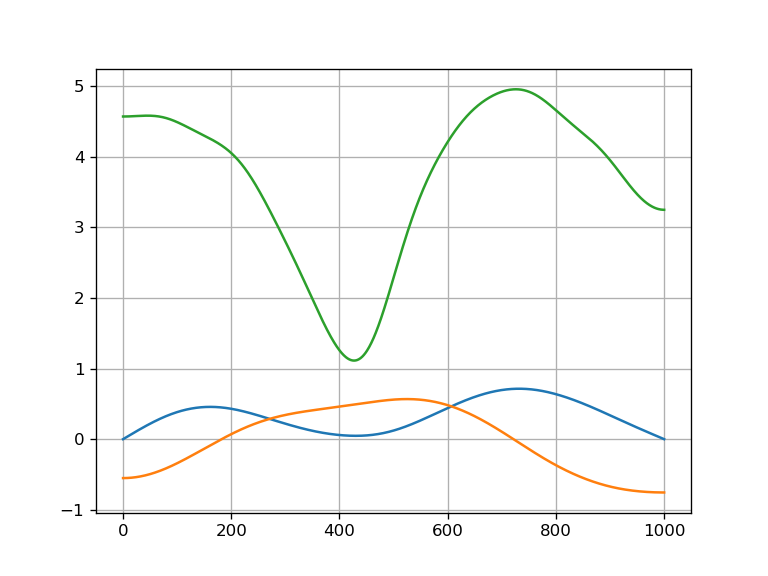

<IPython.core.display.Javascript object>


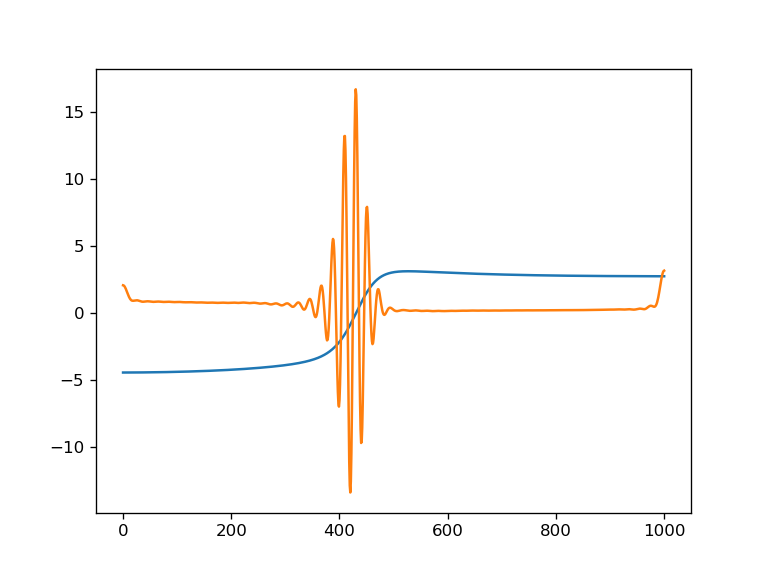

In [145]:
plt.figure()
plt.plot(P)
plt.plot(Z)
plt.plot(V)
plt.grid()
plt.figure()
plt.plot(H)
plt.plot(force)


<IPython.core.display.Javascript object>


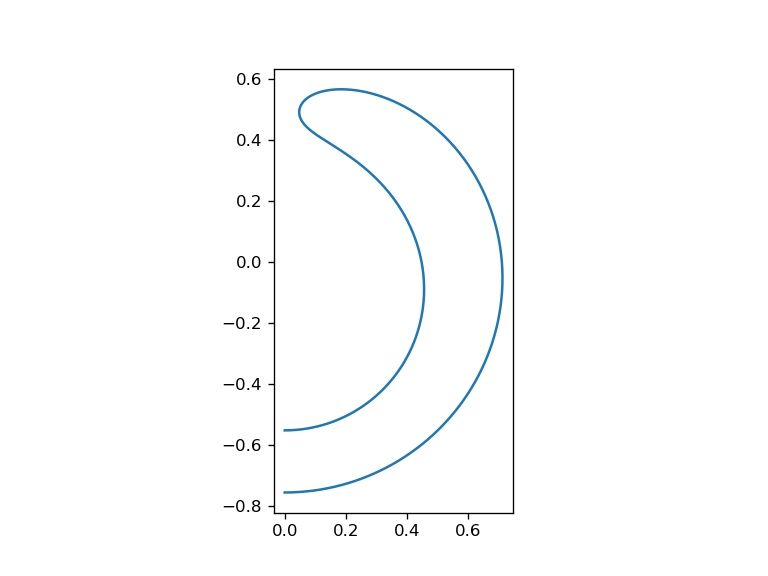

(-0.03570548974159179,
 0.7498152845734276,
 -0.8208420975164071,
 0.6335895088779894)

In [146]:
plt.figure()
plt.plot(P,Z)
plt.axis('scaled')

<IPython.core.display.Javascript object>


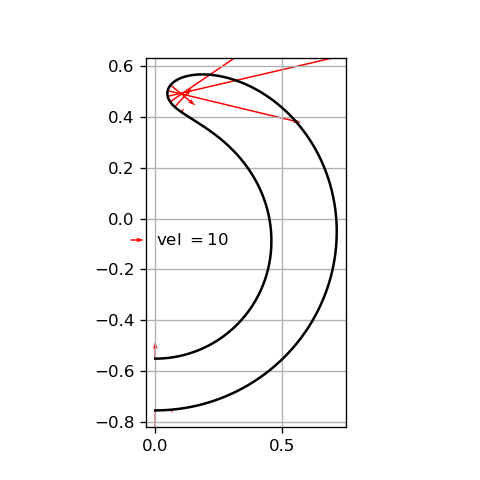

<IPython.core.display.Javascript object>


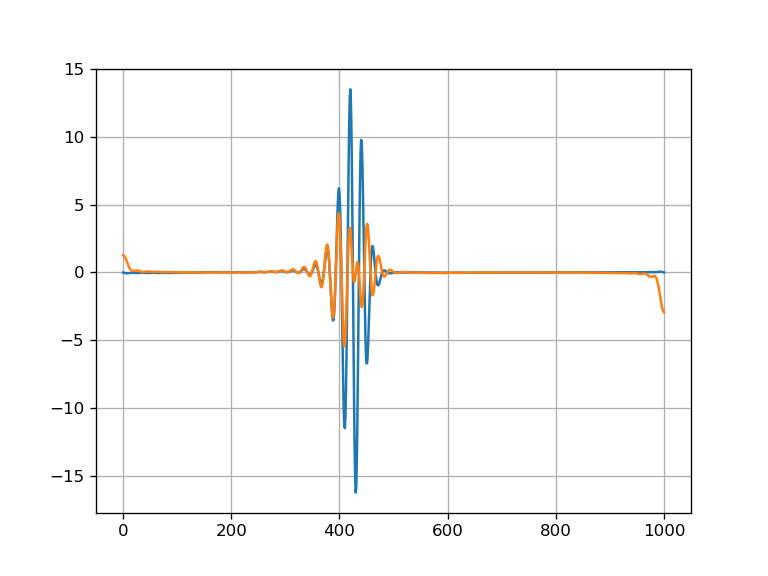

In [147]:
%matplotlib notebook
t_ = get_velo_with_nat_gauge(Pfur_0, Zfur_0,T_g)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


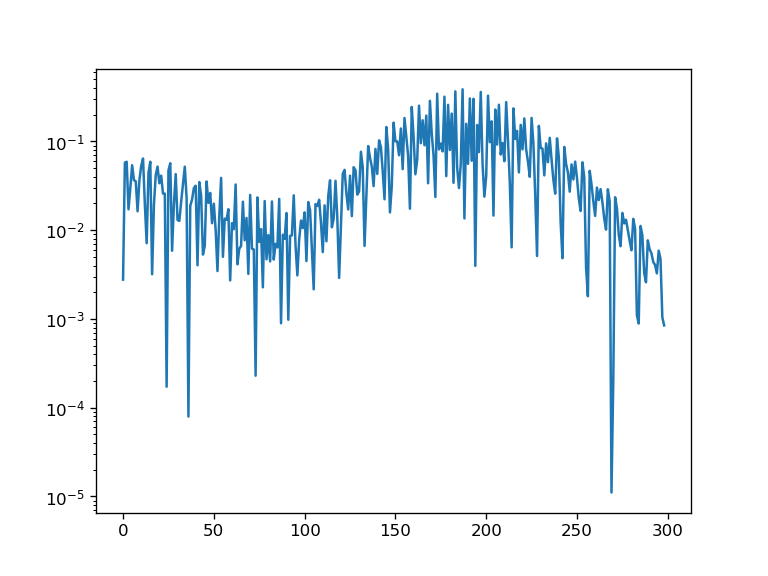

In [148]:
plt.figure()
plt.plot(abs(get_velo_with_nat_gauge_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.yscale('log')

In [114]:
%timeit get_velo_with_nat_gauge_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

1.49 ms ± 59.2 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


__________________________________________________

In [149]:
steps = np.logspace(-7,-5,2*N-1)[::-1]
j_fun = nd.Jacobian(get_velo_with_nat_gauge_fur_1d, step=steps)

In [150]:
jac_0 = j_fun(get_pz_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-1.48e+10 210.9778225052725


<IPython.core.display.Javascript object>


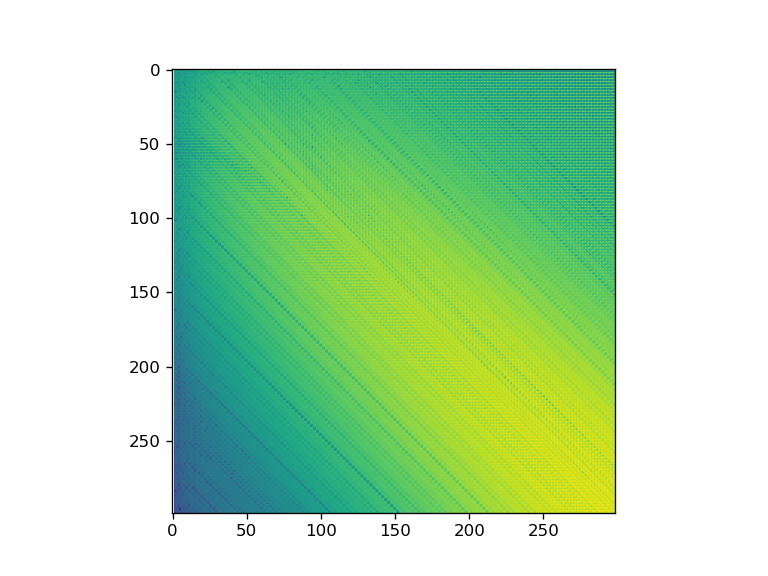

In [151]:
plt.figure()
plt.imshow(np.log10(abs(jac_0)))

In [152]:
t_max=0.1

In [157]:
atol = 1e-12
rtol = atol/10

In [158]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 200 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_velo_with_nat_gauge_fur_1d(pz)
jac = j_fun

In [159]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol,rtol=rtol);

0.0
[-1.22352746e-03  2.18755829e-01  9.04167377e-02 -8.49209769e-02
 -3.02291987e-01  1.46442465e-01 -4.92012737e-03  5.66225270e-02
 -2.37529012e-02 -7.09738067e-03 -3.59075680e-02  8.10027296e-03
 -6.90606195e-04  2.00421585e-03  1.72060616e-03 -1.72824552e-04
  9.20323283e-04 -1.54228409e-03 -2.45138597e-04 -5.80671945e-05
 -2.78729890e-04  2.38788742e-04 -3.17723292e-05  3.15227069e-04
  1.72582507e-04 -2.76469755e-04 -2.05991378e-04 -2.96061539e-05
  8.99787253e-06  5.74126296e-05  1.22169656e-05 -5.54588397e-06
  8.59560417e-05 -6.08557457e-05  5.86129354e-05 -8.09309485e-05
 -3.30359969e-06  1.42744694e-05  2.59542040e-05  4.70209412e-07
 -7.86453143e-07  1.91786283e-07  1.99775133e-07  5.23910319e-08
  7.01734161e-07  7.80904645e-07 -4.50759641e-08 -1.10101092e-06
 -1.69306057e-06 -6.22317228e-08  3.11942208e-07  5.20638359e-07
  1.64118208e-06 -3.37280120e-08 -6.37928611e-07  4.95552389e-08
 -1.17403583e-06  3.80552707e-07 -1.83959155e-07  2.53243997e-08
  1.09347762e-07  5.0

0.00013459313202385012
[-1.22223722e-03  2.18754956e-01  9.04210890e-02 -8.49204720e-02
 -3.02293856e-01  1.46444249e-01 -4.91925491e-03  5.66218359e-02
 -2.37538009e-02 -7.09932162e-03 -3.59041901e-02  8.09793877e-03
 -6.90481491e-04  2.00489039e-03  1.72261994e-03 -1.71335458e-04
  9.20949724e-04 -1.54200238e-03 -2.44113366e-04 -6.00008254e-05
 -2.80273310e-04  2.37784802e-04 -3.15760128e-05  3.15758314e-04
  1.73821675e-04 -2.75626878e-04 -2.04344367e-04 -3.02476416e-05
  8.50234129e-06  5.65598701e-05  1.15713161e-05 -5.47248040e-06
  8.60645396e-05 -6.01584832e-05  5.95371770e-05 -8.08751309e-05
 -3.09847828e-06  1.37486960e-05  2.56492553e-05  1.29190795e-07
 -1.00899436e-06  4.00619666e-07  5.82580887e-07  2.98571553e-07
  1.03935312e-06  6.69569374e-07 -5.42112940e-08 -1.37520890e-06
 -1.92051187e-06 -8.81725014e-08  3.52744680e-07  6.78837121e-07
  1.83143862e-06  2.74884631e-08 -5.28266990e-07 -6.51110105e-08
 -1.26468773e-06  2.86764343e-07 -2.39756823e-07  6.10046113e-08
  

0.004863083153258193
[-1.18924413e-03  2.18760485e-01  9.05234759e-02 -8.48965301e-02
 -3.02315719e-01  1.46472063e-01 -4.90027703e-03  5.65795409e-02
 -2.37657534e-02 -7.12699386e-03 -3.58537850e-02  8.04514561e-03
 -6.76814267e-04  1.99071274e-03  1.75604534e-03 -1.67909335e-04
  9.50737602e-04 -1.54925847e-03 -2.41672818e-04 -7.61248912e-05
 -2.94349651e-04  2.35447874e-04 -3.35490774e-05  3.27013718e-04
  1.86151488e-04 -2.71649193e-04 -1.99361292e-04 -3.74671821e-05
  2.00242103e-06  5.03930161e-05  5.71729746e-06 -2.35519327e-06
  8.94368328e-05 -5.46851476e-05  6.51604992e-05 -8.12945359e-05
 -3.52810169e-06  9.45857906e-06  2.12327936e-05 -9.88432138e-07
 -2.24353531e-06  3.27078434e-06  3.40551530e-06  2.14374921e-06
  2.86455922e-06 -7.91013370e-07 -1.52821032e-06 -3.23777959e-06
 -3.79233681e-06  3.60523259e-07  8.02608660e-07  2.20007646e-06
  3.35538654e-06  2.21154657e-07 -3.37287911e-07 -1.11380521e-06
 -2.31896394e-06 -2.10296792e-07 -7.39146525e-07  6.59231597e-07
  7.

0.011484424753471351
[-1.14092609e-03  2.18768498e-01  9.06478696e-02 -8.48662522e-02
 -3.02335102e-01  1.46507878e-01 -4.88042746e-03  5.65245563e-02
 -2.37708877e-02 -7.15965938e-03 -3.57977945e-02  7.97961718e-03
 -6.54723564e-04  1.96593606e-03  1.79481483e-03 -1.62203867e-04
  9.92611542e-04 -1.56413193e-03 -2.41032927e-04 -9.51093052e-05
 -3.09324719e-04  2.34545086e-04 -3.43343867e-05  3.40062328e-04
  1.99055164e-04 -2.66527444e-04 -1.94269022e-04 -4.56031923e-05
 -6.25572421e-06  4.35981542e-05 -1.21386781e-06  1.61666777e-06
  9.34824446e-05 -4.82530436e-05  7.17350132e-05 -8.20522492e-05
 -4.28968018e-06  4.37527479e-06  1.60106736e-05 -2.12995061e-06
 -3.52661622e-06  6.76394255e-06  6.82284064e-06  4.22604205e-06
  4.91071429e-06 -2.62780189e-06 -3.39103573e-06 -5.39682150e-06
 -5.96575551e-06  9.91381299e-07  1.43443292e-06  4.01289965e-06
  5.17456162e-06  3.71518111e-07 -1.85974642e-07 -2.39833366e-06
 -3.60671726e-06 -7.55960227e-07 -1.28622655e-06  1.41827915e-06
  1.

0.017567133789700533
[-1.09961409e-03  2.18775342e-01  9.07518010e-02 -8.48409683e-02
 -3.02349625e-01  1.46538223e-01 -4.86488280e-03  5.64782522e-02
 -2.37746660e-02 -7.18773253e-03 -3.57509509e-02  7.92517361e-03
 -6.35235009e-04  1.94426597e-03  1.82685614e-03 -1.57329936e-04
  1.02797929e-03 -1.57640703e-03 -2.40220046e-04 -1.11199268e-04
 -3.22073378e-04  2.33795417e-04 -3.50416624e-05  3.51046785e-04
  2.09879338e-04 -2.62168963e-04 -1.89938751e-04 -5.24492033e-05
 -1.32010844e-05  3.78411389e-05 -7.08642615e-06  4.96519471e-06
  9.68865258e-05 -4.27990966e-05  7.73078353e-05 -8.26959542e-05
 -4.93238075e-06  5.64363001e-08  1.15767646e-05 -3.09504739e-06
 -4.61294745e-06  9.74435171e-06  9.73666905e-06  5.99565513e-06
  6.65026176e-06 -4.20861684e-06 -4.99196723e-06 -7.24076682e-06
 -7.82139271e-06  1.54566955e-06  1.98851297e-06  5.57151349e-06
  6.73797928e-06  4.88055748e-07 -6.80312105e-08 -3.51265036e-06
 -4.72312926e-06 -1.21791034e-06 -1.74956628e-06  2.08547741e-06
  2.

0.02373597734952946
[-1.06096517e-03  2.18781791e-01  9.08483783e-02 -8.48175060e-02
 -3.02362351e-01  1.46566512e-01 -4.85080321e-03  5.64350915e-02
 -2.37780806e-02 -7.21411772e-03 -3.57073089e-02  7.87477342e-03
 -6.16669276e-04  1.92376278e-03  1.85646395e-03 -1.52876918e-04
  1.06087629e-03 -1.58769426e-03 -2.39305176e-04 -1.26189089e-04
 -3.33975652e-04  2.33093397e-04 -3.57465074e-05  3.61286183e-04
  2.19938789e-04 -2.58098114e-04 -1.85899809e-04 -5.88305155e-05
 -1.96720968e-05  3.24704721e-05 -1.25659299e-05  8.09864330e-06
  1.00066610e-04 -3.76998623e-05  8.25165876e-05 -8.33108595e-05
 -5.54307034e-06 -3.99431730e-06  7.42069339e-06 -3.98719971e-06
 -5.61963624e-06  1.25530768e-05  1.24812067e-05  7.64977490e-06
  8.27660007e-06 -5.71176454e-06 -6.51233648e-06 -8.97535285e-06
 -9.56648994e-06  2.08463832e-06  2.52641953e-06  7.04773285e-06
  8.21819065e-06  5.84879855e-07  3.06141806e-08 -4.57720516e-06
 -5.78909137e-06 -1.64759527e-06 -2.18070947e-06  2.73078665e-06
  2.8

0.030233245015656992
[-1.02359269e-03  2.18788081e-01  9.09414265e-02 -8.47949161e-02
 -3.02374224e-01  1.46593748e-01 -4.83743716e-03  5.63933946e-02
 -2.37813388e-02 -7.23967482e-03 -3.56651702e-02  7.82635588e-03
 -5.98522175e-04  1.90385376e-03  1.88489271e-03 -1.48648625e-04
  1.09252141e-03 -1.59850742e-03 -2.38373518e-04 -1.40613833e-04
 -3.45459263e-04  2.32444493e-04 -3.64402676e-05  3.71171853e-04
  2.29622747e-04 -2.54183469e-04 -1.82021548e-04 -6.50011196e-05
 -2.59260815e-05  2.72960565e-05 -1.78459786e-05  1.11476945e-05
  1.03156111e-04 -3.27701752e-05  8.75505656e-05 -8.39297009e-05
 -6.15501775e-06 -7.92662037e-06  3.38866755e-06 -4.83248372e-06
 -6.57675553e-06  1.52948460e-05  1.51591469e-05  9.24453466e-06
  9.84483297e-06 -7.19378383e-06 -8.00949344e-06 -1.06610227e-05
 -1.12619077e-05  2.62938320e-06  3.06932879e-06  8.49312453e-06
  9.66697135e-06  6.64105361e-07  1.12077225e-07 -5.62891576e-06
 -6.84164230e-06 -2.05907501e-06 -2.59375324e-06  3.37629911e-06
  3.

0.03760267748330415
[-9.85020363e-04  2.18794635e-01  9.10372383e-02 -8.47716619e-02
 -3.02386225e-01  1.46621720e-01 -4.82381064e-03  5.63503446e-02
 -2.37846888e-02 -7.26605829e-03 -3.56216940e-02  7.77662646e-03
 -5.79654397e-04  1.88329153e-03  1.91409517e-03 -1.44350346e-04
  1.12501403e-03 -1.60960467e-03 -2.37417132e-04 -1.55421247e-04
 -3.57283894e-04  2.31823645e-04 -3.71533637e-05  3.81367795e-04
  2.39581578e-04 -2.50174794e-04 -1.78056368e-04 -7.13809670e-05
 -3.23882510e-05  2.19784302e-05 -2.32728269e-05  1.43241099e-05
  1.06369614e-04 -2.76832259e-05  9.27434650e-05 -8.46004224e-05
 -6.81579665e-06 -1.20035471e-05 -7.89001255e-07 -5.68246604e-06
 -7.54331444e-06  1.81547078e-05  1.79513014e-05  1.08832578e-05
  1.14565569e-05 -8.75610348e-06 -9.58582608e-06 -1.24087855e-05
 -1.30192896e-05  3.21868300e-06  3.65588045e-06  1.00037875e-05
  1.11806391e-05  7.29021150e-07  1.79811600e-07 -6.73834474e-06
 -7.95138922e-06 -2.47837588e-06 -3.01483944e-06  4.06587140e-06
  4.1

0.043831459080045675
[-9.55314838e-04  2.18799726e-01  9.11109124e-02 -8.47537823e-02
 -3.02395356e-01  1.46643159e-01 -4.81340385e-03  5.63171628e-02
 -2.37872706e-02 -7.28636755e-03 -3.55882064e-02  7.73846783e-03
 -5.65049724e-04  1.86747056e-03  1.93651130e-03 -1.41080738e-04
  1.14992135e-03 -1.61812116e-03 -2.36702251e-04 -1.66766182e-04
 -3.66370578e-04  2.31385425e-04 -3.76952513e-05  3.89217786e-04
  2.47228872e-04 -2.47112759e-04 -1.75031960e-04 -7.63055312e-05
 -3.73734856e-05  1.79004008e-05 -2.74350266e-05  1.67939608e-05
  1.08864835e-04 -2.37665104e-05  9.67405995e-05 -8.51415159e-05
 -7.34728552e-06 -1.51566723e-05 -4.01819352e-06 -6.31988204e-06
 -8.27132896e-06  2.03790097e-05  2.01221809e-05  1.21392914e-05
  1.26920786e-05 -9.98302515e-06 -1.08223975e-05 -1.37598967e-05
 -1.43775009e-05  3.69224820e-06  4.12672184e-06  1.11802399e-05
  1.23590603e-05  7.66543707e-07  2.19870833e-07 -7.60958168e-06
 -8.82248252e-06 -2.79698814e-06 -3.33495412e-06  4.61348657e-06
  4.

0.05412761343079587
[-9.11435003e-04  2.18807318e-01  9.12195959e-02 -8.47274065e-02
 -3.02408724e-01  1.46674661e-01 -4.79814585e-03  5.62680893e-02
 -2.37910959e-02 -7.31634137e-03 -3.55387178e-02  7.68229909e-03
 -5.43376547e-04  1.84414359e-03  1.96952531e-03 -1.36311531e-04
  1.18652919e-03 -1.63066534e-03 -2.35695444e-04 -1.83428574e-04
 -3.79760789e-04  2.30806488e-04 -3.84797921e-05  4.00811924e-04
  2.58491666e-04 -2.42632485e-04 -1.70613744e-04 -8.36005230e-05
 -4.47535537e-05  1.19052534e-05 -3.35545074e-05  2.04823677e-05
  1.12585650e-04 -1.79827958e-05  1.02641234e-04 -8.59818581e-05
 -8.17031920e-06 -1.98358355e-05 -8.80728969e-06 -7.23257349e-06
 -9.31919339e-06  2.37000526e-05  2.33622477e-05  1.39840264e-05
  1.45069882e-05 -1.18339931e-05 -1.26857615e-05 -1.57632046e-05
 -1.63908092e-05  4.42409052e-06  4.85354282e-06  1.29385780e-05
  1.41197505e-05  8.01256048e-07  2.58937204e-07 -8.92343013e-06
 -1.01354867e-05 -3.26006306e-06 -3.80046753e-06  5.44910436e-06
  5.5

0.06055157921577202
[-8.87025993e-04  2.18811579e-01  9.12799859e-02 -8.47127503e-02
 -3.02416110e-01  1.46692097e-01 -4.78971201e-03  5.62407580e-02
 -2.37932316e-02 -7.33299875e-03 -3.55111746e-02  7.65115087e-03
 -5.31273105e-04  1.83119409e-03  1.98784326e-03 -1.33688901e-04
  1.20679801e-03 -1.63762709e-03 -2.35163850e-04 -1.92647237e-04
 -3.87192375e-04  2.30520708e-04 -3.89070802e-05  4.07260809e-04
  2.64739815e-04 -2.40163022e-04 -1.68182076e-04 -8.76695843e-05
 -4.88675136e-05  8.58558041e-06 -3.69433149e-05  2.25552153e-05
  1.14673905e-04 -1.47667484e-05  1.05921355e-04 -8.64709249e-05
 -8.64813009e-06 -2.24496850e-05 -1.14810289e-05 -7.72496996e-06
 -9.88749383e-06  2.55657331e-05  2.51818057e-05  1.50043492e-05
  1.55109758e-05 -1.28836923e-05 -1.37413804e-05 -1.68811795e-05
 -1.75140980e-05  4.84809599e-06  5.27422536e-06  1.39271211e-05
  1.51093120e-05  8.09601549e-07  2.70029149e-07 -9.66812614e-06
 -1.08793806e-05 -3.51348798e-06 -4.05536959e-06  5.92779216e-06
  6.0

0.06935089721356712
[-8.56883259e-04  2.18816876e-01  9.13544987e-02 -8.46946661e-02
 -3.02425188e-01  1.46713543e-01 -4.77934746e-03  5.62069726e-02
 -2.37958774e-02 -7.35355177e-03 -3.54771461e-02  7.61277873e-03
 -5.16281985e-04  1.81523089e-03  2.01041977e-03 -1.30479689e-04
  1.23173444e-03 -1.64620927e-03 -2.34536752e-04 -2.03981620e-04
 -3.96352627e-04  2.30203923e-04 -3.94253412e-05  4.15223900e-04
  2.72438899e-04 -2.37136291e-04 -1.65205165e-04 -9.27054655e-05
 -5.39563712e-05  4.50143014e-06 -4.11127877e-05  2.51358849e-05
  1.17271011e-04 -1.07967704e-05  1.09969510e-04 -8.70963639e-05
 -9.25804319e-06 -2.56881408e-05 -1.47921882e-05 -8.31768428e-06
 -1.05746606e-05  2.78875916e-05  2.74456310e-05  1.62582936e-05
  1.67450108e-05 -1.41997710e-05 -1.50637903e-05 -1.82650533e-05
 -1.89042909e-05  5.38850519e-06  5.80999398e-06  1.51579793e-05
  1.63411391e-05  8.08885882e-07  2.73036517e-07 -1.06013279e-05
 -1.18112579e-05 -3.82210139e-06 -4.36593370e-06  6.53262847e-06
  6.6

0.08152083606877807
[-8.20728872e-04  2.18823283e-01  9.14437825e-02 -8.46729962e-02
 -3.02436015e-01  1.46739140e-01 -4.76698780e-03  5.61663993e-02
 -2.37990634e-02 -7.37817794e-03 -3.54363079e-02  7.56688744e-03
 -4.98237518e-04  1.79612600e-03  2.03743505e-03 -1.26673121e-04
  1.26150787e-03 -1.65648184e-03 -2.33827888e-04 -2.17503752e-04
 -4.07314633e-04  2.29876658e-04 -4.00331013e-05  4.24773885e-04
  2.81648847e-04 -2.33539410e-04 -1.61672511e-04 -9.87615335e-05
 -6.00722863e-05 -3.74633993e-07 -4.60910879e-05  2.82616007e-05
  1.20412649e-04 -6.03763696e-06  1.14821032e-04 -8.78779220e-05
 -1.00185796e-05 -2.95875746e-05 -1.87769852e-05 -9.00601453e-06
 -1.13773507e-05  3.06984078e-05  3.01852529e-05  1.77531684e-05
  1.82164022e-05 -1.58071224e-05 -1.66772882e-05 -1.99293697e-05
 -2.05758372e-05  6.06129053e-06  6.47641046e-06  1.66487783e-05
  1.78326758e-05  7.91732933e-07  2.60847367e-07 -1.17402970e-05
 -1.29481437e-05 -4.18565477e-06 -4.73202160e-06  7.27807892e-06
  7.3

0.09404915936133529
[-7.89269495e-04  2.18828905e-01  9.15213928e-02 -8.46541588e-02
 -3.02445384e-01  1.46761301e-01 -4.75629642e-03  5.61310510e-02
 -2.38018468e-02 -7.39958267e-03 -3.54007522e-02  7.52707357e-03
 -4.82480733e-04  1.77953961e-03  2.06088560e-03 -1.23398612e-04
  1.28729411e-03 -1.66540166e-03 -2.33249493e-04 -2.29205170e-04
 -4.16830465e-04  2.29638530e-04 -4.05496232e-05  4.33082208e-04
  2.89640661e-04 -2.30439490e-04 -1.58632332e-04 -1.04044929e-04
 -6.54043885e-05 -4.59716602e-06 -5.04024631e-05  3.10081462e-05
  1.23169672e-04 -1.89922074e-06  1.19038620e-04 -8.85858201e-05
 -1.07060279e-05 -3.29936577e-05 -2.22557016e-05 -9.58473926e-06
 -1.20565550e-05  3.31669150e-05  3.25903854e-05  1.90455011e-05
  1.94886660e-05 -1.72311911e-05 -1.81054006e-05 -2.13811767e-05
 -2.20336295e-05  6.66860328e-06  7.07745000e-06  1.79585475e-05
  1.91427071e-05  7.62149938e-07  2.36040441e-07 -1.27486514e-05
 -1.39542386e-05 -4.49587402e-06 -5.04462905e-06  7.94445523e-06
  8.0

In [160]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [957]:
np.save(f'dyn_prolate_rad_to_t={t_max}_N={N}_T_g={}rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

##### Continue

In [213]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))

In [214]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [215]:
t_end = 50

In [216]:
atol = 1e-7
rtol = atol/10

In [217]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 20 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_corr_velo_fur_1d(pz)
jac = j_corr_fun

In [218]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:jac(pz),atol=atol, rtol=rtol, max_step=3e-2);

10.0
[ 2.73360342e-01 -8.74275933e-02  1.08800069e-01  6.25781947e-02
 -1.84323200e-03 -1.98863586e-02 -6.32425560e-03  7.45005348e-03
  6.59264167e-03 -1.33464169e-03 -4.55619807e-03 -1.26954649e-03
  2.30820782e-03  1.93278857e-03 -5.78036419e-04 -1.61550592e-03
 -5.20977477e-04  1.02570079e-03  9.73613169e-04 -2.20286470e-04
 -9.68160749e-04 -2.36531699e-04  7.28118651e-04  5.49680804e-04
 -2.84116299e-04 -5.30422725e-04 -1.93152246e-05  3.80734813e-04
  1.74635717e-04 -1.87245936e-04 -1.80870496e-04  5.30593864e-05
  1.06277362e-04 -2.62319521e-06 -3.49196716e-05  1.45159778e-05
 -1.03754611e-05 -5.48400631e-05 -8.33746608e-06  5.13841926e-05
  4.27364018e-05  2.08847201e-05  1.24198390e-05 -3.88469478e-05
  3.36411246e-05  3.08264454e-05  7.78235887e-05 -1.68149075e-05
  1.22509021e-05 -1.35062062e-01  5.12078723e-02 -2.91017669e-01
 -2.65608487e-02  8.81164866e-03 -4.74963737e-03 -9.33869554e-03
 -2.61555822e-03  4.17580696e-03  3.45495080e-03 -1.03388309e-03
 -2.82633184e-03 -6.

10.50999999999999
[ 2.73284568e-01 -8.73889348e-02  1.08825995e-01  6.26023741e-02
 -1.79816632e-03 -1.99138074e-02 -6.36413542e-03  7.44528567e-03
  6.61851249e-03 -1.32237610e-03 -4.57094823e-03 -1.28717325e-03
  2.31145644e-03  1.94854632e-03 -5.72846932e-04 -1.62652465e-03
 -5.31680383e-04  1.02796879e-03  9.83249600e-04 -2.17356237e-04
 -9.74439013e-04 -2.42787353e-04  7.29256112e-04  5.54595757e-04
 -2.83439978e-04 -5.33905717e-04 -2.08480503e-05  3.82639407e-04
  1.75872322e-04 -1.88193174e-04 -1.81495746e-04  5.38159337e-05
  1.06435963e-04 -3.55774686e-06 -3.53140446e-05  1.52625578e-05
 -9.89276944e-06 -5.52317827e-05 -8.93570212e-06  5.13040777e-05
  4.28605022e-05  2.12382328e-05  1.26440842e-05 -3.92387300e-05
  3.35767699e-05  3.07542201e-05  7.82106391e-05 -1.70072908e-05
  1.22931176e-05 -1.34291784e-01  5.18446360e-02 -2.90983697e-01
 -2.66586426e-02  8.73058837e-03 -4.69622432e-03 -9.31072409e-03
 -2.61879208e-03  4.16345314e-03  3.46039087e-03 -1.02469085e-03
 -2.827

11.024651530771628
[ 2.73206149e-01 -8.73507927e-02  1.08851780e-01  6.26265772e-02
 -1.75198682e-03 -1.99413043e-02 -6.40512370e-03  7.44035122e-03
  6.64512177e-03 -1.30950942e-03 -4.58599162e-03 -1.30535132e-03
  2.31467428e-03  1.96476219e-03 -5.67384966e-04 -1.63776527e-03
 -5.42716248e-04  1.03025296e-03  9.93185627e-04 -2.14287716e-04
 -9.80898067e-04 -2.49254754e-04  7.30444058e-04  5.59723017e-04
 -2.82699428e-04 -5.37536317e-04 -2.25082902e-05  3.84603910e-04
  1.77243648e-04 -1.89123891e-04 -1.82224791e-04  5.45138713e-05
  1.06656897e-04 -4.41518634e-06 -3.57025553e-05  1.59646571e-05
 -9.41631196e-06 -5.56135124e-05 -9.53577769e-06  5.12217239e-05
  4.30303840e-05  2.16449922e-05  1.28738642e-05 -3.96764565e-05
  3.35210725e-05  3.07212077e-05  7.86487163e-05 -1.71910890e-05
  1.23447983e-05 -1.33497837e-01  5.24981036e-02 -2.90946280e-01
 -2.67604349e-02  8.64707172e-03 -4.64193759e-03 -9.28140890e-03
 -2.62243128e-03  4.15046554e-03  3.46569433e-03 -1.01512118e-03
 -2.82

11.549348469228317
[ 2.73124020e-01 -8.73129138e-02  1.08877538e-01  6.26510585e-02
 -1.70410197e-03 -1.99690797e-02 -6.44773092e-03  7.43516205e-03
  6.67280139e-03 -1.29584625e-03 -4.60149880e-03 -1.32432583e-03
  2.31788006e-03  1.98164202e-03 -5.61563206e-04 -1.64935971e-03
 -5.54234758e-04  1.03256774e-03  1.00354878e-03 -2.11027273e-04
 -9.87614580e-04 -2.56026160e-04  7.31689442e-04  5.65133481e-04
 -2.81875824e-04 -5.41362161e-04 -2.43257300e-05  3.86651688e-04
  1.78773636e-04 -1.90047369e-04 -1.83072179e-04  5.51590988e-05
  1.06946811e-04 -5.20601440e-06 -3.60941975e-05  1.66316385e-05
 -8.93497073e-06 -5.59910459e-05 -1.01512033e-05  5.11354260e-05
  4.32508149e-05  2.21094270e-05  1.31099447e-05 -4.01646708e-05
  3.34715369e-05  3.07257832e-05  7.91414387e-05 -1.73668588e-05
  1.24058990e-05 -1.32670225e-01  5.31761792e-02 -2.90904598e-01
 -2.68676285e-02  8.56004654e-03 -4.58614630e-03 -9.25033200e-03
 -2.62655114e-03  4.13663804e-03  3.47090159e-03 -1.00504073e-03
 -2.82

12.069999999999956
[ 2.73040140e-01 -8.72764505e-02  1.08902422e-01  6.26751683e-02
 -1.65568778e-03 -1.99963346e-02 -6.49089268e-03  7.42982137e-03
  6.70086204e-03 -1.28169586e-03 -4.61706771e-03 -1.34364151e-03
  2.32097408e-03  1.99876827e-03 -5.55509306e-04 -1.66101157e-03
 -5.65960103e-04  1.03484222e-03  1.01408369e-03 -2.07641787e-04
 -9.94417015e-04 -2.62943413e-04  7.32953212e-04  5.70697920e-04
 -2.80980560e-04 -5.45289033e-04 -2.62630955e-05  3.88729773e-04
  1.80429599e-04 -1.90937947e-04 -1.84020544e-04  5.57330132e-05
  1.07300738e-04 -5.91091702e-06 -3.64825130e-05  1.72478734e-05
 -8.45656987e-06 -5.63558036e-05 -1.07716141e-05  5.10463378e-05
  4.35174371e-05  2.26194805e-05  1.33452898e-05 -4.06902253e-05
  3.34272496e-05  3.07663656e-05  7.96749222e-05 -1.75290189e-05
  1.24743189e-05 -1.31829504e-01  5.38617203e-02 -2.90859361e-01
 -2.69776724e-02  8.47167420e-03 -4.53027668e-03 -9.21822311e-03
 -2.63107691e-03  4.12227277e-03  3.47586249e-03 -9.94687728e-04
 -2.82

12.554651530771595
[ 2.72959689e-01 -8.72436267e-02  1.08924850e-01  6.26974581e-02
 -1.60971319e-03 -2.00213884e-02 -6.53193577e-03  7.42464670e-03
  6.72756742e-03 -1.26794187e-03 -4.63173828e-03 -1.36210845e-03
  2.32376551e-03  2.01508144e-03 -5.49600530e-04 -1.67200444e-03
 -5.77170164e-04  1.03693262e-03  1.02413707e-03 -2.04337845e-04
 -1.00088126e-03 -2.69580969e-04  7.34150198e-04  5.76067413e-04
 -2.80067922e-04 -5.49068935e-04 -2.81966806e-05  3.90707109e-04
  1.82101821e-04 -1.91742734e-04 -1.85003916e-04  5.62064314e-05
  1.07691278e-04 -6.49705735e-06 -3.68465879e-05  1.77825687e-05
 -8.00690993e-06 -5.66876491e-05 -1.13624669e-05  5.09590707e-05
  4.38091572e-05  2.31391780e-05  1.35654410e-05 -4.12164948e-05
  3.33882641e-05  3.08352612e-05  8.02114040e-05 -1.76685407e-05
  1.25447255e-05 -1.31027857e-01  5.45122731e-02 -2.90813424e-01
 -2.70837051e-02  8.38743665e-03 -4.47773858e-03 -9.18709994e-03
 -2.63571488e-03  4.10825968e-03  3.48028949e-03 -9.84706786e-04
 -2.83

13.079348469228284
[ 2.72869685e-01 -8.72094418e-02  1.08948180e-01  6.27214367e-02
 -1.55881545e-03 -2.00481224e-02 -6.57741599e-03  7.41878580e-03
  6.75719104e-03 -1.25235047e-03 -4.64783984e-03 -1.38269825e-03
  2.32667970e-03  2.03319360e-03 -5.42873097e-04 -1.68408743e-03
 -5.89668548e-04  1.03916032e-03  1.03531975e-03 -2.00572678e-04
 -1.00803717e-03 -2.77010500e-04  7.35464866e-04  5.82107327e-04
 -2.78981978e-04 -5.53307928e-04 -3.04454872e-05  3.92897316e-04
  1.84065223e-04 -1.92585737e-04 -1.86184337e-04  5.66498474e-05
  1.08183033e-04 -7.05547455e-06 -3.72461801e-05  1.83203365e-05
 -7.51209183e-06 -5.70394659e-05 -1.20212591e-05  5.08582553e-05
  4.41732953e-05  2.37529381e-05  1.38057525e-05 -4.18278241e-05
  3.33461403e-05  3.09431872e-05  8.08369080e-05 -1.78067192e-05
  1.26282356e-05 -1.30136946e-01  5.52316044e-02 -2.90759063e-01
 -2.72028381e-02  8.29384847e-03 -4.42017216e-03 -9.15192850e-03
 -2.64124488e-03  4.09230491e-03  3.48486702e-03 -9.73485907e-04
 -2.83

13.599999999999923
[ 2.72776958e-01 -8.71770673e-02  1.08970195e-01  6.27450873e-02
 -1.50698280e-03 -2.00742013e-02 -6.62375705e-03  7.41266187e-03
  6.78741923e-03 -1.23607304e-03 -4.66407839e-03 -1.40382932e-03
  2.32944905e-03  2.05169272e-03 -5.35816895e-04 -1.69629479e-03
 -6.02494429e-04  1.04132929e-03  1.04676307e-03 -1.96616451e-04
 -1.01531967e-03 -2.84667494e-04  7.36786525e-04  5.88360721e-04
 -2.77789871e-04 -5.57680823e-04 -3.28546641e-05  3.95125871e-04
  1.86185556e-04 -1.93390480e-04 -1.87483704e-04  5.70140755e-05
  1.08745457e-04 -7.52956478e-06 -3.76506364e-05  1.88121027e-05
 -7.00992516e-06 -5.73816103e-05 -1.26992872e-05  5.07497555e-05
  4.45858604e-05  2.44183717e-05  1.40476762e-05 -4.24796336e-05
  3.33019369e-05  3.10848611e-05  8.15063484e-05 -1.79301007e-05
  1.27188279e-05 -1.29226131e-01  5.59629110e-02 -2.90699785e-01
 -2.73260774e-02  8.19819825e-03 -4.36219707e-03 -9.11533170e-03
 -2.64731658e-03  4.07555554e-03  3.48917818e-03 -9.61871062e-04
 -2.83

14.109999999999912
[ 2.72682287e-01 -8.71470299e-02  1.08990501e-01  6.27681294e-02
 -1.45472399e-03 -2.00992633e-02 -6.67048951e-03  7.40632025e-03
  6.81796307e-03 -1.21924638e-03 -4.68028597e-03 -1.42531020e-03
  2.33203299e-03  2.07040153e-03 -5.28488599e-04 -1.70850262e-03
 -6.15530359e-04  1.04341051e-03  1.05835776e-03 -1.92497920e-04
 -1.02265534e-03 -2.92484373e-04  7.38097524e-04  5.94771475e-04
 -2.76495561e-04 -5.62145841e-04 -3.54083118e-05  3.97368517e-04
  1.88447830e-04 -1.94144803e-04 -1.88892138e-04  5.72911808e-05
  1.09373197e-04 -7.91307504e-06 -3.80567082e-05  1.92528938e-05
 -6.50459913e-06 -5.77105504e-05 -1.33917506e-05  5.06330892e-05
  4.50418750e-05  2.51301663e-05  1.42899984e-05 -4.31654592e-05
  3.32537669e-05  3.12582703e-05  8.22135686e-05 -1.80370844e-05
  1.28155179e-05 -1.28304113e-01  5.66988526e-02 -2.90635876e-01
 -2.74523631e-02  8.10139655e-03 -4.30439949e-03 -9.07761719e-03
 -2.65390559e-03  4.05812304e-03  3.49316500e-03 -9.49963356e-04
 -2.83

14.609348469228252
[ 2.72585253e-01 -8.71194303e-02  1.09009018e-01  6.27905805e-02
 -1.40189650e-03 -2.01232878e-02 -6.71773232e-03  7.39973611e-03
  6.84892410e-03 -1.20180410e-03 -4.69650733e-03 -1.44721859e-03
  2.33443091e-03  2.08938083e-03 -5.20857674e-04 -1.72074608e-03
 -6.28821831e-04  1.04540603e-03  1.07014168e-03 -1.88197706e-04
 -1.03006586e-03 -3.00490326e-04  7.39399270e-04  6.01363687e-04
 -2.75089081e-04 -5.66717922e-04 -3.81208541e-05  3.99630251e-04
  1.90864319e-04 -1.94847120e-04 -1.90416491e-04  5.74778454e-05
  1.10067945e-04 -8.20550879e-06 -3.84659635e-05  1.96438384e-05
 -5.99451062e-06 -5.80270618e-05 -1.41019890e-05  5.05064808e-05
  4.55415685e-05  2.58917896e-05  1.45348676e-05 -4.38873576e-05
  3.31993879e-05  3.14635241e-05  8.29613722e-05 -1.81277608e-05
  1.29185451e-05 -1.27367825e-01  5.74415227e-02 -2.90566890e-01
 -2.75822259e-02  8.00311487e-03 -4.24661601e-03 -9.03861878e-03
 -2.66106607e-03  4.03990141e-03  3.49682488e-03 -9.37716150e-04
 -2.83

15.12999999999989
[ 2.72478599e-01 -8.70928285e-02  1.09026723e-01  6.28138771e-02
 -1.34476458e-03 -2.01477348e-02 -6.76882693e-03  7.39242478e-03
  6.88253900e-03 -1.18243893e-03 -4.71388397e-03 -1.47115468e-03
  2.33678574e-03  2.11000083e-03 -5.12347654e-04 -1.73389022e-03
 -6.43336891e-04  1.04744552e-03  1.08296830e-03 -1.83388115e-04
 -1.03808211e-03 -3.09274171e-04  7.40782156e-04  6.08627140e-04
 -2.73453493e-04 -5.71733431e-04 -4.12083873e-05  4.02071217e-04
  1.93629330e-04 -1.95536689e-04 -1.92180806e-04  5.75717061e-05
  1.10886240e-04 -8.41425252e-06 -3.89075745e-05  2.00059318e-05
 -5.44388077e-06 -5.83515902e-05 -1.48828305e-05  5.03584616e-05
  4.61240381e-05  2.67644074e-05  1.48015386e-05 -4.47004705e-05
  3.31322005e-05  3.17188137e-05  8.38082594e-05 -1.82063571e-05
  1.30358918e-05 -1.26349416e-01  5.82437632e-02 -2.90487135e-01
 -2.77253922e-02  7.89622057e-03 -4.18480024e-03 -8.99537877e-03
 -2.66940870e-03  4.01945263e-03  3.50035739e-03 -9.24219136e-04
 -2.830

15.63999999999988
[ 2.72367507e-01 -8.70692645e-02  1.09042323e-01  6.28365741e-02
 -1.28640639e-03 -2.01710137e-02 -6.82103589e-03  7.38477048e-03
  6.91707815e-03 -1.16210256e-03 -4.73149076e-03 -1.49590114e-03
  2.33894757e-03  2.13119833e-03 -5.03372933e-04 -1.74723801e-03
 -6.58333634e-04  1.04941214e-03  1.09617962e-03 -1.78301150e-04
 -1.04628856e-03 -3.18393214e-04  7.42174504e-04  6.16204065e-04
 -2.71657195e-04 -5.76942715e-04 -4.45351552e-05  4.04563278e-04
  1.96624645e-04 -1.96164844e-04 -1.94111712e-04  5.75486809e-05
  1.11793945e-04 -8.51122926e-06 -3.93580449e-05  2.03112703e-05
 -4.88310764e-06 -5.86644402e-05 -1.56953165e-05  5.01941772e-05
  4.67632931e-05  2.77108690e-05  1.50781956e-05 -4.55667702e-05
  3.30528806e-05  3.20157526e-05  8.47165133e-05 -1.82660086e-05
  1.31622147e-05 -1.25300998e-01  5.90632787e-02 -2.90399907e-01
 -2.78749254e-02  7.78616314e-03 -4.12229312e-03 -8.94994208e-03
 -2.67861941e-03  3.99767524e-03  3.50349690e-03 -9.10139540e-04
 -2.829

16.154651530771527
[ 2.72247103e-01 -8.70484510e-02  1.09056181e-01  6.28593115e-02
 -1.22465677e-03 -2.01937409e-02 -6.87633722e-03  7.37650644e-03
  6.95395503e-03 -1.13994615e-03 -4.75002967e-03 -1.52247116e-03
  2.34099314e-03  2.15383599e-03 -4.93558305e-04 -1.76132169e-03
 -6.74421464e-04  1.05138601e-03  1.11031661e-03 -1.72723670e-04
 -1.05502229e-03 -3.28223002e-04  7.43639809e-04  6.24418652e-04
 -2.69616600e-04 -5.82568610e-04 -4.82571008e-05  4.07208204e-04
  1.99995992e-04 -1.96745762e-04 -1.96305437e-04  5.73893151e-05
  1.12835576e-04 -8.48330788e-06 -3.98347412e-05  2.05632158e-05
 -4.29255852e-06 -5.89755893e-05 -1.65730221e-05  5.00048905e-05
  4.74891153e-05  2.87777010e-05  1.53783508e-05 -4.65252583e-05
  3.29557649e-05  3.23718024e-05  8.57294090e-05 -1.83065835e-05
  1.33033073e-05 -1.24179343e-01  5.99324824e-02 -2.90300940e-01
 -2.80373962e-02  7.66836712e-03 -4.05670010e-03 -8.90025237e-03
 -2.68919443e-03  3.97350845e-03  3.50627962e-03 -8.94882101e-04
 -2.82

16.67934846922825
[ 2.72113319e-01 -8.70309800e-02  1.09068282e-01  6.28822098e-02
 -1.15815640e-03 -2.02159858e-02 -6.93604102e-03  7.36749567e-03
  6.99423980e-03 -1.11530551e-03 -4.77001171e-03 -1.55163017e-03
  2.34296884e-03  2.17856300e-03 -4.82610100e-04 -1.77652829e-03
 -6.92056566e-04  1.05342906e-03  1.12579125e-03 -1.66489569e-04
 -1.06454255e-03 -3.39050728e-04  7.45236953e-04  6.33535238e-04
 -2.67258185e-04 -5.88794197e-04 -5.25160445e-05  4.10085291e-04
  2.03883099e-04 -1.97277676e-04 -1.98858429e-04  5.70562436e-05
  1.14056902e-04 -8.29744518e-06 -4.03496637e-05  2.07512834e-05
 -3.66121861e-06 -5.92888463e-05 -1.75415516e-05  4.97824219e-05
  4.83311744e-05  3.00103759e-05  1.57135697e-05 -4.76109673e-05
  3.28349958e-05  3.28083964e-05  8.68879270e-05 -1.83243323e-05
  1.34644925e-05 -1.22951229e-01  6.08746316e-02 -2.90186168e-01
 -2.82183446e-02  7.53927039e-03 -3.98642294e-03 -8.84450050e-03
 -2.70165451e-03  3.94594612e-03  3.50861043e-03 -8.77971561e-04
 -2.827

17.199999999999918
[ 2.71965880e-01 -8.70184203e-02  1.09078332e-01  6.29043981e-02
 -1.08789167e-03 -2.02369253e-02 -6.99944300e-03  7.35799816e-03
  7.03778599e-03 -1.08831049e-03 -4.79136335e-03 -1.58323132e-03
  2.34489481e-03  2.20527600e-03 -4.70594601e-04 -1.79279364e-03
 -7.11140343e-04  1.05556825e-03  1.14254748e-03 -1.59641876e-04
 -1.07483430e-03 -3.50823645e-04  7.46999021e-04  6.43549676e-04
 -2.64588211e-04 -5.95626445e-04 -5.73296495e-05  4.13195076e-04
  2.08321851e-04 -1.97741485e-04 -2.01803325e-04  5.65126309e-05
  1.15473764e-04 -7.91413205e-06 -4.08986916e-05  2.08520803e-05
 -3.00120868e-06 -5.95968610e-05 -1.85956856e-05  4.95258988e-05
  4.92979455e-05  3.14227930e-05  1.60856669e-05 -4.88289732e-05
  3.26888403e-05  3.33400628e-05  8.82029553e-05 -1.83134729e-05
  1.36465336e-05 -1.21620125e-01  6.18836453e-02 -2.90054790e-01
 -2.84182168e-02  7.39910387e-03 -3.91211077e-03 -8.78237990e-03
 -2.71623463e-03  3.91466665e-03  3.51023281e-03 -8.59445080e-04
 -2.82

17.684651530771585
[ 2.71810353e-01 -8.70124777e-02  1.09086278e-01  6.29240857e-02
 -1.01785681e-03 -2.02550890e-02 -7.06321074e-03  7.34880692e-03
  7.08274260e-03 -1.06028824e-03 -4.81325005e-03 -1.61582665e-03
  2.34680678e-03  2.23282142e-03 -4.58126289e-04 -1.80946090e-03
 -7.30789006e-04  1.05780187e-03  1.15986855e-03 -1.52543757e-04
 -1.08550194e-03 -3.62996402e-04  7.48920709e-04  6.54050125e-04
 -2.61752843e-04 -6.02807552e-04 -6.24977468e-05  4.16430872e-04
  2.13155456e-04 -1.98118314e-04 -2.05047974e-04  5.57598498e-05
  1.17042584e-04 -7.32062381e-06 -4.14572960e-05  2.08437695e-05
 -2.35250535e-06 -5.98825044e-05 -1.96853792e-05  4.92482869e-05
  5.03577461e-05  3.29689403e-05  1.64802062e-05 -5.01339784e-05
  3.25249480e-05  3.39606735e-05  8.96309042e-05 -1.82714984e-05
  1.38421401e-05 -1.20241526e-01  6.29141716e-02 -2.89912083e-01
 -2.86295233e-02  7.25351569e-03 -3.83723336e-03 -8.71603705e-03
 -2.73256116e-03  3.88058325e-03  3.51083048e-03 -8.40105305e-04
 -2.82

18.209348469228306
[ 2.71612305e-01 -8.70151833e-02  1.09094516e-01  6.29430856e-02
 -9.35993989e-04 -2.02726465e-02 -7.13900942e-03  7.33900341e-03
  7.13850533e-03 -1.02581077e-03 -4.84042581e-03 -1.65597140e-03
  2.34939664e-03  2.26691911e-03 -4.42850521e-04 -1.83009857e-03
 -7.54931603e-04  1.06081999e-03  1.18137085e-03 -1.43888216e-04
 -1.09888595e-03 -3.78006326e-04  7.51584574e-04  6.67277469e-04
 -2.58240555e-04 -6.11931325e-04 -6.91193841e-05  4.20539889e-04
  2.19486368e-04 -1.98489856e-04 -2.09367516e-04  5.45800143e-05
  1.19145193e-04 -6.30943535e-06 -4.21419639e-05  2.06725948e-05
 -1.60772409e-06 -6.01924149e-05 -2.10261686e-05  4.88965078e-05
  5.17617151e-05  3.50113684e-05  1.69806310e-05 -5.18192434e-05
  3.23133388e-05  3.48460917e-05  9.15040208e-05 -1.81810804e-05
  1.40933553e-05 -1.18524130e-01  6.41751554e-02 -2.89727109e-01
 -2.88992727e-02  7.07123936e-03 -3.74697756e-03 -8.63024813e-03
 -2.75475138e-03  3.83542566e-03  3.50984501e-03 -8.15913953e-04
 -2.81

18.729999999999976
[ 2.71364714e-01 -8.70335368e-02  1.09105856e-01  6.29560181e-02
 -8.47710119e-04 -2.02862911e-02 -7.22353539e-03  7.33116861e-03
  7.20576214e-03 -9.85743752e-04 -4.87383193e-03 -1.70343835e-03
  2.35359334e-03  2.30792239e-03 -4.25331732e-04 -1.85527658e-03
 -7.83381471e-04  1.06530753e-03  1.20731675e-03 -1.34093587e-04
 -1.11547270e-03 -3.95729032e-04  7.55521165e-04  6.83479257e-04
 -2.54283412e-04 -6.23347939e-04 -7.72524016e-05  4.25786514e-04
  2.27569369e-04 -1.98922638e-04 -2.15032948e-04  5.28621968e-05
  1.21942293e-04 -4.69779129e-06 -4.29737545e-05  2.02206845e-05
 -8.18904176e-07 -6.04988648e-05 -2.26003392e-05  4.84834039e-05
  5.35929181e-05  3.76564606e-05  1.75868202e-05 -5.39519641e-05
  3.20694696e-05  3.61160268e-05  9.39153221e-05 -1.80308247e-05
  1.44019003e-05 -1.16438211e-01  6.56683812e-02 -2.89497091e-01
 -2.92375872e-02  6.84780973e-03 -3.64179488e-03 -8.52076502e-03
 -2.78477563e-03  3.77585098e-03  3.50565321e-03 -7.86580636e-04
 -2.81

19.214651530771643
[ 2.71040603e-01 -8.70797055e-02  1.09129785e-01  6.29517634e-02
 -7.60662503e-04 -2.02910768e-02 -7.31294023e-03  7.33143831e-03
  7.28923520e-03 -9.40953205e-04 -4.91777131e-03 -1.75969550e-03
  2.36232197e-03  2.35869584e-03 -4.06476782e-04 -1.88787863e-03
 -8.16923126e-04  1.07337119e-03  1.23956295e-03 -1.23954369e-04
 -1.13731981e-03 -4.16568447e-04  7.62291253e-04  7.03875929e-04
 -2.50485853e-04 -6.38417712e-04 -8.71562125e-05  4.33157547e-04
  2.38173636e-04 -1.99791804e-04 -2.22841771e-04  5.04777007e-05
  1.25936489e-04 -2.13754177e-06 -4.41001612e-05  1.92474677e-05
 -2.61038916e-08 -6.07460431e-05 -2.44282594e-05  4.80240987e-05
  5.60806425e-05  4.12038899e-05  1.82994550e-05 -5.67684614e-05
  3.18360533e-05  3.80696056e-05  9.71307373e-05 -1.78359911e-05
  1.47656052e-05 -1.13813946e-01  6.74786913e-02 -2.89213329e-01
 -2.96827019e-02  6.56192298e-03 -3.51532310e-03 -8.37346490e-03
 -2.82844337e-03  3.69155834e-03  3.49478695e-03 -7.49910374e-04
 -2.80

19.739348469228364
[ 2.70338136e-01 -8.72392269e-02  1.09223943e-01  6.28470893e-02
 -6.86995628e-04 -2.02559276e-02 -7.41011845e-03  7.38292972e-03
  7.45074556e-03 -8.82719990e-04 -5.02004714e-03 -1.85536021e-03
  2.40143007e-03  2.45927700e-03 -3.86918503e-04 -1.96200892e-03
 -8.73351481e-04  1.10420722e-03  1.30359497e-03 -1.16364513e-04
 -1.18788218e-03 -4.50691186e-04  7.86244909e-04  7.44551380e-04
 -2.50696449e-04 -6.72743623e-04 -1.03550301e-04  4.53126017e-04
  2.60277245e-04 -2.04950050e-04 -2.41435299e-04  4.63216606e-05
  1.36629437e-04  4.49946018e-06 -4.75026356e-05  1.55153488e-05
  1.07628785e-06 -6.02486777e-05 -2.72076404e-05  4.72474252e-05
  6.13886486e-05  4.87741677e-05  1.92547716e-05 -6.30196742e-05
  3.17336269e-05  4.33789566e-05  1.03883808e-04 -1.79514356e-05
  1.50367523e-05 -1.08442259e-01  7.09456554e-02 -2.88729921e-01
 -3.06838124e-02  5.95344985e-03 -3.25503931e-03 -8.03178444e-03
 -2.94886966e-03  3.47132328e-03  3.45018321e-03 -6.70334939e-04
 -2.76

20.024651530771674
[ 2.69472124e-01 -8.73796953e-02  1.09011021e-01  6.26716006e-02
 -4.48374713e-04 -2.02123519e-02 -7.64640871e-03  7.39839558e-03
  7.73516173e-03 -7.19608067e-04 -5.17186748e-03 -2.05650993e-03
  2.43501820e-03  2.64847127e-03 -3.17662635e-04 -2.08534140e-03
 -9.96508752e-04  1.14296090e-03  1.42835286e-03 -8.35900825e-05
 -1.27664774e-03 -5.26073166e-04  8.20717696e-04  8.25831917e-04
 -2.37601900e-04 -7.33687456e-04 -1.45534380e-04  4.80857035e-04
  3.07485885e-04 -2.02295224e-04 -2.75087850e-04  2.76023559e-05
  1.49554224e-04  2.33179634e-05 -4.44218145e-05  8.22429850e-06
 -5.28293851e-06 -6.34647217e-05 -2.82680006e-05  5.11248906e-05
  7.21331898e-05  6.11726522e-05  2.19408560e-05 -7.08943764e-05
  2.98544247e-05  5.50023151e-05  1.17739566e-04 -1.32354242e-05
  1.37493678e-05 -9.85451161e-02  7.78659807e-02 -2.87436913e-01
 -3.26163955e-02  4.82061894e-03 -2.69394270e-03 -7.34631606e-03
 -3.15263644e-03  3.01918607e-03  3.35713835e-03 -4.77775322e-04
 -2.68

20.294651530771684
[ 2.68681350e-01 -8.67306474e-02  1.07241538e-01  6.32048822e-02
  1.42433586e-03 -2.03772364e-02 -8.95492657e-03  6.66948419e-03
  8.31112442e-03  7.22258389e-05 -5.23964304e-03 -2.73709068e-03
  2.13489487e-03  3.04706335e-03  1.40925463e-04 -2.17092441e-03
 -1.42591025e-03  9.76684733e-04  1.69622959e-03  2.05398191e-04
 -1.34262754e-03 -8.09793001e-04  7.18970131e-04  1.00986758e-03
 -5.30878186e-05 -7.87467052e-04 -3.26517383e-04  4.27420275e-04
  4.23561860e-04 -9.85726660e-05 -3.09008795e-04 -6.75589115e-05
  1.22700664e-04  7.34031114e-05  1.15909700e-06  5.53614254e-06
 -3.03956419e-05 -8.10797654e-05 -3.59442720e-05  5.12430969e-05
  9.03668069e-05  1.00432432e-04  5.84191237e-05 -7.15331568e-05
  4.32387909e-07  6.69399564e-05  1.59226464e-04  3.28754235e-05
  1.64012511e-05 -7.77738262e-02  9.61623390e-02 -2.83222772e-01
 -3.59439050e-02  2.40491294e-03 -1.31897008e-03 -6.13762730e-03
 -3.11781998e-03  2.39557325e-03  3.28862885e-03 -3.81673397e-05
 -2.45

20.515000000000043
[ 2.67143014e-01 -8.64239156e-02  1.06249437e-01  6.38745331e-02
  3.23989370e-03 -2.05185017e-02 -1.03079774e-02  5.89818626e-03
  8.84157862e-03  9.21265621e-04 -5.22947180e-03 -3.43133118e-03
  1.75104882e-03  3.41910911e-03  6.70752226e-04 -2.18436914e-03
 -1.88229120e-03  7.21041190e-04  1.93388065e-03  5.61881550e-04
 -1.33937610e-03 -1.11522103e-03  5.40586217e-04  1.16860692e-03
  1.82105990e-04 -7.92534453e-04 -5.20559552e-04  3.31006754e-04
  5.24567271e-04  2.27746549e-05 -3.25217125e-04 -1.55923755e-04
  9.85781343e-05  1.09257626e-04  1.84667848e-05 -2.49639376e-06
 -1.55660936e-05 -6.28549738e-05 -6.53444785e-05 -2.79217792e-06
  8.62022209e-05  1.61752331e-04  1.16679053e-04 -8.09174528e-05
 -5.24920885e-05  5.76134751e-05  1.93595731e-04  7.76612769e-05
  2.40795548e-05 -5.37865607e-02  1.16308789e-01 -2.78261187e-01
 -3.92915349e-02 -7.71275398e-04 -4.46017497e-04 -4.59233591e-03
 -2.69386998e-03  1.79823483e-03  2.90517351e-03  2.65577310e-04
 -2.06

20.608884405867517
[ 2.65792564e-01 -8.66338278e-02  1.06488567e-01  6.42777920e-02
  3.85359460e-03 -2.06080208e-02 -1.08231593e-02  5.64767144e-03
  9.06481644e-03  1.23920929e-03 -5.24241406e-03 -3.70561225e-03
  1.61068254e-03  3.57613559e-03  8.80878978e-04 -2.19515118e-03
 -2.06899873e-03  6.17708347e-04  2.03093675e-03  7.07755268e-04
 -1.33684502e-03 -1.23834130e-03  4.67224082e-04  1.22982942e-03
  2.73802435e-04 -7.93613053e-04 -5.91484028e-04  2.98224645e-04
  5.58532620e-04  5.70757019e-05 -3.33471671e-04 -1.72472202e-04
  1.04601152e-04  1.08138247e-04 -3.42343696e-06 -4.36381953e-06
  2.52830402e-05 -3.78587983e-05 -1.04074359e-04 -5.65754258e-05
  9.05693445e-05  2.12714171e-04  1.42400683e-04 -1.03603869e-04
 -7.81941984e-05  5.31200223e-05  2.09119582e-04  8.83577979e-05
  3.29855708e-05 -3.96054046e-02  1.25816348e-01 -2.76000370e-01
 -4.07693435e-02 -2.60821669e-03 -3.45481028e-04 -3.74412637e-03
 -2.30933917e-03  1.51639452e-03  2.55052937e-03  3.12443920e-04
 -1.79

20.66992503071237
[ 2.64252950e-01 -8.70537438e-02  1.07125872e-01  6.46807101e-02
  4.20571997e-03 -2.06938880e-02 -1.11334568e-02  5.52633945e-03
  9.21019687e-03  1.41705480e-03 -5.26527733e-03 -3.86992726e-03
  1.53748562e-03  3.67743345e-03  1.00310545e-03 -2.20874304e-03
 -2.18281951e-03  5.59879276e-04  2.09284836e-03  7.93561999e-04
 -1.33954894e-03 -1.31180556e-03  4.27606471e-04  1.26731625e-03
  3.23011442e-04 -7.97817330e-04 -6.27662479e-04  2.87022098e-04
  5.74661668e-04  6.39664501e-05 -3.40734948e-04 -1.65767946e-04
  1.20896140e-04  9.26779326e-05 -4.03113803e-05 -4.20489139e-07
  8.13142201e-05 -1.21741889e-05 -1.56806782e-04 -1.15892207e-04
  1.08169537e-04  2.74787844e-04  1.57239897e-04 -1.41675341e-04
 -9.49034724e-05  5.65022649e-05  2.25788078e-04  8.71835574e-05
  4.47521774e-05 -2.28700975e-02  1.32823247e-01 -2.74522023e-01
 -4.17749816e-02 -4.15164126e-03 -4.22025951e-04 -3.07888725e-03
 -1.94886570e-03  1.30093223e-03  2.20936162e-03  3.09722476e-04
 -1.545

20.719186246341405
[ 2.62432121e-01 -8.76468880e-02  1.08038871e-01  6.51838789e-02
  4.46014509e-03 -2.08164255e-02 -1.13993346e-02  5.44962699e-03
  9.33428073e-03  1.55484666e-03 -5.28169795e-03 -3.99512917e-03
  1.47486930e-03  3.74686536e-03  1.09840586e-03 -2.20709682e-03
 -2.26357452e-03  5.07041760e-04  2.12759393e-03  8.59193920e-04
 -1.32951207e-03 -1.35910508e-03  3.91880102e-04  1.28321076e-03
  3.55635885e-04 -7.92107488e-04 -6.42275061e-04  2.80334274e-04
  5.73096983e-04  5.47770904e-05 -3.41342485e-04 -1.37861557e-04
  1.45389946e-04  5.94050293e-05 -9.84528370e-05  9.35856520e-06
  1.65300901e-04  2.40068632e-05 -2.33545696e-04 -1.99207867e-04
  1.36559859e-04  3.60604713e-04  1.64612977e-04 -2.05806725e-04
 -1.03813910e-04  6.46890899e-05  2.43548747e-04  6.69072933e-05
  6.45112945e-05  3.10920801e-03  1.39716091e-01 -2.73005585e-01
 -4.26532390e-02 -5.80572217e-03 -6.50176416e-04 -2.39966599e-03
 -1.50433332e-03  1.11769090e-03  1.81298421e-03  2.50814671e-04
 -1.27

20.748700971997366
[ 2.61108525e-01 -8.80964111e-02  1.08772697e-01  6.55878134e-02
  4.56723956e-03 -2.09497701e-02 -1.15744733e-02  5.43159049e-03
  9.41457916e-03  1.62552597e-03 -5.28635930e-03 -4.05244934e-03
  1.43342172e-03  3.76159826e-03  1.14337677e-03 -2.18209731e-03
 -2.28384267e-03  4.67541654e-04  2.11471808e-03  8.86127550e-04
 -1.29819917e-03 -1.36019780e-03  3.62886869e-04  1.26294188e-03
  3.63893389e-04 -7.68668398e-04 -6.28281037e-04  2.73612544e-04
  5.49934271e-04  3.58297481e-05 -3.31484229e-04 -9.97657478e-05
  1.68162975e-04  2.20062660e-05 -1.56719737e-04  1.70967229e-05
  2.44597514e-04  6.28693548e-05 -2.99309905e-04 -2.77342984e-04
  1.55301483e-04  4.28757383e-04  1.58835919e-04 -2.69668637e-04
 -9.80944777e-05  6.83179720e-05  2.47205379e-04  2.69918153e-05
  8.50449664e-05  2.70758741e-02  1.44801478e-01 -2.71747937e-01
 -4.32408749e-02 -7.06140473e-03 -8.87075178e-04 -1.88804063e-03
 -1.12696766e-03  1.01933379e-03  1.49659166e-03  1.57960978e-04
 -1.09

20.77319903467755
[ 2.59698123e-01 -8.85908944e-02  1.09656318e-01  6.60595166e-02
  4.57851071e-03 -2.11582554e-02 -1.17267468e-02  5.48822138e-03
  9.49334168e-03  1.63736970e-03 -5.30130157e-03 -4.05813053e-03
  1.41537442e-03  3.72903511e-03  1.14167646e-03 -2.12895178e-03
 -2.23999581e-03  4.34362691e-04  2.04108146e-03  8.73161172e-04
 -1.23054172e-03 -1.30320377e-03  3.32294967e-04  1.18889557e-03
  3.44294254e-04 -7.12945837e-04 -5.72745333e-04  2.62126288e-04
  4.89728095e-04  5.19124403e-07 -3.01442876e-04 -3.74959541e-05
  1.90499523e-04 -3.45932239e-05 -2.27980248e-04  3.04163287e-05
  3.39554313e-04  1.08922631e-04 -3.72732188e-04 -3.65439310e-04
  1.72427649e-04  4.92106141e-04  1.32944125e-04 -3.47727267e-04
 -7.22531827e-05  6.71777674e-05  2.33695601e-04 -4.40080794e-05
  1.12781658e-04  5.38735164e-02  1.49895485e-01 -2.70461273e-01
 -4.37683980e-02 -8.37366887e-03 -1.18428256e-03 -1.35943110e-03
 -7.13853544e-04  9.49553876e-04  1.15736730e-03  2.06390935e-05
 -9.108

20.7850452493099
[ 2.58790494e-01 -8.89241154e-02  1.10283260e-01  6.63906561e-02
  4.53514336e-03 -2.13301679e-02 -1.18076952e-02  5.57022604e-03
  9.54370486e-03  1.60666345e-03 -5.32039386e-03 -4.03012451e-03
  1.42041066e-03  3.67997834e-03  1.11169693e-03 -2.07678992e-03
 -2.17102380e-03  4.16200929e-04  1.95360848e-03  8.38949228e-04
 -1.16228180e-03 -1.22773729e-03  3.11274191e-04  1.10497364e-03
  3.13111272e-04 -6.55235633e-04 -5.09529957e-04  2.50635844e-04
  4.26549950e-04 -3.09440498e-05 -2.67671870e-04  1.52561967e-05
  2.00203342e-04 -8.11739695e-05 -2.74551148e-04  4.39514510e-05
  4.01103438e-04  1.36073501e-04 -4.17441090e-04 -4.16629816e-04
  1.81070883e-04  5.19202175e-04  1.03702684e-04 -3.95848896e-04
 -4.39824587e-05  6.20951767e-05  2.12132695e-04 -1.01732503e-04
  1.32377239e-04  6.98051880e-02  1.52826311e-01 -2.69745488e-01
 -4.40375764e-02 -9.17413599e-03 -1.39255304e-03 -1.04354554e-03
 -4.59890931e-04  9.22896518e-04  9.51475705e-04 -7.92168214e-05
 -8.0626

20.796093029338028
[ 2.57690460e-01 -8.93517234e-02  1.11085150e-01  6.68246796e-02
  4.46244769e-03 -2.15614332e-02 -1.19020034e-02  5.69684718e-03
  9.60706490e-03  1.54708487e-03 -5.34620409e-03 -3.97400738e-03
  1.43174714e-03  3.59455168e-03  1.05962639e-03 -1.98781048e-03
 -2.05285828e-03  3.85927509e-04  1.80469840e-03  7.79086337e-04
 -1.04746414e-03 -1.09850040e-03  2.78215564e-04  9.63719848e-04
  2.59090526e-04 -5.59778727e-04 -4.04787448e-04  2.30552782e-04
  3.23989431e-04 -7.73334081e-05 -2.11368480e-04  9.12829152e-05
  2.06138145e-04 -1.46680011e-04 -3.29391186e-04  6.43069515e-05
  4.71411030e-04  1.65169563e-04 -4.63096214e-04 -4.67863819e-04
  1.84599940e-04  5.30193529e-04  5.83585356e-05 -4.42357408e-04
 -2.60399671e-06  4.93843008e-05  1.70614024e-04 -1.76675039e-04
  1.53465089e-04  8.65294450e-02  1.56030061e-01 -2.69010051e-01
 -4.43084683e-02 -1.01058185e-02 -1.66015508e-03 -6.86209747e-04
 -1.69576164e-04  9.06222747e-04  7.22806760e-04 -2.01809002e-04
 -6.91

20.804068482951596
[ 2.56695509e-01 -8.97701273e-02  1.11820722e-01  6.72533221e-02
  4.42224485e-03 -2.17674427e-02 -1.20011017e-02  5.80657805e-03
  9.66906969e-03  1.50002378e-03 -5.35902316e-03 -3.91788312e-03
  1.42951634e-03  3.49922687e-03  1.01862859e-03 -1.87578793e-03
 -1.92731954e-03  3.35782680e-04  1.63203829e-03  7.21077046e-04
 -9.07611172e-04 -9.53275041e-04  2.33116778e-04  8.00090802e-04
  2.01219220e-04 -4.47864089e-04 -2.87306900e-04  2.04333642e-04
  2.08715560e-04 -1.25124087e-04 -1.47408158e-04  1.69122629e-04
  2.06667202e-04 -2.11505499e-04 -3.76895402e-04  8.28828297e-05
  5.27649001e-04  1.90332001e-04 -4.90334272e-04 -5.03151274e-04
  1.74127199e-04  5.14667060e-04  1.49163093e-05 -4.64736269e-04
  3.23372531e-05  2.99540246e-05  1.18368039e-04 -2.40642249e-04
  1.63526752e-04  9.90048848e-02  1.58734316e-01 -2.68432689e-01
 -4.45430026e-02 -1.09454123e-02 -1.91827381e-03 -3.75427966e-04
  8.40183426e-05  9.02147099e-04  5.37109723e-04 -3.06867018e-04
 -5.98

20.80681187858203
[ 2.56343934e-01 -8.99269892e-02  1.12076409e-01  6.74131862e-02
  4.42349837e-03 -2.18333348e-02 -1.20417162e-02  5.83786908e-03
  9.69250281e-03  1.49096353e-03 -5.35846529e-03 -3.90005877e-03
  1.42287343e-03  3.46356782e-03  1.00988129e-03 -1.82832431e-03
 -1.88212701e-03  3.10167796e-04  1.56358079e-03  7.02575026e-04
 -8.49333387e-04 -8.97437828e-04  2.12222859e-04  7.34921354e-04
  1.80276365e-04 -4.02482797e-04 -2.41904446e-04  1.92666390e-04
  1.63700304e-04 -1.42496568e-04 -1.22227113e-04  1.97733490e-04
  2.05606417e-04 -2.34820657e-04 -3.92651372e-04  8.88580470e-05
  5.44887885e-04  1.99177022e-04 -4.95569140e-04 -5.12766590e-04
  1.66137107e-04  5.02676771e-04  4.44576335e-07 -4.66746470e-04
  4.19774572e-05  2.13525021e-05  9.69401481e-05 -2.60571016e-04
  1.63366044e-04  1.02820534e-01  1.59670522e-01 -2.68243266e-01
 -4.46334884e-02 -1.12466508e-02 -2.01189230e-03 -2.66068592e-04
  1.72640864e-04  9.01639501e-04  4.76937885e-04 -3.40255619e-04
 -5.674

20.806965316949384
[ 2.56333478e-01 -8.99325404e-02  1.12083837e-01  6.74213116e-02
  4.42430109e-03 -2.18376063e-02 -1.20452201e-02  5.83919164e-03
  9.69461860e-03  1.49140371e-03 -5.35840256e-03 -3.89979021e-03
  1.42199709e-03  3.46183837e-03  1.00997821e-03 -1.82551468e-03
 -1.87996403e-03  3.08393213e-04  1.55982239e-03  7.01839955e-04
 -8.45948416e-04 -8.94452484e-04  2.10901753e-04  7.31278865e-04
  1.79180334e-04 -3.99913683e-04 -2.39357605e-04  1.92041262e-04
  1.61171189e-04 -1.43566997e-04 -1.20893386e-04  1.99426269e-04
  2.05733285e-04 -2.36083275e-04 -3.93745151e-04  8.89525033e-05
  5.45919705e-04  2.00045236e-04 -4.95637599e-04 -5.13602765e-04
  1.65166515e-04  5.01999368e-04  3.77993990e-07 -4.66099587e-04
  4.24149599e-05  2.02218776e-05  9.56350376e-05 -2.60986725e-04
  1.63983019e-04  1.02988675e-01  1.59716542e-01 -2.68224870e-01
 -4.46351931e-02 -1.12615149e-02 -2.02021099e-03 -2.61976539e-04
  1.80212197e-04  9.04950535e-04  4.73392513e-04 -3.44924835e-04
 -5.67

20.806977243987944
[ 2.56277557e-01 -8.99481536e-02  1.12126181e-01  6.74106664e-02
  4.41720159e-03 -2.18157217e-02 -1.20207253e-02  5.83587801e-03
  9.67021736e-03  1.47673026e-03 -5.34802246e-03 -3.87955123e-03
  1.42785059e-03  3.44834174e-03  9.94855953e-04 -1.82436923e-03
 -1.86531016e-03  3.17972229e-04  1.55311924e-03  6.87966239e-04
 -8.49576992e-04 -8.83861438e-04  2.21818640e-04  7.28848559e-04
  1.67078689e-04 -4.06013936e-04 -2.32038716e-04  2.02900404e-04
  1.61636422e-04 -1.53605052e-04 -1.28165462e-04  2.04045299e-04
  2.15747887e-04 -2.33790611e-04 -4.01716503e-04  8.15556876e-05
  5.48607226e-04  2.08700037e-04 -4.92634291e-04 -5.19759276e-04
  1.58551092e-04  5.03549491e-04  7.21175655e-06 -4.63718225e-04
  3.74202653e-05  1.54305290e-05  9.67987435e-05 -2.56835814e-04
  1.65747535e-04  1.03285476e-01  1.59772607e-01 -2.68387973e-01
 -4.47581572e-02 -1.12401265e-02 -1.87710309e-03 -2.02947232e-04
  7.30463444e-05  7.80936412e-04  4.95660999e-04 -2.17517200e-04
 -5.08

20.806978608113166
[ 2.55933527e-01 -9.00742811e-02  1.12421119e-01  6.74463427e-02
  4.38053035e-03 -2.17836988e-02 -1.19514173e-02  5.84181766e-03
  9.60336898e-03  1.42730700e-03 -5.31706127e-03 -3.81204438e-03
  1.44417490e-03  3.39571673e-03  9.43848800e-04 -1.80897712e-03
 -1.80645950e-03  3.43421271e-04  1.51449844e-03  6.36970475e-04
 -8.47491808e-04 -8.33198183e-04  2.54387408e-04  7.02161362e-04
  1.17482849e-04 -4.13965273e-04 -1.89497981e-04  2.39484758e-04
  1.45323574e-04 -2.00017782e-04 -1.43783793e-04  2.38369048e-04
  2.54023577e-04 -2.41228290e-04 -4.43768799e-04  6.05785293e-05
  5.75265613e-04  2.46928649e-04 -4.92787845e-04 -5.57093839e-04
  1.33453738e-04  5.22984451e-04  4.47371680e-05 -4.57313243e-04
  6.04418540e-06 -1.19075443e-05  1.08069556e-04 -2.22542213e-04
  1.78275384e-04  1.04197882e-01  1.59852071e-01 -2.68842873e-01
 -4.49439447e-02 -1.12492170e-02 -1.63087945e-03 -8.69909388e-05
 -1.44807404e-04  5.16742978e-04  5.45827845e-04  7.32480723e-05
 -3.72

20.80697869932343
[ 2.55005843e-01 -9.04297963e-02  1.13229965e-01  6.75919716e-02
  4.29297208e-03 -2.17438869e-02 -1.18144275e-02  5.86001421e-03
  9.46971392e-03  1.33185085e-03 -5.24356045e-03 -3.67481645e-03
  1.45837374e-03  3.27302434e-03  8.53182397e-04 -1.74883118e-03
 -1.68185678e-03  3.65988794e-04  1.41100891e-03  5.48053143e-04
 -8.07065816e-04 -7.21905236e-04  2.88405860e-04  6.18565367e-04
  3.07031315e-05 -3.91297153e-04 -9.23754370e-05  2.81645026e-04
  8.10924155e-05 -2.81968812e-04 -1.36918628e-04  3.20257221e-04
  3.01439220e-04 -2.87349799e-04 -5.18863750e-04  5.48766022e-05
  6.42328505e-04  2.96578071e-04 -5.22896959e-04 -6.24059865e-04
  1.16702207e-04  5.74818380e-04  9.52536834e-05 -4.73042532e-04
 -5.25702191e-05 -3.96963087e-05  1.42913009e-04 -1.70321439e-04
  1.82311556e-04  1.06024437e-01  1.59876510e-01 -2.69624888e-01
 -4.49838729e-02 -1.13964010e-02 -1.49279365e-03  1.50392697e-05
 -3.62419162e-04  2.38310439e-04  6.10761584e-04  4.11314723e-04
 -2.226

20.806978767980432
[ 2.55449786e-01 -9.02671388e-02  1.12836809e-01  6.75447196e-02
  4.33913662e-03 -2.17890893e-02 -1.19017253e-02  5.86347820e-03
  9.56267212e-03  1.38442856e-03 -5.30183595e-03 -3.76157211e-03
  1.46007925e-03  3.35696854e-03  9.04359046e-04 -1.79659213e-03
 -1.76077546e-03  3.61023568e-04  1.48240063e-03  5.98808021e-04
 -8.41945454e-04 -7.92675063e-04  2.75807192e-04  6.77390703e-04
  8.05168252e-05 -4.14711826e-04 -1.54522315e-04  2.63496162e-04
  1.27810914e-04 -2.34674059e-04 -1.50156410e-04  2.67271270e-04
  2.79437380e-04 -2.51915784e-04 -4.75235925e-04  4.98620975e-05
  5.98175598e-04  2.72486264e-04 -4.97461922e-04 -5.84731637e-04
  1.19077179e-04  5.39615089e-04  6.97877211e-05 -4.56129004e-04
 -1.64437457e-05 -2.95612544e-05  1.17242952e-04 -1.98183963e-04
  1.84072628e-04  1.05067066e-01  1.59851582e-01 -2.69189307e-01
 -4.49229220e-02 -1.13397583e-02 -1.61429506e-03 -5.14993758e-05
 -2.11996881e-04  4.17152868e-04  5.62287199e-04  1.95343538e-04
 -3.10

20.80697896804271
[ 2.56025141e-01 -9.00483954e-02  1.12335625e-01  6.74587137e-02
  4.39692459e-03 -2.18162674e-02 -1.19938581e-02  5.84857329e-03
  9.65083255e-03  1.45251161e-03 -5.34596920e-03 -3.85570115e-03
  1.44235930e-03  3.43626032e-03  9.72942326e-04 -1.82827952e-03
 -1.84750882e-03  3.34168176e-04  1.54773588e-03  6.68546903e-04
 -8.58202616e-04 -8.71146249e-04  2.39031953e-04  7.28609591e-04
  1.50282436e-04 -4.17515967e-04 -2.23814784e-04  2.19773842e-04
  1.65422450e-04 -1.67303899e-04 -1.41357999e-04  2.08134017e-04
  2.31351124e-04 -2.26966155e-04 -4.12126877e-04  6.78322784e-05
  5.49252341e-04  2.22353963e-04 -4.83930323e-04 -5.26993398e-04
  1.45195961e-04  5.01346284e-04  1.84378141e-05 -4.53974329e-04
  3.38736377e-05  3.94401638e-06  9.20587210e-05 -2.49175203e-04
  1.74787164e-04  1.03812922e-01  1.59798813e-01 -2.68616822e-01
 -4.48052154e-02 -1.12730881e-02 -1.80692540e-03 -1.59585965e-04
 -1.73351491e-06  6.82202572e-04  5.09099827e-04 -1.11380790e-04
 -4.536

20.806982372330168
[ 2.56170210e-01 -8.99948083e-02  1.12210722e-01  6.74417816e-02
  4.41359446e-03 -2.18276103e-02 -1.20238135e-02  5.84404554e-03
  9.67944817e-03  1.47610916e-03 -5.35789169e-03 -3.88681503e-03
  1.43201627e-03  3.45885578e-03  9.98795643e-04 -1.83182619e-03
 -1.87497015e-03  3.18119855e-04  1.56291136e-03  6.95004631e-04
 -8.54271173e-04 -8.94320348e-04  2.18917950e-04  7.37246812e-04
  1.75980011e-04 -4.08147873e-04 -2.42514104e-04  1.97699862e-04
  1.68555003e-04 -1.43574487e-04 -1.28235241e-04  1.93883463e-04
  2.08815302e-04 -2.28352202e-04 -3.90979529e-04  8.35433890e-05
  5.39121958e-04  1.99963354e-04 -4.89188326e-04 -5.08362205e-04
  1.63254979e-04  4.95288588e-04 -4.04857808e-06 -4.65012449e-04
  4.57172865e-05  2.18465421e-05  9.21339676e-05 -2.67393887e-04
  1.63254812e-04  1.03387749e-01  1.59750350e-01 -2.68387916e-01
 -4.46852416e-02 -1.12810159e-02 -1.96031401e-03 -2.30156834e-04
  1.24821163e-04  8.37731218e-04  4.82418643e-04 -2.80797007e-04
 -5.35

20.80698793252321
[ 2.56310651e-01 -8.99446119e-02  1.12099200e-01  6.74350644e-02
  4.42693282e-03 -2.18485415e-02 -1.20558525e-02  5.84379946e-03
  9.70901555e-03  1.49746403e-03 -5.36771603e-03 -3.91225501e-03
  1.42149550e-03  3.47305529e-03  1.01875549e-03 -1.82947407e-03
 -1.89112971e-03  3.03979352e-04  1.56727886e-03  7.11454209e-04
 -8.46307088e-04 -9.04028716e-04  2.04595496e-04  7.36314387e-04
  1.88771038e-04 -3.98406861e-04 -2.47770188e-04  1.85021165e-04
  1.64883829e-04 -1.34206441e-04 -1.18530286e-04  1.91649531e-04
  1.98373447e-04 -2.33061900e-04 -3.84387116e-04  9.19890346e-05
  5.38428343e-04  1.92037575e-04 -4.93293634e-04 -5.03845058e-04
  1.69410435e-04  4.94931593e-04 -9.46127354e-06 -4.67850064e-04
  4.80316806e-05  2.45345805e-05  9.24574189e-05 -2.67900278e-04
  1.61213235e-04  1.02969283e-01  1.59698824e-01 -2.68158703e-01
 -4.45588203e-02 -1.12899375e-02 -2.11370952e-03 -2.98089158e-04
  2.46451606e-04  9.82484745e-04  4.59212391e-04 -4.27723666e-04
 -6.062

20.806998262247905
[ 2.56395501e-01 -8.99144687e-02  1.12036980e-01  6.74325395e-02
  4.43140829e-03 -2.18601152e-02 -1.20693823e-02  5.84268495e-03
  9.71679650e-03  1.50439571e-03 -5.36608736e-03 -3.91542533e-03
  1.41650037e-03  3.47037125e-03  1.02089040e-03 -1.82464539e-03
 -1.88861272e-03  3.01512183e-04  1.56259720e-03  7.09844364e-04
 -8.43107527e-04 -8.99777912e-04  2.05109046e-04  7.32573275e-04
  1.85104243e-04 -3.97738200e-04 -2.43494958e-04  1.87875070e-04
  1.62814656e-04 -1.38875104e-04 -1.20135693e-04  1.95278666e-04
  2.03025593e-04 -2.33178848e-04 -3.89566946e-04  8.78444886e-05
  5.40833862e-04  1.98682823e-04 -4.90590680e-04 -5.09175688e-04
  1.61912030e-04  4.94720259e-04 -7.35573320e-07 -4.58782307e-04
  4.81486414e-05  1.55573074e-05  8.97000415e-05 -2.60218916e-04
  1.69099135e-04  1.02814832e-01  1.59699288e-01 -2.68084894e-01
 -4.45547908e-02 -1.12767317e-02 -2.11839597e-03 -2.99517038e-04
  2.55411927e-04  9.88181487e-04  4.57863106e-04 -4.26834873e-04
 -6.04

20.80700011221874
[ 2.56417725e-01 -8.99052150e-02  1.12019765e-01  6.74260826e-02
  4.43173125e-03 -2.18555711e-02 -1.20670091e-02  5.83905300e-03
  9.71129918e-03  1.50367931e-03 -5.36172546e-03 -3.91167674e-03
  1.41562679e-03  3.46672522e-03  1.01890142e-03 -1.82320073e-03
 -1.88589550e-03  3.02371316e-04  1.56091442e-03  7.07798398e-04
 -8.43206187e-04 -8.98028881e-04  2.06537775e-04  7.32045183e-04
  1.83357091e-04 -3.98565914e-04 -2.42454699e-04  1.89454268e-04
  1.62962704e-04 -1.40345594e-04 -1.21372751e-04  1.95876272e-04
  2.04714954e-04 -2.32618892e-04 -3.90926513e-04  8.63377128e-05
  5.41200076e-04  2.00441194e-04 -4.89772431e-04 -5.10342380e-04
  1.60273581e-04  4.94623947e-04  7.93626985e-07 -4.57360096e-04
  4.79301080e-05  1.40651346e-05  8.97983020e-05 -2.59846532e-04
  1.70502387e-04  1.02818469e-01  1.59713634e-01 -2.68093997e-01
 -4.45843381e-02 -1.12659214e-02 -2.08495372e-03 -2.85963635e-04
  2.33420949e-04  9.62325103e-04  4.62584233e-04 -4.00294635e-04
 -5.922

20.807009406927396
[ 2.56376760e-01 -8.99133897e-02  1.12052345e-01  6.74075863e-02
  4.42288712e-03 -2.18268328e-02 -1.20359297e-02  5.83282712e-03
  9.67765579e-03  1.48476824e-03 -5.34563491e-03 -3.88297255e-03
  1.42248396e-03  3.44581837e-03  9.97191284e-04 -1.81969527e-03
 -1.86293819e-03  3.15715968e-04  1.54860649e-03  6.86063545e-04
 -8.46822930e-04 -8.79459028e-04  2.23124666e-04  7.25527590e-04
  1.62614011e-04 -4.06569986e-04 -2.27681868e-04  2.07441246e-04
  1.60799282e-04 -1.59444500e-04 -1.32226725e-04  2.07241742e-04
  2.23007977e-04 -2.31504377e-04 -4.08118958e-04  7.38245920e-05
  5.49762664e-04  2.18337424e-04 -4.86393437e-04 -5.25655872e-04
  1.46924565e-04  5.00818281e-04  1.78055085e-05 -4.52274629e-04
  3.48924054e-05  8.07596166e-07  9.40972503e-05 -2.45833740e-04
  1.76498421e-04  1.03151053e-01  1.59789085e-01 -2.68295643e-01
 -4.47575767e-02 -1.12279870e-02 -1.88215531e-03 -2.03207814e-04
  8.36216600e-05  7.88517006e-04  4.94804111e-04 -2.18901119e-04
 -5.08

20.80700969877633
[ 2.55990100e-01 -9.00599789e-02  1.12385972e-01  6.74630596e-02
  4.38389714e-03 -2.18071308e-02 -1.19721854e-02  5.84408053e-03
  9.61802880e-03  1.43659029e-03 -5.31834344e-03 -3.81880522e-03
  1.43829568e-03  3.39468304e-03  9.48195974e-04 -1.80305149e-03
 -1.80482844e-03  3.38664512e-04  1.50827339e-03  6.36455586e-04
 -8.41484295e-04 -8.27630475e-04  2.52962689e-04  6.95383237e-04
  1.13314654e-04 -4.10575681e-04 -1.82502681e-04  2.41814835e-04
  1.40100534e-04 -2.06776339e-04 -1.44000885e-04  2.45305469e-04
  2.60026392e-04 -2.43722900e-04 -4.52276326e-04  5.63267100e-05
  5.80981980e-04  2.56081712e-04 -4.91500065e-04 -5.65753798e-04
  1.25018902e-04  5.25125394e-04  5.51024056e-05 -4.51780972e-04
 -1.82462504e-06 -2.63061290e-05  1.10025607e-04 -2.07662101e-04
  1.88062459e-04  1.04050886e-01  1.59842574e-01 -2.68718651e-01
 -4.48789902e-02 -1.12614529e-02 -1.70586009e-03 -1.11915333e-04
 -8.98494048e-05  5.72466243e-04  5.35863234e-04  2.50648602e-05
 -3.936

20.80700980354041
[ 2.55239812e-01 -9.03514415e-02  1.13037662e-01  6.75923998e-02
  4.31499629e-03 -2.17888456e-02 -1.18728162e-02  5.86503169e-03
  9.52493283e-03  1.36343374e-03 -5.26992788e-03 -3.71859146e-03
  1.45272996e-03  3.30693955e-03  8.79506045e-04 -1.76176626e-03
 -1.71290659e-03  3.57825896e-04  1.43299585e-03  5.69051834e-04
 -8.13417253e-04 -7.44562151e-04  2.80140862e-04  6.33624157e-04
  4.70827049e-05 -3.94851945e-04 -1.09021258e-04  2.74953949e-04
  9.18527806e-05 -2.69967974e-04 -1.39650592e-04  3.08240572e-04
  2.97281656e-04 -2.79143296e-04 -5.10950201e-04  5.17070598e-05
  6.33617788e-04  2.94861866e-04 -5.15761203e-04 -6.18441669e-04
  1.12981778e-04  5.66919533e-04  9.38265922e-05 -4.67134944e-04
 -5.05799283e-05 -4.85887267e-05  1.38821538e-04 -1.65096353e-04
  1.91587336e-04  1.05472550e-01  1.59849765e-01 -2.69307652e-01
 -4.48755948e-02 -1.13914519e-02 -1.63870969e-03 -4.50694842e-05
 -2.31517351e-04  3.83000791e-04  5.77393913e-04  2.58449726e-04
 -2.867

20.807011250376274
[ 2.55227500e-01 -9.03657927e-02  1.13047656e-01  6.76214004e-02
  4.31852927e-03 -2.18207735e-02 -1.18988873e-02  5.87760500e-03
  9.55691027e-03  1.37533718e-03 -5.28819327e-03 -3.74066489e-03
  1.45248779e-03  3.32508973e-03  8.92068770e-04 -1.76843075e-03
 -1.72834930e-03  3.53088909e-04  1.44325572e-03  5.80386107e-04
 -8.15038990e-04 -7.56078811e-04  2.73757308e-04  6.40272546e-04
  5.76206811e-05 -3.94318392e-04 -1.19172571e-04  2.67785078e-04
  9.74285944e-05 -2.58861351e-04 -1.38242814e-04  2.97487552e-04
  2.88701686e-04 -2.73076479e-04 -4.97720390e-04  5.35108590e-05
  6.20080168e-04  2.84037610e-04 -5.07748045e-04 -6.00840218e-04
  1.15577714e-04  5.48458372e-04  7.89479287e-05 -4.53327899e-04
 -1.96907096e-05 -4.09012789e-05  1.10189192e-04 -1.87991861e-04
  1.93161731e-04  1.05429298e-01  1.59831276e-01 -2.69219825e-01
 -4.47928795e-02 -1.14271166e-02 -1.74342188e-03 -7.73007068e-05
 -1.54764781e-04  4.54512360e-04  5.52231902e-04  1.83750703e-04
 -3.07

20.807011971485334
[ 2.55299106e-01 -9.03425922e-02  1.12993198e-01  6.76229311e-02
  4.32842330e-03 -2.18333175e-02 -1.19219745e-02  5.87415707e-03
  9.57584483e-03  1.39332098e-03 -5.29176283e-03 -3.75916786e-03
  1.44134407e-03  3.33358803e-03  9.08086983e-04 -1.76438433e-03
 -1.74016382e-03  3.41347319e-04  1.44550424e-03  5.92681407e-04
 -8.08857610e-04 -7.62823066e-04  2.63590354e-04  6.39669402e-04
  6.61041586e-05 -3.88138313e-04 -1.22845531e-04  2.59984808e-04
  9.56345443e-05 -2.52779810e-04 -1.33007478e-04  2.95198566e-04
  2.82318286e-04 -2.74599301e-04 -4.92390518e-04  5.81203891e-05
  6.16950085e-04  2.77182767e-04 -5.08193704e-04 -5.92626610e-04
  1.21064029e-04  5.41256102e-04  6.70853850e-05 -4.50502324e-04
 -8.25510463e-07 -3.42650172e-05  8.57894777e-05 -1.96275652e-04
  2.01733115e-04  1.05234503e-01  1.59807591e-01 -2.69113210e-01
 -4.47332305e-02 -1.14312676e-02 -1.81501597e-03 -1.09831404e-04
 -1.00658976e-04  5.16156044e-04  5.43746443e-04  1.25940515e-04
 -3.33

20.8070121832812
[ 2.55403503e-01 -9.03029140e-02  1.12905384e-01  6.76071519e-02
  4.33905723e-03 -2.18360864e-02 -1.19380014e-02  5.86916789e-03
  9.58890161e-03  1.40629867e-03 -5.29607991e-03 -3.77388934e-03
  1.43592807e-03  3.34390083e-03  9.19431995e-04 -1.76683198e-03
 -1.75227303e-03  3.36185965e-04  1.45337748e-03  6.02446999e-04
 -8.10167305e-04 -7.72660443e-04  2.58699404e-04  6.45827990e-04
  7.43275491e-05 -3.88744037e-04 -1.30876481e-04  2.55631186e-04
  1.00324027e-04 -2.45763026e-04 -1.33078633e-04  2.88660994e-04
  2.78224214e-04 -2.71029121e-04 -4.86240573e-04  5.87410906e-05
  6.11350565e-04  2.72753292e-04 -5.05687118e-04 -5.86115814e-04
  1.23137974e-04  5.35568559e-04  6.03796220e-05 -4.48622395e-04
  8.60539170e-06 -3.12008333e-05  7.43032539e-05 -2.00859960e-04
  2.07172574e-04  1.05030740e-01  1.59802450e-01 -2.69027638e-01
 -4.47249883e-02 -1.14150657e-02 -1.83220939e-03 -1.23029929e-04
 -7.79443389e-05  5.45884654e-04  5.39514009e-04  9.35456319e-05
 -3.4887

20.807012303957748
[ 2.56128478e-01 -9.00224278e-02  1.12271979e-01  6.74863875e-02
  4.40538877e-03 -2.18600270e-02 -1.20367907e-02  5.85336426e-03
  9.68419663e-03  1.47542122e-03 -5.34926283e-03 -3.87314746e-03
  1.42747316e-03  3.43506807e-03  9.84388133e-04 -1.81477712e-03
 -1.84533823e-03  3.23102288e-04  1.53458190e-03  6.67870138e-04
 -8.45943954e-04 -8.59516352e-04  2.36809152e-04  7.15386769e-04
  1.40816806e-04 -4.12390180e-04 -2.10278291e-04  2.26323809e-04
  1.57303136e-04 -1.80457464e-04 -1.44640508e-04  2.18732006e-04
  2.43238214e-04 -2.27597026e-04 -4.24275794e-04  5.84957952e-05
  5.52636164e-04  2.33760568e-04 -4.76713363e-04 -5.29924415e-04
  1.34513808e-04  4.91172838e-04  1.92823262e-05 -4.37295854e-04
  5.11415606e-05 -1.12448552e-05  5.02241468e-05 -2.42633302e-04
  2.07504275e-04  1.03647345e-01  1.59796286e-01 -2.68444355e-01
 -4.47247536e-02 -1.12911100e-02 -1.90437557e-03 -1.90102077e-04
  6.61306505e-05  7.37682102e-04  4.95806643e-04 -1.45792707e-04
 -4.59

20.80701572819182
[ 2.56630922e-01 -8.98278177e-02  1.11839025e-01  6.74007563e-02
  4.45190670e-03 -2.18692018e-02 -1.21025385e-02  5.83207902e-03
  9.73971598e-03  1.52878612e-03 -5.37037600e-03 -3.93833004e-03
  1.40696381e-03  3.48557203e-03  1.03733390e-03 -1.83037379e-03
 -1.90765344e-03  2.97107408e-04  1.57888928e-03  7.23457650e-04
 -8.52512315e-04 -9.19636124e-04  2.03238561e-04  7.52743178e-04
  1.99311230e-04 -4.10581699e-04 -2.67193079e-04  1.86404552e-04
  1.87293856e-04 -1.21052614e-04 -1.34643320e-04  1.66570670e-04
  1.98574062e-04 -2.05994335e-04 -3.65600597e-04  7.64458296e-05
  5.06958576e-04  1.85270423e-04 -4.64620369e-04 -4.74401180e-04
  1.60661673e-04  4.55569458e-04 -3.05285484e-05 -4.42246843e-04
  8.49335410e-05  1.33485011e-05  4.45791606e-05 -2.83042905e-04
  1.93887430e-04  1.02556349e-01  1.59747416e-01 -2.67945477e-01
 -4.46194487e-02 -1.12342506e-02 -2.07273654e-03 -2.83594813e-04
  2.46599994e-04  9.67902064e-04  4.51637301e-04 -4.11688754e-04
 -5.879

20.807019469133355
[ 2.56746342e-01 -8.97836129e-02  1.11744527e-01  6.73833647e-02
  4.46157544e-03 -2.18718269e-02 -1.21170736e-02  5.82605985e-03
  9.74989055e-03  1.54101795e-03 -5.37137141e-03 -3.95036179e-03
  1.39985295e-03  3.49215001e-03  1.04869867e-03 -1.82909706e-03
 -1.91768131e-03  2.89078081e-04  1.58329434e-03  7.34345844e-04
 -8.49410746e-04 -9.28334796e-04  1.94484185e-04  7.55484182e-04
  2.09779952e-04 -4.06374471e-04 -2.74634948e-04  1.77362316e-04
  1.88704549e-04 -1.11319995e-04 -1.29590258e-04  1.60362306e-04
  1.89663867e-04 -2.05701614e-04 -3.56753837e-04  8.17132468e-05
  5.01865966e-04  1.77235645e-04 -4.64702391e-04 -4.67193666e-04
  1.65004962e-04  4.51940988e-04 -3.64886549e-05 -4.44639469e-04
  8.43919072e-05  1.39263799e-05  5.21055511e-05 -2.83309575e-04
  1.88222428e-04  1.02271518e-01  1.59724212e-01 -2.67806160e-01
 -4.45668488e-02 -1.12281107e-02 -2.14081624e-03 -3.16211990e-04
  3.06603267e-04  1.04240522e-03  4.39866476e-04 -4.90856936e-04
 -6.27

20.807020470133747
[ 2.56799073e-01 -8.97599838e-02  1.11700341e-01  6.73627306e-02
  4.46310888e-03 -2.18575014e-02 -1.21086196e-02  5.81885843e-03
  9.73735140e-03  1.53766659e-03 -5.36340441e-03 -3.94172773e-03
  1.40021280e-03  3.48543997e-03  1.04332510e-03 -1.82770855e-03
 -1.91175770e-03  2.92536313e-04  1.58077592e-03  7.29184404e-04
 -8.50976626e-04 -9.24762689e-04  1.98759612e-04  7.55357897e-04
  2.05796187e-04 -4.09231900e-04 -2.73017302e-04  1.81156193e-04
  1.90103396e-04 -1.13723606e-04 -1.32622900e-04  1.60088900e-04
  1.92437118e-04 -2.02970326e-04 -3.57459833e-04  7.78414562e-05
  4.99776299e-04  1.80667695e-04 -4.59769404e-04 -4.68560335e-04
  1.58103926e-04  4.49837597e-04 -2.92342595e-05 -4.38638236e-04
  7.79686586e-05  4.39273031e-06  6.39245004e-05 -2.75554867e-04
  1.80875294e-04  1.02279497e-01  1.59756846e-01 -2.67837348e-01
 -4.46437486e-02 -1.11994534e-02 -2.05537343e-03 -2.82224995e-04
  2.51970552e-04  9.79441672e-04  4.50465411e-04 -4.26791812e-04
 -5.97

20.807024021460904
[ 2.57099561e-01 -8.96379289e-02  1.11454891e-01  6.72952584e-02
  4.48547939e-03 -2.18414396e-02 -1.21282480e-02  5.79604596e-03
  9.74314988e-03  1.56173883e-03 -5.35353197e-03 -3.95772997e-03
  1.38020744e-03  3.48697449e-03  1.06356645e-03 -1.81512753e-03
 -1.92241243e-03  2.72743003e-04  1.57708814e-03  7.46257961e-04
 -8.35109505e-04 -9.30629914e-04  1.78883319e-04  7.47276544e-04
  2.19984731e-04 -3.91265722e-04 -2.74688855e-04  1.62041278e-04
  1.78556661e-04 -1.02635256e-04 -1.13562064e-04  1.62081016e-04
  1.75108257e-04 -2.16513746e-04 -3.49810333e-04  9.57383106e-05
  5.04375857e-04  1.67154780e-04 -4.72807655e-04 -4.64916728e-04
  1.72107217e-04  4.55942927e-04 -3.70942866e-05 -4.48656881e-04
  7.80527797e-05  1.39984734e-05  7.47990275e-05 -2.80776438e-04
  1.67273583e-04  1.01682700e-01  1.59733552e-01 -2.67583445e-01
 -4.46020528e-02 -1.11566749e-02 -2.12010627e-03 -3.27484817e-04
  3.24864667e-04  1.08325984e-03  4.42593187e-04 -5.36385300e-04
 -6.61

20.807024355107362
[ 2.56587713e-01 -8.98550301e-02  1.11913626e-01  6.74327400e-02
  4.45261102e-03 -2.18710119e-02 -1.21117315e-02  5.80848670e-03
  9.72650575e-03  1.55328853e-03 -5.33071007e-03 -3.93917675e-03
  1.35762815e-03  3.45095384e-03  1.06986902e-03 -1.76898988e-03
 -1.90136575e-03  2.34746358e-04  1.53060281e-03  7.57530161e-04
 -7.78868370e-04 -9.06564550e-04  1.35361665e-04  6.94551017e-04
  2.31252191e-04 -3.29845584e-04 -2.46958846e-04  1.17247721e-04
  1.21751168e-04 -9.35805309e-05 -5.05226062e-05  1.93151813e-04
  1.31658310e-04 -2.75055452e-04 -3.43640914e-04  1.57811827e-04
  5.37370814e-04  1.26515817e-04 -5.30698346e-04 -4.61053425e-04
  2.31036917e-04  4.88526610e-04 -7.45636318e-05 -5.03699114e-04
  8.18783984e-05  7.26056664e-05  1.03483305e-04 -3.17502223e-04
  1.18994068e-04  1.01753405e-01  1.59460928e-01 -2.67349969e-01
 -4.39228254e-02 -1.14251365e-02 -2.85577992e-03 -6.02529209e-04
  7.81150172e-04  1.61657109e-03  3.68163273e-04 -1.07004297e-03
 -9.32

20.807024412365344
[ 2.55734573e-01 -9.02038338e-02  1.12636413e-01  6.76262722e-02
  4.39090760e-03 -2.18995978e-02 -1.20514823e-02  5.84779364e-03
  9.68607580e-03  1.49993387e-03 -5.32082127e-03 -3.88672596e-03
  1.37627935e-03  3.41408810e-03  1.03368881e-03 -1.75514529e-03
 -1.86166843e-03  2.43833447e-04  1.50043923e-03  7.32481996e-04
 -7.65632178e-04 -8.76394058e-04  1.39758995e-04  6.69507647e-04
  2.13818051e-04 -3.16369756e-04 -2.23749265e-04  1.17350956e-04
  1.00520809e-04 -1.04892207e-04 -3.68913222e-05  2.10832682e-04
  1.28620047e-04 -2.93144202e-04 -3.50820138e-04  1.71051657e-04
  5.51724977e-04  1.21765406e-04 -5.47354619e-04 -4.65770068e-04
  2.44851478e-04  5.00506049e-04 -8.27122848e-05 -5.20119481e-04
  8.57820609e-05  9.69325097e-05  1.18936236e-04 -3.24772922e-04
  9.74498398e-05  1.02826894e-01  1.59326867e-01 -2.67618951e-01
 -4.35424945e-02 -1.16823958e-02 -3.23477873e-03 -7.02141812e-04
  9.64087631e-04  1.79441301e-03  3.27300420e-04 -1.24392445e-03
 -1.00

20.80702445241352
[ 2.55352923e-01 -9.03582284e-02  1.12957597e-01  6.77090736e-02
  4.36255761e-03 -2.19095262e-02 -1.20213185e-02  5.86560342e-03
  9.66552129e-03  1.47371580e-03 -5.31630684e-03 -3.86094155e-03
  1.38679549e-03  3.39727172e-03  1.01493994e-03 -1.75087006e-03
 -1.84278960e-03  2.50878930e-04  1.48816707e-03  7.19084225e-04
 -7.62663932e-04 -8.62824591e-04  1.44870775e-04  6.60546376e-04
  2.04412121e-04 -3.13801243e-04 -2.14175254e-04  1.20360669e-04
  9.39336687e-05 -1.10926446e-04 -3.43993804e-05  2.17281691e-04
  1.29951487e-04 -2.97976178e-04 -3.54597598e-04  1.73383013e-04
  5.56425352e-04  1.22021115e-04 -5.51677581e-04 -4.68113571e-04
  2.48064817e-04  5.04160295e-04 -8.49870808e-05 -5.25271277e-04
  8.78443079e-05  1.06813849e-04  1.26330180e-04 -3.26011992e-04
  8.84826809e-05  1.03351071e-01  1.59281999e-01 -2.67768056e-01
 -4.34063566e-02 -1.17901367e-02 -3.36609539e-03 -7.29482107e-04
  1.02044593e-03  1.84125475e-03  3.11541871e-04 -1.28994526e-03
 -1.016

20.807024458119432
[ 2.54727646e-01 -9.06037590e-02  1.13505022e-01  6.78237675e-02
  4.31118915e-03 -2.18967411e-02 -1.19503950e-02  5.87429730e-03
  9.59444407e-03  1.42978227e-03 -5.26892282e-03 -3.79205424e-03
  1.37862231e-03  3.32547491e-03  9.81744554e-04 -1.70038847e-03
 -1.78146505e-03  2.38471546e-04  1.42250460e-03  6.91616264e-04
 -7.16745542e-04 -8.09018866e-04  1.33456058e-04  6.02750119e-04
  1.80624022e-04 -2.73507114e-04 -1.67639456e-04  1.10411759e-04
  4.43894410e-05 -1.31165258e-04 -2.64334651e-07  2.56437108e-04
  1.21699289e-04 -3.39087038e-04 -3.71645157e-04  2.01287123e-04
  5.89013950e-04  1.15552796e-04 -5.85835857e-04 -4.82285381e-04
  2.71498626e-04  5.30785713e-04 -9.19912574e-05 -5.54488420e-04
  7.95019241e-05  1.31408796e-04  1.50338679e-04 -3.31929312e-04
  6.54171964e-05  1.03972685e-01  1.59108229e-01 -2.67835483e-01
 -4.29536484e-02 -1.20291929e-02 -3.83324077e-03 -8.80870305e-04
  1.27698783e-03  2.12237935e-03  2.66684720e-04 -1.56480140e-03
 -1.14

20.807024458470284
[ 2.53907188e-01 -9.09167080e-02  1.14231223e-01  6.79506304e-02
  4.23864223e-03 -2.18541652e-02 -1.18351851e-02  5.87431950e-03
  9.47199868e-03  1.36438322e-03 -5.18373557e-03 -3.67955187e-03
  1.36017295e-03  3.20547364e-03  9.28866187e-04 -1.61612986e-03
 -1.68086839e-03  2.18556312e-04  1.31566829e-03  6.45580914e-04
 -6.44381428e-04 -7.21693868e-04  1.18559817e-04  5.12280989e-04
  1.39784768e-04 -2.14297760e-04 -9.41481418e-05  1.00265059e-04
 -2.91503219e-05 -1.66010154e-04  4.58212305e-05  3.15619866e-04
  1.15529940e-04 -3.96005557e-04 -4.00344536e-04  2.35359726e-04
  6.35353395e-04  1.12410430e-04 -6.29506581e-04 -5.05057288e-04
  2.97516219e-04  5.65965211e-04 -9.60056245e-05 -5.89000477e-04
  6.54273503e-05  1.56100877e-04  1.78106269e-04 -3.35324995e-04
  4.54263204e-05  1.04765936e-01  1.58858409e-01 -2.67897667e-01
 -4.23123387e-02 -1.23604083e-02 -4.49468320e-03 -1.09764933e-03
  1.64233377e-03  2.52456445e-03  2.04025599e-04 -1.95632800e-03
 -1.33

In [219]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)

In [647]:
t_max=t_end

In [648]:
np.save(f'dyn_rad_corr_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

**Continue with more N**
_______

In [582]:
t_j=2.
j=np.argmin(np.abs(t_j-sol_t))

In [585]:
N = 110
n_int=300
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

In [583]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [584]:
N_old = (pz_start.shape[0]+1)//2
N_old

160

In [589]:
### Resize down n###
pz_start = np.zeros(2*N-1)
pz_start[:N-1] = sol_y[:,j][:N-1]
pz_start[N-1:] = sol_y[:,j][N_old-1:N_old-1+N]

In [ ]:
### Resize ###
pz_start = np.zeros(2*N-1)
pz_start[:N_old-1] = sol_y[:,j][:N_old-1]
pz_start[N-1:N-1 +N_old] = sol_y[:,j][N_old-1:]

In [594]:
t_end = 3.

In [223]:
atol = 1e-9
rtol = atol/10

In [225]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:jac(pz),atol=atol, rtol=rtol);

1.0
[ 2.75822553e-01 -8.67587030e-02  1.05933503e-01  6.35235278e-02
 -9.56306407e-04 -1.97063473e-02 -5.87041344e-03  6.86280265e-03
  6.07059009e-03 -1.44414341e-03 -4.27236526e-03 -1.15032907e-03
  2.17818018e-03  1.74556371e-03 -6.27732892e-04 -1.50008946e-03
 -2.92537778e-04  9.05769969e-04  6.51539418e-04 -3.30316676e-04
 -6.36014273e-04 -7.54141203e-05  4.31082814e-04  2.71996706e-04
 -1.85275188e-04 -2.98015151e-04 -1.07505266e-05  2.20874923e-04
  1.20542251e-04 -1.07903287e-04 -1.47850595e-04  7.66615601e-06
  1.18542533e-04  5.49038763e-05 -6.42567704e-05 -7.60619406e-05
  1.11773796e-05  6.56035793e-05  2.51155783e-05 -3.88425546e-05
 -4.00259422e-05  1.00591343e-05  3.70549997e-05  1.12512105e-05
 -2.37202463e-05 -2.13500957e-05  7.86572844e-06  2.12273453e-05
  4.76481469e-06 -1.45853080e-05 -1.14639540e-05  5.76548848e-06
  1.22762142e-05  1.76971966e-06 -9.00950132e-06 -6.15965519e-06
  4.07637978e-06  7.14272579e-06  4.38805295e-07 -5.58149039e-06
 -3.29276615e-06  2.8

In [173]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:jac(pz),atol=atol, rtol=rtol);

0.5110969000517941
[ 3.18183004e-01 -7.30113939e-02  6.43801302e-02  5.66328299e-02
  8.63472910e-03 -1.66220937e-02 -7.72575031e-03  2.99726733e-03
  4.35426901e-03  6.18534942e-05 -2.08585905e-03 -9.87974113e-04
  6.44572972e-04  8.00584947e-04  2.01432771e-05 -4.33554907e-04
 -2.15496720e-04  1.41783604e-04  1.91246980e-04  1.08667521e-05
 -1.05879217e-04 -5.81534471e-05  3.39229700e-05  5.13588144e-05
  5.21322295e-06 -2.82685595e-05 -1.72518192e-05  8.47453804e-06
  1.47851550e-05  2.22512689e-06 -7.92644438e-06 -5.40301228e-06
  2.14829156e-06  4.43438852e-06  9.13659422e-07 -2.30199914e-06
 -1.74725867e-06  5.49843949e-07  1.38060275e-06  3.62910719e-07
 -6.84104339e-07 -5.81173949e-07  1.33822118e-07  4.37481068e-07
  1.40637391e-07 -2.05738161e-07 -1.95930787e-07  2.99611455e-08
  1.40716168e-07  5.37179004e-08 -6.23143557e-08 -6.67858877e-08
  5.35502254e-09  4.57254636e-08  2.03187813e-08 -1.88983508e-08
 -2.29407713e-08  2.58600891e-10  1.49618190e-08  7.63058222e-09
 -5.70

0.7001385397990026
[ 2.87746679e-01 -8.24523430e-02  9.35630539e-02  6.21797850e-02
  2.43282922e-03 -1.89079353e-02 -6.75278055e-03  5.28836555e-03
  5.56119082e-03 -7.71885068e-04 -3.45276668e-03 -1.22542513e-03
  1.49144664e-03  1.40573454e-03 -2.71062505e-04 -1.03340242e-03
 -3.21858829e-04  5.17317413e-04  4.65415352e-04 -1.18157679e-04
 -3.72377410e-04 -1.04304948e-04  2.03471630e-04  1.73777318e-04
 -5.41381185e-05 -1.48658831e-04 -3.70042080e-05  8.61480558e-05
  6.99710700e-05 -2.57506578e-05 -6.30937689e-05 -1.37933587e-05
  3.83289691e-05  2.96023020e-05 -1.25527568e-05 -2.79496048e-05
 -5.26376259e-06  1.76773261e-05  1.29819467e-05 -6.24123962e-06
 -1.27653888e-05 -2.02367840e-06  8.36161301e-06  5.83723797e-06
 -3.15206137e-06 -5.96587980e-06 -7.67082779e-07  4.03487664e-06
  2.67546279e-06 -1.61125714e-06 -2.83853964e-06 -2.79489249e-07
  1.97774644e-06  1.24438100e-06 -8.31579320e-07 -1.36995333e-06
 -9.32276131e-08  9.81682196e-07  5.85391909e-07 -4.32551490e-07
 -6.68

1.0
[ 2.75813729e-01 -8.67532997e-02  1.05923443e-01  6.35167875e-02
 -9.55631722e-04 -1.97088728e-02 -5.86567818e-03  6.86542031e-03
  6.07097051e-03 -1.44505924e-03 -4.27179398e-03 -1.14908370e-03
  2.17880497e-03  1.74510219e-03 -6.28171435e-04 -1.49980590e-03
 -2.91914433e-04  9.05944853e-04  6.51219085e-04 -3.30549802e-04
 -6.35818551e-04 -7.50806495e-05  4.31132475e-04  2.71786379e-04
 -1.85396361e-04 -2.97880953e-04 -1.05630120e-05  2.20880947e-04
  1.20406095e-04 -1.07964574e-04 -1.47759473e-04  7.77524628e-06
  1.18532691e-04  5.48171682e-05 -6.42873580e-05 -7.59991680e-05
  1.12410106e-05  6.55902849e-05  2.50598388e-05 -3.88563040e-05
 -3.99831363e-05  1.00968529e-05  3.70418622e-05  1.12156717e-05
 -2.37255551e-05 -2.13204207e-05  7.88784853e-06  2.12160529e-05
  4.74180539e-06 -1.45860113e-05 -1.14432763e-05  5.77852340e-06
  1.22665645e-05  1.75477185e-06 -9.00791901e-06 -6.14466619e-06
  4.08376830e-06  7.13442021e-06  4.28753979e-07 -5.57841268e-06
 -3.28139476e-06  2.8

In [636]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [601]:
np.save(f'dyn_rad_corr_ad_for_t={t_j}to{t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

#### Lsoda

In [610]:
t_max=1e-2

In [622]:
atol = 1e-9
rtol = atol/10

In [474]:
max_step=1e-3

In [623]:
ev = 0
def fun(t,pz):
    global ev
    if ev % 500 == 0:
        print(t)
    ev+=1
    return get_velo_norm_fur_1d(pz)

In [625]:
sol_ls = sc.integrate.solve_ivp(fun, (0., t_max), np.concatenate([P_fur0[1::], Z_fur0]), 
                                   method='LSODA', jac=lambda t,pz:j_fun(pz),atol=atol,rtol=rtol);

In [626]:
sol_t = sol_ls.t.copy()
sol_y = sol_ls.y.copy()

In [562]:
np.save(f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

#### Continue

In [923]:
t_max=0.8

In [924]:
sol = np.load(
    f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={120}_BDF_atol={atol:.2e}.npy', allow_pickle=True).item()
sol_t = sol['t']
sol_y = sol['y']    

FileNotFoundError: [Errno 2] No such file or directory: 'dyn_bdf_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.8_N=100_n_int=120_BDF_atol=1.00e-11.npy'

In [935]:
t_j=0.1
j=np.argmin(np.abs(t_j-sol_t))

In [936]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [937]:
P_fur = np.zeros(N)
P_fur[1:80] = pz_start[:80-1]
Z_fur = np.zeros(N)

Z_fur[:80] = pz_start[80-1:]

In [939]:
pz_start=np.concatenate([P_fur[1:],Z_fur])

In [938]:
t_end = 0.4

In [893]:
max_step=1e-3

In [794]:
sol_bdf = sc.integrate.solve_ivp(fun, 
          (t_start, t_end), pz_start, 
           method='BDF', jac=lambda t,pz:j_fun(pz),atol=atol, rtol=rtol, max_step=max_step);

0.09990299052484966
0.3073783922862111


In [795]:
sol_t = np.concatenate((sol_t[:j], sol_bdf.t))
sol_y = np.concatenate((sol_y[:,:j], sol_bdf.y), axis=1)

In [941]:
sol_rad = sc.integrate.solve_ivp(fun, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:j_fun(pz),atol=atol, rtol=rtol);

0.09990299052484966
0.1134085975817034
0.12370725509625843
0.13378057066713664
0.14687165270807095
0.1585991894627676
0.17158628071898674
0.18753794894768902
0.20133143147563318
0.21183176150725397
0.2262821951508643
0.23886948227520027
0.2561093947914113
0.25970967286134167
0.28052852223893326
0.2853130314704104
0.29091374899649153
0.3013529558434423
0.30876078624520226
0.318043926598215
0.326075113573858
0.3336495168613456
0.3431911429828813
0.3550897878120852
0.35941254836036085
0.37214528117998985
0.37648923868558126
0.3869106219520993
0.3950419570339412


In [942]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [943]:
np.save(f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_from_{t_start:.2e}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

In [897]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)

In [743]:
sol_bdf = sc.integrate.solve_ivp(lambda t,pz: get_velo_norm_fur_1d(pz), 
          (t_start, t_end), pz_start, 
           method='BDF', jac=lambda t,pz:j_fun(pz),atol=atol, rtol=rtol);

In [744]:
sol_bdf

  message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 1.000e+00  1.000e+00 ...  1.963e+01  2.000e+01]
        y: [[ 1.001e+00  1.001e+00 ...  9.981e-01  9.981e-01]
            [-8.303e-03 -8.306e-03 ... -2.039e-02 -2.039e-02]
            ...
            [ 1.354e-08  1.354e-08 ...  7.666e-08  7.721e-08]
            [ 5.369e-09  5.370e-09 ...  1.558e-08  1.372e-08]]
      sol: None
 t_events: None
 y_events: None
     nfev: 325
     njev: 34
      nlu: 95

In [749]:
sol_t = np.concatenate((sol_t, sol_bdf.t))
sol_y = np.concatenate((sol_y, sol_bdf.y), axis=1)

In [848]:
np.save(f'dyn_bdf_p1={p1:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_end}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

In [849]:
t_max = t_end

### Dynamic analys

#### Upload data

In [184]:
data = np.load('dyn_rad_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=1.0_N=80_n_int=120_rad_atol=1.00e-09.npy', allow_pickle=True).item()
sol_y = data['y']
sol_t=data['t']

t_max = np.max(sol_t)
N = 80
n_int=120



In [63]:
data = np.load('dyn_stoma_corr_to_t=10_N=80_n_int=340_N_sigma=160rad_atol=1.00e-09.npy' ,allow_pickle=True).item()
sol_y = data['y']
sol_t=data['t']

t_max = np.max(sol_t)

N = 80
n_int=340

In [56]:
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

In [57]:
weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

#### Analys

<IPython.core.display.Javascript object>


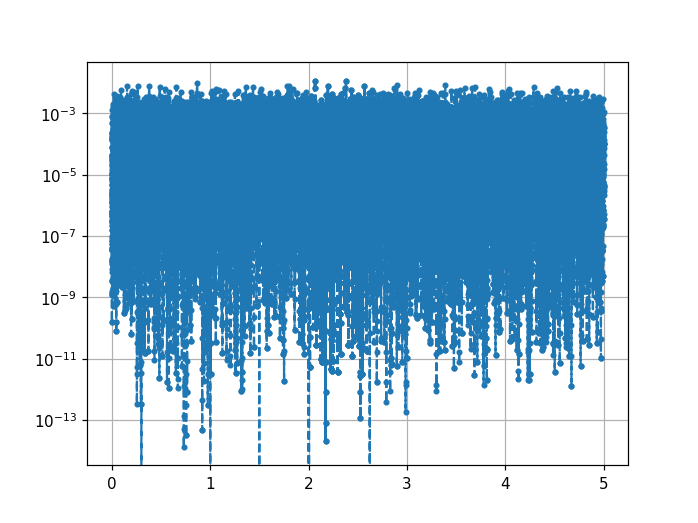

In [603]:
plt.figure()
plt.plot(sol_t[:-1], sol_t[1:]-sol_t[:-1],'.--')
plt.grid()
plt.yscale('log')

<IPython.core.display.Javascript object>


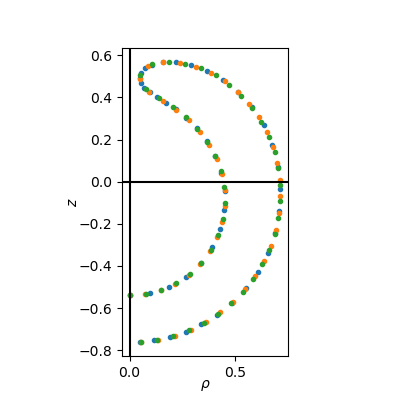

Text(0, 0.5, '$z$')

In [1684]:
%matplotlib notebook
plt.figure(figsize=(4,4))
for t_j in np.linspace(0,t_max,3):#range(len(sol_radau.t)):
    j = np.argmin(np.abs(sol_t-t_j))

    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])
    
    P = get_int_field(-P_fur_j*1j)
    Z = get_int_field(Z_fur_j)
    
    plt.plot(P[::30],Z[::30],'.', label=f't={sol_t[j]:.2f}')


    
plt.axis('scaled')
#plt.legend(ncol=2)
plt.axvline(0, color='k')
plt.axhline(0, color='k')

plt.xlabel(r'$\rho$', labelpad=-1)
plt.ylabel(r'$z$', labelpad=-1)


#P_fur0 = np.zeros(N)
#P_fur0[1::]=sol_y[:N-1,0]
#Z_fur0=sol_y[N-1:,0]

#Vol0, Sqr0,V_cal0 = get_VolSqr(P_fur0, Z_fur0)
#plt.grid()
#plt.title(fr'form '+'\n'+fr' $V={Vol0:.2f}, S={Sqr0:.2f}$, '+r'$\mathcal{V}=$'+fr'${V_cal0:.3f}$')

<IPython.core.display.Javascript object>


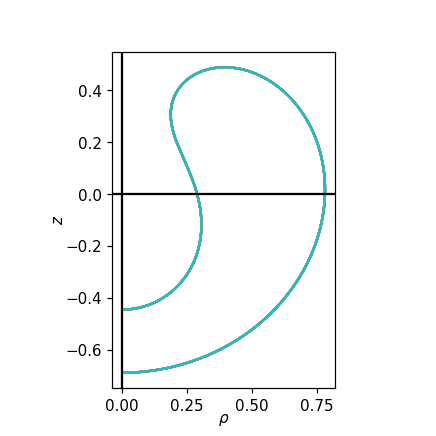

Text(0, 0.5, '$z$')

In [502]:
%matplotlib notebook
plt.figure(figsize=(4,4))
for t_j in np.linspace(0,t_max,10):#range(len(sol_radau.t)):
    j = np.argmin(np.abs(sol_t-t_j))

    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])
    
    P = get_int_field(-P_fur_j*1j)
    Z = get_int_field(Z_fur_j)
    
    plt.plot(P,Z, label=f't={sol_t[j]:.2f}')


    
    
plt.axis('scaled')
#plt.legend(ncol=2)
plt.axvline(0, color='k')
plt.axhline(0, color='k')

plt.xlabel(r'$\rho$', labelpad=-1)
plt.ylabel(r'$z$', labelpad=-1)


#P_fur0 = np.zeros(N)
#P_fur0[1::]=sol_y[:N-1,0]
#Z_fur0=sol_y[N-1:,0]

#Vol0, Sqr0,V_cal0 = get_VolSqr(P_fur0, Z_fur0)
#plt.grid()
#plt.title(fr'form '+'\n'+fr' $V={Vol0:.2f}, S={Sqr0:.2f}$, '+r'$\mathcal{V}=$'+fr'${V_cal0:.3f}$')

In [607]:
dZ_arr = []
t_arr = []
En_arr = []
S_arr = []
V_arr = []
Press_arr = []
Sigma_arr = []
for j in range(len(sol_t)//500):

    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,500*j])

    
    P = get_int_field(-P_fur_j*1j)
    Z = get_int_field(Z_fur_j)
    
    #plt.scatter(t_j,Z[0]-Z[-1],lw=1.5, label=f't={sol_t[j]:.2f}',color='k')
    t_arr.append(sol_t[500*j])
    dZ_arr.append(Z[0]-Z[-1])
    
    En_arr.append(get_Energy(P_fur_j,Z_fur_j))
    
    Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
    S_arr.append(Sqr)
    V_arr.append(Vol)
    
    Sigma,Pressure = get_Sigma_Pressure_from_arr(P_fur_j,Z_fur_j)
    Sigma_arr.append(Sigma)
    Press_arr.append(Pressure)

<IPython.core.display.Javascript object>


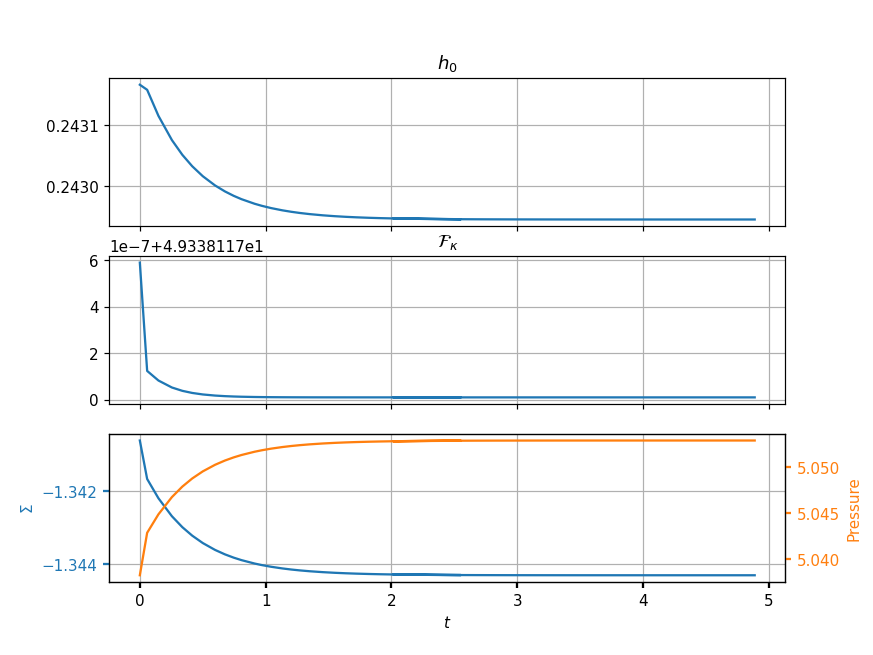

Text(0.5, 0, '$t$')

In [608]:
fig,axs = plt.subplots(3,1,figsize=(8,6), sharex=True)

t_arr =np.array(t_arr)#.append(t_j)
dZ_arr = np.array(dZ_arr)#.append(Z[0]-Z[-1])
axs[0].plot(t_arr,dZ_arr)
axs[0].grid()
#axs[0].axhline(0, color='k')
axs[0].set_title(r'$h_0$')

# plt.figure()
# plt.plot(t_arr[1:],abs((dZ_arr[1:]-dZ_arr[:-1])/(t_arr[1:]-t_arr[:-1])))
# plt.grid()
# plt.yscale('log')



En_arr = np.array(En_arr)
S_arr = np.array(S_arr)
V_arr = np.array(V_arr)
axs[1].plot(t_arr,En_arr)
axs[1].set_title(r'$\mathcal{F}_\kappa$')

axs[1].grid()

#axs[1].set_xlabel(r'$t$')



p1,= axs[2].plot(t_arr,Sigma_arr)
axs[2].grid()
axs[2].set_ylabel(r'$\Sigma $')


twin1 = axs[2].twinx()

p2, = twin1.plot(t_arr,Press_arr,color='C1')




twin1.set_ylabel(r'Pressure')

axs[2].yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())

tkw = dict(size=4, width=1.5)
axs[2].tick_params(axis='y', colors=p1.get_color(), **tkw)
twin1.tick_params(axis='y', colors=p2.get_color(), **tkw)
axs[2].tick_params(axis='x', **tkw)
axs[2].set_xlabel(r'$t$')

<IPython.core.display.Javascript object>


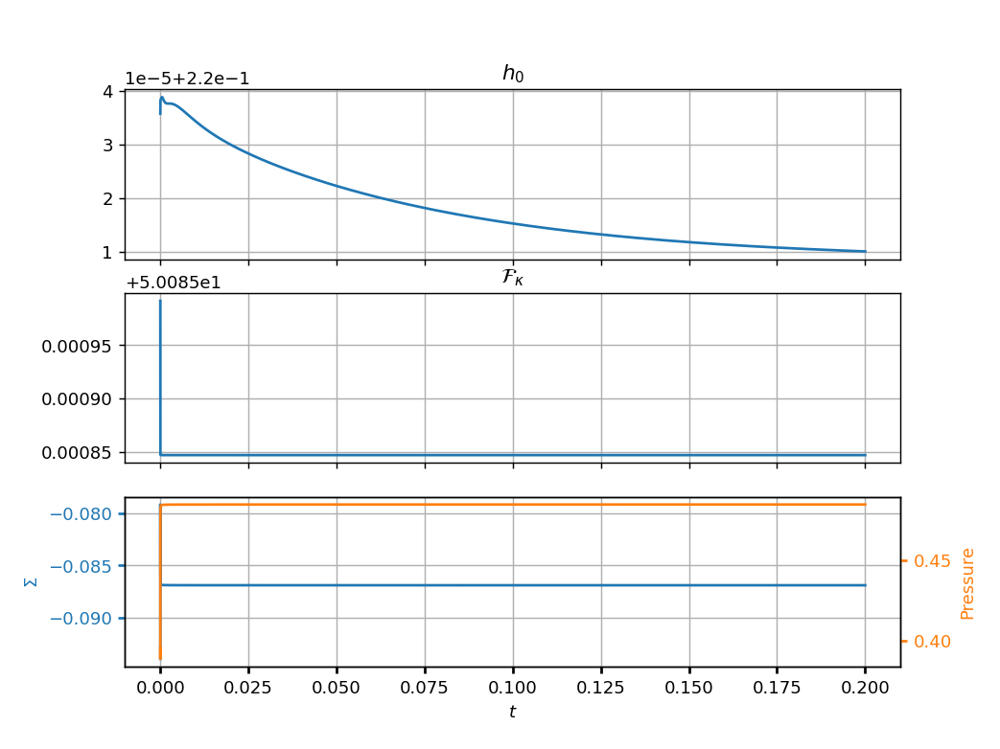

Text(0.5, 0, '$t$')

In [591]:
fig,axs = plt.subplots(3,1,figsize=(8,6), sharex=True)

t_arr =np.array(t_arr)#.append(t_j)
dZ_arr = np.array(dZ_arr)#.append(Z[0]-Z[-1])
axs[0].plot(t_arr,dZ_arr)
axs[0].grid()
#axs[0].axhline(0, color='k')
axs[0].set_title(r'$h_0$')

# plt.figure()
# plt.plot(t_arr[1:],abs((dZ_arr[1:]-dZ_arr[:-1])/(t_arr[1:]-t_arr[:-1])))
# plt.grid()
# plt.yscale('log')



En_arr = np.array(En_arr)
S_arr = np.array(S_arr)
V_arr = np.array(V_arr)
axs[1].plot(t_arr,En_arr)
axs[1].set_title(r'$\mathcal{F}_\kappa$')

axs[1].grid()

#axs[1].set_xlabel(r'$t$')



p1,= axs[2].plot(t_arr,Sigma_arr)
axs[2].grid()
axs[2].set_ylabel(r'$\Sigma $')


twin1 = axs[2].twinx()

p2, = twin1.plot(t_arr,Press_arr,color='C1')




twin1.set_ylabel(r'Pressure')

axs[2].yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())

tkw = dict(size=4, width=1.5)
axs[2].tick_params(axis='y', colors=p1.get_color(), **tkw)
twin1.tick_params(axis='y', colors=p2.get_color(), **tkw)
axs[2].tick_params(axis='x', **tkw)
axs[2].set_xlabel(r'$t$')

<IPython.core.display.Javascript object>


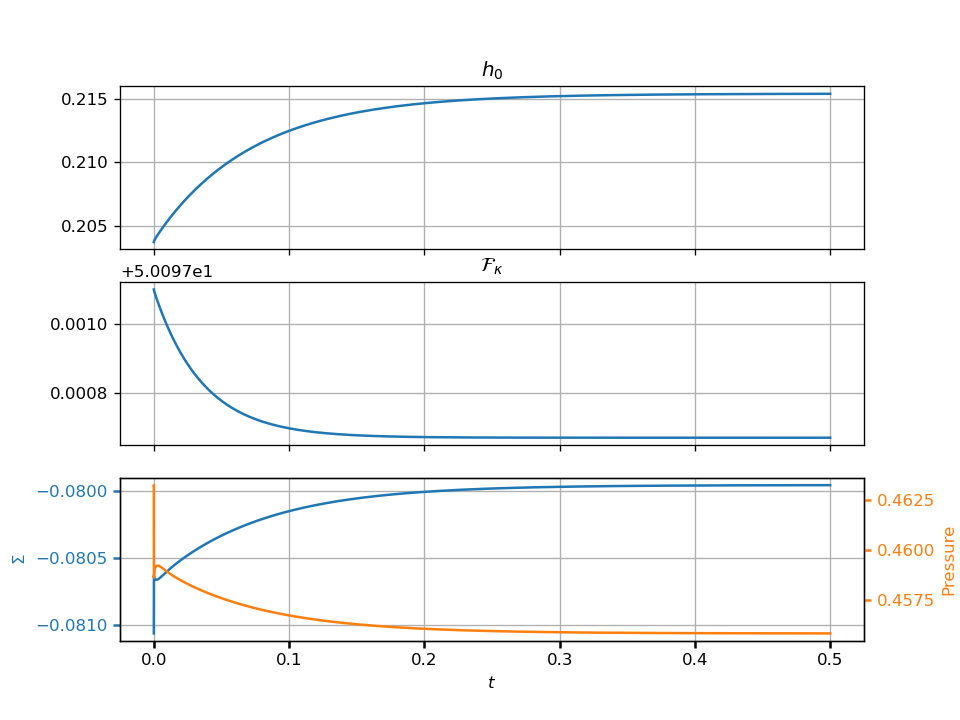

Text(0.5, 0, '$t$')

In [276]:
fig,axs = plt.subplots(3,1,figsize=(8,6), sharex=True)

t_arr =np.array(t_arr)#.append(t_j)
dZ_arr = np.array(dZ_arr)#.append(Z[0]-Z[-1])
axs[0].plot(t_arr,dZ_arr)
axs[0].grid()
#axs[0].axhline(0, color='k')
axs[0].set_title(r'$h_0$')

# plt.figure()
# plt.plot(t_arr[1:],abs((dZ_arr[1:]-dZ_arr[:-1])/(t_arr[1:]-t_arr[:-1])))
# plt.grid()
# plt.yscale('log')



En_arr = np.array(En_arr)
S_arr = np.array(S_arr)
V_arr = np.array(V_arr)
axs[1].plot(t_arr,En_arr)
axs[1].set_title(r'$\mathcal{F}_\kappa$')

axs[1].grid()

#axs[1].set_xlabel(r'$t$')



p1,= axs[2].plot(t_arr,Sigma_arr)
axs[2].grid()
axs[2].set_ylabel(r'$\Sigma $')


twin1 = axs[2].twinx()

p2, = twin1.plot(t_arr,Press_arr,color='C1')




twin1.set_ylabel(r'Pressure')

axs[2].yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())

tkw = dict(size=4, width=1.5)
axs[2].tick_params(axis='y', colors=p1.get_color(), **tkw)
twin1.tick_params(axis='y', colors=p2.get_color(), **tkw)
axs[2].tick_params(axis='x', **tkw)
axs[2].set_xlabel(r'$t$')

<IPython.core.display.Javascript object>


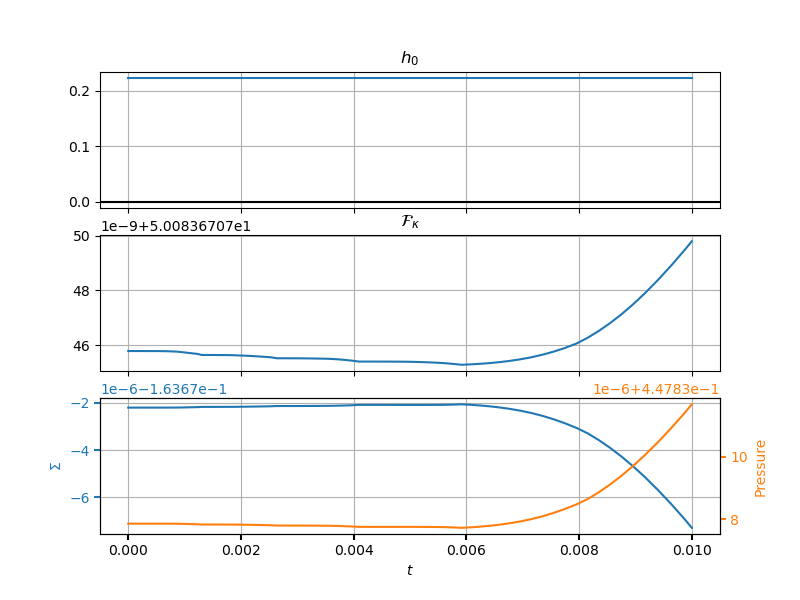

Text(0.5, 0, '$t$')

In [1601]:
fig,axs = plt.subplots(3,1,figsize=(8,6), sharex=True)

t_arr =np.array(t_arr)#.append(t_j)
dZ_arr = np.array(dZ_arr)#.append(Z[0]-Z[-1])
axs[0].plot(t_arr,dZ_arr)
axs[0].grid()
axs[0].axhline(0, color='k')
axs[0].set_title(r'$h_0$')

# plt.figure()
# plt.plot(t_arr[1:],abs((dZ_arr[1:]-dZ_arr[:-1])/(t_arr[1:]-t_arr[:-1])))
# plt.grid()
# plt.yscale('log')



En_arr = np.array(En_arr)
S_arr = np.array(S_arr)
V_arr = np.array(V_arr)
axs[1].plot(t_arr,En_arr)
axs[1].set_title(r'$\mathcal{F}_\kappa$')

axs[1].grid()

#axs[1].set_xlabel(r'$t$')



p1,= axs[2].plot(t_arr,Sigma_arr)
axs[2].grid()
axs[2].set_ylabel(r'$\Sigma $')


twin1 = axs[2].twinx()

p2, = twin1.plot(t_arr,Press_arr,color='C1')




twin1.set_ylabel(r'Pressure')

axs[2].yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())

tkw = dict(size=4, width=1.5)
axs[2].tick_params(axis='y', colors=p1.get_color(), **tkw)
twin1.tick_params(axis='y', colors=p2.get_color(), **tkw)
axs[2].tick_params(axis='x', **tkw)
axs[2].set_xlabel(r'$t$')

<IPython.core.display.Javascript object>


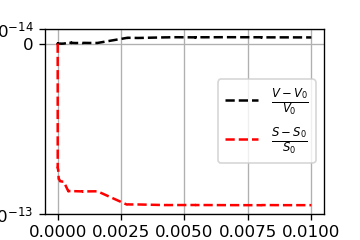

In [1461]:
%matplotlib notebook
Vol0, Sqr0 = get_VolSqr(Pfur_0, Zfur_0)
plt.figure(figsize=(3,2))
plt.grid()
Vol_ar=[]
Sqr_ar=[]
for j in range(len(sol_t)):
    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])
    Vol,Sqr = get_VolSqr(P_fur_j, Z_fur_j)
    Vol_ar.append(Vol)
    Sqr_ar.append(Sqr)
Vol_ar=np.array(Vol_ar)
Sqr_ar=np.array(Sqr_ar)   
plt.plot(sol_t, Vol_ar/Vol0-1,'--', color='k', label=r'$\frac{V-V_0}{V_0}$')
plt.plot(sol_t, Sqr_ar/Sqr0-1,'--', color='r', label=r'$\frac{S-S_0}{S_0}$')

plt.legend()
plt.xlabel(r'$t$')
plt.yscale('symlog', linthresh=1e-12)

In [609]:
%matplotlib inline
@interact(i=(0,len(sol_t)-1,1))
def plot_PZ_fur(i):
    fig, ax = plt.subplots(figsize=(6,4))
    ax.grid()
    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,i])
    
    ax.plot(np.abs(P_fur_j),'.--',lw=1.5)
    ax.plot(np.abs(Z_fur_j),'.--',lw=1.5)
    ax.set_title(f't={sol_t[i]}')
    #ax.axis('scaled')
    ax.set_xlim(0, N)
    ax.set_ylim(1e-15, 1e0)
    ax.set_yscale('log')
    #ax.axis('scaled')


interactive(children=(IntSlider(value=17358, description='i', max=34717), Output()), _dom_classes=('widget-int…

In [610]:
%matplotlib inline
@interact(i=(0,len(sol_t)-1,1))
def plot_PZ_fur(i):
    fig, ax = plt.subplots(figsize=(6,4))
    ax.grid()
    
    ax.plot(np.abs(get_normal_velo_fur_1d(sol_y[:,i])),'.--',lw=1.5)
    ax.set_title(f't={sol_t[i]}')
    #ax.axis('scaled')
    ax.set_xlim(0, N)
    ax.set_ylim(1e-15, 1e0)
    ax.set_yscale('log')
    #ax.axis('scaled')


interactive(children=(IntSlider(value=17358, description='i', max=34717), Output()), _dom_classes=('widget-int…

In [653]:
%matplotlib inline


@interact(k=(0, N-1))
def plot_sol_k(k):
    fig, axs = plt.subplots(1, 2, figsize=(8, 3))
    fig.tight_layout(pad=3.0)
    axs[0].plot(sol_t, sol_y[k+N-1, :], label=fr'Z[{k}]')
    axs[1].plot(sol_t[1:], np.abs(
        (sol_y[k+N-1, 1:]-sol_y[k+N-1, :-1])/(sol_t[1:]-sol_t[:-1])))
    if k > 0:
        axs[0].plot(sol_t, sol_y[k-1, :], label=fr'P[{k}]')
        axs[1].plot(sol_t[1:], np.abs(
            (sol_y[k-1, 1:]-sol_y[k-1, :-1])/(sol_t[1:]-sol_t[:-1])))

    axs[0].grid()
    axs[0].legend()

    axs[1].set_yscale('log')
    #axs[1].set_ylim(1e-11, 1e0)
    axs[1].set_ylabel(r'$|\partial_t|$')
    axs[1].grid()

interactive(children=(IntSlider(value=19, description='k', max=39), Output()), _dom_classes=('widget-interact'…

### State analys

In [602]:
t_max

5

In [611]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))

P_fur_j, Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])

In [612]:
pz_end = sol_y[:,j]

In [613]:
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.66074159511947

In [597]:
np.save(f'stoma_equilib_Vcal={Vcal:.4e}_N={(len(pz_end)+1)//2}.npy', pz_end)

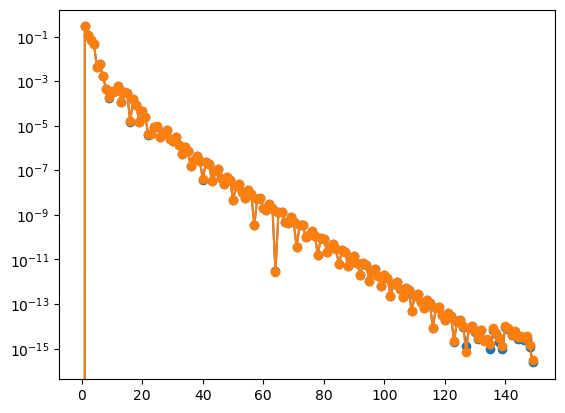

In [614]:
plt.figure()
plt.plot(abs(Pfur_0),'o-')
plt.plot(abs(P_fur_j),'o-')
plt.yscale('log')

In [508]:
P0 = get_int_field(-1j*Pfur_0)
Z0 = get_int_field(Zfur_0)

P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V0 = np.sqrt(P1**2+Z1**2)

H0, force0 = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

In [615]:
P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

<IPython.core.display.Javascript object>


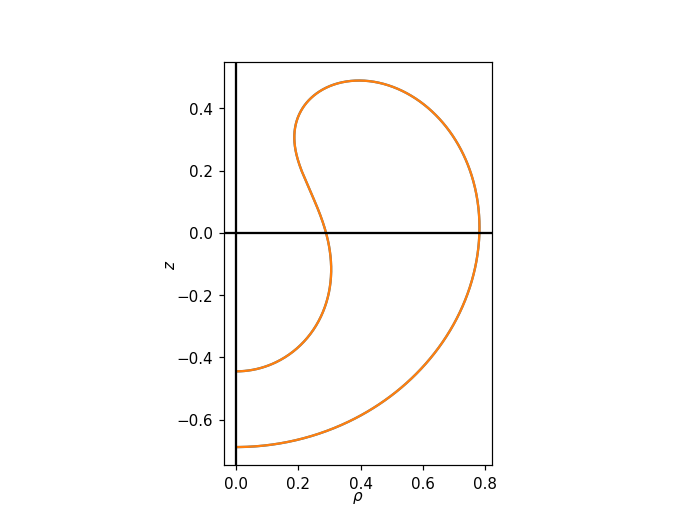

Text(0, 0.5, '$z$')

In [510]:
plt.figure()

plt.plot(P0,Z0)


plt.plot(P,Z)
plt.axis('scaled')
#plt.legend(ncol=2)
plt.axvline(0, color='k')
plt.axhline(0, color='k')

plt.xlabel(r'$\rho$', labelpad=-1)
plt.ylabel(r'$z$', labelpad=-1)


Text(0, 0.5, '$z$')

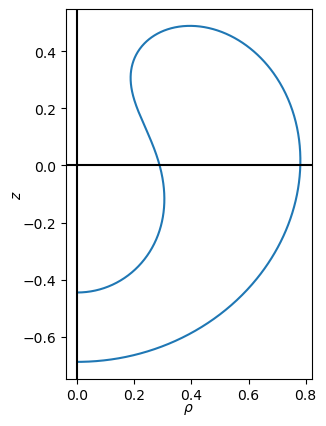

In [616]:
plt.figure()

plt.plot(P,Z)
plt.axis('scaled')
#plt.legend(ncol=2)
plt.axvline(0, color='k')
plt.axhline(0, color='k')

plt.xlabel(r'$\rho$', labelpad=-1)
plt.ylabel(r'$z$', labelpad=-1)


In [281]:
# P_fur_j_cut, Z_fur_j_cut = get_PZ_fur_from_pz(sol_y[:81,j])

# P_cut, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j_cut)
# Z_cut, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j_cut)
# V_cut = np.sqrt(P1**2+Z1**2)

# H_cut, force_cut = get_H_force(P_cut,P1,P2,P3,P4,Z_cut,Z1,Z2,Z3,Z4) 
# plt.figure()

# plt.plot(P0,Z0)


# plt.plot(P,Z,'--')
# plt.plot(P_cut,Z_cut)


# plt.axis('scaled')
# #plt.legend(ncol=2)
# plt.axvline(0, color='k')
# plt.axhline(0, color='k')

# plt.xlabel(r'$\rho$', labelpad=-1)
# plt.ylabel(r'$z$', labelpad=-1)


In [617]:
Sigma,Pressure= get_Sigma_Pressure(H,force,P,V)

Text(0.5, 0, '$\\tau$')

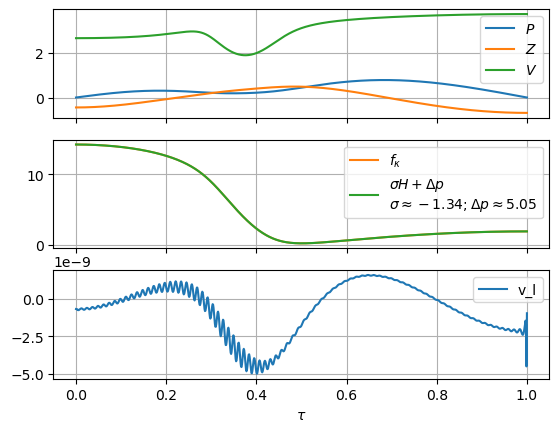

In [618]:
fig,axs = plt.subplots(3,1, sharex=True)
axs[0].plot(Tau_int,P)
axs[0].plot(Tau_int,Z)
axs[0].plot(Tau_int,V)
axs[0].grid()
axs[0].legend([r'$P$',r'$Z$',r'$V$'])

#axs[1].plot(H)

axs[1].plot(Tau_int,force, label=r'$f_\kappa$',color='C1')
axs[1].plot(Tau_int,Sigma*H+Pressure, 
            label=fr'$\sigma H + \Delta p$'+'\n'fr'$\sigma\approx{Sigma:.2f}; \Delta p \approx{Pressure:.2f}$',
            color='C2')
axs[1].legend()
axs[1].grid()

axs[2].plot(Tau_int,get_normal_velo(H, force, P, V), label='v_l')
axs[2].legend()
axs[2].grid()
axs[2].set_xlabel(r'$\tau$')

<IPython.core.display.Javascript object>


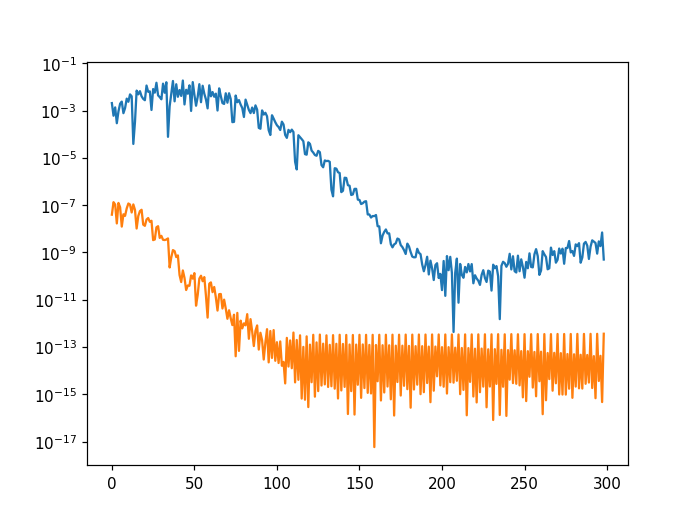

In [191]:
plt.figure()
plt.plot(abs(get_normal_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.plot(abs(get_normal_velo_fur_1d(get_pz_from_PZ_fur(P_fur_j, Z_fur_j))))

plt.yscale('log')

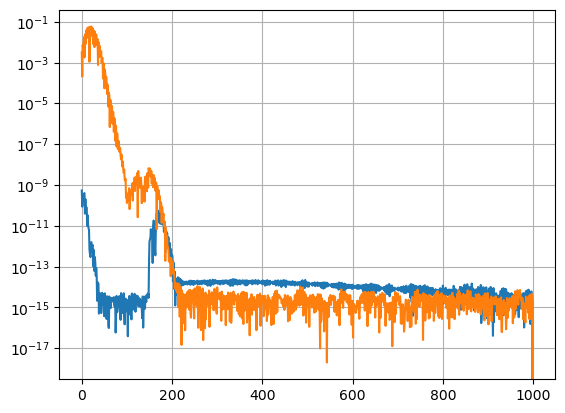

In [619]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0]))
plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[0]))

plt.yscale('log')
plt.grid()

<IPython.core.display.Javascript object>


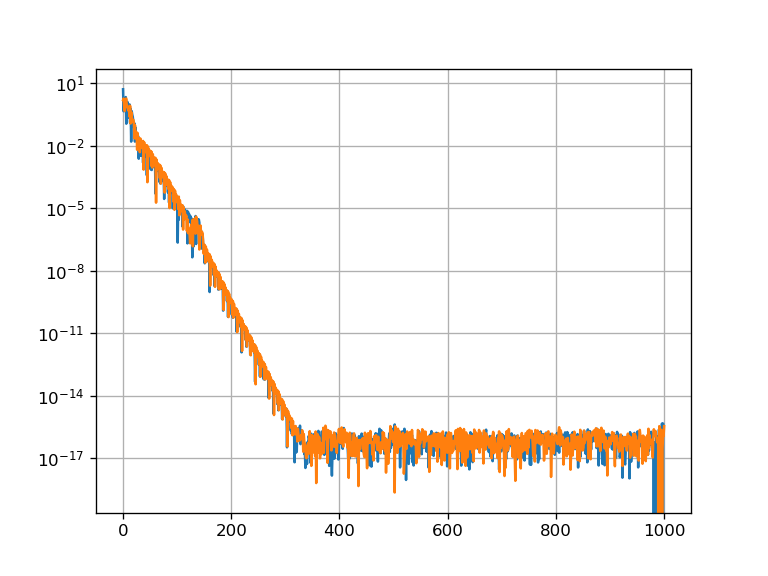

In [293]:
plt.figure()
plt.plot(abs(get_gauge_velo_projects_full(P_fur_j, Z_fur_j)[0]))
plt.plot(abs(get_gauge_velo_projects_full(P_fur_j, Z_fur_j)[1]))

plt.yscale('log')
plt.grid()

<IPython.core.display.Javascript object>


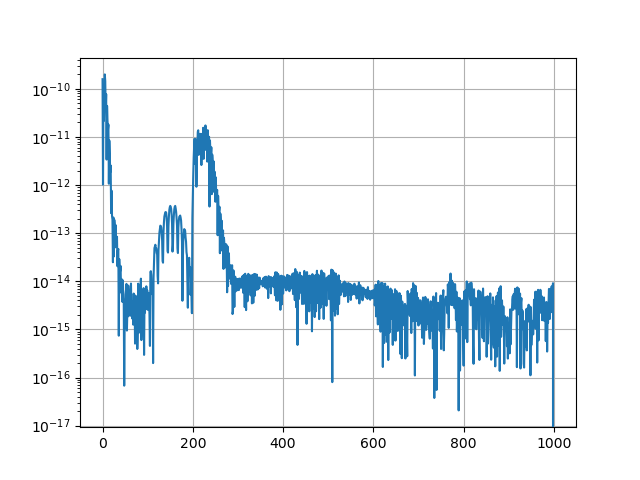

In [1040]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0]))

plt.yscale('log')
plt.grid()

<IPython.core.display.Javascript object>


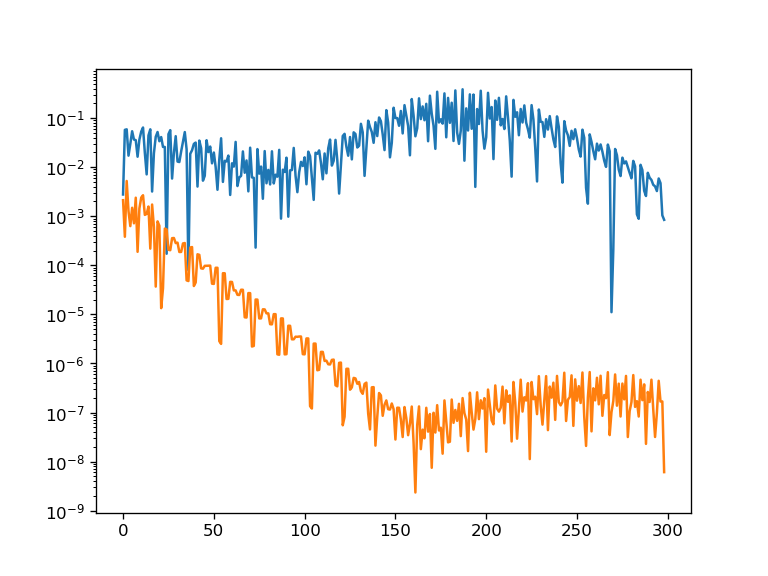

In [178]:
plt.figure()
plt.plot(abs(get_velo_with_nat_gauge_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.plot(abs(get_velo_with_nat_gauge_fur_1d(get_pz_from_PZ_fur(P_fur_j, Z_fur_j))))

plt.yscale('log')

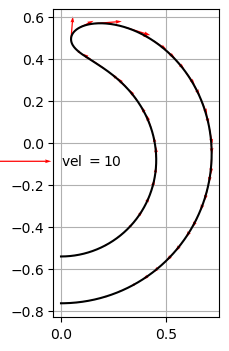

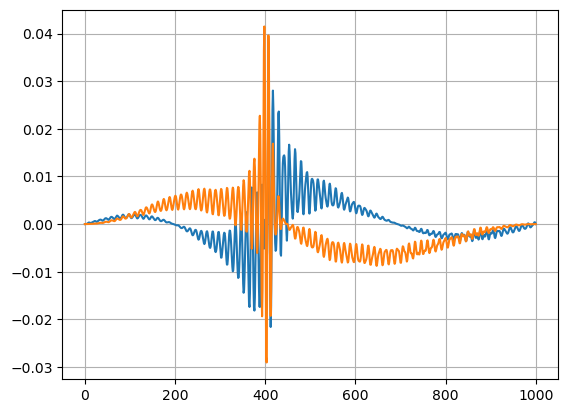

In [1344]:
t_ = get_gauge_velo(P_fur_j, Z_fur_j)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

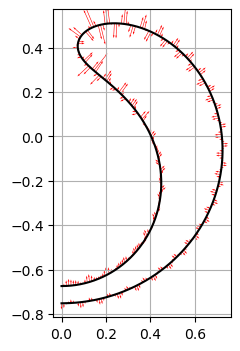

In [66]:
t_ = get_velo(P_fur_j, Z_fur_j)
fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')

Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], t_[0],t_[1], color='red')
#qk = ax.quiverkey(Qnow, 0.4, 0.5, 1e-2, r'vel $=10$', labelpos='E',
#                  coordinates='figure')
ax.axis('scaled')
ax.grid()
#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')

<IPython.core.display.Javascript object>


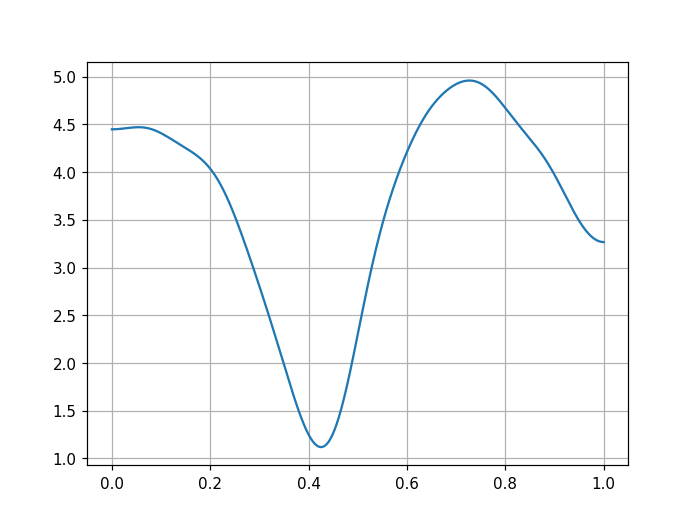

In [603]:
plt.figure()
plt.plot(Tau_int,V)
plt.grid()

In [1164]:
H1 = (Z1*P2-P1*Z2)/V**3
H2 = -Z1/P/V

In [856]:
a_H = get_a_H(P_fur_j,Z_fur_j)

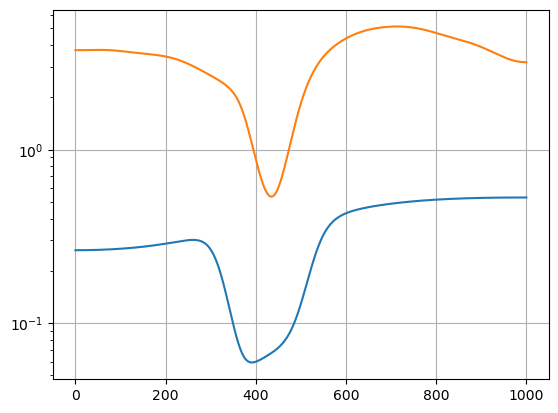

In [861]:
plt.figure()
plt.plot(a_H)
plt.plot(V)

plt.grid()
plt.yscale('log')

#### Jac_normal

In [209]:
N_jac = 200

In [448]:
J = get_J_norm(P_fur_j,Z_fur_j, N_jac)

<IPython.core.display.Javascript object>


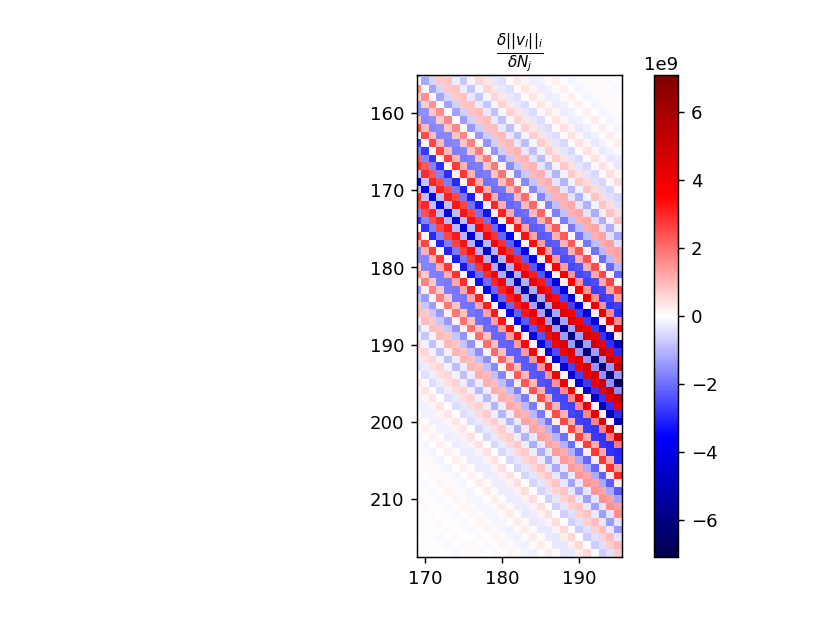

<IPython.core.display.Javascript object>


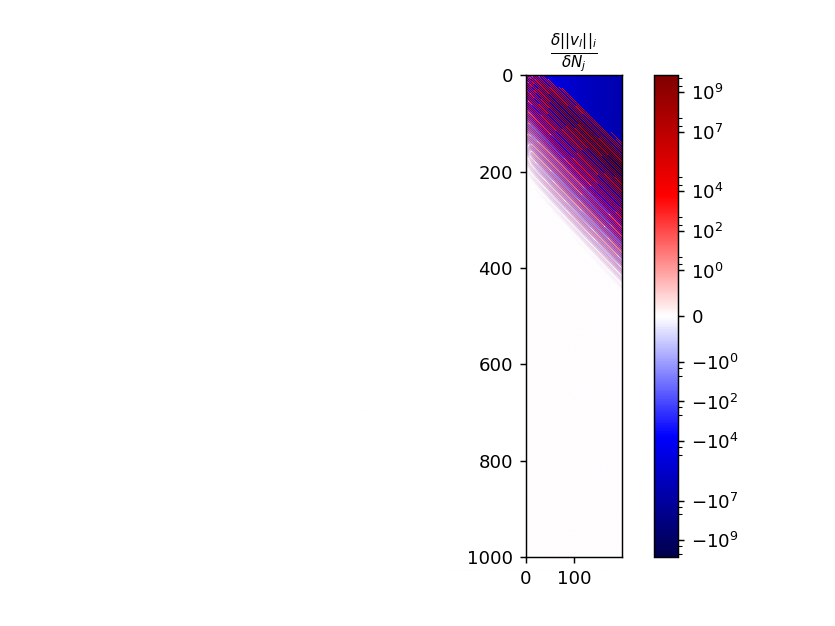

In [189]:
plt.figure()
plt.title(r'$\frac{\delta ||v_l||_i}{\delta N_j}$')
plt.imshow(J, norm=colors.CenteredNorm(0), cmap='seismic')
plt.colorbar()




lnrwidth=1e-2
gain=np.max(abs(J))

plt.figure()
plt.title(r'$\frac{\delta ||v_l||_i}{\delta N_j}$')
plt.imshow(J, norm=colors.AsinhNorm(linear_width=lnrwidth,
                                             vmin=-gain, vmax=gain), cmap='seismic')
plt.colorbar()

In [449]:
w,U = sc.linalg.eig(J[:N_jac])

<IPython.core.display.Javascript object>


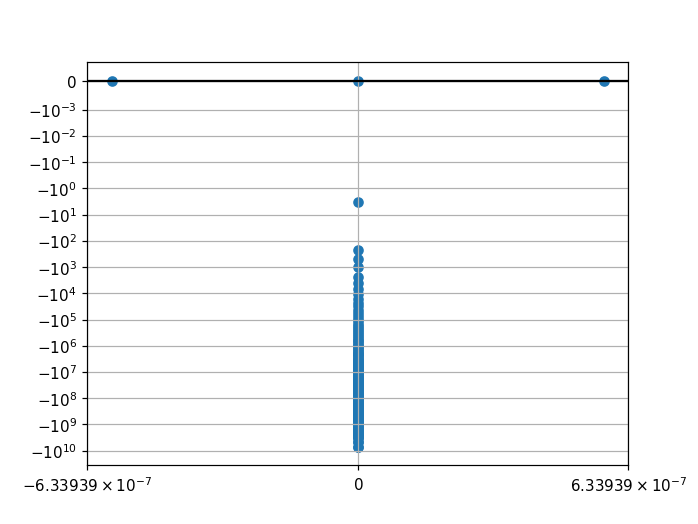

In [450]:
plt.figure()
plt.scatter(w.imag, w.real)
plt.grid()
plt.yscale('symlog', linthresh=1e-3)
plt.xscale('symlog', linthresh=1e-3)
plt.axhline(0, color='k')

In [386]:
N_jac_arr = np.arange(6,N_jac,1)

w_arr = np.zeros((6,len(N_jac_arr)))

for i in tqdm(range(len(N_jac_arr))):
    N_jac_ = N_jac_arr[i]
    w_,U_ = sc.linalg.eig(J[:N_jac_,:N_jac_])
    w_arr[:,i]=np.sort(w_.real)[-6:]

  0%|          | 0/194 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


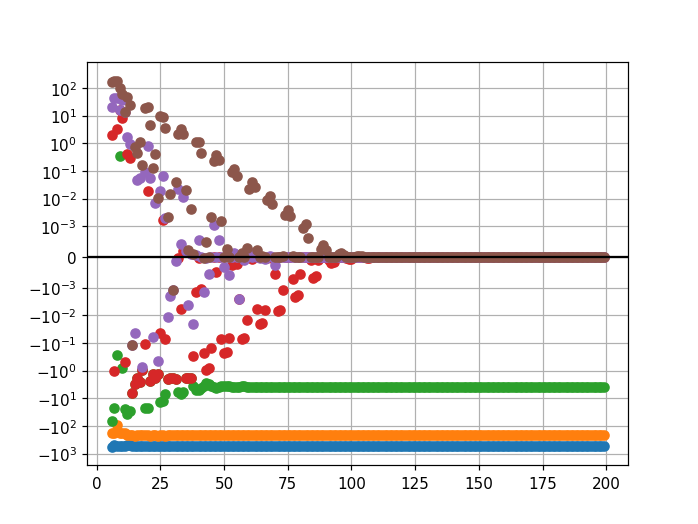

In [387]:
plt.figure()
for i in range(6):
    plt.plot(N_jac_arr,w_arr[i,:],'o')
plt.grid()
plt.yscale('symlog', linthresh=1e-3)
plt.axhline(0, color='k')

In [1973]:

N_jac_arr = np.arange(10,N_jac,1)

s_arr = np.zeros((10,len(N_jac_arr)))

for i in tqdm(range(len(N_jac_arr))):
    N_jac_ = N_jac_arr[i]
    s = sc.linalg.svdvals(J[:,:N_jac_])
    s_arr[:,i]=np.sort(s.real)[:10]

  0%|          | 0/190 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


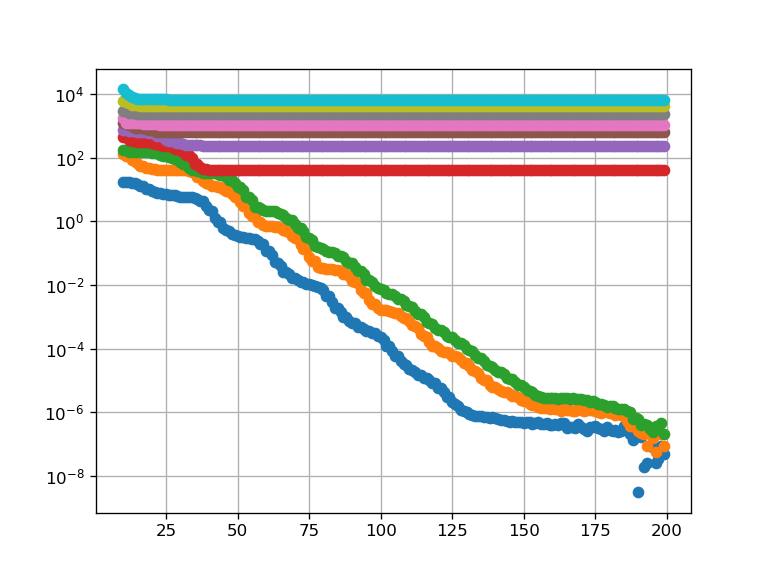

In [1974]:
plt.figure()
for i in range(10):
    plt.plot(N_jac_arr,s_arr[i,:],'o')
plt.grid()
plt.yscale('log')
plt.axhline(0, color='k')

In [388]:
l_rho = -Z1/V;l_z = P1/V;

In [1484]:
%matplotlib inline
@interact(m=(0,6), scale=(10,200,10))
def plot_m_pert(m,scale):
    w_m = np.sort(w)[::-1][m]
    #index_m = np.argmin(np.abs(w - w_m))
    index_m, = np.where(np.isclose(w, w_m))
    
    v_m = U[:, index_m].real.reshape(-1)
    plt.figure()
    plt.plot(v_m, '.--',label=f'w={w_m.real:.2e}')
    plt.yscale('symlog', linthresh=1e-4)
    plt.legend(loc='upper right')
    plt.grid()
    
    v_m /= scale
    dN = get_int_field(v_m)
    plt.figure()
    
    P_corr = P+l_rho*dN; Z_corr = Z+l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')
    
    

interactive(children=(IntSlider(value=3, description='m', max=6), IntSlider(value=100, description='scale', ma…

In [1976]:
U_zero = U[:,abs(w)<1e-4]
U_zero.shape

(200, 3)

In [1836]:
U_zero[:,1]=U_zero[:,1].real
U_zero[:,2]=U_zero[:,2].imag

In [451]:
U,s,Vh = sc.linalg.svd(J)

U_zero = Vh[s<1e-3].T
U_zero.shape

(200, 3)

In [452]:
VarE = -get_force_proj_N(P,P1,Z,Z1, force, N_jac)
VarVol = get_Var_Vol_proj_N(P,P1,Z,Z1, N_jac)
VarSqr = get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_jac)
VarVcal = VarVol/Vol - 3/2 * VarSqr/Sqr
VarVcal *= Vcal

In [453]:
VarE_zero = VarE.T @ U_zero
VarVol_zero = VarVol.T @ U_zero
VarSqr_zero = VarSqr.T @ U_zero

In [454]:
sc.linalg.svdvals(np.vstack([VarE_zero,VarVol_zero, VarSqr_zero]))

array([6.32867987e+00, 2.56175673e-01, 2.41771325e-14])

$$
\delta \mathcal{V}= \mathcal{V}\left(\frac{\delta V}{V} -\frac{3}{2}\frac{\delta S}{S}\right)
$$

In [455]:
VarVcal_zero = VarVol_zero/Vol - 3/2 * VarSqr_zero/Sqr
VarVcal_zero *= Vcal

In [456]:
VarVcal_zero

array([-0.00980419, -0.02032239, -0.00768752])

In [320]:
# step_sizes=np.logspace(-9,-4,20)
# for step_size in step_sizes:
#     m=3
#     w_m = np.sort(w)[::-1][m]
#     #index_m = np.argmin(np.abs(w - w_m))
#     index_m, = np.where(np.isclose(w, w_m))
    
#     delta_N_fur = U[:, index_m].real.reshape(-1)*step_size
    
    
#     delta_N = get_int_field(delta_N_fur)
    
#     ### find new fields ###
#     P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N
    
#     P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:400]).real
#     Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:400].real
#     Vol_j = get_VolSqr(P_fur_j, Z_fur_j)[0]
#     Vol_new_pl,Sqr_new_pl = get_VolSqr(P_fur_new, Z_fur_new)
    
#     ### find new fields ###
#     P_new = P-l_rho*delta_N;Z_new = Z-l_z*delta_N
    
#     P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:400]).real
#     Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:400].real
#     Vol_new_m,Sqr_new_m = get_VolSqr(P_fur_new, Z_fur_new)
    
#     #print((Vol_new_pl-Vol_new_m)/step_size/2, VarVol.T @ delta_N_fur/step_size *(2*np.pi))
#     print((Sqr_new_pl-Sqr_new_m)/step_size/2, VarSqr.T @ delta_N_fur/step_size *(2*np.pi))
#     #print((get_Energy(P_fur_new, Z_fur_new)-get_Energy(P_fur_j, Z_fur_j))/step_size, VarE.T @ delta_N_fur/step_size *(2*np.pi))

In [457]:
_,sng,U_sng =sc.linalg.svd([VarVcal_zero])

In [458]:
VarVcal_zero.T @ U_sng[0], VarVcal_zero.T @ U_sng[1], VarVcal_zero.T @ U_sng[2]

(0.02383735573138586, -3.469446951953614e-18, -8.673617379884035e-19)

In [459]:
VarE_zero.T @ U_sng[0], VarE_zero.T @ U_sng[1], VarE_zero.T @ U_sng[2]

(-0.2591506952261097, 1.4155343563970746e-14, -1.4059586828096826e-13)

0.0001999999999999999
0.0004999999999999999
0.0007999999999999996
0.0009999999999999998
0.0019999999999999996


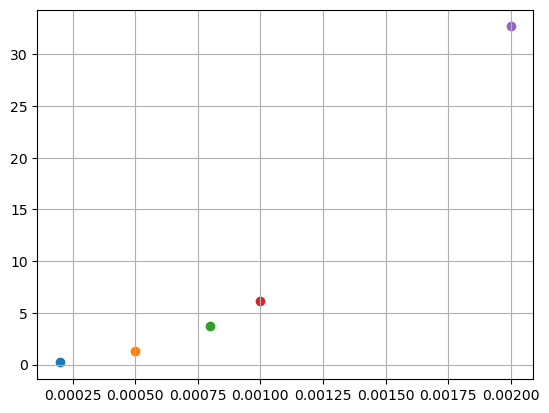

In [119]:
plt.figure()
plt.grid()
for step_size in [2e-4, 5e-4, 8e-4, 1e-3,2e-3]:
    delta_N_fur = (step_size/(VarVcal_zero.T @ U_sng[0])*(U_zero @ U_sng[0])).real/(2*np.pi)
    delta_N = get_int_field(delta_N_fur)
    print(VarVcal.T @ delta_N_fur*2*np.pi)
    ### find new fields ###
    P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N

    P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
    Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real
    plt.scatter(step_size, np.linalg.norm((get_normal_velo_projects_full(P_fur_new, Z_fur_new)[0])))
    

In [472]:
step_size=1e-4

In [473]:
delta_N_fur = (step_size/(VarVcal_zero.T @ U_sng[0])*(U_zero @ U_sng[0])).real/(2*np.pi)
delta_N = get_int_field(delta_N_fur)
print(VarVcal.T @ delta_N_fur*2*np.pi)
### find new fields ###
P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N

P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real


9.999999999999925e-05


In [474]:
Vol_new,Sqr_new = get_VolSqr(P_fur_new,Z_fur_new)
Vcal_new = Vol_new/4/np.pi*3/(Sqr_new/4/np.pi)**(3/2)

Vcal_new-Vcal

9.97025251615602e-05

In [475]:
Vcal_new

0.6607415951194074

<IPython.core.display.Javascript object>


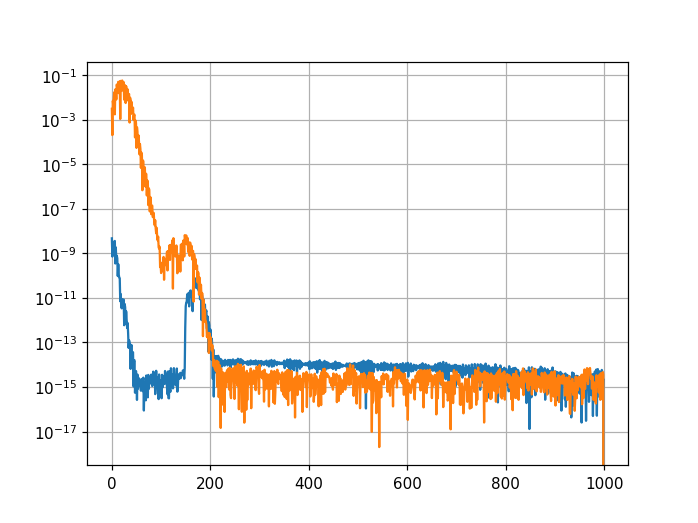

In [476]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0]))
plt.plot(abs(get_normal_velo_projects_full(P_fur_new, Z_fur_new)[0]))

plt.yscale('log')
plt.grid()

<IPython.core.display.Javascript object>


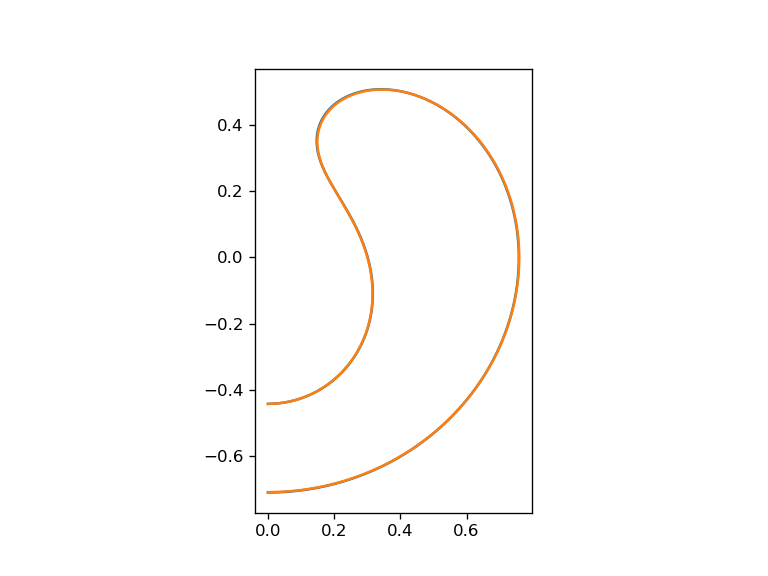

(-0.03796202885007144,
 0.7972026058515,
 -0.7714810668517391,
 0.5688483994996401)

In [1875]:
plt.figure()
plt.plot(P,Z)
plt.plot(P_new, Z_new)
plt.axis('scaled')

In [78]:
H1,H2 = get_H12_from_ar(P_fur_new, Z_fur_new)
a_loc = 1/(H1**2 + H2**2)**(1/2)*np.sqrt(2)
P0= get_int_field(-1j*P_fur_new);Z0 = get_int_field(Z_fur_new)
a_h = (Z0[0]-Z0[-1])/2;
alpha = 2
a_reg = 1/(1/a_h/alpha+1/a_loc)

<IPython.core.display.Javascript object>


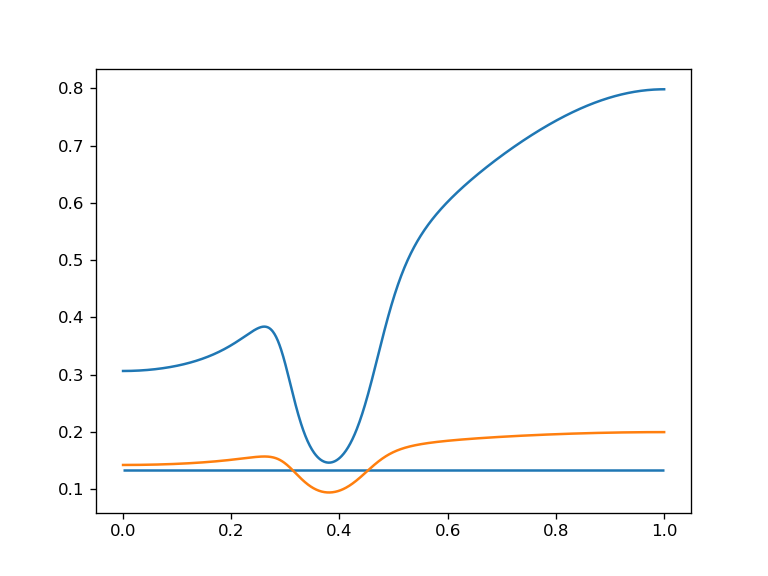

In [1877]:
plt.figure()
plt.plot(Tau_int,a_loc)
plt.hlines(a_h,0,1)
plt.plot(Tau_int,a_reg)

In [79]:
P_fur_new,Z_fur_new = make_F_v_repar(P_fur_new, Z_fur_new, a_reg,N_proj=N)

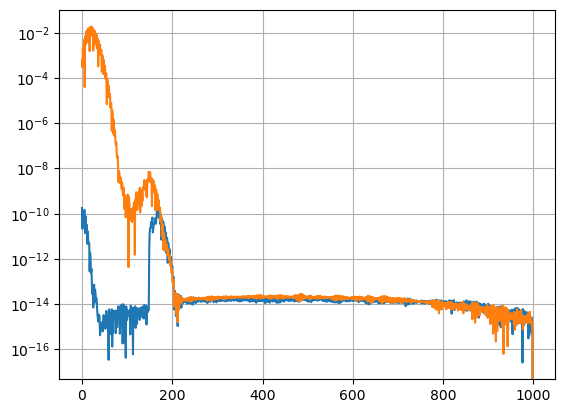

In [148]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0]))
plt.plot(abs(get_normal_velo_projects_full(P_fur_new, Z_fur_new)[0]))

plt.yscale('log')
plt.grid()

### Find brunch

In [81]:
t_max=0.7

In [999]:
step_size=5e-3

In [123]:
def fun_a(t,pz):
    return get_normal_velo_fur_1d(pz)

In [54]:
P_fur_new,Z_fur_new = get_PZ_fur_from_pz(np.load('stoma_equilib_Vcal=6.577e-01_N=200.npy'))
Vol,Sqr = get_VolSqr(P_fur_new,Z_fur_new)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.6576955206821575

In [55]:
P_fur_j,Z_fur_j = get_PZ_fur_from_pz(np.load('stoma_equilib_Vcal=6.577e-01_N=200.npy'))
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.6576955206821575

In [124]:
Vcal

0.6600926693580281

In [1470]:
P_fur_j,Z_fur_j = get_PZ_fur_from_pz(np.load('stoma_equilib_Vcal=6.447e-01_N=200.npy'))
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.6447215626152049

In [1888]:
P_fur_j,Z_fur_j = get_PZ_fur_from_pz(np.load('stoma_equilib_Vcal=6.607e-01_N=200.npy'))
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.660676403493854

In [131]:
np.load('stoma_equilib_data_Vcal=6.602e-01.npy', allow_pickle=True)

array({'Vol': 1.4379420951777822, 'Sqr': 8.125772107568151, 'Vcal': 0.6601925622997348, 'Sigma': -1.2647072468563685, 'Pressure': 4.764551092381767, 'initial': {'pz': array([-6.17940866e-02,  2.84223637e-01,  8.05443727e-02, -1.22785332e-01,
       -2.57241701e-01,  7.12228390e-02, -1.24315567e-02,  4.79318970e-02,
        8.33298956e-03,  5.12127566e-03, -6.37991291e-03, -6.36639467e-03,
       -5.67822573e-03, -2.62034376e-03,  2.56860294e-04,  4.42208274e-04,
        1.85565240e-03,  2.69055541e-04,  1.85657183e-04, -1.83342051e-04,
       -8.11554871e-04,  1.78683706e-04, -2.95627626e-04,  4.36589415e-04,
        3.41091172e-04,  1.20511246e-04,  2.94737647e-04, -2.56990572e-04,
       -4.58779410e-05, -2.47407209e-04, -1.63717871e-04, -3.63542241e-06,
       -5.60746958e-05,  1.33359992e-04,  3.93632405e-05,  8.50906334e-05,
        3.57879605e-05, -8.37019905e-06,  3.43409291e-06, -4.07979183e-05,
       -3.04441062e-06, -2.36183098e-05,  2.45392130e-06, -3.46120487e-06,
       -

In [151]:
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.6601925622997349

In [150]:
Vol,Sqr = get_VolSqr(P_fur_new,Z_fur_new)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.6602924429805259

In [128]:
while Vcal<0.661:
    Pfur_0,Zfur_0 = P_fur_new.copy(), Z_fur_new.copy()
    

    sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                               method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

    sol_t = sol_rad.t.copy()
    sol_y = sol_rad.y.copy()


    t_j=t_max
    j=np.argmin(np.abs(t_j-sol_t))
    P_fur_j, Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])


    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j)
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 


    pz_end = sol_y[:,j]
    Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
    Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
    print(f'Vcal={Vcal:.4e}','|',f'v_max={abs(get_normal_velo(H,force, P,V)).mean():.1e}')
    if abs(get_normal_velo(H,force, P,V)).mean()>2e-8:
        t_max *=1.3
        print(f'Extend t_max={t_max}')
        
    np.save(f'stoma_equilib_Vcal={Vcal:.4e}_N={(len(pz_end)+1)//2}.npy', pz_end)

    J = get_J_norm(P_fur_j,Z_fur_j, N_jac)
    w,U = sc.linalg.eig(J[:N_jac])

    #U_zero = U[:,abs(w)<1e-4]
    U,s,Vh = sc.linalg.svd(J)

    U_zero = Vh[s<1e-3].T

    
    VarVol = get_Var_Vol_proj_N(P,P1,Z,Z1, N_jac)
    VarSqr = get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_jac)
    VarVol_zero = VarVol.T @ U_zero
    VarSqr_zero = VarSqr.T @ U_zero
    VarVcal_zero = VarVol_zero/Vol - 3/2 * VarSqr_zero/Sqr
    VarVcal_zero *= Vcal

    _,sng,U_sng =sc.linalg.svd(np.vstack([VarVcal_zero]))
    vec = U_sng[0]

    delta_N_fur = (step_size/(VarVcal_zero.T @ U_sng[0])*(U_zero @ U_sng[0])).real/(2*np.pi)
    delta_N = get_int_field(delta_N_fur)
    #print(VarVcal.T @ delta_N_fur*2*np.pi)
    ### find new fields ###
    P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N
    P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
    Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real
    # 
    # H1,H2 = get_H12_from_ar(P_fur_new, Z_fur_new)
    # a_loc = 1/(H1**2 + H2**2)**(1/2)*np.sqrt(2)
    # P0= get_int_field(-1j*P_fur_new);Z0 = get_int_field(Z_fur_new)
    # a_h = (Z0[0]-Z0[-1])/2;
    # alpha = 2
    # a_reg = 1/(1/a_h/alpha+1/a_loc)
    # P_fur_new,Z_fur_new = make_F_v_repar(P_fur_new, Z_fur_new, a_reg,N_proj=N)

Vcal=6.602e-01 | v_max=6.3e-10
Vcal=6.602e-01 | v_max=6.3e-10


KeyboardInterrupt: 

### Continue intagrate with more N

In [42]:
data = np.load('dyn_rad_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=1.0_N=80_n_int=120_rad_atol=1.00e-09.npy', allow_pickle=True).item()
sol_y = data['y']
sol_t=data['t']

t_max = np.max(sol_t)

In [509]:
N = 160
n_int=300

In [510]:
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

In [511]:
weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

In [512]:
t_j=2.
j=np.argmin(np.abs(t_j-sol_t))

In [380]:
N = 120
n_int=300
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

In [513]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [514]:
N_old = (pz_start.shape[0]+1)//2
N_old

120

In [515]:
### Resize ###
pz_start = np.zeros(2*N-1)
pz_start[:N_old-1] = sol_y[:,j][:N_old-1]
pz_start[N-1:N-1 +N_old] = sol_y[:,j][N_old-1:]

In [133]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 500 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_velo_a_fur_1d(pz)

In [134]:
t_end = 2.

In [135]:
atol = 1e-9
rtol = atol/10

In [86]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:j_a_fun(pz),atol=atol, rtol=rtol);

0.19456005535713722
[ 4.68945895e-01 -6.44248843e-02  9.36665693e-03  1.25062256e-02
  1.81155125e-03  2.33054832e-03  3.33924336e-04 -5.05820479e-03
 -2.30426361e-03  2.61364560e-04  1.19525954e-03  4.49617355e-04
  4.58022828e-05 -1.89900496e-04 -1.38368881e-04 -4.72437726e-05
  3.17663923e-05  5.45062307e-05  2.05197357e-05 -1.14158125e-05
 -1.94776949e-05 -5.98727607e-06  3.98337736e-06  4.85877652e-06
  1.65096146e-06 -3.95139830e-07 -9.16260926e-07 -9.02529610e-07
 -3.24431286e-07  3.36822227e-07  5.02975664e-07  1.28963799e-07
 -1.88380915e-07 -1.62888293e-07 -5.51588565e-09  5.16768776e-08
  2.26793718e-08  5.44969168e-09  5.14367961e-09 -4.29033625e-09
 -1.38025294e-08 -5.97373172e-09  6.77503520e-09  7.14843057e-09
 -5.57044397e-10 -3.54295096e-09 -8.43915754e-10  9.90566146e-10
  1.59492316e-10 -3.71485811e-10  1.97147162e-10  4.30721985e-10
 -1.39326218e-10 -3.77636253e-10 -5.79359730e-11  2.23267811e-10
  6.16307498e-11 -9.06759797e-11 -6.52045228e-11  4.51715521e-11
  5.3

In [137]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:j_a_fun(pz),atol=atol, rtol=rtol);

0.7
[ 3.73983512e-01 -7.70426161e-02  3.75241746e-02  2.68817925e-02
  1.28425198e-02 -1.80873615e-03 -9.14641245e-03 -9.88644252e-03
 -8.97869178e-04  4.72898683e-03  3.91758030e-03 -6.38410388e-05
 -2.21112767e-03 -1.60398751e-03  1.09734846e-04  1.05135201e-03
  7.55366473e-04 -7.30886133e-05 -5.46986751e-04 -3.85817912e-04
  5.58033846e-05  3.00224883e-04  1.99439420e-04 -4.27347816e-05
 -1.66737986e-04 -1.03378738e-04  2.94512422e-05  9.29307399e-05
  5.46544839e-05 -1.89523015e-05 -5.25423064e-05 -2.96167143e-05
  1.20628499e-05  3.02278363e-05  1.62337365e-05 -7.74363407e-06
 -1.75607070e-05 -8.90758932e-06  4.95722839e-06  1.02394109e-05
  4.90119641e-06 -3.13994893e-06 -5.99648456e-06 -2.71645280e-06
  1.97755228e-06  3.53434567e-06  1.51365066e-06 -1.24664118e-06
 -2.09484247e-06 -8.43680352e-07  7.86665963e-07  1.24548482e-06
  4.69284614e-07 -4.95761923e-07 -7.42275269e-07 -2.60920583e-07
  3.11748845e-07  4.43530339e-07  1.44888867e-07 -1.96047786e-07
 -2.65878081e-07 -8.0

1.4185969155969322
[ 3.14633338e-01 -8.04433280e-02  6.70224962e-02  3.57649310e-02
  1.19110278e-02 -1.23172659e-02 -1.96598455e-02 -7.67510729e-03
  8.60251104e-03  1.16327827e-02  1.85617129e-03 -7.47936212e-03
 -6.82009721e-03  6.82196559e-04  5.80321478e-03  3.79405750e-03
 -1.74790187e-03 -4.40697903e-03 -1.95279839e-03  2.11455146e-03
  3.25888861e-03  7.55115701e-04 -2.15247124e-03 -2.32058459e-03
  1.75377792e-05  1.99192787e-03  1.54856452e-03 -4.98300380e-04
 -1.72855487e-03 -9.33930668e-04  7.63976755e-04  1.41744859e-03
  4.57191391e-04 -8.79320133e-04 -1.10041088e-03 -1.03347243e-04
  8.88358265e-04  7.99943533e-04 -1.46809344e-04 -8.27406757e-04
 -5.31986303e-04  3.09291734e-04  7.22492815e-04  3.03946155e-04
 -4.01031160e-04 -5.94912073e-04 -1.19595981e-04  4.36914760e-04
  4.59971427e-04 -2.16597620e-05 -4.31160948e-04 -3.29226903e-04
  1.22518734e-04  3.96047068e-04  2.10364408e-04 -1.87556525e-04
 -3.42241787e-04 -1.08185918e-04  2.22281838e-04  2.78600013e-04
  2.51

In [87]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [140]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)

In [256]:
t_max = t_end

In [254]:
np.save(f'dyn_corr_rad_to_t=1_{t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

## Sheme comp

In [312]:
t_max=5e-3

In [313]:
atol_list_bdf=[1e-7,1e-8,1e-9,1e-10]
atol_list_radau=[1e-7,1e-8,1e-9,1e-10]

In [215]:
f'dyn_rk_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rk_max_step={max_step:.2e}.npy'


'dyn_rk_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.005_N=70_n_int=100_rk_max_step=2.00e-07.npy'

In [231]:
f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy'

'dyn_bdf_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.005_N=70_n_int=100_BDF_atol=1.00e-08.npy'

In [288]:
f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy'

'dyn_rad_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.005_N=70_n_int=100_rad_atol=1.00e-09.npy'

In [315]:
max_step=2e-7

In [329]:
%matplotlib inline
@interact(k=(0,N-1))
def plot_sol_k(k):
    fig, axs = plt.subplots(1,2, figsize=(10,3))
    fig.tight_layout(pad=3.0)
    for atol in atol_list_bdf:
        sol = np.load(
            f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy', allow_pickle=True).item()
        sol_t = sol['t']
        sol_y = sol['y']    
        

        axs[0].plot(sol_t, sol_y[k+N-1,:], label=fr'{atol:.2e}')
        if k > 0:
            axs[1].plot(sol_t, sol_y[k-1, :])
        
    for atol in atol_list_radau:
        sol = np.load(
            f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', allow_pickle=True).item()
        sol_t = sol['t']
        sol_y = sol['y']    

        axs[0].plot(sol_t, sol_y[k+N-1,:], '--',label=fr'{atol:.2e}')
        if k > 0:
            axs[1].plot(sol_t, sol_y[k-1, :],'--')      
    ### RK ###    
    sol = np.load(
        f'dyn_rk_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rk_max_step={max_step:.2e}.npy'
                , allow_pickle=True).item()
    sol_t = sol['t']
    sol_y = sol['y']
    axs[0].plot(sol_t, sol_y[k+N-1,:],color='red' ,lw=2,label=fr'RK')
    if k > 0:
        axs[1].plot(sol_t, sol_y[k-1, :],lw=2, color='red')
    axs[0].grid()
    axs[1].grid()
        
    axs[0].set_xlim(0, t_max)
    axs[1].set_xlim(0, t_max)
    axs[0].legend(ncol=3)

interactive(children=(IntSlider(value=34, description='k', max=69), Output()), _dom_classes=('widget-interact'…

<IPython.core.display.Javascript object>


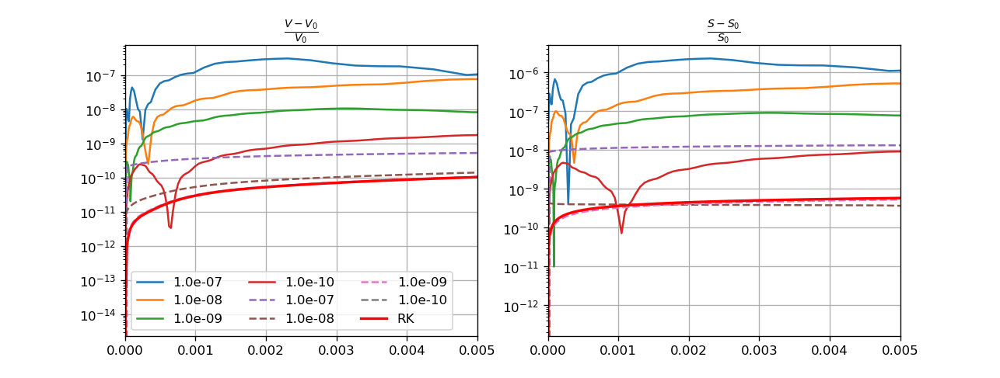

(0.0, 0.005)

In [333]:
%matplotlib notebook


fig,axs = plt.subplots(1,2,figsize=(8,4))
axs[0].grid()
axs[1].grid()
### BDF ###
for atol in atol_list_bdf:
    sol = np.load(
        f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy', allow_pickle=True).item()
    sol_t = sol['t']
    sol_y = sol['y']    
    
    Vol_ar=[]
    Sqr_ar=[]
    for j in range(len(sol_t)):
        P_fur_j = np.zeros(N)
        P_fur_j[1::]=sol_y[:N-1,j]
        Z_fur_j=sol_y[N-1:,j]
        
        Vol,Sqr,_ = get_VolSqr(P_fur_j, Z_fur_j)
        Vol_ar.append(Vol)
        Sqr_ar.append(Sqr)
    Vol_ar=np.array(Vol_ar)
    Sqr_ar=np.array(Sqr_ar)   
    axs[0].plot(sol_t, np.abs(Vol_ar/Vol0-1),'-', label=fr'{atol:.1e}')
    axs[1].plot(sol_t, np.abs(Sqr_ar/Sqr0-1),'-')


### Radau ###
for atol in atol_list_radau:
    sol = np.load(
        f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', allow_pickle=True).item()
    sol_t = sol['t']
    sol_y = sol['y']   
    
    Vol_ar=[]
    Sqr_ar=[]
    for j in range(len(sol_t)):
        P_fur_j = np.zeros(N)
        P_fur_j[1::]=sol_y[:N-1,j]
        Z_fur_j=sol_y[N-1:,j]
        
        Vol,Sqr,_ = get_VolSqr(P_fur_j, Z_fur_j)
        Vol_ar.append(Vol)
        Sqr_ar.append(Sqr)
    Vol_ar=np.array(Vol_ar)
    Sqr_ar=np.array(Sqr_ar)   
    axs[0].plot(sol_t, np.abs(Vol_ar/Vol0-1),'--', label=fr'{atol:.1e}')
    axs[1].plot(sol_t, np.abs(Sqr_ar/Sqr0-1),'--')


### RK ###    
sol = np.load(
    f'dyn_rk_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rk_max_step={max_step:.2e}.npy'
            , allow_pickle=True).item()
sol_t = sol['t']
sol_y = sol['y']

Vol_ar=[]
Sqr_ar=[]
for j in range(len(sol_t)):
    P_fur_j = np.zeros(N)
    P_fur_j[1::]=sol_y[:N-1,j]
    Z_fur_j=sol_y[N-1:,j]
    
    Vol,Sqr,_ = get_VolSqr(P_fur_j, Z_fur_j)
    Vol_ar.append(Vol)
    Sqr_ar.append(Sqr)
Vol_ar=np.array(Vol_ar)
Sqr_ar=np.array(Sqr_ar)   
axs[0].plot(sol_t, np.abs(Vol_ar/Vol0-1),'-',color='red',lw=2, label=fr'RK')
axs[1].plot(sol_t, np.abs(Sqr_ar/Sqr0-1),'-',color='red',lw=2)

axs[0].legend(ncol=3)
#plt.xlabel(r'$t$')
#plt.yscale('log')
axs[0].set_title(r'$\frac{V-V_0}{V_0}$')
axs[1].set_title(r'$\frac{S-S_0}{S_0}$')
axs[0].set_yscale('log')
axs[1].set_yscale('log')
#axs[0].set_ylim(1e-7,1e-4)
#axs[1].set_ylim(1e-7,1e-4)
axs[0].set_xlim(0, t_max)
axs[1].set_xlim(0, t_max)
